### Instalar dependencias

In [ ]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 68.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44284 sha256=9048219a092f788c8b2e7cb3805387e753c7705fd087f62f55f1a4d9a8f69f00
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


In [ ]:
!pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 33.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you ha

### Configuración del entorno

In [ ]:
from fastai.vision.all import *
from pathlib import Path
import pandas as pd
from fastai.vision.all import *
from pathlib import Path
import pandas as pd
import numpy as np
from PIL import Image
from random import shuffle, choices
from sklearn.metrics import accuracy_score, recall_score, f1_score, confusion_matrix
import os
import re
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision import transforms
import torch
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
path = Path('/content/drive/MyDrive/VIU/TFM/data/pneumothorax/png_images')

In [ ]:
def label_func(fname):
    fname = str(fname)
    match = re.search(r'_(\d)_\.png$', fname)
    return int(match.group(1)) if match else 0

In [ ]:
from fastai.vision.all import *
import torch

In [ ]:
from sklearn.metrics import f1_score, recall_score

In [ ]:
learn = load_learner('/content/drive/MyDrive/VIU/TFM/modelos/sin_bordes/modelo_sin_esquinas_9epochs.pkl')

/usr/local/lib/python3.12/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


#### Obtener predicción

In [ ]:
img_name = "7_test_1_.png"
img_name = "47_test_1_.png"

In [ ]:
# img_name = "80_test_1_.png" # tubos
img_name = "101_test_1_.png" # pulmon a la mitad
# img_name = "986_test_1_.png"

In [ ]:
img_route = path / img_name
pred_class, _, probs = learn.predict(img_route)
pred = int(pred_class)
print("pred", pred)

dl = learn.dls.test_dl([img_route])   # crea un dataloader de prueba
input_tensor = dl.one_batch()[0].to(device)

target_class = ClassifierOutputTarget(pred)
classes = [target_class]

pred 0


#### Obtener el modelo y últimas capas convolucionales

In [ ]:
learn.model.to(device)
model = learn.model
model.eval()
# last_conv_layer = model[0][0].denseblock4.denselayer16.conv2
# last_conv_layer = model[0][0]
last_conv_layer = model[0][0].denseblock4 # Este bloque contiene todas las capas finales convolucionales
model = learn.model
layers = [last_conv_layer]

#### Mostramos la imagen y la máscara de test

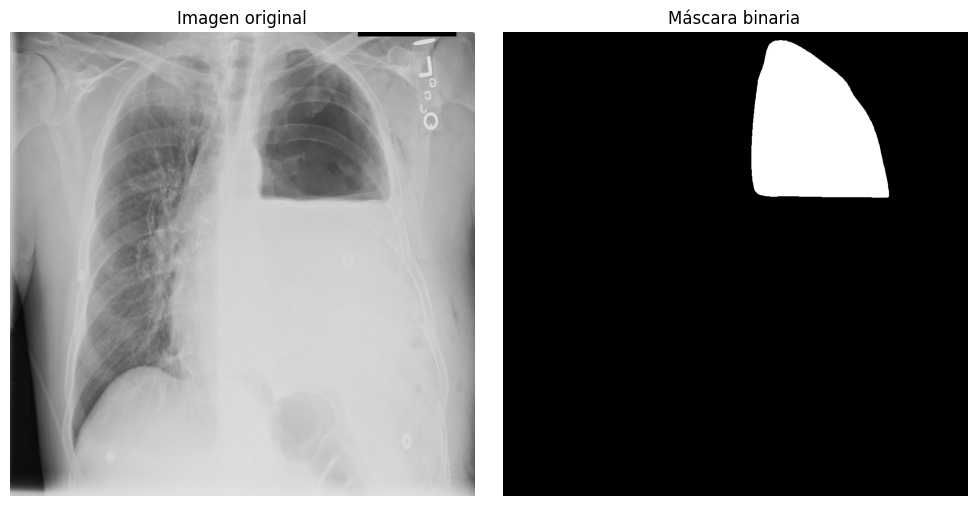

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Ruta a la imagen original y la máscara
original_img = Image.open(img_route).convert("RGB")
mask_path = path.parent / 'png_masks' / img_name
mask_img = Image.open(mask_path).convert("L")

# Crear subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Imagen original
axes[0].imshow(original_img)
axes[0].set_title("Imagen original")
axes[0].axis('off')

# Máscara binaria
axes[1].imshow(mask_img, cmap='gray')
axes[1].set_title("Máscara binaria")
axes[1].axis('off')

plt.tight_layout()
plt.show()

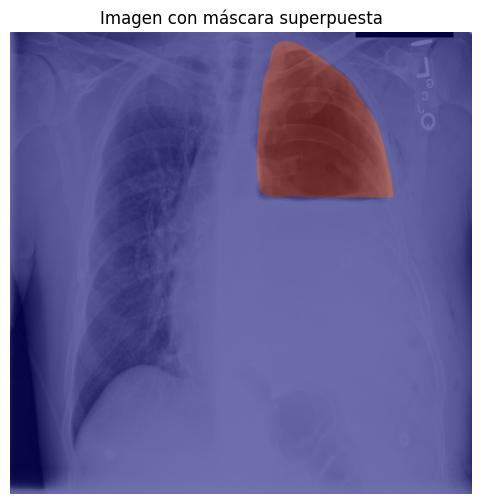

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Cargar imagen RGB y máscara en escala de grises
original_img = Image.open(img_route).convert("RGB")
mask_path = path.parent / 'png_masks' / img_name
mask_img = Image.open(mask_path).convert("L")  # blanco y negro

# Convertir a arrays para asegurar alineación
original_np = np.array(original_img)
mask_np = np.array(mask_img)

# Crear superposición
fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(original_np)
ax.imshow(mask_np, cmap='jet', alpha=0.5)  # superposición con color y transparencia
ax.set_title("Imagen con máscara superpuesta")
ax.axis('off')
plt.show()

#### Comparación de CAM con Ground Truth

In [ ]:
def visualize_cam_comparison(img_name, cam_method, threshold):
    # Cargar imagen
    img_route = path / img_name
    image = Image.open(img_route).convert("RGB")
    mask_path = path.parent / 'png_masks' / img_name
    mask_img = Image.open(mask_path).convert("L")

    # Preprocesar
    dl = learn.dls.test_dl([img_route])   # crea un dataloader de prueba
    input_tensor = dl.one_batch()[0].to(device)
    # input_tensor = transform(original_img).unsqueeze(0).to(next(model.parameters()).device)

    # --- GradCAM ---
    cam = cam_method(model=model, target_layers=layers)
    gradcam_map = cam(input_tensor=input_tensor, targets=classes).squeeze()
    gradcam_map = (gradcam_map >= threshold).astype(float) * gradcam_map

    # Mostrar
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    axs[0].imshow(image)
    axs[0].imshow(mask_img, cmap='jet', alpha=0.5)
    axs[0].set_title("Imagen original")
    axs[0].axis('off')

    axs[1].imshow(image.resize((512, 512), Image.BILINEAR))
    axs[1].imshow(gradcam_map, cmap='jet', alpha=0.5)
    axs[1].set_title(f"Threshold {threshold}")
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
def visualize_all_cam_comparison(img_name):
    # Cargar imagen
    img_route = path / img_name
    image = Image.open(img_route).convert("RGB")
    mask_path = path.parent / 'png_masks' / img_name
    mask_img = Image.open(mask_path).convert("L")

    # Preprocesar
    dl = learn.dls.test_dl([img_route])   # crea un dataloader de prueba
    input_tensor = dl.one_batch()[0].to(device)
    # input_tensor = transform(original_img).unsqueeze(0).to(next(model.parameters()).device)

    # --- GradCAM ---
    gradcam = GradCAM(model=model, target_layers=layers)
    gradcam_map = gradcam(input_tensor=input_tensor, targets=classes).squeeze()
    gradcam_map = (gradcam_map >= 0.5).astype(float) * gradcam_map

    gradcampp = GradCAMPlusPlus(model=model, target_layers=layers)
    gradcampp_map = gradcampp(input_tensor=input_tensor, targets=classes).squeeze()
    gradcampp_map = (gradcampp_map >= 0.4).astype(float) * gradcampp_map

    eigencam = EigenCAM(model=model, target_layers=layers)
    eigencam_map = eigencam(input_tensor=input_tensor, targets=classes).squeeze()
    eigencam_map = (eigencam_map >= 0.5).astype(float) * eigencam_map

    xgradcam = XGradCAM(model=model, target_layers=layers)
    xgradcam_map = xgradcam(input_tensor=input_tensor, targets=classes).squeeze()
    xgradcam_map = (xgradcam_map >= 0.3).astype(float) * xgradcam_map

    # Mostrar
    fig, axs = plt.subplots(2, 3, figsize=(9, 7))

    axs[0][0].imshow(image)
    axs[0][0].imshow(mask_img, cmap='jet', alpha=0.3)
    axs[0][0].set_title("Imagen original")
    axs[0][0].axis('off')

    axs[0][1].imshow(image.resize((512, 512), Image.BILINEAR))
    axs[0][1].imshow(gradcam_map, cmap='jet', alpha=0.5)
    axs[0][1].set_title(f"GradCAM")
    axs[0][1].axis('off')

    axs[0][2].imshow(image.resize((512, 512), Image.BILINEAR))
    axs[0][2].imshow(gradcampp_map, cmap='jet', alpha=0.5)
    axs[0][2].set_title(f"GradCAM++")
    axs[0][2].axis('off')

    axs[1][0].imshow(image.resize((512, 512), Image.BILINEAR))
    axs[1][0].imshow(eigencam_map, cmap='jet', alpha=0.5)
    axs[1][0].set_title(f"EigenCAM")
    axs[1][0].axis('off')

    axs[1][1].imshow(image.resize((512, 512), Image.BILINEAR))
    axs[1][1].imshow(xgradcam_map, cmap='jet', alpha=0.5)
    axs[1][1].set_title(f"XGradCAM")
    axs[1][1].axis('off')

    axs[1][2].imshow(image.resize((512, 512), Image.BILINEAR))
    axs[1][2].imshow(eigencam_map, cmap='jet', alpha=0.5)
    axs[1][2].set_title(f"ScoreCAM")
    axs[1][2].axis('off')

    plt.tight_layout()
    plt.show()

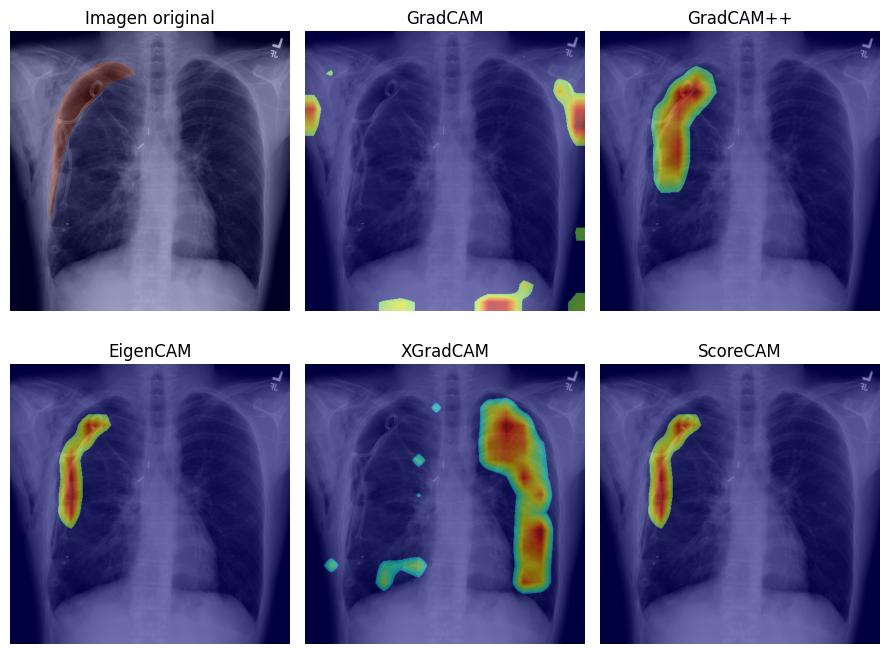

In [ ]:
visualize_all_cam_comparison("913_test_1_.png")

## Métricas

#### Definiciones

In [ ]:
from pathlib import Path
import numpy as np
from PIL import Image
from skimage.transform import resize
import matplotlib.pyplot as plt
import pandas as pd

# Rutas
img_dir = Path('/content/drive/MyDrive/VIU/TFM/data/pneumothorax/png_images')
mask_dir = Path('/content/drive/MyDrive/VIU/TFM/data/pneumothorax/png_masks')

# Obtener imágenes de test con etiqueta positiva
image_files = [f for f in img_dir.iterdir() if "_test_1_" in f.name]

# Métricas
def compute_iou(mask1, mask2):
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    return intersection / union if union != 0 else 0

def compute_dice(mask1, mask2):
    intersection = np.logical_and(mask1, mask2).sum()
    return 2 * intersection / (mask1.sum() + mask2.sum()) if (mask1.sum() + mask2.sum()) != 0 else 0

In [ ]:
def method_metrics(camClass, image_files, cam_returns_heatmap=False,
                   target_layers=layers, target_class=ClassifierOutputTarget(pred)):
  # Resultados por imagen
  results = []

  # Iterar sobre las imágenes filtradas
  for img_path in image_files:
      print(f"Procesando: {img_path.name}")

      # Cargar imagen y máscara
      original_img = Image.open(img_path).convert("RGB")
      mask_path = mask_dir / img_path.name
      mask_img = Image.open(mask_path).convert("L")

      # Predicción
      pred_class, _, _ = learn.predict(img_path)
      pred = int(pred_class)
      if pred != 1:
          continue

      dl = learn.dls.test_dl([img_path])
      input_tensor = dl.one_batch()[0]

      cam = camClass(model=model, target_layers=target_layers)

      # Generar heatmap
      heatmap = cam(input_tensor=input_tensor, targets=[target_class])
      if cam_returns_heatmap == False:
        heatmap = heatmap[0]
        heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())

      # Preparar ground truth
      gt_mask = (np.array(mask_img) > 0).astype(np.uint8)
      heatmap_resized = resize(heatmap, gt_mask.shape, preserve_range=True)

      # Thresholds
      thresholds = [0.3, 0.4, 0.45, 0.5, 0.55, 0.6, 0.7, 0.8, 0.9]

      metrics = {"image": img_path.name}

      for t in thresholds:
          binary_heatmap = (heatmap_resized >= t).astype(np.uint8)
          iou = compute_iou(binary_heatmap, gt_mask)
          dice = compute_dice(binary_heatmap, gt_mask)

          metrics[f"iou_t{t}"] = iou
          metrics[f"dice_t{t}"] = dice

      results.append(metrics)
      del heatmap, heatmap_resized, binary_heatmap, gt_mask

      # 💡 Liberar memoria
      try:
          del cam, heatmap, heatmap_resized, binary_heatmap, gt_mask, input_tensor
      except NameError:
          pass

  return results

### Obtener métricas de GRAD-CAM

In [ ]:
results = method_metrics(GradCAM, image_files)

# Guardar resultados en DataFrame
df = pd.DataFrame(results)
df.to_csv("metricas_GRAD-CAM.csv", index=False)

print("✅ Proceso completado. Métricas guardadas.")

Procesando: 914_test_1_.png


Procesando: 924_test_1_.png


Procesando: 920_test_1_.png


Procesando: 928_test_1_.png


Procesando: 949_test_1_.png


Procesando: 939_test_1_.png


Procesando: 941_test_1_.png


Procesando: 94_test_1_.png


Procesando: 942_test_1_.png


Procesando: 943_test_1_.png


Procesando: 938_test_1_.png


Procesando: 958_test_1_.png


Procesando: 957_test_1_.png


Procesando: 977_test_1_.png


Procesando: 972_test_1_.png


Procesando: 988_test_1_.png


Procesando: 985_test_1_.png


Procesando: 990_test_1_.png


Procesando: 98_test_1_.png


Procesando: 982_test_1_.png


Procesando: 986_test_1_.png


Procesando: 99_test_1_.png


Procesando: 846_test_1_.png


Procesando: 852_test_1_.png


Procesando: 861_test_1_.png


Procesando: 858_test_1_.png


Procesando: 866_test_1_.png


Procesando: 878_test_1_.png


Procesando: 877_test_1_.png


Procesando: 86_test_1_.png


Procesando: 889_test_1_.png


Procesando: 894_test_1_.png


Procesando: 883_test_1_.png


Procesando: 893_test_1_.png


Procesando: 891_test_1_.png


Procesando: 886_test_1_.png


Procesando: 908_test_1_.png


Procesando: 89_test_1_.png


Procesando: 896_test_1_.png


Procesando: 911_test_1_.png


Procesando: 90_test_1_.png


Procesando: 913_test_1_.png


Procesando: 756_test_1_.png


Procesando: 758_test_1_.png


Procesando: 759_test_1_.png


Procesando: 763_test_1_.png


Procesando: 76_test_1_.png


Procesando: 776_test_1_.png


Procesando: 77_test_1_.png


Procesando: 784_test_1_.png


Procesando: 783_test_1_.png


Procesando: 791_test_1_.png


Procesando: 780_test_1_.png


Procesando: 785_test_1_.png


Procesando: 7_test_1_.png


Procesando: 814_test_1_.png


Procesando: 813_test_1_.png


Procesando: 80_test_1_.png


Procesando: 821_test_1_.png


Procesando: 831_test_1_.png


Procesando: 834_test_1_.png


Procesando: 826_test_1_.png


Procesando: 823_test_1_.png


Procesando: 671_test_1_.png


Procesando: 670_test_1_.png


Procesando: 705_test_1_.png


Procesando: 707_test_1_.png


Procesando: 703_test_1_.png


Procesando: 6_test_1_.png


Procesando: 694_test_1_.png


Procesando: 693_test_1_.png


Procesando: 717_test_1_.png


Procesando: 713_test_1_.png


Procesando: 718_test_1_.png


Procesando: 710_test_1_.png


Procesando: 726_test_1_.png


Procesando: 732_test_1_.png


Procesando: 722_test_1_.png


Procesando: 737_test_1_.png


Procesando: 740_test_1_.png


Procesando: 745_test_1_.png


Procesando: 74_test_1_.png


Procesando: 595_test_1_.png


Procesando: 588_test_1_.png


Procesando: 634_test_1_.png


Procesando: 630_test_1_.png


Procesando: 623_test_1_.png


Procesando: 605_test_1_.png


Procesando: 631_test_1_.png


Procesando: 64_test_1_.png


Procesando: 654_test_1_.png


Procesando: 653_test_1_.png


Procesando: 663_test_1_.png


Procesando: 665_test_1_.png


Procesando: 645_test_1_.png


Procesando: 641_test_1_.png


Procesando: 656_test_1_.png


Procesando: 658_test_1_.png


Procesando: 661_test_1_.png


Procesando: 667_test_1_.png


Procesando: 640_test_1_.png


Procesando: 687_test_1_.png


Procesando: 531_test_1_.png


Procesando: 526_test_1_.png


Procesando: 512_test_1_.png


Procesando: 520_test_1_.png


Procesando: 518_test_1_.png


Procesando: 553_test_1_.png


Procesando: 543_test_1_.png


Procesando: 552_test_1_.png


Procesando: 550_test_1_.png


Procesando: 566_test_1_.png


Procesando: 572_test_1_.png


Procesando: 570_test_1_.png


Procesando: 557_test_1_.png


Procesando: 558_test_1_.png


Procesando: 585_test_1_.png


Procesando: 598_test_1_.png


Procesando: 418_test_1_.png


Procesando: 424_test_1_.png


Procesando: 441_test_1_.png


Procesando: 435_test_1_.png


Procesando: 445_test_1_.png


Procesando: 446_test_1_.png


Procesando: 448_test_1_.png


Procesando: 452_test_1_.png


Procesando: 449_test_1_.png


Procesando: 469_test_1_.png


Procesando: 47_test_1_.png


Procesando: 483_test_1_.png


Procesando: 491_test_1_.png


Procesando: 476_test_1_.png


Procesando: 485_test_1_.png


Procesando: 506_test_1_.png


Procesando: 498_test_1_.png


Procesando: 500_test_1_.png


Procesando: 492_test_1_.png


Procesando: 509_test_1_.png


Procesando: 495_test_1_.png


Procesando: 37_test_1_.png


Procesando: 372_test_1_.png


Procesando: 364_test_1_.png


Procesando: 378_test_1_.png


Procesando: 356_test_1_.png


Procesando: 366_test_1_.png


Procesando: 376_test_1_.png


Procesando: 385_test_1_.png


Procesando: 415_test_1_.png


Procesando: 406_test_1_.png


Procesando: 387_test_1_.png


Procesando: 392_test_1_.png


Procesando: 42_test_1_.png


Procesando: 437_test_1_.png


Procesando: 432_test_1_.png


Procesando: 426_test_1_.png


Procesando: 287_test_1_.png


Procesando: 290_test_1_.png


Procesando: 284_test_1_.png


Procesando: 288_test_1_.png


Procesando: 266_test_1_.png


Procesando: 264_test_1_.png


Procesando: 279_test_1_.png


Procesando: 291_test_1_.png


Procesando: 301_test_1_.png


Procesando: 316_test_1_.png


Procesando: 315_test_1_.png


Procesando: 336_test_1_.png


Procesando: 340_test_1_.png


Procesando: 325_test_1_.png


Procesando: 337_test_1_.png


Procesando: 324_test_1_.png


Procesando: 322_test_1_.png


Procesando: 341_test_1_.png


Procesando: 19_test_1_.png


Procesando: 181_test_1_.png


Procesando: 193_test_1_.png


Procesando: 217_test_1_.png


Procesando: 204_test_1_.png


Procesando: 218_test_1_.png


Procesando: 219_test_1_.png


Procesando: 205_test_1_.png


Procesando: 206_test_1_.png


Procesando: 223_test_1_.png


Procesando: 250_test_1_.png


Procesando: 25_test_1_.png


Procesando: 242_test_1_.png


Procesando: 263_test_1_.png


Procesando: 1083_test_1_.png


Procesando: 1195_test_1_.png


Procesando: 1307_test_1_.png


Procesando: 1264_test_1_.png


Procesando: 1291_test_1_.png


Procesando: 1254_test_1_.png


Procesando: 1225_test_1_.png


Procesando: 1299_test_1_.png


Procesando: 1278_test_1_.png


Procesando: 1290_test_1_.png


Procesando: 1221_test_1_.png


Procesando: 1244_test_1_.png


Procesando: 1250_test_1_.png


Procesando: 1247_test_1_.png


Procesando: 1202_test_1_.png


Procesando: 1294_test_1_.png


Procesando: 1293_test_1_.png


Procesando: 1194_test_1_.png


Procesando: 1298_test_1_.png


Procesando: 1212_test_1_.png


Procesando: 129_test_1_.png


Procesando: 1240_test_1_.png


Procesando: 1205_test_1_.png


Procesando: 1249_test_1_.png


Procesando: 1285_test_1_.png


Procesando: 1246_test_1_.png


Procesando: 1314_test_1_.png


Procesando: 1192_test_1_.png


Procesando: 1207_test_1_.png


Procesando: 1315_test_1_.png


Procesando: 1220_test_1_.png


Procesando: 1226_test_1_.png


Procesando: 1209_test_1_.png


Procesando: 1312_test_1_.png


Procesando: 1337_test_1_.png


Procesando: 146_test_1_.png


Procesando: 1317_test_1_.png


Procesando: 145_test_1_.png


Procesando: 1348_test_1_.png


Procesando: 1359_test_1_.png


Procesando: 1368_test_1_.png


Procesando: 1326_test_1_.png


Procesando: 152_test_1_.png


Procesando: 1319_test_1_.png


Procesando: 147_test_1_.png


Procesando: 1332_test_1_.png


Procesando: 1356_test_1_.png


Procesando: 1329_test_1_.png


Procesando: 1335_test_1_.png


Procesando: 1354_test_1_.png


Procesando: 1349_test_1_.png


Procesando: 1327_test_1_.png


Procesando: 1363_test_1_.png


Procesando: 1325_test_1_.png


Procesando: 17_test_1_.png


Procesando: 174_test_1_.png


Procesando: 160_test_1_.png


Procesando: 153_test_1_.png


Procesando: 156_test_1_.png


Procesando: 168_test_1_.png


Procesando: 184_test_1_.png


Procesando: 1014_test_1_.png


Procesando: 1029_test_1_.png


Procesando: 1033_test_1_.png


Procesando: 1027_test_1_.png


Procesando: 1031_test_1_.png


Procesando: 101_test_1_.png


Procesando: 1035_test_1_.png


Procesando: 1057_test_1_.png


Procesando: 1040_test_1_.png


Procesando: 1059_test_1_.png


Procesando: 1044_test_1_.png


Procesando: 1054_test_1_.png


Procesando: 1042_test_1_.png


Procesando: 1058_test_1_.png


Procesando: 1053_test_1_.png


Procesando: 1109_test_1_.png


Procesando: 1103_test_1_.png


Procesando: 115_test_1_.png


Procesando: 1084_test_1_.png


Procesando: 1120_test_1_.png


Procesando: 1092_test_1_.png


Procesando: 1102_test_1_.png


Procesando: 1178_test_1_.png


Procesando: 1151_test_1_.png


Procesando: 1132_test_1_.png


Procesando: 1062_test_1_.png


Procesando: 1141_test_1_.png


Procesando: 1071_test_1_.png


Procesando: 111_test_1_.png


Procesando: 1115_test_1_.png


Procesando: 1086_test_1_.png


Procesando: 1105_test_1_.png


Procesando: 1154_test_1_.png


Procesando: 1160_test_1_.png


Procesando: 1145_test_1_.png


Procesando: 1077_test_1_.png


Procesando: 1069_test_1_.png


Procesando: 1090_test_1_.png


Procesando: 1122_test_1_.png


Procesando: 1010_test_1_.png


Procesando: 0_test_1_.png


Procesando: 1007_test_1_.png


✅ Proceso completado. Métricas guardadas.


Analizamos la media y desviación estándar de IOU y DICE para el método de explicabilidad

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el CSV generado
df = pd.read_csv("metricas_GRAD-CAM.csv")

# Identificar los thresholds usados (extraer desde los nombres de columnas)
thresholds = [round(i, 1) for i in list(
    sorted({float(col.split('_t')[1]) for col in df.columns if 'iou_t' in col})
)]

# Calcular medias y stds para cada threshold
iou_means = []
iou_stds = []
dice_means = []
dice_stds = []

for t in thresholds:
    iou_col = f"iou_t{t}"
    dice_col = f"dice_t{t}"

    iou_means.append(df[iou_col].mean())
    iou_stds.append(df[iou_col].std())

    dice_means.append(df[dice_col].mean())
    dice_stds.append(df[dice_col].std())

In [ ]:
print(f"{'Threshold':<10} {'IoU Mean':<10} {'IoU Std':<10} {'Dice Mean':<12} {'Dice Std':<10}")
print("-" * 60)
for i, t in enumerate(thresholds):
    print(f"{t:<10.1f} {iou_means[i]:<10.4f} {iou_stds[i]:<10.4f} {dice_means[i]:<12.4f} {dice_stds[i]:<10.4f}")

Threshold  IoU Mean   IoU Std    Dice Mean    Dice Std  
------------------------------------------------------------
0.3        0.0100     0.0374     0.0175       0.0614    
0.4        0.0089     0.0366     0.0155       0.0607    
0.5        0.0072     0.0302     0.0127       0.0520    
0.5        0.0072     0.0302     0.0127       0.0520    
0.6        0.0052     0.0227     0.0095       0.0407    
0.6        0.0052     0.0227     0.0095       0.0407    
0.7        0.0032     0.0153     0.0059       0.0281    
0.8        0.0017     0.0101     0.0032       0.0187    
0.9        0.0007     0.0052     0.0013       0.0098    


También podemos ver los resultados de forma gráfica

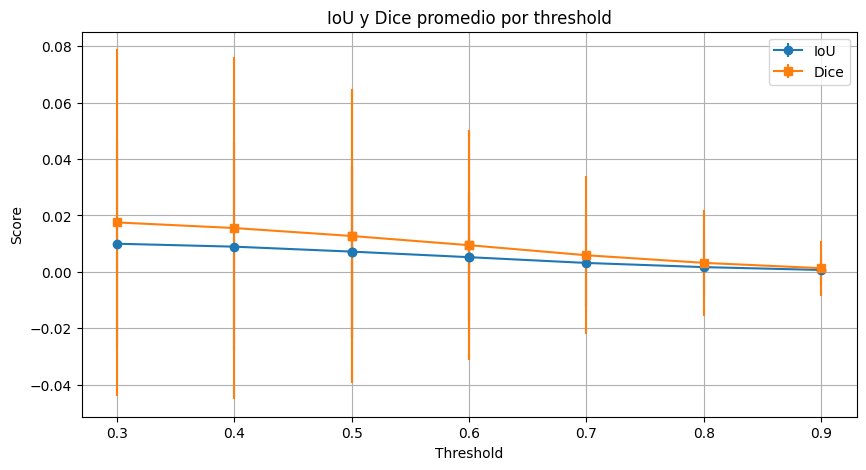

In [ ]:
plt.figure(figsize=(10, 5))

plt.errorbar(thresholds, iou_means, yerr=iou_stds, label="IoU", fmt='-o')
plt.errorbar(thresholds, dice_means, yerr=dice_stds, label="Dice", fmt='-s')

plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("IoU y Dice promedio por threshold")
plt.legend()
plt.grid(True)
plt.show()

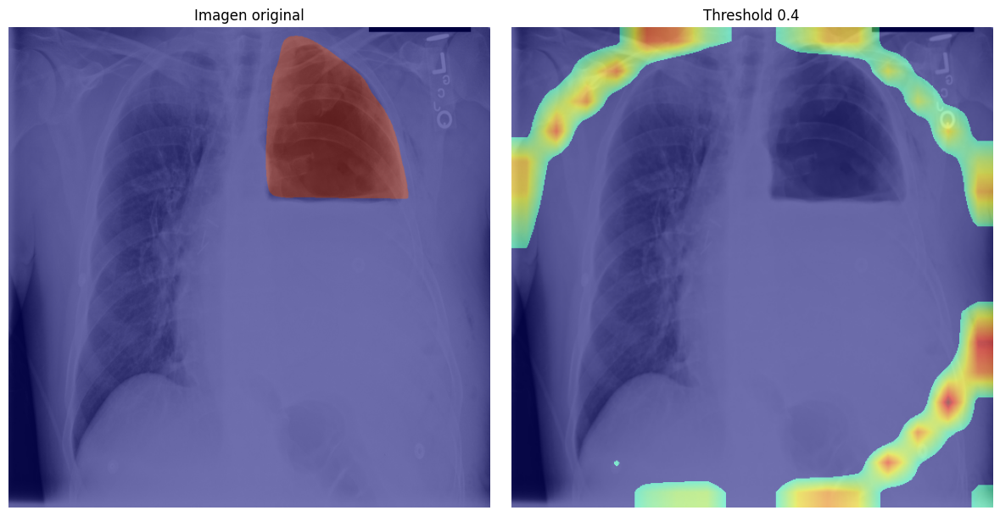

In [ ]:
visualize_cam_comparison("101_test_1_.png", GradCAM, 0.4)

### Obtener métricas de GRAD-CAM++

In [ ]:
results = method_metrics(GradCAMPlusPlus, image_files)

# Guardar resultados en DataFrame
df = pd.DataFrame(results)
df.to_csv("metricas_GRAD-CAM++.csv", index=False)

print("✅ Proceso completado. Métricas guardadas.")

Procesando: 914_test_1_.png


Procesando: 924_test_1_.png


Procesando: 920_test_1_.png


Procesando: 928_test_1_.png


Procesando: 949_test_1_.png


Procesando: 939_test_1_.png


Procesando: 941_test_1_.png


Procesando: 94_test_1_.png


Procesando: 942_test_1_.png


Procesando: 943_test_1_.png


Procesando: 938_test_1_.png


Procesando: 958_test_1_.png


Procesando: 957_test_1_.png


Procesando: 977_test_1_.png


Procesando: 972_test_1_.png


Procesando: 988_test_1_.png


Procesando: 985_test_1_.png


Procesando: 990_test_1_.png


Procesando: 98_test_1_.png


Procesando: 982_test_1_.png


Procesando: 986_test_1_.png


Procesando: 99_test_1_.png


Procesando: 846_test_1_.png


Procesando: 852_test_1_.png


Procesando: 861_test_1_.png


Procesando: 858_test_1_.png


Procesando: 866_test_1_.png


Procesando: 878_test_1_.png


Procesando: 877_test_1_.png


Procesando: 86_test_1_.png


Procesando: 889_test_1_.png


Procesando: 894_test_1_.png


Procesando: 883_test_1_.png


Procesando: 893_test_1_.png


Procesando: 891_test_1_.png


Procesando: 886_test_1_.png


Procesando: 908_test_1_.png


Procesando: 89_test_1_.png


Procesando: 896_test_1_.png


Procesando: 911_test_1_.png


Procesando: 90_test_1_.png


Procesando: 913_test_1_.png


Procesando: 756_test_1_.png


Procesando: 758_test_1_.png


Procesando: 759_test_1_.png


Procesando: 763_test_1_.png


Procesando: 76_test_1_.png


Procesando: 776_test_1_.png


Procesando: 77_test_1_.png


Procesando: 784_test_1_.png


Procesando: 783_test_1_.png


Procesando: 791_test_1_.png


Procesando: 780_test_1_.png


Procesando: 785_test_1_.png


Procesando: 7_test_1_.png


Procesando: 814_test_1_.png


Procesando: 813_test_1_.png


Procesando: 80_test_1_.png


Procesando: 821_test_1_.png


Procesando: 831_test_1_.png


Procesando: 834_test_1_.png


Procesando: 826_test_1_.png


Procesando: 823_test_1_.png


Procesando: 671_test_1_.png


Procesando: 670_test_1_.png


Procesando: 705_test_1_.png


Procesando: 707_test_1_.png


Procesando: 703_test_1_.png


Procesando: 6_test_1_.png


Procesando: 694_test_1_.png


Procesando: 693_test_1_.png


Procesando: 717_test_1_.png


Procesando: 713_test_1_.png


Procesando: 718_test_1_.png


Procesando: 710_test_1_.png


Procesando: 726_test_1_.png


Procesando: 732_test_1_.png


Procesando: 722_test_1_.png


Procesando: 737_test_1_.png


Procesando: 740_test_1_.png


Procesando: 745_test_1_.png


Procesando: 74_test_1_.png


Procesando: 595_test_1_.png


Procesando: 588_test_1_.png


Procesando: 634_test_1_.png


Procesando: 630_test_1_.png


Procesando: 623_test_1_.png


Procesando: 605_test_1_.png


Procesando: 631_test_1_.png


Procesando: 64_test_1_.png


Procesando: 654_test_1_.png


Procesando: 653_test_1_.png


Procesando: 663_test_1_.png


Procesando: 665_test_1_.png


Procesando: 645_test_1_.png


Procesando: 641_test_1_.png


Procesando: 656_test_1_.png


Procesando: 658_test_1_.png


Procesando: 661_test_1_.png


Procesando: 667_test_1_.png


Procesando: 640_test_1_.png


Procesando: 687_test_1_.png


Procesando: 531_test_1_.png


Procesando: 526_test_1_.png


Procesando: 512_test_1_.png


Procesando: 520_test_1_.png


Procesando: 518_test_1_.png


Procesando: 553_test_1_.png


Procesando: 543_test_1_.png


Procesando: 552_test_1_.png


Procesando: 550_test_1_.png


Procesando: 566_test_1_.png


Procesando: 572_test_1_.png


Procesando: 570_test_1_.png


Procesando: 557_test_1_.png


Procesando: 558_test_1_.png


Procesando: 585_test_1_.png


Procesando: 598_test_1_.png


Procesando: 418_test_1_.png


Procesando: 424_test_1_.png


Procesando: 441_test_1_.png


Procesando: 435_test_1_.png


Procesando: 445_test_1_.png


Procesando: 446_test_1_.png


Procesando: 448_test_1_.png


Procesando: 452_test_1_.png


Procesando: 449_test_1_.png


Procesando: 469_test_1_.png


Procesando: 47_test_1_.png


Procesando: 483_test_1_.png


Procesando: 491_test_1_.png


Procesando: 476_test_1_.png


Procesando: 485_test_1_.png


Procesando: 506_test_1_.png


Procesando: 498_test_1_.png


Procesando: 500_test_1_.png


Procesando: 492_test_1_.png


Procesando: 509_test_1_.png


Procesando: 495_test_1_.png


Procesando: 37_test_1_.png


Procesando: 372_test_1_.png


Procesando: 364_test_1_.png


Procesando: 378_test_1_.png


Procesando: 356_test_1_.png


Procesando: 366_test_1_.png


Procesando: 376_test_1_.png


Procesando: 385_test_1_.png


Procesando: 415_test_1_.png


Procesando: 406_test_1_.png


Procesando: 387_test_1_.png


Procesando: 392_test_1_.png


Procesando: 42_test_1_.png


Procesando: 437_test_1_.png


Procesando: 432_test_1_.png


Procesando: 426_test_1_.png


Procesando: 287_test_1_.png


Procesando: 290_test_1_.png


Procesando: 284_test_1_.png


Procesando: 288_test_1_.png


Procesando: 266_test_1_.png


Procesando: 264_test_1_.png


Procesando: 279_test_1_.png


Procesando: 291_test_1_.png


Procesando: 301_test_1_.png


Procesando: 316_test_1_.png


Procesando: 315_test_1_.png


Procesando: 336_test_1_.png


Procesando: 340_test_1_.png


Procesando: 325_test_1_.png


Procesando: 337_test_1_.png


Procesando: 324_test_1_.png


Procesando: 322_test_1_.png


Procesando: 341_test_1_.png


Procesando: 19_test_1_.png


Procesando: 181_test_1_.png


Procesando: 193_test_1_.png


Procesando: 217_test_1_.png


Procesando: 204_test_1_.png


Procesando: 218_test_1_.png


Procesando: 219_test_1_.png


Procesando: 205_test_1_.png


Procesando: 206_test_1_.png


Procesando: 223_test_1_.png


Procesando: 250_test_1_.png


Procesando: 25_test_1_.png


/tmp/ipython-input-2188057230.py:30: RuntimeWarning: invalid value encountered in divide
  heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())
/usr/local/lib/python3.12/dist-packages/skimage/transform/_warps.py:738: RuntimeWarning: All-NaN slice encountered
  min_val = min_func(input_image)
/usr/local/lib/python3.12/dist-packages/skimage/transform/_warps.py:742: RuntimeWarning: All-NaN slice encountered
  max_val = max_func(input_image)


Procesando: 242_test_1_.png


Procesando: 263_test_1_.png


Procesando: 1083_test_1_.png


Procesando: 1195_test_1_.png


Procesando: 1307_test_1_.png


Procesando: 1264_test_1_.png


Procesando: 1291_test_1_.png


Procesando: 1254_test_1_.png


Procesando: 1225_test_1_.png


Procesando: 1299_test_1_.png


Procesando: 1278_test_1_.png


Procesando: 1290_test_1_.png


Procesando: 1221_test_1_.png


Procesando: 1244_test_1_.png


Procesando: 1250_test_1_.png


Procesando: 1247_test_1_.png


Procesando: 1202_test_1_.png


Procesando: 1294_test_1_.png


Procesando: 1293_test_1_.png


Procesando: 1194_test_1_.png


Procesando: 1298_test_1_.png


Procesando: 1212_test_1_.png


Procesando: 129_test_1_.png


Procesando: 1240_test_1_.png


Procesando: 1205_test_1_.png


Procesando: 1249_test_1_.png


Procesando: 1285_test_1_.png


Procesando: 1246_test_1_.png


Procesando: 1314_test_1_.png


Procesando: 1192_test_1_.png


Procesando: 1207_test_1_.png


Procesando: 1315_test_1_.png


Procesando: 1220_test_1_.png


Procesando: 1226_test_1_.png


Procesando: 1209_test_1_.png


Procesando: 1312_test_1_.png


Procesando: 1337_test_1_.png


Procesando: 146_test_1_.png


Procesando: 1317_test_1_.png


Procesando: 145_test_1_.png


Procesando: 1348_test_1_.png


Procesando: 1359_test_1_.png


Procesando: 1368_test_1_.png


Procesando: 1326_test_1_.png


Procesando: 152_test_1_.png


Procesando: 1319_test_1_.png


Procesando: 147_test_1_.png


Procesando: 1332_test_1_.png


Procesando: 1356_test_1_.png


Procesando: 1329_test_1_.png


Procesando: 1335_test_1_.png


Procesando: 1354_test_1_.png


Procesando: 1349_test_1_.png


Procesando: 1327_test_1_.png


Procesando: 1363_test_1_.png


Procesando: 1325_test_1_.png


Procesando: 17_test_1_.png


Procesando: 174_test_1_.png


Procesando: 160_test_1_.png


Procesando: 153_test_1_.png


Procesando: 156_test_1_.png


Procesando: 168_test_1_.png


Procesando: 184_test_1_.png


Procesando: 1014_test_1_.png


Procesando: 1029_test_1_.png


Procesando: 1033_test_1_.png


Procesando: 1027_test_1_.png


Procesando: 1031_test_1_.png


Procesando: 101_test_1_.png


Procesando: 1035_test_1_.png


Procesando: 1057_test_1_.png


Procesando: 1040_test_1_.png


Procesando: 1059_test_1_.png


Procesando: 1044_test_1_.png


Procesando: 1054_test_1_.png


Procesando: 1042_test_1_.png


Procesando: 1058_test_1_.png


Procesando: 1053_test_1_.png


Procesando: 1109_test_1_.png


Procesando: 1103_test_1_.png


Procesando: 115_test_1_.png


Procesando: 1084_test_1_.png


Procesando: 1120_test_1_.png


Procesando: 1092_test_1_.png


Procesando: 1102_test_1_.png


Procesando: 1178_test_1_.png


Procesando: 1151_test_1_.png


Procesando: 1132_test_1_.png


Procesando: 1062_test_1_.png


Procesando: 1141_test_1_.png


Procesando: 1071_test_1_.png


Procesando: 111_test_1_.png


Procesando: 1115_test_1_.png


Procesando: 1086_test_1_.png


Procesando: 1105_test_1_.png


Procesando: 1154_test_1_.png


Procesando: 1160_test_1_.png


Procesando: 1145_test_1_.png


Procesando: 1077_test_1_.png


Procesando: 1069_test_1_.png


Procesando: 1090_test_1_.png


Procesando: 1122_test_1_.png


Procesando: 1010_test_1_.png


Procesando: 0_test_1_.png


Procesando: 1007_test_1_.png


✅ Proceso completado. Métricas guardadas.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el CSV generado
df = pd.read_csv("metricas_GRAD-CAM++.csv")

# Identificar los thresholds usados (extraer desde los nombres de columnas)
thresholds = [round(i, 1) for i in list(
    sorted({float(col.split('_t')[1]) for col in df.columns if 'iou_t' in col})
)]

# Calcular medias y stds para cada threshold
iou_means = []
iou_stds = []
dice_means = []
dice_stds = []

for t in thresholds:
    iou_col = f"iou_t{t}"
    dice_col = f"dice_t{t}"

    iou_means.append(df[iou_col].mean())
    iou_stds.append(df[iou_col].std())

    dice_means.append(df[dice_col].mean())
    dice_stds.append(df[dice_col].std())

In [ ]:
print(f"{'Threshold':<10} {'IoU Mean':<10} {'IoU Std':<10} {'Dice Mean':<12} {'Dice Std':<10}")
print("-" * 60)
for i, t in enumerate(thresholds):
    print(f"{t:<10.1f} {iou_means[i]:<10.4f} {iou_stds[i]:<10.4f} {dice_means[i]:<12.4f} {dice_stds[i]:<10.4f}")

Threshold  IoU Mean   IoU Std    Dice Mean    Dice Std  
------------------------------------------------------------
0.3        0.0359     0.0628     0.0631       0.1026    
0.4        0.0359     0.0669     0.0623       0.1086    
0.5        0.0334     0.0649     0.0580       0.1065    
0.5        0.0334     0.0649     0.0580       0.1065    
0.6        0.0282     0.0603     0.0490       0.0998    
0.6        0.0282     0.0603     0.0490       0.0998    
0.7        0.0200     0.0499     0.0352       0.0831    
0.8        0.0107     0.0361     0.0190       0.0609    
0.9        0.0034     0.0137     0.0065       0.0255    


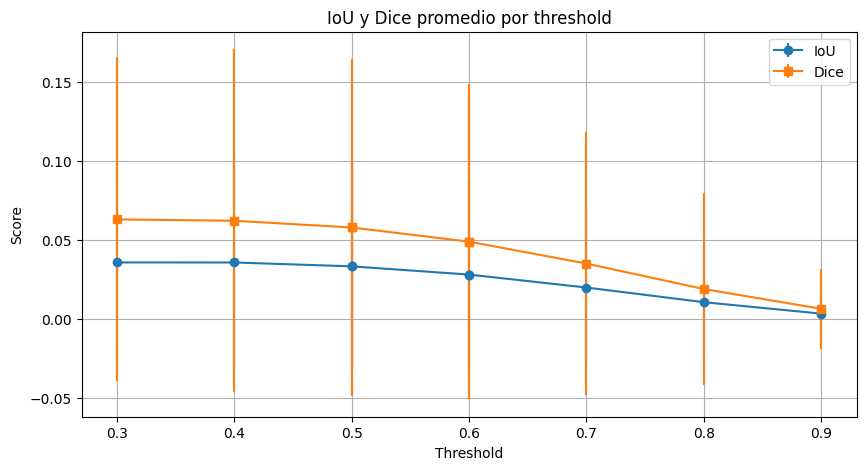

In [ ]:
plt.figure(figsize=(10, 5))

plt.errorbar(thresholds, iou_means, yerr=iou_stds, label="IoU", fmt='-o')
plt.errorbar(thresholds, dice_means, yerr=dice_stds, label="Dice", fmt='-s')

plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("IoU y Dice promedio por threshold")
plt.legend()
plt.grid(True)
plt.show()

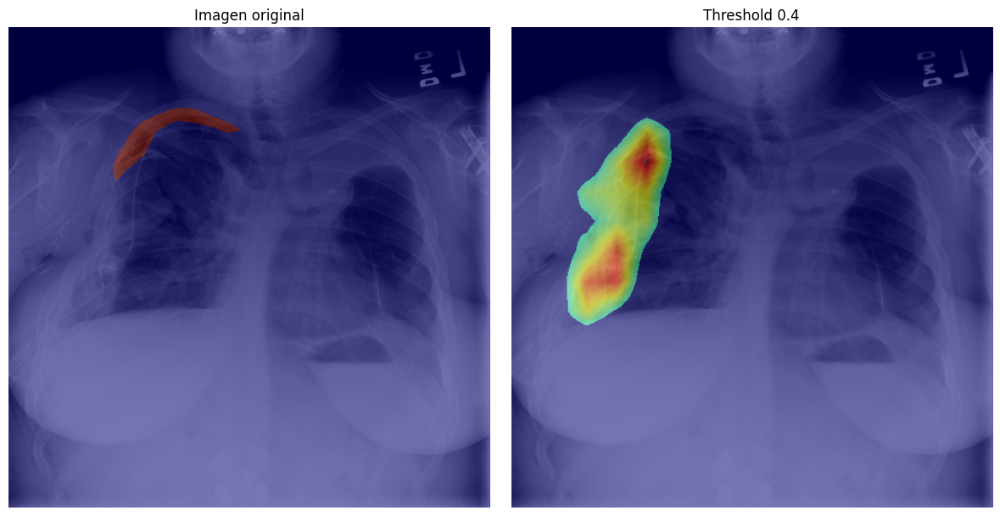

In [ ]:
visualize_cam_comparison("831_test_1_.png", GradCAMPlusPlus, 0.4)

### Obtener métricas de XGradCAM

In [ ]:
results = method_metrics(XGradCAM, image_files)

# Guardar resultados en DataFrame
df = pd.DataFrame(results)
df.to_csv("metricas_XGradCAM.csv", index=False)

print("✅ Proceso completado. Métricas guardadas.")

Procesando: 914_test_1_.png


Procesando: 924_test_1_.png


Procesando: 920_test_1_.png


Procesando: 928_test_1_.png


Procesando: 949_test_1_.png


Procesando: 939_test_1_.png


Procesando: 941_test_1_.png


Procesando: 94_test_1_.png


Procesando: 942_test_1_.png


Procesando: 943_test_1_.png


Procesando: 938_test_1_.png


Procesando: 958_test_1_.png


Procesando: 957_test_1_.png


Procesando: 977_test_1_.png


Procesando: 972_test_1_.png


Procesando: 988_test_1_.png


Procesando: 985_test_1_.png


Procesando: 990_test_1_.png


Procesando: 98_test_1_.png


Procesando: 982_test_1_.png


Procesando: 986_test_1_.png


Procesando: 99_test_1_.png


Procesando: 846_test_1_.png


Procesando: 852_test_1_.png


Procesando: 861_test_1_.png


Procesando: 858_test_1_.png


Procesando: 866_test_1_.png


Procesando: 878_test_1_.png


Procesando: 877_test_1_.png


Procesando: 86_test_1_.png


Procesando: 889_test_1_.png


Procesando: 894_test_1_.png


Procesando: 883_test_1_.png


Procesando: 893_test_1_.png


Procesando: 891_test_1_.png


Procesando: 886_test_1_.png


Procesando: 908_test_1_.png


Procesando: 89_test_1_.png


Procesando: 896_test_1_.png


Procesando: 911_test_1_.png


Procesando: 90_test_1_.png


Procesando: 913_test_1_.png


Procesando: 756_test_1_.png


Procesando: 758_test_1_.png


Procesando: 759_test_1_.png


Procesando: 763_test_1_.png


Procesando: 76_test_1_.png


Procesando: 776_test_1_.png


Procesando: 77_test_1_.png


Procesando: 784_test_1_.png


Procesando: 783_test_1_.png


Procesando: 791_test_1_.png


Procesando: 780_test_1_.png


Procesando: 785_test_1_.png


Procesando: 7_test_1_.png


Procesando: 814_test_1_.png


Procesando: 813_test_1_.png


Procesando: 80_test_1_.png


Procesando: 821_test_1_.png


Procesando: 831_test_1_.png


Procesando: 834_test_1_.png


Procesando: 826_test_1_.png


Procesando: 823_test_1_.png


Procesando: 671_test_1_.png


Procesando: 670_test_1_.png


Procesando: 705_test_1_.png


Procesando: 707_test_1_.png


Procesando: 703_test_1_.png


Procesando: 6_test_1_.png


Procesando: 694_test_1_.png


Procesando: 693_test_1_.png


Procesando: 717_test_1_.png


Procesando: 713_test_1_.png


Procesando: 718_test_1_.png


Procesando: 710_test_1_.png


Procesando: 726_test_1_.png


Procesando: 732_test_1_.png


Procesando: 722_test_1_.png


Procesando: 737_test_1_.png


Procesando: 740_test_1_.png


Procesando: 745_test_1_.png


Procesando: 74_test_1_.png


Procesando: 595_test_1_.png


Procesando: 588_test_1_.png


Procesando: 634_test_1_.png


Procesando: 630_test_1_.png


Procesando: 623_test_1_.png


Procesando: 605_test_1_.png


Procesando: 631_test_1_.png


Procesando: 64_test_1_.png


Procesando: 654_test_1_.png


Procesando: 653_test_1_.png


/tmp/ipython-input-2188057230.py:30: RuntimeWarning: invalid value encountered in divide
  heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())
/usr/local/lib/python3.12/dist-packages/skimage/transform/_warps.py:738: RuntimeWarning: All-NaN slice encountered
  min_val = min_func(input_image)
/usr/local/lib/python3.12/dist-packages/skimage/transform/_warps.py:742: RuntimeWarning: All-NaN slice encountered
  max_val = max_func(input_image)


Procesando: 663_test_1_.png


Procesando: 665_test_1_.png


Procesando: 645_test_1_.png


Procesando: 641_test_1_.png


Procesando: 656_test_1_.png


Procesando: 658_test_1_.png


Procesando: 661_test_1_.png


Procesando: 667_test_1_.png


Procesando: 640_test_1_.png


Procesando: 687_test_1_.png


Procesando: 531_test_1_.png


Procesando: 526_test_1_.png


Procesando: 512_test_1_.png


Procesando: 520_test_1_.png


Procesando: 518_test_1_.png


Procesando: 553_test_1_.png


Procesando: 543_test_1_.png


Procesando: 552_test_1_.png


Procesando: 550_test_1_.png


Procesando: 566_test_1_.png


Procesando: 572_test_1_.png


Procesando: 570_test_1_.png


Procesando: 557_test_1_.png


Procesando: 558_test_1_.png


Procesando: 585_test_1_.png


Procesando: 598_test_1_.png


Procesando: 418_test_1_.png


Procesando: 424_test_1_.png


Procesando: 441_test_1_.png


Procesando: 435_test_1_.png


Procesando: 445_test_1_.png


Procesando: 446_test_1_.png


Procesando: 448_test_1_.png


Procesando: 452_test_1_.png


Procesando: 449_test_1_.png


Procesando: 469_test_1_.png


Procesando: 47_test_1_.png


Procesando: 483_test_1_.png


Procesando: 491_test_1_.png


Procesando: 476_test_1_.png


Procesando: 485_test_1_.png


Procesando: 506_test_1_.png


Procesando: 498_test_1_.png


Procesando: 500_test_1_.png


Procesando: 492_test_1_.png


Procesando: 509_test_1_.png


Procesando: 495_test_1_.png


Procesando: 37_test_1_.png


Procesando: 372_test_1_.png


Procesando: 364_test_1_.png


Procesando: 378_test_1_.png


Procesando: 356_test_1_.png


Procesando: 366_test_1_.png


Procesando: 376_test_1_.png


Procesando: 385_test_1_.png


Procesando: 415_test_1_.png


Procesando: 406_test_1_.png


Procesando: 387_test_1_.png


Procesando: 392_test_1_.png


Procesando: 42_test_1_.png


Procesando: 437_test_1_.png


Procesando: 432_test_1_.png


Procesando: 426_test_1_.png


Procesando: 287_test_1_.png


Procesando: 290_test_1_.png


Procesando: 284_test_1_.png


Procesando: 288_test_1_.png


Procesando: 266_test_1_.png


Procesando: 264_test_1_.png


Procesando: 279_test_1_.png


Procesando: 291_test_1_.png


Procesando: 301_test_1_.png


Procesando: 316_test_1_.png


Procesando: 315_test_1_.png


Procesando: 336_test_1_.png


Procesando: 340_test_1_.png


Procesando: 325_test_1_.png


Procesando: 337_test_1_.png


Procesando: 324_test_1_.png


Procesando: 322_test_1_.png


Procesando: 341_test_1_.png


Procesando: 19_test_1_.png


Procesando: 181_test_1_.png


Procesando: 193_test_1_.png


Procesando: 217_test_1_.png


Procesando: 204_test_1_.png


Procesando: 218_test_1_.png


Procesando: 219_test_1_.png


Procesando: 205_test_1_.png


Procesando: 206_test_1_.png


Procesando: 223_test_1_.png


Procesando: 250_test_1_.png


Procesando: 25_test_1_.png


Procesando: 242_test_1_.png


Procesando: 263_test_1_.png


Procesando: 1083_test_1_.png


Procesando: 1195_test_1_.png


Procesando: 1307_test_1_.png


Procesando: 1264_test_1_.png


Procesando: 1291_test_1_.png


Procesando: 1254_test_1_.png


Procesando: 1225_test_1_.png


Procesando: 1299_test_1_.png


Procesando: 1278_test_1_.png


Procesando: 1290_test_1_.png


Procesando: 1221_test_1_.png


Procesando: 1244_test_1_.png


Procesando: 1250_test_1_.png


Procesando: 1247_test_1_.png


Procesando: 1202_test_1_.png


Procesando: 1294_test_1_.png


Procesando: 1293_test_1_.png


Procesando: 1194_test_1_.png


Procesando: 1298_test_1_.png


Procesando: 1212_test_1_.png


Procesando: 129_test_1_.png


Procesando: 1240_test_1_.png


Procesando: 1205_test_1_.png


Procesando: 1249_test_1_.png


Procesando: 1285_test_1_.png


Procesando: 1246_test_1_.png


Procesando: 1314_test_1_.png


Procesando: 1192_test_1_.png


Procesando: 1207_test_1_.png


Procesando: 1315_test_1_.png


Procesando: 1220_test_1_.png


Procesando: 1226_test_1_.png


Procesando: 1209_test_1_.png


Procesando: 1312_test_1_.png


Procesando: 1337_test_1_.png


Procesando: 146_test_1_.png


Procesando: 1317_test_1_.png


Procesando: 145_test_1_.png


Procesando: 1348_test_1_.png


Procesando: 1359_test_1_.png


Procesando: 1368_test_1_.png


Procesando: 1326_test_1_.png


Procesando: 152_test_1_.png


Procesando: 1319_test_1_.png


Procesando: 147_test_1_.png


Procesando: 1332_test_1_.png


Procesando: 1356_test_1_.png


Procesando: 1329_test_1_.png


Procesando: 1335_test_1_.png


Procesando: 1354_test_1_.png


Procesando: 1349_test_1_.png


Procesando: 1327_test_1_.png


Procesando: 1363_test_1_.png


Procesando: 1325_test_1_.png


Procesando: 17_test_1_.png


Procesando: 174_test_1_.png


Procesando: 160_test_1_.png


Procesando: 153_test_1_.png


Procesando: 156_test_1_.png


Procesando: 168_test_1_.png


Procesando: 184_test_1_.png


Procesando: 1014_test_1_.png


Procesando: 1029_test_1_.png


Procesando: 1033_test_1_.png


Procesando: 1027_test_1_.png


Procesando: 1031_test_1_.png


Procesando: 101_test_1_.png


Procesando: 1035_test_1_.png


Procesando: 1057_test_1_.png


Procesando: 1040_test_1_.png


Procesando: 1059_test_1_.png


Procesando: 1044_test_1_.png


Procesando: 1054_test_1_.png


Procesando: 1042_test_1_.png


Procesando: 1058_test_1_.png


Procesando: 1053_test_1_.png


Procesando: 1109_test_1_.png


Procesando: 1103_test_1_.png


Procesando: 115_test_1_.png


Procesando: 1084_test_1_.png


Procesando: 1120_test_1_.png


Procesando: 1092_test_1_.png


Procesando: 1102_test_1_.png


Procesando: 1178_test_1_.png


Procesando: 1151_test_1_.png


Procesando: 1132_test_1_.png


Procesando: 1062_test_1_.png


Procesando: 1141_test_1_.png


Procesando: 1071_test_1_.png


Procesando: 111_test_1_.png


Procesando: 1115_test_1_.png


Procesando: 1086_test_1_.png


Procesando: 1105_test_1_.png


Procesando: 1154_test_1_.png


Procesando: 1160_test_1_.png


Procesando: 1145_test_1_.png


Procesando: 1077_test_1_.png


Procesando: 1069_test_1_.png


Procesando: 1090_test_1_.png


Procesando: 1122_test_1_.png


Procesando: 1010_test_1_.png


Procesando: 0_test_1_.png


Procesando: 1007_test_1_.png


✅ Proceso completado. Métricas guardadas.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el CSV generado
df = pd.read_csv("metricas_XGradCAM.csv")

# Identificar los thresholds usados (extraer desde los nombres de columnas)
thresholds = [round(i, 1) for i in list(
    sorted({float(col.split('_t')[1]) for col in df.columns if 'iou_t' in col})
)]

# Calcular medias y stds para cada threshold
iou_means = []
iou_stds = []
dice_means = []
dice_stds = []

for t in thresholds:
    iou_col = f"iou_t{t}"
    dice_col = f"dice_t{t}"

    iou_means.append(df[iou_col].mean())
    iou_stds.append(df[iou_col].std())

    dice_means.append(df[dice_col].mean())
    dice_stds.append(df[dice_col].std())

In [ ]:
print(f"{'Threshold':<10} {'IoU Mean':<10} {'IoU Std':<10} {'Dice Mean':<12} {'Dice Std':<10}")
print("-" * 60)
for i, t in enumerate(thresholds):
    print(f"{t:<10.1f} {iou_means[i]:<10.4f} {iou_stds[i]:<10.4f} {dice_means[i]:<12.4f} {dice_stds[i]:<10.4f}")

Threshold  IoU Mean   IoU Std    Dice Mean    Dice Std  
------------------------------------------------------------
0.3        0.0074     0.0310     0.0132       0.0504    
0.4        0.0059     0.0268     0.0105       0.0435    
0.5        0.0037     0.0166     0.0069       0.0295    
0.5        0.0037     0.0166     0.0069       0.0295    
0.6        0.0021     0.0100     0.0041       0.0187    
0.6        0.0021     0.0100     0.0041       0.0187    
0.7        0.0012     0.0074     0.0022       0.0137    
0.8        0.0005     0.0049     0.0010       0.0092    
0.9        0.0001     0.0017     0.0003       0.0033    


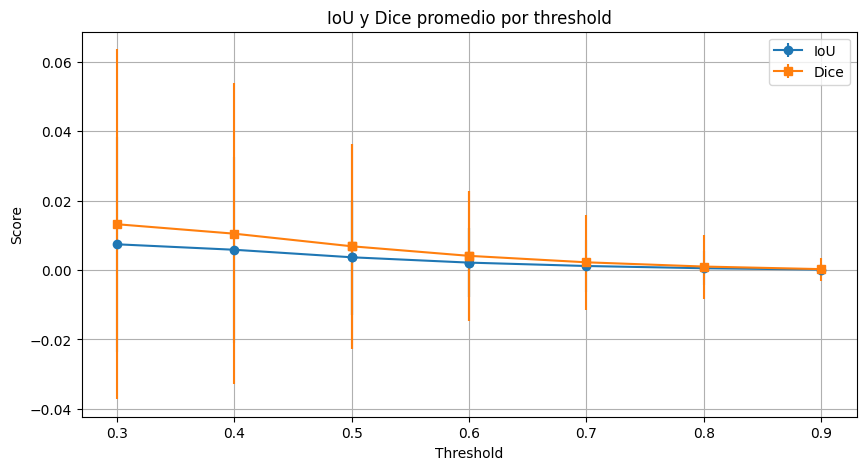

In [ ]:
plt.figure(figsize=(10, 5))

plt.errorbar(thresholds, iou_means, yerr=iou_stds, label="IoU", fmt='-o')
plt.errorbar(thresholds, dice_means, yerr=dice_stds, label="Dice", fmt='-s')

plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("IoU y Dice promedio por threshold")
plt.legend()
plt.grid(True)
plt.show()

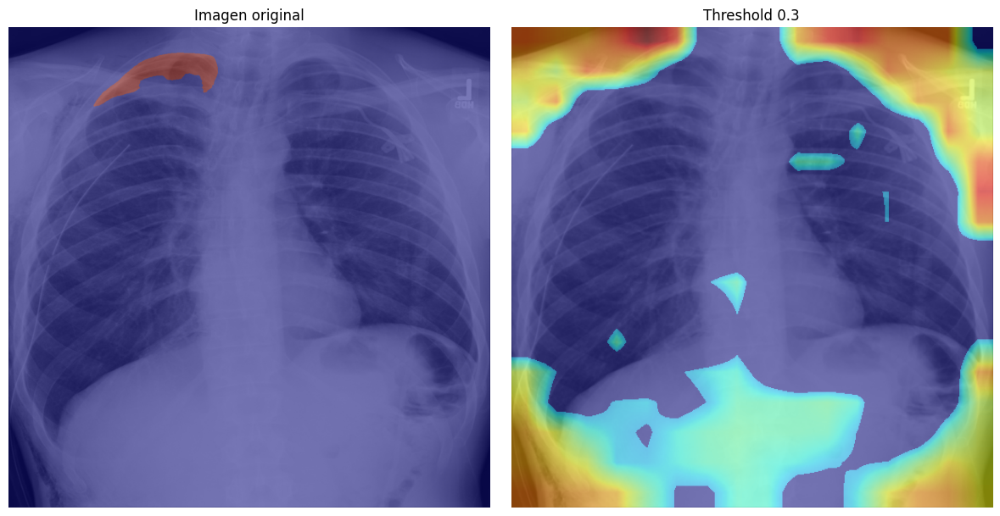

In [ ]:
visualize_cam_comparison("301_test_1_.png", XGradCAM, 0.3)

### Obtener métricas de EigenCAM

In [ ]:
results = method_metrics(EigenCAM, image_files)

# Guardar resultados en DataFrame
df = pd.DataFrame(results)
df.to_csv("metricas_EigenCAM.csv", index=False)

print("✅ Proceso completado. Métricas guardadas.")

Procesando: 914_test_1_.png


Procesando: 924_test_1_.png


Procesando: 920_test_1_.png


Procesando: 928_test_1_.png


Procesando: 949_test_1_.png


Procesando: 939_test_1_.png


Procesando: 941_test_1_.png


Procesando: 94_test_1_.png


Procesando: 942_test_1_.png


Procesando: 943_test_1_.png


Procesando: 938_test_1_.png


Procesando: 958_test_1_.png


Procesando: 957_test_1_.png


Procesando: 977_test_1_.png


Procesando: 972_test_1_.png


Procesando: 988_test_1_.png


Procesando: 985_test_1_.png


Procesando: 990_test_1_.png


Procesando: 98_test_1_.png


Procesando: 982_test_1_.png


Procesando: 986_test_1_.png


Procesando: 99_test_1_.png


Procesando: 846_test_1_.png


Procesando: 852_test_1_.png


Procesando: 861_test_1_.png


Procesando: 858_test_1_.png


Procesando: 866_test_1_.png


Procesando: 878_test_1_.png


Procesando: 877_test_1_.png


Procesando: 86_test_1_.png


Procesando: 889_test_1_.png


Procesando: 894_test_1_.png


Procesando: 883_test_1_.png


Procesando: 893_test_1_.png


Procesando: 891_test_1_.png


Procesando: 886_test_1_.png


Procesando: 908_test_1_.png


Procesando: 89_test_1_.png


Procesando: 896_test_1_.png


Procesando: 911_test_1_.png


Procesando: 90_test_1_.png


Procesando: 913_test_1_.png


Procesando: 756_test_1_.png


Procesando: 758_test_1_.png


Procesando: 759_test_1_.png


Procesando: 763_test_1_.png


Procesando: 76_test_1_.png


Procesando: 776_test_1_.png


Procesando: 77_test_1_.png


Procesando: 784_test_1_.png


Procesando: 783_test_1_.png


Procesando: 791_test_1_.png


Procesando: 780_test_1_.png


Procesando: 785_test_1_.png


Procesando: 7_test_1_.png


Procesando: 814_test_1_.png


Procesando: 813_test_1_.png


Procesando: 80_test_1_.png


Procesando: 821_test_1_.png


Procesando: 831_test_1_.png


Procesando: 834_test_1_.png


Procesando: 826_test_1_.png


Procesando: 823_test_1_.png


Procesando: 671_test_1_.png


Procesando: 670_test_1_.png


Procesando: 705_test_1_.png


Procesando: 707_test_1_.png


Procesando: 703_test_1_.png


Procesando: 6_test_1_.png


Procesando: 694_test_1_.png


Procesando: 693_test_1_.png


Procesando: 717_test_1_.png


Procesando: 713_test_1_.png


Procesando: 718_test_1_.png


Procesando: 710_test_1_.png


Procesando: 726_test_1_.png


Procesando: 732_test_1_.png


Procesando: 722_test_1_.png


Procesando: 737_test_1_.png


Procesando: 740_test_1_.png


Procesando: 745_test_1_.png


Procesando: 74_test_1_.png


Procesando: 595_test_1_.png


Procesando: 588_test_1_.png


Procesando: 634_test_1_.png


Procesando: 630_test_1_.png


Procesando: 623_test_1_.png


Procesando: 605_test_1_.png


Procesando: 631_test_1_.png


Procesando: 64_test_1_.png


Procesando: 654_test_1_.png


Procesando: 653_test_1_.png


Procesando: 663_test_1_.png


Procesando: 665_test_1_.png


Procesando: 645_test_1_.png


Procesando: 641_test_1_.png


Procesando: 656_test_1_.png


Procesando: 658_test_1_.png


Procesando: 661_test_1_.png


Procesando: 667_test_1_.png


Procesando: 640_test_1_.png


Procesando: 687_test_1_.png


Procesando: 531_test_1_.png


Procesando: 526_test_1_.png


Procesando: 512_test_1_.png


Procesando: 520_test_1_.png


Procesando: 518_test_1_.png


Procesando: 553_test_1_.png


Procesando: 543_test_1_.png


Procesando: 552_test_1_.png


Procesando: 550_test_1_.png


Procesando: 566_test_1_.png


Procesando: 572_test_1_.png


Procesando: 570_test_1_.png


Procesando: 557_test_1_.png


Procesando: 558_test_1_.png


Procesando: 585_test_1_.png


Procesando: 598_test_1_.png


Procesando: 418_test_1_.png


Procesando: 424_test_1_.png


Procesando: 441_test_1_.png


Procesando: 435_test_1_.png


Procesando: 445_test_1_.png


Procesando: 446_test_1_.png


Procesando: 448_test_1_.png


Procesando: 452_test_1_.png


Procesando: 449_test_1_.png


Procesando: 469_test_1_.png


Procesando: 47_test_1_.png


Procesando: 483_test_1_.png


Procesando: 491_test_1_.png


Procesando: 476_test_1_.png


Procesando: 485_test_1_.png


Procesando: 506_test_1_.png


Procesando: 498_test_1_.png


Procesando: 500_test_1_.png


Procesando: 492_test_1_.png


Procesando: 509_test_1_.png


Procesando: 495_test_1_.png


Procesando: 37_test_1_.png


Procesando: 372_test_1_.png


Procesando: 364_test_1_.png


Procesando: 378_test_1_.png


Procesando: 356_test_1_.png


Procesando: 366_test_1_.png


Procesando: 376_test_1_.png


Procesando: 385_test_1_.png


Procesando: 415_test_1_.png


Procesando: 406_test_1_.png


Procesando: 387_test_1_.png


Procesando: 392_test_1_.png


Procesando: 42_test_1_.png


Procesando: 437_test_1_.png


Procesando: 432_test_1_.png


Procesando: 426_test_1_.png


Procesando: 287_test_1_.png


Procesando: 290_test_1_.png


Procesando: 284_test_1_.png


Procesando: 288_test_1_.png


Procesando: 266_test_1_.png


Procesando: 264_test_1_.png


Procesando: 279_test_1_.png


Procesando: 291_test_1_.png


Procesando: 301_test_1_.png


Procesando: 316_test_1_.png


Procesando: 315_test_1_.png


Procesando: 336_test_1_.png


Procesando: 340_test_1_.png


Procesando: 325_test_1_.png


Procesando: 337_test_1_.png


Procesando: 324_test_1_.png


Procesando: 322_test_1_.png


Procesando: 341_test_1_.png


Procesando: 19_test_1_.png


Procesando: 181_test_1_.png


Procesando: 193_test_1_.png


Procesando: 217_test_1_.png


Procesando: 204_test_1_.png


Procesando: 218_test_1_.png


Procesando: 219_test_1_.png


Procesando: 205_test_1_.png


Procesando: 206_test_1_.png


Procesando: 223_test_1_.png


Procesando: 250_test_1_.png


Procesando: 25_test_1_.png


Procesando: 242_test_1_.png


Procesando: 263_test_1_.png


Procesando: 1083_test_1_.png


Procesando: 1195_test_1_.png


Procesando: 1307_test_1_.png


Procesando: 1264_test_1_.png


Procesando: 1291_test_1_.png


Procesando: 1254_test_1_.png


Procesando: 1225_test_1_.png


Procesando: 1299_test_1_.png


Procesando: 1278_test_1_.png


Procesando: 1290_test_1_.png


Procesando: 1221_test_1_.png


Procesando: 1244_test_1_.png


Procesando: 1250_test_1_.png


Procesando: 1247_test_1_.png


Procesando: 1202_test_1_.png


Procesando: 1294_test_1_.png


Procesando: 1293_test_1_.png


Procesando: 1194_test_1_.png


Procesando: 1298_test_1_.png


Procesando: 1212_test_1_.png


Procesando: 129_test_1_.png


Procesando: 1240_test_1_.png


Procesando: 1205_test_1_.png


Procesando: 1249_test_1_.png


Procesando: 1285_test_1_.png


Procesando: 1246_test_1_.png


Procesando: 1314_test_1_.png


Procesando: 1192_test_1_.png


Procesando: 1207_test_1_.png


Procesando: 1315_test_1_.png


Procesando: 1220_test_1_.png


Procesando: 1226_test_1_.png


Procesando: 1209_test_1_.png


Procesando: 1312_test_1_.png


Procesando: 1337_test_1_.png


Procesando: 146_test_1_.png


Procesando: 1317_test_1_.png


Procesando: 145_test_1_.png


Procesando: 1348_test_1_.png


Procesando: 1359_test_1_.png


Procesando: 1368_test_1_.png


Procesando: 1326_test_1_.png


Procesando: 152_test_1_.png


Procesando: 1319_test_1_.png


Procesando: 147_test_1_.png


Procesando: 1332_test_1_.png


Procesando: 1356_test_1_.png


Procesando: 1329_test_1_.png


Procesando: 1335_test_1_.png


Procesando: 1354_test_1_.png


Procesando: 1349_test_1_.png


Procesando: 1327_test_1_.png


Procesando: 1363_test_1_.png


Procesando: 1325_test_1_.png


Procesando: 17_test_1_.png


Procesando: 174_test_1_.png


Procesando: 160_test_1_.png


Procesando: 153_test_1_.png


Procesando: 156_test_1_.png


Procesando: 168_test_1_.png


Procesando: 184_test_1_.png


Procesando: 1014_test_1_.png


Procesando: 1029_test_1_.png


Procesando: 1033_test_1_.png


Procesando: 1027_test_1_.png


Procesando: 1031_test_1_.png


Procesando: 101_test_1_.png


Procesando: 1035_test_1_.png


Procesando: 1057_test_1_.png


Procesando: 1040_test_1_.png


Procesando: 1059_test_1_.png


Procesando: 1044_test_1_.png


Procesando: 1054_test_1_.png


Procesando: 1042_test_1_.png


Procesando: 1058_test_1_.png


Procesando: 1053_test_1_.png


Procesando: 1109_test_1_.png


Procesando: 1103_test_1_.png


Procesando: 115_test_1_.png


Procesando: 1084_test_1_.png


Procesando: 1120_test_1_.png


Procesando: 1092_test_1_.png


Procesando: 1102_test_1_.png


Procesando: 1178_test_1_.png


Procesando: 1151_test_1_.png


Procesando: 1132_test_1_.png


Procesando: 1062_test_1_.png


Procesando: 1141_test_1_.png


Procesando: 1071_test_1_.png


Procesando: 111_test_1_.png


Procesando: 1115_test_1_.png


Procesando: 1086_test_1_.png


Procesando: 1105_test_1_.png


Procesando: 1154_test_1_.png


Procesando: 1160_test_1_.png


Procesando: 1145_test_1_.png


Procesando: 1077_test_1_.png


Procesando: 1069_test_1_.png


Procesando: 1090_test_1_.png


Procesando: 1122_test_1_.png


Procesando: 1010_test_1_.png


Procesando: 0_test_1_.png


Procesando: 1007_test_1_.png


✅ Proceso completado. Métricas guardadas.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el CSV generado
df = pd.read_csv("metricas_EigenCAM.csv")

# Identificar los thresholds usados (extraer desde los nombres de columnas)
thresholds = [round(i, 1) for i in list(
    sorted({float(col.split('_t')[1]) for col in df.columns if 'iou_t' in col})
)]

# Calcular medias y stds para cada threshold
iou_means = []
iou_stds = []
dice_means = []
dice_stds = []

for t in thresholds:
    iou_col = f"iou_t{t}"
    dice_col = f"dice_t{t}"

    iou_means.append(df[iou_col].mean())
    iou_stds.append(df[iou_col].std())

    dice_means.append(df[dice_col].mean())
    dice_stds.append(df[dice_col].std())

In [ ]:
print(f"{'Threshold':<10} {'IoU Mean':<10} {'IoU Std':<10} {'Dice Mean':<12} {'Dice Std':<10}")
print("-" * 60)
for i, t in enumerate(thresholds):
    print(f"{t:<10.1f} {iou_means[i]:<10.4f} {iou_stds[i]:<10.4f} {dice_means[i]:<12.4f} {dice_stds[i]:<10.4f}")

Threshold  IoU Mean   IoU Std    Dice Mean    Dice Std  
------------------------------------------------------------
0.3        0.0475     0.0770     0.0820       0.1205    
0.4        0.0451     0.0778     0.0774       0.1224    
0.5        0.0397     0.0737     0.0680       0.1177    
0.5        0.0397     0.0737     0.0680       0.1177    
0.6        0.0327     0.0679     0.0561       0.1099    
0.6        0.0327     0.0679     0.0561       0.1099    
0.7        0.0228     0.0544     0.0398       0.0905    
0.8        0.0114     0.0335     0.0207       0.0584    
0.9        0.0033     0.0133     0.0062       0.0248    


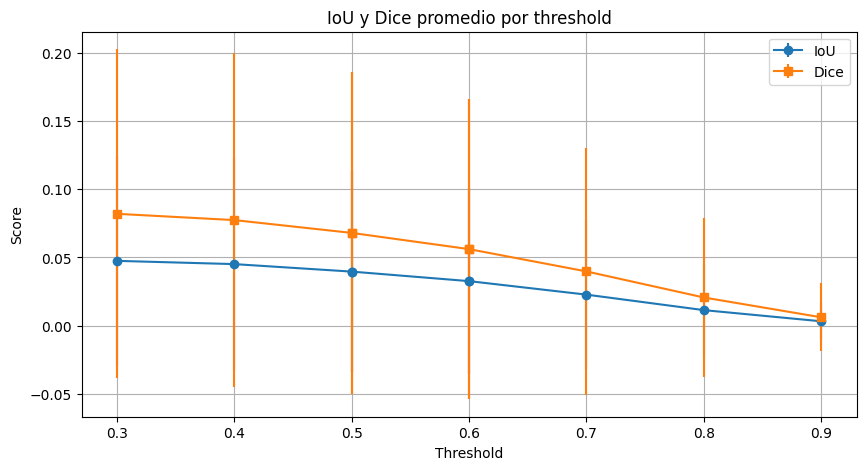

In [ ]:
plt.figure(figsize=(10, 5))

plt.errorbar(thresholds, iou_means, yerr=iou_stds, label="IoU", fmt='-o')
plt.errorbar(thresholds, dice_means, yerr=dice_stds, label="Dice", fmt='-s')

plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("IoU y Dice promedio por threshold")
plt.legend()
plt.grid(True)
plt.show()

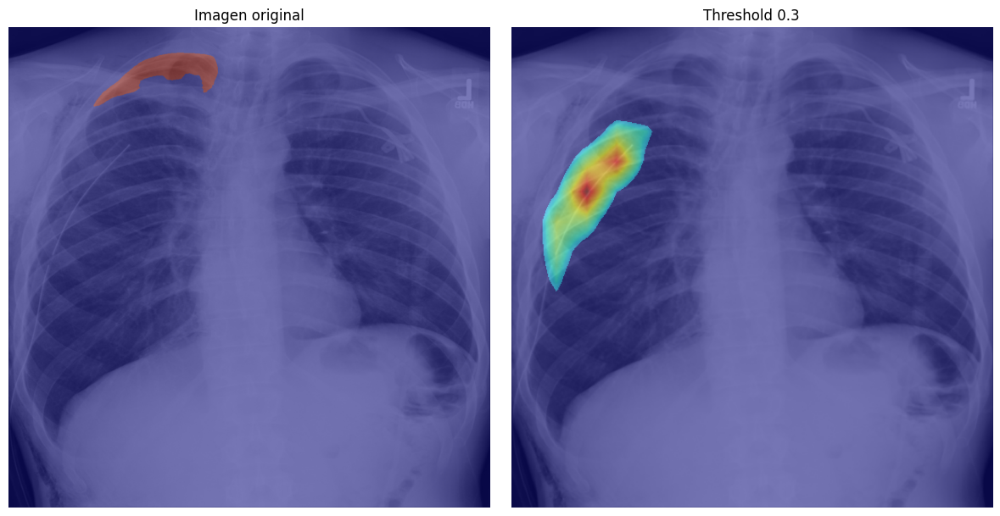

In [ ]:
visualize_cam_comparison("301_test_1_.png", EigenCAM, 0.3)

### Obtener métricas de ScoreCAM

Usar una capa con menos canales:
En lugar de model.layer4[-1], usa model.layer3[-1] o anterior.

Aplicarlo a una muestra representativa del dataset, no a todas las imágenes si no es estrictamente necesario.

In [ ]:
# cam = ScoreCAM(model=model, target_layers=[model[0][0].denseblock1])

# Submuestreo aleatorio de 20 imágenes
random.seed(42)
sampled_images = random.sample(image_files, 40)

results = method_metrics(ScoreCAM, sampled_images)

# Guardar resultados en DataFrame
df = pd.DataFrame(results)
df.to_csv("metricas_ScoreCAM.csv", index=False)

print("✅ Proceso completado. Métricas guardadas.")

Procesando: 80_test_1_.png


 12%|█▎        | 8/64 [02:19<16:11, 17.34s/it]

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el CSV generado
df = pd.read_csv("metricas_ScoreCAM.csv")

# Identificar los thresholds usados (extraer desde los nombres de columnas)
thresholds = [round(i, 1) for i in list(
    sorted({float(col.split('_t')[1]) for col in df.columns if 'iou_t' in col})
)]

# Calcular medias y stds para cada threshold
iou_means = []
iou_stds = []
dice_means = []
dice_stds = []

for t in thresholds:
    iou_col = f"iou_t{t}"
    dice_col = f"dice_t{t}"

    iou_means.append(df[iou_col].mean())
    iou_stds.append(df[iou_col].std())

    dice_means.append(df[dice_col].mean())
    dice_stds.append(df[dice_col].std())

In [ ]:
print(f"{'Threshold':<10} {'IoU Mean':<10} {'IoU Std':<10} {'Dice Mean':<12} {'Dice Std':<10}")
print("-" * 60)
for i, t in enumerate(thresholds):
    print(f"{t:<10.1f} {iou_means[i]:<10.4f} {iou_stds[i]:<10.4f} {dice_means[i]:<12.4f} {dice_stds[i]:<10.4f}")

Threshold  IoU Mean   IoU Std    Dice Mean    Dice Std  
------------------------------------------------------------
0.3        0.0055     0.0188     0.0103       0.0354    
0.4        0.0041     0.0140     0.0077       0.0268    
0.5        0.0027     0.0094     0.0052       0.0182    
0.6        0.0016     0.0055     0.0031       0.0109    
0.7        0.0008     0.0027     0.0016       0.0054    


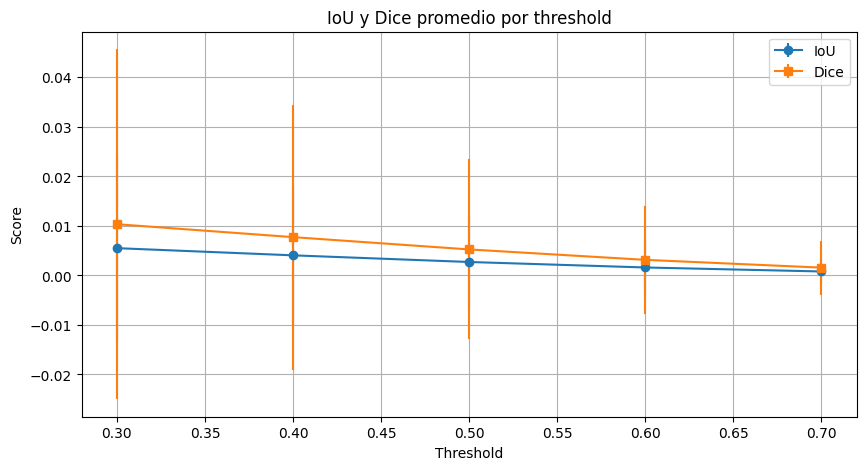

In [ ]:
plt.figure(figsize=(10, 5))

plt.errorbar(thresholds, iou_means, yerr=iou_stds, label="IoU", fmt='-o')
plt.errorbar(thresholds, dice_means, yerr=dice_stds, label="Dice", fmt='-s')

plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("IoU y Dice promedio por threshold")
plt.legend()
plt.grid(True)
plt.show()

### Obtener métricas de AblationCAM

In [ ]:
# cam = AblationCAM(model=model, target_layers=layers)
random.seed(42)
sampled_images = random.sample(image_files, 16)

results = method_metrics(AblationCAM, sampled_images)

# Guardar resultados en DataFrame
df = pd.DataFrame(results)
df.to_csv("metricas_AblationCAM.csv", index=False)

print("✅ Proceso completado. Métricas guardadas.")

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el CSV generado
df = pd.read_csv("metricas_AblationCAM.csv")

# Identificar los thresholds usados (extraer desde los nombres de columnas)
thresholds = [round(i, 1) for i in list(
    sorted({float(col.split('_t')[1]) for col in df.columns if 'iou_t' in col})
)]

# Calcular medias y stds para cada threshold
iou_means = []
iou_stds = []
dice_means = []
dice_stds = []

for t in thresholds:
    iou_col = f"iou_t{t}"
    dice_col = f"dice_t{t}"

    iou_means.append(df[iou_col].mean())
    iou_stds.append(df[iou_col].std())

    dice_means.append(df[dice_col].mean())
    dice_stds.append(df[dice_col].std())

In [ ]:
print(f"{'Threshold':<10} {'IoU Mean':<10} {'IoU Std':<10} {'Dice Mean':<12} {'Dice Std':<10}")
print("-" * 60)
for i, t in enumerate(thresholds):
    print(f"{t:<10.1f} {iou_means[i]:<10.4f} {iou_stds[i]:<10.4f} {dice_means[i]:<12.4f} {dice_stds[i]:<10.4f}")

Threshold  IoU Mean   IoU Std    Dice Mean    Dice Std  
------------------------------------------------------------
0.3        0.0120     0.0121     0.0234       0.0234    
0.4        0.0128     0.0157     0.0248       0.0301    
0.5        0.0131     0.0197     0.0251       0.0374    
0.6        0.0136     0.0213     0.0261       0.0401    
0.7        0.0140     0.0252     0.0266       0.0471    


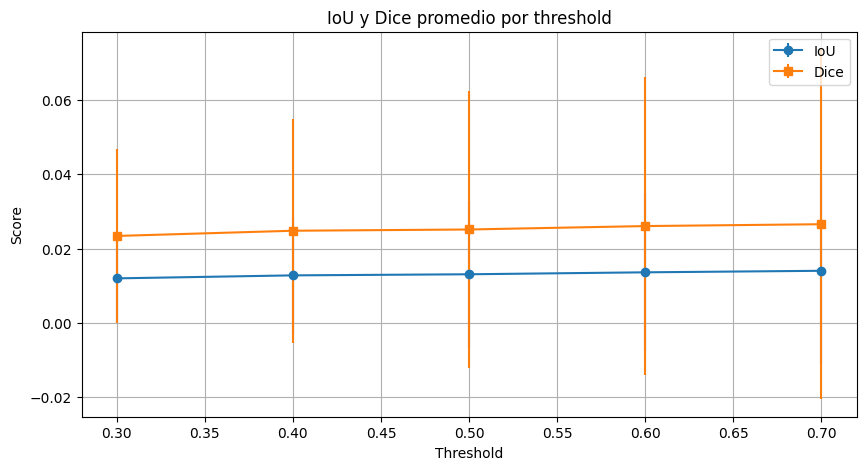

In [ ]:
plt.figure(figsize=(10, 5))

plt.errorbar(thresholds, iou_means, yerr=iou_stds, label="IoU", fmt='-o')
plt.errorbar(thresholds, dice_means, yerr=dice_stds, label="Dice", fmt='-s')

plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("IoU y Dice promedio por threshold")
plt.legend()
plt.grid(True)
plt.show()

### Obtener métricas de FullGrad

In [ ]:
# cam = FullGrad(model=model, target_layers=layers)

random.seed(42)
sampled_images = random.sample(image_files, 100)

results = method_metrics(FullGrad, sampled_images)

# Guardar resultados en DataFrame
df = pd.DataFrame(results)
df.to_csv("metricas_FullGrad.csv", index=False)

print("✅ Proceso completado. Métricas guardadas.")

Procesando: 80_test_1_.png


Procesando: 957_test_1_.png


Procesando: 372_test_1_.png


Procesando: 452_test_1_.png


Procesando: 557_test_1_.png


Procesando: 717_test_1_.png


Procesando: 780_test_1_.png


Procesando: 1105_test_1_.png


Procesando: 759_test_1_.png


Procesando: 1315_test_1_.png


Procesando: 985_test_1_.png


Procesando: 988_test_1_.png


Procesando: 776_test_1_.png


Procesando: 566_test_1_.png


Procesando: 424_test_1_.png


Procesando: 1044_test_1_.png


Procesando: 977_test_1_.png


Procesando: 687_test_1_.png


Procesando: 1192_test_1_.png


Procesando: 572_test_1_.png


Procesando: 152_test_1_.png


Procesando: 378_test_1_.png


Procesando: 928_test_1_.png


Procesando: 74_test_1_.png


Procesando: 1154_test_1_.png


Procesando: 181_test_1_.png


Procesando: 1092_test_1_.png


Procesando: 740_test_1_.png


Procesando: 550_test_1_.png


Procesando: 341_test_1_.png


Procesando: 1077_test_1_.png


Procesando: 1115_test_1_.png


Procesando: 1299_test_1_.png


Procesando: 784_test_1_.png


Procesando: 250_test_1_.png


Procesando: 115_test_1_.png


Procesando: 631_test_1_.png


Procesando: 426_test_1_.png


Procesando: 703_test_1_.png


Procesando: 1212_test_1_.png


Procesando: 958_test_1_.png


Procesando: 263_test_1_.png


Procesando: 598_test_1_.png


Procesando: 509_test_1_.png


Procesando: 894_test_1_.png


Procesando: 1354_test_1_.png


Procesando: 656_test_1_.png


Procesando: 986_test_1_.png


Procesando: 364_test_1_.png


Procesando: 726_test_1_.png


Procesando: 1246_test_1_.png


Procesando: 264_test_1_.png


Procesando: 288_test_1_.png


Procesando: 1359_test_1_.png


Procesando: 1312_test_1_.png


Procesando: 663_test_1_.png


Procesando: 415_test_1_.png


Procesando: 1040_test_1_.png


Procesando: 205_test_1_.png


Procesando: 990_test_1_.png


Procesando: 1029_test_1_.png


Procesando: 337_test_1_.png


Procesando: 821_test_1_.png


Procesando: 1221_test_1_.png


Procesando: 710_test_1_.png


Procesando: 174_test_1_.png


Procesando: 1226_test_1_.png


Procesando: 831_test_1_.png


Procesando: 1337_test_1_.png


Procesando: 858_test_1_.png


Procesando: 658_test_1_.png


Procesando: 1069_test_1_.png


Procesando: 585_test_1_.png


Procesando: 291_test_1_.png


Procesando: 1314_test_1_.png


Procesando: 665_test_1_.png


Procesando: 913_test_1_.png


Procesando: 645_test_1_.png


Procesando: 654_test_1_.png


Procesando: 785_test_1_.png


Procesando: 322_test_1_.png


Procesando: 6_test_1_.png


Procesando: 219_test_1_.png


Procesando: 1103_test_1_.png


Procesando: 315_test_1_.png


Procesando: 98_test_1_.png


Procesando: 287_test_1_.png


Procesando: 1035_test_1_.png


Procesando: 758_test_1_.png


Procesando: 492_test_1_.png


Procesando: 1014_test_1_.png


Procesando: 823_test_1_.png


Procesando: 1207_test_1_.png


Procesando: 418_test_1_.png


Procesando: 1209_test_1_.png


Procesando: 694_test_1_.png


Procesando: 301_test_1_.png


Procesando: 217_test_1_.png


Procesando: 1109_test_1_.png


Procesando: 813_test_1_.png


✅ Proceso completado. Métricas guardadas.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el CSV generado
df = pd.read_csv("metricas_FullGrad.csv")

# Identificar los thresholds usados (extraer desde los nombres de columnas)
thresholds = [round(i, 1) for i in list(
    sorted({float(col.split('_t')[1]) for col in df.columns if 'iou_t' in col})
)]

# Calcular medias y stds para cada threshold
iou_means = []
iou_stds = []
dice_means = []
dice_stds = []

for t in thresholds:
    iou_col = f"iou_t{t}"
    dice_col = f"dice_t{t}"

    iou_means.append(df[iou_col].mean())
    iou_stds.append(df[iou_col].std())

    dice_means.append(df[dice_col].mean())
    dice_stds.append(df[dice_col].std())

In [ ]:
print(f"{'Threshold':<10} {'IoU Mean':<10} {'IoU Std':<10} {'Dice Mean':<12} {'Dice Std':<10}")
print("-" * 60)
for i, t in enumerate(thresholds):
    print(f"{t:<10.1f} {iou_means[i]:<10.4f} {iou_stds[i]:<10.4f} {dice_means[i]:<12.4f} {dice_stds[i]:<10.4f}")

Threshold  IoU Mean   IoU Std    Dice Mean    Dice Std  
------------------------------------------------------------
0.3        0.0412     0.0698     0.0718       0.1121    
0.4        0.0431     0.0789     0.0734       0.1239    
0.5        0.0393     0.0800     0.0661       0.1261    
0.5        0.0393     0.0800     0.0661       0.1261    
0.6        0.0320     0.0698     0.0545       0.1144    
0.6        0.0320     0.0698     0.0545       0.1144    
0.7        0.0269     0.0591     0.0467       0.1000    
0.8        0.0169     0.0397     0.0304       0.0703    
0.9        0.0064     0.0169     0.0122       0.0320    


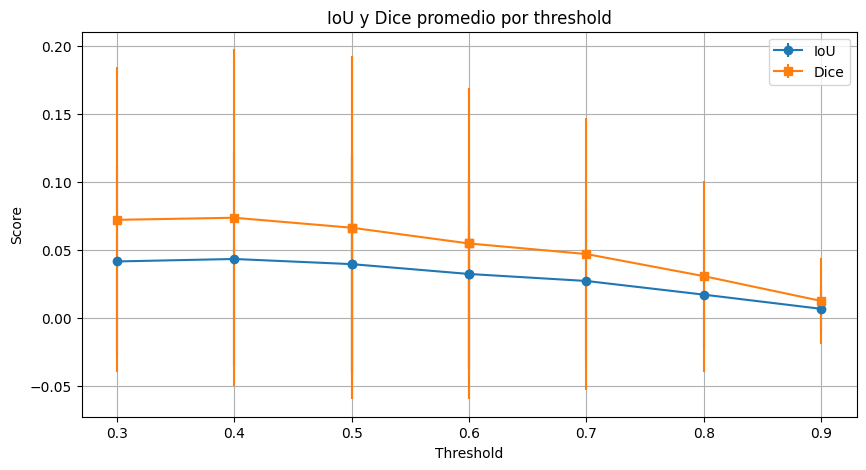

In [ ]:
plt.figure(figsize=(10, 5))

plt.errorbar(thresholds, iou_means, yerr=iou_stds, label="IoU", fmt='-o')
plt.errorbar(thresholds, dice_means, yerr=dice_stds, label="Dice", fmt='-s')

plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("IoU y Dice promedio por threshold")
plt.legend()
plt.grid(True)
plt.show()

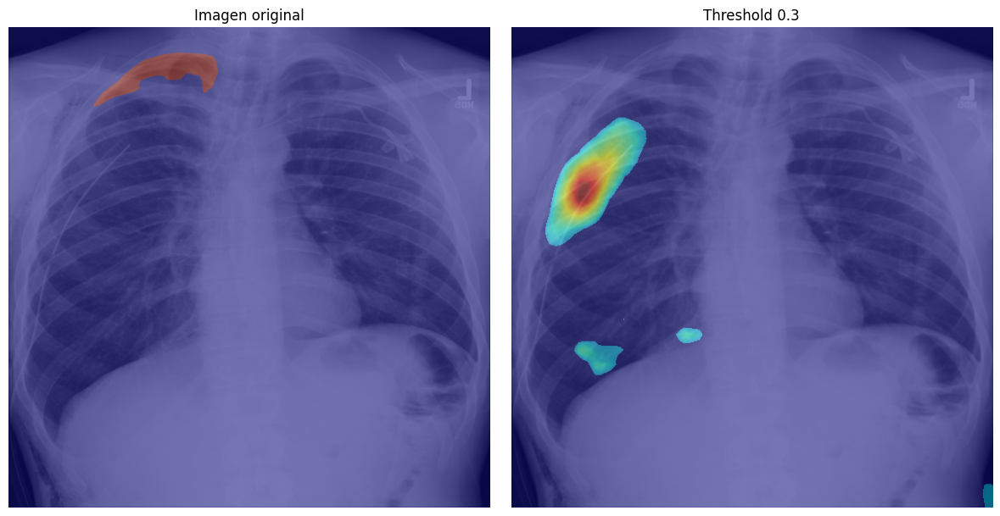

In [ ]:
visualize_cam_comparison("301_test_1_.png", FullGrad, 0.3)

# Qué zonas son más señaladas por los métodos

#### Funciones necesarias

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torchvision.transforms as T

def visualize_cam(img_name):
    """
    Visualiza lado a lado el GradCAM y el CAM threshold seleccionado.

    Args:
        img_name (str): Nombre del archivo de imagen.
        model: Modelo entrenado.
        last_conv_layer: Capa usada para CAMThresholdSelector.
        layers: Capas usadas por GradCAM.
        cam_selector: Clase CAMThresholdSelector ya inicializada.
        cam_method: Clase GradCAM de pytorch-grad-cam.
        img_dir (str or Path): Ruta al directorio donde está la imagen.
        target_class (int): Clase objetivo para CAM.
        image_size (tuple): Tamaño de redimensionado.
    """
    # Cargar imagen
    img_route = path / img_name
    image = Image.open(img_route).convert("RGB")
    mask_path = path.parent / 'png_masks' / img_name
    mask_img = Image.open(mask_path).convert("L")

    # Preprocesar
    dl = learn.dls.test_dl([img_route])   # crea un dataloader de prueba
    input_tensor = dl.one_batch()[0].to(device)
    # input_tensor = transform(original_img).unsqueeze(0).to(next(model.parameters()).device)

    # --- GradCAM ---

    cam = GradCAM(model=model, target_layers=layers)
    gradcam_map = cam(input_tensor=input_tensor, targets=classes).squeeze()

    # Mostrar
    fig, ax = plt.subplots(figsize=(4, 4))

    ax.imshow(image.resize((512, 512), Image.BILINEAR))
    ax.imshow(gradcam_map, cmap='jet', alpha=0.5)
    ax.set_title("GradCAM")
    ax.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
def draw_heatmap(heatmap, title):
    if heatmap.ndim == 3 and heatmap.shape[0] == 1:
        heatmap = heatmap[0]
    plt.figure(figsize=(4, 4))
    plt.imshow(heatmap, cmap='jet', alpha=0.5)  # heatmap sobre imagen
    plt.colorbar(label='Activation')
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
import numpy as np
from PIL import Image
from skimage.transform import resize

def average_heatmaps(camClass, image_files, cam_returns_heatmap=False,
                     target_layers=layers, target_class=None, mask_dir=None):
    """
    Genera el promedio de heatmaps para un conjunto de imágenes.

    Args:
        camClass: Clase del método CAM (ej. GradCAM, GradCAM++...).
        image_files: Lista de rutas a imágenes.
        cam_returns_heatmap: Si el método cam ya devuelve solo el heatmap.
        target_layers: Capas objetivo del modelo para CAM.
        target_class: Clase objetivo para CAM.
        mask_dir: (opcional) carpeta donde están las máscaras, si quieres mantener consistencia de tamaños.

    Returns:
        avg_heatmap: Heatmap promedio normalizado [0, 1].
    """
    all_heatmaps = []

    for img_path in image_files:
        print(f"Procesando para promedio: {img_path.name}")

        # Predicción
        pred_class, _, _ = learn.predict(img_path)
        pred = int(pred_class)
        target_class = ClassifierOutputTarget(pred)
        classes = [target_class]

        # DataLoader de test para 1 imagen
        dl = learn.dls.test_dl([img_path])
        input_tensor = dl.one_batch()[0]

        # Instancia CAM
        cam = camClass(model=model, target_layers=target_layers)

        # Obtener heatmap
        heatmap = cam(input_tensor=input_tensor, targets=classes)
        #if not cam_returns_heatmap:
        #    heatmap = heatmap[0]
        #    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())

        # Normalizar solo si hay rango válido
        if np.isnan(heatmap).all() or heatmap.max() == heatmap.min():
            print(f"⚠️ Heatmap inválido para {img_path.name}, se omite.")
            continue  # O poner heatmap = np.zeros_like(heatmap) si quieres mantenerlo
        else:
            heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())

        # Ajustar tamaño
        if mask_dir is not None:
            mask_path = mask_dir / img_path.name
            mask_img = Image.open(mask_path).convert("L")
            target_shape = np.array(mask_img).shape
        else:
            target_shape = heatmap.shape

        heatmap_resized = resize(heatmap, target_shape, preserve_range=True)

        all_heatmaps.append(heatmap_resized)

        # Liberar
        del cam, heatmap, heatmap_resized, input_tensor

    if not all_heatmaps:
        raise ValueError("No se generaron heatmaps (posiblemente ninguna imagen cumplió la condición).")

    # Promedio
    avg_heatmap = np.mean(all_heatmaps, axis=0)

    # Normalizar entre 0 y 1
    avg_heatmap = (avg_heatmap - avg_heatmap.min()) / (avg_heatmap.max() - avg_heatmap.min())

    return avg_heatmap

In [ ]:
import pandas as pd

def classify_predictions_from_filename(image_files, positive_class=1, output_csv="clasificacion_resultados.csv"):
    """
    Clasifica imágenes como VP, VN, FP, FN usando el ground truth del nombre del archivo.

    Formato esperado: <id>_test_<gt>.png  donde gt = 1 (positivo) o 0 (negativo)

    Args:
        image_files: lista de rutas a imágenes.
        positive_class: clase que se considera "positiva".
        output_csv: ruta donde guardar el CSV.
    """
    results = []

    for img_path in image_files:
        print(f"Procesando: {img_path.name}")

        # Predicción
        pred_class, _, _ = learn.predict(img_path)
        pred = int(pred_class)

        # Ground truth desde el nombre
        filename_parts = img_path.stem.split("_")
        gt = int(filename_parts[-2])  # último elemento antes de la extensión

        # Clasificación
        if pred == positive_class and gt == 1:
            label = "VP"
        elif pred == positive_class and gt == 0:
            label = "FP"
        elif pred != positive_class and gt == 0:
            label = "VN"
        elif pred != positive_class and gt == 1:
            label = "FN"

        results.append({
            "image": img_path.name,
            "predicted": pred,
            "ground_truth": gt,
            "category": label
        })

    # Guardar en CSV
    df = pd.DataFrame(results)
    df.to_csv(output_csv, index=False)
    print(f"Archivo guardado en: {output_csv}")

    return df

In [ ]:
import pandas as pd
from pathlib import Path

def get_images_from_category(csv_path, img_dir, category="VP"):
    """
    Devuelve una lista de rutas de imágenes pertenecientes a una categoría específica (VP, FP, VN, FN).

    Args:
        csv_path: Ruta al CSV generado por classify_predictions_from_filename.
        img_dir: Carpeta donde están las imágenes.
        category: Categoría a filtrar (por defecto "VP").

    Returns:
        List[Path]: Lista de rutas de imágenes.
    """
    df = pd.read_csv(csv_path)

    # Filtrar categoría
    filtered = df[df["category"] == category]

    # Generar rutas completas
    image_paths = [img_dir / fname for fname in filtered["image"]]

    return image_paths

#### Clasificar imagenes en base a predicciones

In [ ]:
image_files = [f for f in img_dir.iterdir() if "_test_" in f.name]

In [ ]:
len(image_files)

1372

In [ ]:
classify_predictions_from_filename(image_files)

Procesando: 922_test_0_.png


Procesando: 915_test_0_.png


Procesando: 925_test_0_.png


Procesando: 918_test_0_.png


Procesando: 914_test_1_.png


Procesando: 91_test_0_.png


Procesando: 924_test_1_.png


Procesando: 920_test_1_.png


Procesando: 917_test_0_.png


Procesando: 928_test_1_.png


Procesando: 929_test_0_.png


Procesando: 932_test_0_.png


Procesando: 92_test_0_.png


Procesando: 933_test_0_.png


Procesando: 937_test_0_.png


Procesando: 930_test_0_.png


Procesando: 934_test_0_.png


Procesando: 936_test_0_.png


Procesando: 935_test_0_.png


Procesando: 927_test_0_.png


Procesando: 931_test_0_.png


Procesando: 949_test_1_.png


Procesando: 945_test_0_.png


Procesando: 939_test_1_.png


Procesando: 940_test_0_.png


Procesando: 950_test_0_.png


Procesando: 941_test_1_.png


Procesando: 944_test_0_.png


Procesando: 94_test_1_.png


Procesando: 951_test_0_.png


Procesando: 946_test_0_.png


Procesando: 948_test_0_.png


Procesando: 942_test_1_.png


Procesando: 93_test_0_.png


Procesando: 943_test_1_.png


Procesando: 938_test_1_.png


Procesando: 947_test_0_.png


Procesando: 958_test_1_.png


Procesando: 955_test_0_.png


Procesando: 960_test_0_.png


Procesando: 962_test_0_.png


Procesando: 954_test_0_.png


Procesando: 964_test_0_.png


Procesando: 953_test_0_.png


Procesando: 952_test_0_.png


Procesando: 95_test_0_.png


Procesando: 957_test_1_.png


Procesando: 956_test_0_.png


Procesando: 967_test_0_.png


Procesando: 966_test_0_.png


Procesando: 959_test_0_.png


Procesando: 961_test_0_.png


Procesando: 965_test_0_.png


Procesando: 963_test_0_.png


Procesando: 974_test_0_.png


Procesando: 977_test_1_.png


Procesando: 979_test_0_.png


Procesando: 971_test_0_.png


Procesando: 975_test_0_.png


Procesando: 978_test_0_.png


Procesando: 981_test_0_.png


Procesando: 968_test_0_.png


Procesando: 980_test_0_.png


Procesando: 96_test_0_.png


Procesando: 97_test_0_.png


Procesando: 972_test_1_.png


Procesando: 973_test_0_.png


Procesando: 969_test_0_.png


Procesando: 976_test_0_.png


Procesando: 970_test_0_.png


Procesando: 988_test_1_.png


Procesando: 985_test_1_.png


Procesando: 990_test_1_.png


Procesando: 992_test_0_.png


Procesando: 987_test_0_.png


Procesando: 98_test_1_.png


Procesando: 982_test_1_.png


Procesando: 986_test_1_.png


Procesando: 991_test_0_.png


Procesando: 984_test_0_.png


Procesando: 989_test_0_.png


Procesando: 993_test_0_.png


Procesando: 983_test_0_.png


Procesando: 998_test_0_.png


Procesando: 996_test_0_.png


Procesando: 99_test_1_.png


Procesando: 994_test_0_.png


Procesando: 999_test_0_.png


Procesando: 997_test_0_.png


Procesando: 995_test_0_.png


Procesando: 9_test_0_.png


Procesando: 842_test_0_.png


Procesando: 846_test_1_.png


Procesando: 837_test_0_.png


Procesando: 840_test_0_.png


Procesando: 841_test_0_.png


Procesando: 849_test_0_.png


Procesando: 851_test_0_.png


Procesando: 853_test_0_.png


Procesando: 852_test_1_.png


Procesando: 83_test_0_.png


Procesando: 843_test_0_.png


Procesando: 845_test_0_.png


Procesando: 836_test_0_.png


Procesando: 847_test_0_.png


Procesando: 854_test_0_.png


Procesando: 855_test_0_.png


Procesando: 84_test_0_.png


Procesando: 844_test_0_.png


Procesando: 848_test_0_.png


Procesando: 835_test_0_.png


Procesando: 839_test_0_.png


Procesando: 863_test_0_.png


Procesando: 85_test_0_.png


Procesando: 857_test_0_.png


Procesando: 861_test_1_.png


Procesando: 868_test_0_.png


Procesando: 860_test_0_.png


Procesando: 865_test_0_.png


Procesando: 859_test_0_.png


Procesando: 856_test_0_.png


Procesando: 867_test_0_.png


Procesando: 862_test_0_.png


Procesando: 858_test_1_.png


Procesando: 866_test_1_.png


Procesando: 864_test_0_.png


Procesando: 87_test_0_.png


Procesando: 882_test_0_.png


Procesando: 878_test_1_.png


Procesando: 875_test_0_.png


Procesando: 870_test_0_.png


Procesando: 877_test_1_.png


Procesando: 879_test_0_.png


Procesando: 871_test_0_.png


Procesando: 876_test_0_.png


Procesando: 872_test_0_.png


Procesando: 869_test_0_.png


Procesando: 874_test_0_.png


Procesando: 881_test_0_.png


Procesando: 880_test_0_.png


Procesando: 86_test_1_.png


Procesando: 873_test_0_.png


Procesando: 887_test_0_.png


Procesando: 889_test_1_.png


Procesando: 88_test_0_.png


Procesando: 894_test_1_.png


Procesando: 883_test_1_.png


Procesando: 888_test_0_.png


Procesando: 893_test_1_.png


Procesando: 892_test_0_.png


Procesando: 895_test_0_.png


Procesando: 890_test_0_.png


Procesando: 891_test_1_.png


Procesando: 885_test_0_.png


Procesando: 884_test_0_.png


Procesando: 886_test_1_.png


Procesando: 909_test_0_.png


Procesando: 900_test_0_.png


Procesando: 899_test_0_.png


Procesando: 901_test_0_.png


Procesando: 908_test_1_.png


Procesando: 905_test_0_.png


Procesando: 89_test_1_.png


Procesando: 902_test_0_.png


Procesando: 907_test_0_.png


Procesando: 903_test_0_.png


Procesando: 896_test_1_.png


Procesando: 897_test_0_.png


Procesando: 906_test_0_.png


Procesando: 911_test_1_.png


Procesando: 898_test_0_.png


Procesando: 90_test_1_.png


Procesando: 910_test_0_.png


Procesando: 8_test_0_.png


Procesando: 904_test_0_.png


Procesando: 921_test_0_.png


Procesando: 913_test_1_.png


Procesando: 926_test_0_.png


Procesando: 916_test_0_.png


Procesando: 912_test_0_.png


Procesando: 919_test_0_.png


Procesando: 923_test_0_.png


Procesando: 756_test_1_.png


Procesando: 747_test_0_.png


Procesando: 760_test_0_.png


Procesando: 755_test_0_.png


Procesando: 751_test_0_.png


Procesando: 748_test_0_.png


Procesando: 758_test_1_.png


Procesando: 750_test_0_.png


Procesando: 749_test_0_.png


Procesando: 759_test_1_.png


Procesando: 752_test_0_.png


Procesando: 763_test_1_.png


Procesando: 774_test_0_.png


Procesando: 76_test_1_.png


Procesando: 771_test_0_.png


Procesando: 764_test_0_.png


Procesando: 765_test_0_.png


Procesando: 770_test_0_.png


Procesando: 775_test_0_.png


Procesando: 773_test_0_.png


Procesando: 768_test_0_.png


Procesando: 779_test_0_.png


Procesando: 776_test_1_.png


Procesando: 778_test_0_.png


Procesando: 777_test_0_.png


Procesando: 766_test_0_.png


Procesando: 769_test_0_.png


Procesando: 772_test_0_.png


Procesando: 767_test_0_.png


Procesando: 77_test_1_.png


Procesando: 78_test_0_.png


Procesando: 784_test_1_.png


Procesando: 790_test_0_.png


Procesando: 788_test_0_.png


Procesando: 783_test_1_.png


Procesando: 792_test_0_.png


Procesando: 782_test_0_.png


Procesando: 791_test_1_.png


Procesando: 795_test_0_.png


Procesando: 781_test_0_.png


Procesando: 780_test_1_.png


Procesando: 787_test_0_.png


Procesando: 793_test_0_.png


Procesando: 786_test_0_.png


Procesando: 785_test_1_.png


Procesando: 794_test_0_.png


Procesando: 789_test_0_.png


Procesando: 803_test_0_.png


Procesando: 806_test_0_.png


Procesando: 800_test_0_.png


Procesando: 7_test_1_.png


Procesando: 796_test_0_.png


Procesando: 802_test_0_.png


Procesando: 808_test_0_.png


Procesando: 805_test_0_.png


Procesando: 807_test_0_.png


Procesando: 79_test_0_.png


Procesando: 801_test_0_.png


Procesando: 797_test_0_.png


Procesando: 804_test_0_.png


Procesando: 799_test_0_.png


Procesando: 798_test_0_.png


Procesando: 810_test_0_.png


Procesando: 818_test_0_.png


Procesando: 816_test_0_.png


Procesando: 817_test_0_.png


Procesando: 820_test_0_.png


Procesando: 809_test_0_.png


Procesando: 815_test_0_.png


Procesando: 819_test_0_.png


Procesando: 814_test_1_.png


Procesando: 812_test_0_.png


Procesando: 813_test_1_.png


Procesando: 80_test_1_.png


Procesando: 811_test_0_.png


Procesando: 81_test_0_.png


Procesando: 821_test_1_.png


Procesando: 830_test_0_.png


Procesando: 82_test_0_.png


Procesando: 825_test_0_.png


Procesando: 828_test_0_.png


Procesando: 827_test_0_.png


Procesando: 824_test_0_.png


Procesando: 831_test_1_.png


Procesando: 834_test_1_.png


Procesando: 826_test_1_.png


Procesando: 822_test_0_.png


Procesando: 823_test_1_.png


Procesando: 833_test_0_.png


Procesando: 829_test_0_.png


Procesando: 832_test_0_.png


Procesando: 850_test_0_.png


Procesando: 838_test_0_.png


Procesando: 67_test_0_.png


Procesando: 681_test_0_.png


Procesando: 686_test_0_.png


Procesando: 672_test_0_.png


Procesando: 683_test_0_.png


Procesando: 671_test_1_.png


Procesando: 674_test_0_.png


Procesando: 669_test_0_.png


Procesando: 680_test_0_.png


Procesando: 682_test_0_.png


Procesando: 688_test_0_.png


Procesando: 677_test_0_.png


Procesando: 670_test_1_.png


Procesando: 689_test_0_.png


Procesando: 66_test_0_.png


Procesando: 679_test_0_.png


Procesando: 685_test_0_.png


Procesando: 68_test_0_.png


Procesando: 690_test_0_.png


Procesando: 678_test_0_.png


Procesando: 676_test_0_.png


Procesando: 696_test_0_.png


Procesando: 695_test_0_.png


Procesando: 699_test_0_.png


Procesando: 691_test_0_.png


Procesando: 701_test_0_.png


Procesando: 705_test_1_.png


Procesando: 697_test_0_.png


Procesando: 692_test_0_.png


Procesando: 707_test_1_.png


Procesando: 703_test_1_.png


Procesando: 704_test_0_.png


Procesando: 698_test_0_.png


Procesando: 69_test_0_.png


Procesando: 702_test_0_.png


Procesando: 706_test_0_.png


Procesando: 6_test_1_.png


Procesando: 694_test_1_.png


Procesando: 700_test_0_.png


Procesando: 693_test_1_.png


Procesando: 708_test_0_.png


Procesando: 720_test_0_.png


Procesando: 716_test_0_.png


Procesando: 714_test_0_.png


Procesando: 70_test_0_.png


Procesando: 717_test_1_.png


Procesando: 709_test_0_.png


Procesando: 713_test_1_.png


Procesando: 712_test_0_.png


Procesando: 715_test_0_.png


Procesando: 719_test_0_.png


Procesando: 718_test_1_.png


Procesando: 711_test_0_.png


Procesando: 710_test_1_.png


Procesando: 71_test_0_.png


Procesando: 728_test_0_.png


Procesando: 723_test_0_.png


Procesando: 72_test_0_.png


Procesando: 730_test_0_.png


Procesando: 731_test_0_.png


Procesando: 721_test_0_.png


Procesando: 726_test_1_.png


Procesando: 732_test_1_.png


Procesando: 733_test_0_.png


Procesando: 724_test_0_.png


Procesando: 729_test_0_.png


Procesando: 725_test_0_.png


Procesando: 722_test_1_.png


Procesando: 727_test_0_.png


Procesando: 737_test_1_.png


Procesando: 744_test_0_.png


Procesando: 740_test_1_.png


Procesando: 73_test_0_.png


Procesando: 742_test_0_.png


Procesando: 743_test_0_.png


Procesando: 746_test_0_.png


Procesando: 739_test_0_.png


Procesando: 736_test_0_.png


Procesando: 738_test_0_.png


Procesando: 734_test_0_.png


Procesando: 735_test_0_.png


Procesando: 741_test_0_.png


Procesando: 745_test_1_.png


Procesando: 74_test_1_.png


Procesando: 753_test_0_.png


Procesando: 754_test_0_.png


Procesando: 761_test_0_.png


Procesando: 75_test_0_.png


Procesando: 757_test_0_.png


Procesando: 762_test_0_.png


Procesando: 583_test_0_.png


Procesando: 574_test_0_.png


Procesando: 600_test_0_.png


Procesando: 580_test_0_.png


Procesando: 597_test_0_.png


Procesando: 595_test_1_.png


Procesando: 587_test_0_.png


Procesando: 588_test_1_.png


Procesando: 578_test_0_.png


Procesando: 599_test_0_.png


Procesando: 622_test_0_.png


Procesando: 613_test_0_.png


Procesando: 617_test_0_.png


Procesando: 60_test_0_.png


Procesando: 637_test_0_.png


Procesando: 606_test_0_.png


Procesando: 612_test_0_.png


Procesando: 620_test_0_.png


Procesando: 611_test_0_.png


Procesando: 61_test_0_.png


Procesando: 610_test_0_.png


Procesando: 616_test_0_.png


Procesando: 638_test_0_.png


Procesando: 615_test_0_.png


Procesando: 621_test_0_.png


Procesando: 625_test_0_.png


Procesando: 619_test_0_.png


Procesando: 633_test_0_.png


Procesando: 627_test_0_.png


Procesando: 634_test_1_.png


Procesando: 636_test_0_.png


Procesando: 635_test_0_.png


Procesando: 630_test_1_.png


Procesando: 624_test_0_.png


Procesando: 603_test_0_.png


Procesando: 604_test_0_.png


Procesando: 626_test_0_.png


Procesando: 628_test_0_.png


Procesando: 614_test_0_.png


Procesando: 618_test_0_.png


Procesando: 608_test_0_.png


Procesando: 623_test_1_.png


Procesando: 632_test_0_.png


Procesando: 609_test_0_.png


Procesando: 607_test_0_.png


Procesando: 62_test_0_.png


Procesando: 629_test_0_.png


Procesando: 605_test_1_.png


Procesando: 631_test_1_.png


Procesando: 649_test_0_.png


Procesando: 660_test_0_.png


Procesando: 64_test_1_.png


Procesando: 654_test_1_.png


Procesando: 653_test_1_.png


Procesando: 663_test_1_.png


Procesando: 665_test_1_.png


Procesando: 659_test_0_.png


Procesando: 646_test_0_.png


Procesando: 645_test_1_.png


Procesando: 652_test_0_.png


Procesando: 641_test_1_.png


Procesando: 643_test_0_.png


Procesando: 648_test_0_.png


Procesando: 666_test_0_.png


Procesando: 644_test_0_.png


Procesando: 656_test_1_.png


Procesando: 662_test_0_.png


Procesando: 658_test_1_.png


Procesando: 642_test_0_.png


Procesando: 661_test_1_.png


Procesando: 655_test_0_.png


Procesando: 639_test_0_.png


Procesando: 65_test_0_.png


Procesando: 63_test_0_.png


Procesando: 667_test_1_.png


Procesando: 647_test_0_.png


Procesando: 651_test_0_.png


Procesando: 640_test_1_.png


Procesando: 650_test_0_.png


Procesando: 664_test_0_.png


Procesando: 657_test_0_.png


Procesando: 668_test_0_.png


Procesando: 673_test_0_.png


Procesando: 687_test_1_.png


Procesando: 684_test_0_.png


Procesando: 675_test_0_.png


Procesando: 507_test_0_.png


Procesando: 510_test_0_.png


Procesando: 502_test_0_.png


Procesando: 49_test_0_.png


Procesando: 503_test_0_.png


Procesando: 511_test_0_.png


Procesando: 521_test_0_.png


Procesando: 522_test_0_.png


Procesando: 528_test_0_.png


Procesando: 536_test_0_.png


Procesando: 517_test_0_.png


Procesando: 531_test_1_.png


Procesando: 515_test_0_.png


Procesando: 514_test_0_.png


Procesando: 524_test_0_.png


Procesando: 533_test_0_.png


Procesando: 534_test_0_.png


Procesando: 519_test_0_.png


Procesando: 526_test_1_.png


Procesando: 51_test_0_.png


Procesando: 52_test_0_.png


Procesando: 512_test_1_.png


Procesando: 535_test_0_.png


Procesando: 525_test_0_.png


Procesando: 520_test_1_.png


Procesando: 527_test_0_.png


Procesando: 532_test_0_.png


Procesando: 523_test_0_.png


Procesando: 518_test_1_.png


Procesando: 513_test_0_.png


Procesando: 530_test_0_.png


Procesando: 529_test_0_.png


Procesando: 516_test_0_.png


Procesando: 553_test_1_.png


Procesando: 549_test_0_.png


Procesando: 544_test_0_.png


Procesando: 545_test_0_.png


Procesando: 551_test_0_.png


Procesando: 53_test_0_.png


Procesando: 541_test_0_.png


Procesando: 538_test_0_.png


Procesando: 554_test_0_.png


Procesando: 540_test_0_.png


Procesando: 546_test_0_.png


Procesando: 555_test_0_.png


Procesando: 547_test_0_.png


Procesando: 539_test_0_.png


Procesando: 542_test_0_.png


Procesando: 548_test_0_.png


Procesando: 556_test_0_.png


Procesando: 543_test_1_.png


Procesando: 552_test_1_.png


Procesando: 550_test_1_.png


Procesando: 54_test_0_.png


Procesando: 537_test_0_.png


Procesando: 571_test_0_.png


Procesando: 560_test_0_.png


Procesando: 568_test_0_.png


Procesando: 567_test_0_.png


Procesando: 563_test_0_.png


Procesando: 573_test_0_.png


Procesando: 569_test_0_.png


Procesando: 55_test_0_.png


Procesando: 566_test_1_.png


Procesando: 565_test_0_.png


Procesando: 559_test_0_.png


Procesando: 572_test_1_.png


Procesando: 562_test_0_.png


Procesando: 570_test_1_.png


Procesando: 56_test_0_.png


Procesando: 561_test_0_.png


Procesando: 557_test_1_.png


Procesando: 558_test_1_.png


Procesando: 564_test_0_.png


Procesando: 58_test_0_.png


Procesando: 584_test_0_.png


Procesando: 596_test_0_.png


Procesando: 59_test_0_.png


Procesando: 591_test_0_.png


Procesando: 602_test_0_.png


Procesando: 577_test_0_.png


Procesando: 582_test_0_.png


Procesando: 585_test_1_.png


Procesando: 593_test_0_.png


Procesando: 601_test_0_.png


Procesando: 579_test_0_.png


Procesando: 590_test_0_.png


Procesando: 581_test_0_.png


Procesando: 594_test_0_.png


Procesando: 586_test_0_.png


Procesando: 598_test_1_.png


Procesando: 592_test_0_.png


Procesando: 5_test_0_.png


Procesando: 589_test_0_.png


Procesando: 575_test_0_.png


Procesando: 576_test_0_.png


Procesando: 57_test_0_.png


Procesando: 43_test_0_.png


Procesando: 418_test_1_.png


Procesando: 423_test_0_.png


Procesando: 429_test_0_.png


Procesando: 425_test_0_.png


Procesando: 434_test_0_.png


Procesando: 442_test_0_.png


Procesando: 443_test_0_.png


Procesando: 430_test_0_.png


Procesando: 444_test_0_.png


Procesando: 439_test_0_.png


Procesando: 433_test_0_.png


Procesando: 424_test_1_.png


Procesando: 438_test_0_.png


Procesando: 41_test_0_.png


Procesando: 440_test_0_.png


Procesando: 441_test_1_.png


Procesando: 422_test_0_.png


Procesando: 428_test_0_.png


Procesando: 435_test_1_.png


Procesando: 457_test_0_.png


Procesando: 451_test_0_.png


Procesando: 459_test_0_.png


Procesando: 44_test_0_.png


Procesando: 445_test_1_.png


Procesando: 464_test_0_.png


Procesando: 446_test_1_.png


Procesando: 466_test_0_.png


Procesando: 456_test_0_.png


Procesando: 460_test_0_.png


Procesando: 468_test_0_.png


Procesando: 450_test_0_.png


Procesando: 455_test_0_.png


Procesando: 463_test_0_.png


Procesando: 447_test_0_.png


Procesando: 465_test_0_.png


Procesando: 454_test_0_.png


Procesando: 453_test_0_.png


Procesando: 467_test_0_.png


Procesando: 461_test_0_.png


Procesando: 462_test_0_.png


Procesando: 448_test_1_.png


Procesando: 458_test_0_.png


Procesando: 45_test_0_.png


Procesando: 452_test_1_.png


Procesando: 449_test_1_.png


Procesando: 489_test_0_.png


Procesando: 486_test_0_.png


Procesando: 471_test_0_.png


Procesando: 490_test_0_.png


Procesando: 469_test_1_.png


Procesando: 472_test_0_.png


Procesando: 478_test_0_.png


Procesando: 479_test_0_.png


Procesando: 484_test_0_.png


Procesando: 47_test_1_.png


Procesando: 46_test_0_.png


Procesando: 483_test_1_.png


Procesando: 470_test_0_.png


Procesando: 477_test_0_.png


Procesando: 481_test_0_.png


Procesando: 491_test_1_.png


Procesando: 476_test_1_.png


Procesando: 488_test_0_.png


Procesando: 480_test_0_.png


Procesando: 485_test_1_.png


Procesando: 475_test_0_.png


Procesando: 474_test_0_.png


Procesando: 473_test_0_.png


Procesando: 48_test_0_.png


Procesando: 487_test_0_.png


Procesando: 482_test_0_.png


Procesando: 493_test_0_.png


Procesando: 496_test_0_.png


Procesando: 494_test_0_.png


Procesando: 4_test_0_.png


Procesando: 506_test_1_.png


Procesando: 498_test_1_.png


Procesando: 50_test_0_.png


Procesando: 499_test_0_.png


Procesando: 500_test_1_.png


Procesando: 492_test_1_.png


Procesando: 509_test_1_.png


Procesando: 495_test_1_.png


Procesando: 501_test_0_.png


Procesando: 505_test_0_.png


Procesando: 504_test_0_.png


Procesando: 508_test_0_.png


Procesando: 497_test_0_.png


Procesando: 346_test_0_.png


Procesando: 352_test_0_.png


Procesando: 354_test_0_.png


Procesando: 351_test_0_.png


Procesando: 348_test_0_.png


Procesando: 350_test_0_.png


Procesando: 353_test_0_.png


Procesando: 349_test_0_.png


Procesando: 344_test_0_.png


Procesando: 34_test_0_.png


Procesando: 355_test_0_.png


Procesando: 347_test_0_.png


Procesando: 373_test_0_.png


Procesando: 382_test_0_.png


Procesando: 381_test_0_.png


Procesando: 379_test_0_.png


Procesando: 365_test_0_.png


Procesando: 37_test_1_.png


Procesando: 369_test_0_.png


Procesando: 372_test_1_.png


Procesando: 35_test_0_.png


Procesando: 360_test_0_.png


Procesando: 370_test_0_.png


Procesando: 364_test_1_.png


Procesando: 378_test_1_.png


Procesando: 383_test_0_.png


Procesando: 368_test_0_.png


Procesando: 358_test_0_.png


Procesando: 361_test_0_.png


Procesando: 356_test_1_.png


Procesando: 36_test_0_.png


Procesando: 374_test_0_.png


Procesando: 359_test_0_.png


Procesando: 366_test_1_.png


Procesando: 376_test_1_.png


Procesando: 362_test_0_.png


Procesando: 377_test_0_.png


Procesando: 357_test_0_.png


Procesando: 375_test_0_.png


Procesando: 367_test_0_.png


Procesando: 385_test_1_.png


Procesando: 363_test_0_.png


Procesando: 384_test_0_.png


Procesando: 371_test_0_.png


Procesando: 380_test_0_.png


Procesando: 394_test_0_.png


Procesando: 399_test_0_.png


Procesando: 411_test_0_.png


Procesando: 391_test_0_.png


Procesando: 397_test_0_.png


Procesando: 410_test_0_.png


Procesando: 400_test_0_.png


Procesando: 403_test_0_.png


Procesando: 393_test_0_.png


Procesando: 415_test_1_.png


Procesando: 40_test_0_.png


Procesando: 414_test_0_.png


Procesando: 407_test_0_.png


Procesando: 396_test_0_.png


Procesando: 408_test_0_.png


Procesando: 412_test_0_.png


Procesando: 409_test_0_.png


Procesando: 406_test_1_.png


Procesando: 387_test_1_.png


Procesando: 38_test_0_.png


Procesando: 401_test_0_.png


Procesando: 402_test_0_.png


Procesando: 388_test_0_.png


Procesando: 3_test_0_.png


Procesando: 398_test_0_.png


Procesando: 389_test_0_.png


Procesando: 405_test_0_.png


Procesando: 416_test_0_.png


Procesando: 404_test_0_.png


Procesando: 413_test_0_.png


Procesando: 392_test_1_.png


Procesando: 395_test_0_.png


Procesando: 386_test_0_.png


Procesando: 39_test_0_.png


Procesando: 390_test_0_.png


Procesando: 417_test_0_.png


Procesando: 431_test_0_.png


Procesando: 42_test_1_.png


Procesando: 437_test_1_.png


Procesando: 421_test_0_.png


Procesando: 419_test_0_.png


Procesando: 436_test_0_.png


Procesando: 427_test_0_.png


Procesando: 432_test_1_.png


Procesando: 426_test_1_.png


Procesando: 420_test_0_.png


Procesando: 267_test_0_.png


Procesando: 287_test_1_.png


Procesando: 272_test_0_.png


Procesando: 283_test_0_.png


Procesando: 290_test_1_.png


Procesando: 289_test_0_.png


Procesando: 273_test_0_.png


Procesando: 284_test_1_.png


Procesando: 269_test_0_.png


Procesando: 285_test_0_.png


Procesando: 275_test_0_.png


Procesando: 268_test_0_.png


Procesando: 26_test_0_.png


Procesando: 288_test_1_.png


Procesando: 265_test_0_.png


Procesando: 270_test_0_.png


Procesando: 266_test_1_.png


Procesando: 271_test_0_.png


Procesando: 280_test_0_.png


Procesando: 278_test_0_.png


Procesando: 264_test_1_.png


Procesando: 276_test_0_.png


Procesando: 277_test_0_.png


Procesando: 281_test_0_.png


Procesando: 274_test_0_.png


Procesando: 286_test_0_.png


Procesando: 279_test_1_.png


Procesando: 282_test_0_.png


Procesando: 28_test_0_.png


Procesando: 27_test_0_.png


Procesando: 297_test_0_.png


Procesando: 29_test_0_.png


Procesando: 295_test_0_.png


Procesando: 293_test_0_.png


Procesando: 292_test_0_.png


Procesando: 291_test_1_.png


Procesando: 303_test_0_.png


Procesando: 310_test_0_.png


Procesando: 318_test_0_.png


Procesando: 296_test_0_.png


Procesando: 298_test_0_.png


Procesando: 314_test_0_.png


Procesando: 313_test_0_.png


Procesando: 301_test_1_.png


Procesando: 309_test_0_.png


Procesando: 306_test_0_.png


Procesando: 307_test_0_.png


Procesando: 316_test_1_.png


Procesando: 305_test_0_.png


Procesando: 304_test_0_.png


Procesando: 2_test_0_.png


Procesando: 308_test_0_.png


Procesando: 317_test_0_.png


Procesando: 315_test_1_.png


Procesando: 302_test_0_.png


Procesando: 30_test_0_.png


Procesando: 311_test_0_.png


Procesando: 312_test_0_.png


Procesando: 299_test_0_.png


Procesando: 294_test_0_.png


Procesando: 300_test_0_.png


Procesando: 336_test_1_.png


Procesando: 339_test_0_.png


Procesando: 320_test_0_.png


Procesando: 340_test_1_.png


Procesando: 327_test_0_.png


Procesando: 321_test_0_.png


Procesando: 335_test_0_.png


Procesando: 333_test_0_.png


Procesando: 343_test_0_.png


Procesando: 329_test_0_.png


Procesando: 325_test_1_.png


Procesando: 342_test_0_.png


Procesando: 33_test_0_.png


Procesando: 337_test_1_.png


Procesando: 332_test_0_.png


Procesando: 31_test_0_.png


Procesando: 334_test_0_.png


Procesando: 328_test_0_.png


Procesando: 324_test_1_.png


Procesando: 338_test_0_.png


Procesando: 319_test_0_.png


Procesando: 323_test_0_.png


Procesando: 32_test_0_.png


Procesando: 322_test_1_.png


Procesando: 330_test_0_.png


Procesando: 331_test_0_.png


Procesando: 326_test_0_.png


Procesando: 341_test_1_.png


Procesando: 345_test_0_.png


Procesando: 19_test_1_.png


Procesando: 181_test_1_.png


Procesando: 186_test_0_.png


Procesando: 196_test_0_.png


Procesando: 191_test_0_.png


Procesando: 182_test_0_.png


Procesando: 193_test_1_.png


Procesando: 1_test_0_.png


Procesando: 197_test_0_.png


Procesando: 192_test_0_.png


Procesando: 180_test_0_.png


Procesando: 188_test_0_.png


Procesando: 190_test_0_.png


Procesando: 183_test_0_.png


Procesando: 187_test_0_.png


Procesando: 195_test_0_.png


Procesando: 201_test_0_.png


Procesando: 194_test_0_.png


Procesando: 198_test_0_.png


Procesando: 189_test_0_.png


Procesando: 199_test_0_.png


Procesando: 18_test_0_.png


Procesando: 185_test_0_.png


Procesando: 217_test_1_.png


Procesando: 208_test_0_.png


Procesando: 204_test_1_.png


Procesando: 210_test_0_.png


Procesando: 21_test_0_.png


Procesando: 216_test_0_.png


Procesando: 212_test_0_.png


Procesando: 207_test_0_.png


Procesando: 218_test_1_.png


Procesando: 220_test_0_.png


Procesando: 219_test_1_.png


Procesando: 215_test_0_.png


Procesando: 209_test_0_.png


Procesando: 211_test_0_.png


Procesando: 213_test_0_.png


Procesando: 214_test_0_.png


Procesando: 202_test_0_.png


Procesando: 203_test_0_.png


Procesando: 205_test_1_.png


Procesando: 20_test_0_.png


Procesando: 222_test_0_.png


Procesando: 221_test_0_.png


Procesando: 206_test_1_.png


Procesando: 230_test_0_.png


Procesando: 22_test_0_.png


Procesando: 240_test_0_.png


Procesando: 225_test_0_.png


Procesando: 235_test_0_.png


Procesando: 227_test_0_.png


Procesando: 228_test_0_.png


Procesando: 232_test_0_.png


Procesando: 229_test_0_.png


Procesando: 234_test_0_.png


Procesando: 223_test_1_.png


Procesando: 239_test_0_.png


Procesando: 238_test_0_.png


Procesando: 237_test_0_.png


Procesando: 23_test_0_.png


Procesando: 224_test_0_.png


Procesando: 236_test_0_.png


Procesando: 226_test_0_.png


Procesando: 231_test_0_.png


Procesando: 233_test_0_.png


Procesando: 262_test_0_.png


Procesando: 250_test_1_.png


Procesando: 248_test_0_.png


Procesando: 260_test_0_.png


Procesando: 245_test_0_.png


Procesando: 258_test_0_.png


Procesando: 249_test_0_.png


Procesando: 251_test_0_.png


Procesando: 241_test_0_.png


Procesando: 256_test_0_.png


Procesando: 25_test_1_.png


Procesando: 247_test_0_.png


Procesando: 24_test_0_.png


Procesando: 254_test_0_.png


Procesando: 259_test_0_.png


Procesando: 242_test_1_.png


Procesando: 244_test_0_.png


Procesando: 243_test_0_.png


Procesando: 263_test_1_.png


Procesando: 253_test_0_.png


Procesando: 246_test_0_.png


Procesando: 261_test_0_.png


Procesando: 255_test_0_.png


Procesando: 252_test_0_.png


Procesando: 257_test_0_.png


Procesando: 1110_test_0_.png


Procesando: 1180_test_0_.png


Procesando: 1149_test_0_.png


Procesando: 116_test_0_.png


Procesando: 1139_test_0_.png


Procesando: 1174_test_0_.png


Procesando: 1063_test_0_.png


Procesando: 1146_test_0_.png


Procesando: 1172_test_0_.png


Procesando: 1106_test_0_.png


Procesando: 1155_test_0_.png


Procesando: 1083_test_1_.png


Procesando: 1128_test_0_.png


Procesando: 1273_test_0_.png


Procesando: 1195_test_1_.png


Procesando: 1188_test_0_.png


Procesando: 1307_test_1_.png


Procesando: 1305_test_0_.png


Procesando: 1281_test_0_.png


Procesando: 1229_test_0_.png


Procesando: 1216_test_0_.png


Procesando: 1264_test_1_.png


Procesando: 1313_test_0_.png


Procesando: 1261_test_0_.png


Procesando: 1304_test_0_.png


Procesando: 1284_test_0_.png


Procesando: 1291_test_1_.png


Procesando: 1254_test_1_.png


Procesando: 11_test_0_.png


Procesando: 1272_test_0_.png


Procesando: 1275_test_0_.png


Procesando: 1211_test_0_.png


Procesando: 1225_test_1_.png


Procesando: 1263_test_0_.png


Procesando: 130_test_0_.png


Procesando: 1310_test_0_.png


Procesando: 1295_test_0_.png


Procesando: 1274_test_0_.png


Procesando: 1292_test_0_.png


Procesando: 1230_test_0_.png


Procesando: 1299_test_1_.png


Procesando: 1213_test_0_.png


Procesando: 1233_test_0_.png


Procesando: 1308_test_0_.png


Procesando: 1218_test_0_.png


Procesando: 1311_test_0_.png


Procesando: 1235_test_0_.png


Procesando: 12_test_0_.png


Procesando: 1278_test_1_.png


Procesando: 1242_test_0_.png


Procesando: 1290_test_1_.png


Procesando: 1266_test_0_.png


Procesando: 1282_test_0_.png


Procesando: 1190_test_0_.png


Procesando: 1287_test_0_.png


Procesando: 1186_test_0_.png


Procesando: 1221_test_1_.png


Procesando: 1244_test_1_.png


Procesando: 127_test_0_.png


Procesando: 1252_test_0_.png


Procesando: 1297_test_0_.png


Procesando: 1187_test_0_.png


Procesando: 1198_test_0_.png


Procesando: 1260_test_0_.png


Procesando: 1219_test_0_.png


Procesando: 1208_test_0_.png


Procesando: 1259_test_0_.png


Procesando: 1250_test_1_.png


Procesando: 1243_test_0_.png


Procesando: 1253_test_0_.png


Procesando: 1232_test_0_.png


Procesando: 1247_test_1_.png


Procesando: 1309_test_0_.png


Procesando: 1182_test_0_.png


Procesando: 1286_test_0_.png


Procesando: 1183_test_0_.png


Procesando: 1279_test_0_.png


Procesando: 1270_test_0_.png


Procesando: 1306_test_0_.png


Procesando: 1238_test_0_.png


Procesando: 1269_test_0_.png


Procesando: 1202_test_1_.png


Procesando: 1277_test_0_.png


Procesando: 1206_test_0_.png


Procesando: 1251_test_0_.png


Procesando: 1294_test_1_.png


Procesando: 1227_test_0_.png


Procesando: 1293_test_1_.png


Procesando: 1223_test_0_.png


Procesando: 119_test_0_.png


Procesando: 1200_test_0_.png


Procesando: 1184_test_0_.png


Procesando: 1248_test_0_.png


Procesando: 1302_test_0_.png


Procesando: 1194_test_1_.png


Procesando: 122_test_0_.png


Procesando: 1296_test_0_.png


Procesando: 126_test_0_.png


Procesando: 1280_test_0_.png


Procesando: 1298_test_1_.png


Procesando: 1201_test_0_.png


Procesando: 1228_test_0_.png


Procesando: 1224_test_0_.png


Procesando: 1193_test_0_.png


Procesando: 1255_test_0_.png


Procesando: 1197_test_0_.png


Procesando: 1241_test_0_.png


Procesando: 121_test_0_.png


Procesando: 1271_test_0_.png


Procesando: 1212_test_1_.png


Procesando: 129_test_1_.png


Procesando: 1240_test_1_.png


Procesando: 1205_test_1_.png


Procesando: 1258_test_0_.png


Procesando: 1203_test_0_.png


Procesando: 1185_test_0_.png


Procesando: 1222_test_0_.png


Procesando: 1249_test_1_.png


Procesando: 120_test_0_.png


Procesando: 118_test_0_.png


Procesando: 125_test_0_.png


Procesando: 1257_test_0_.png


Procesando: 123_test_0_.png


Procesando: 1289_test_0_.png


Procesando: 1262_test_0_.png


Procesando: 124_test_0_.png


Procesando: 1285_test_1_.png


Procesando: 1217_test_0_.png


Procesando: 1268_test_0_.png


Procesando: 1303_test_0_.png


Procesando: 1214_test_0_.png


Procesando: 1246_test_1_.png


Procesando: 1196_test_0_.png


Procesando: 1234_test_0_.png


Procesando: 1189_test_0_.png


Procesando: 1191_test_0_.png


Procesando: 1267_test_0_.png


Procesando: 1236_test_0_.png


Procesando: 1314_test_1_.png


Procesando: 1199_test_0_.png


Procesando: 1192_test_1_.png


Procesando: 1237_test_0_.png


Procesando: 1245_test_0_.png


Procesando: 1283_test_0_.png


Procesando: 1204_test_0_.png


Procesando: 1215_test_0_.png


Procesando: 1207_test_1_.png


Procesando: 128_test_0_.png


Procesando: 1231_test_0_.png


Procesando: 1239_test_0_.png


Procesando: 1265_test_0_.png


Procesando: 1276_test_0_.png


Procesando: 1315_test_1_.png


Procesando: 1301_test_0_.png


Procesando: 1220_test_1_.png


Procesando: 1288_test_0_.png


Procesando: 1256_test_0_.png


Procesando: 1210_test_0_.png


Procesando: 1226_test_1_.png


Procesando: 1300_test_0_.png


Procesando: 1209_test_1_.png


Procesando: 1312_test_1_.png


Procesando: 1337_test_1_.png


Procesando: 1343_test_0_.png


Procesando: 146_test_1_.png


Procesando: 1317_test_1_.png


Procesando: 134_test_0_.png


Procesando: 144_test_0_.png


Procesando: 145_test_1_.png


Procesando: 1341_test_0_.png


Procesando: 1346_test_0_.png


Procesando: 1336_test_0_.png


Procesando: 1365_test_0_.png


Procesando: 1348_test_1_.png


Procesando: 1359_test_1_.png


Procesando: 1331_test_0_.png


Procesando: 1368_test_1_.png


Procesando: 1318_test_0_.png


Procesando: 150_test_0_.png


Procesando: 1371_test_0_.png


Procesando: 1326_test_1_.png


Procesando: 1344_test_0_.png


Procesando: 1347_test_0_.png


Procesando: 135_test_0_.png


Procesando: 1316_test_0_.png


Procesando: 1367_test_0_.png


Procesando: 138_test_0_.png


Procesando: 133_test_0_.png


Procesando: 1330_test_0_.png


Procesando: 141_test_0_.png


Procesando: 1334_test_0_.png


Procesando: 139_test_0_.png


Procesando: 1323_test_0_.png


Procesando: 1364_test_0_.png


Procesando: 1369_test_0_.png


Procesando: 137_test_0_.png


Procesando: 1355_test_0_.png


Procesando: 152_test_1_.png


Procesando: 1338_test_0_.png


Procesando: 1366_test_0_.png


Procesando: 1319_test_1_.png


Procesando: 142_test_0_.png


Procesando: 1339_test_0_.png


Procesando: 1350_test_0_.png


Procesando: 14_test_0_.png


Procesando: 1353_test_0_.png


Procesando: 147_test_1_.png


Procesando: 1332_test_1_.png


Procesando: 151_test_0_.png


Procesando: 1370_test_0_.png


Procesando: 140_test_0_.png


Procesando: 132_test_0_.png


Procesando: 1360_test_0_.png


Procesando: 1351_test_0_.png


Procesando: 1361_test_0_.png


Procesando: 1328_test_0_.png


Procesando: 1324_test_0_.png


Procesando: 136_test_0_.png


Procesando: 1322_test_0_.png


Procesando: 149_test_0_.png


Procesando: 1340_test_0_.png


Procesando: 1356_test_1_.png


Procesando: 13_test_0_.png


Procesando: 1329_test_1_.png


Procesando: 1352_test_0_.png


Procesando: 148_test_0_.png


Procesando: 1333_test_0_.png


Procesando: 1362_test_0_.png


Procesando: 1357_test_0_.png


Procesando: 143_test_0_.png


Procesando: 131_test_0_.png


Procesando: 1321_test_0_.png


Procesando: 1335_test_1_.png


Procesando: 1342_test_0_.png


Procesando: 1354_test_1_.png


Procesando: 1349_test_1_.png


Procesando: 1327_test_1_.png


Procesando: 1363_test_1_.png


Procesando: 1345_test_0_.png


Procesando: 1358_test_0_.png


Procesando: 1320_test_0_.png


Procesando: 1325_test_1_.png


Procesando: 17_test_1_.png


Procesando: 174_test_1_.png


Procesando: 163_test_0_.png


Procesando: 159_test_0_.png


Procesando: 164_test_0_.png


Procesando: 176_test_0_.png


Procesando: 161_test_0_.png


Procesando: 158_test_0_.png


Procesando: 173_test_0_.png


Procesando: 160_test_1_.png


Procesando: 153_test_1_.png


Procesando: 179_test_0_.png


Procesando: 15_test_0_.png


Procesando: 175_test_0_.png


Procesando: 162_test_0_.png


Procesando: 156_test_1_.png


Procesando: 168_test_1_.png


Procesando: 155_test_0_.png


Procesando: 177_test_0_.png


Procesando: 172_test_0_.png


Procesando: 167_test_0_.png


Procesando: 166_test_0_.png


Procesando: 169_test_0_.png


Procesando: 171_test_0_.png


Procesando: 16_test_0_.png


Procesando: 165_test_0_.png


Procesando: 170_test_0_.png


Procesando: 157_test_0_.png


Procesando: 178_test_0_.png


Procesando: 154_test_0_.png


Procesando: 184_test_1_.png


Procesando: 200_test_0_.png


Procesando: 1009_test_0_.png


Procesando: 1006_test_0_.png


Procesando: 1003_test_0_.png


Procesando: 1017_test_0_.png


Procesando: 1015_test_0_.png


Procesando: 100_test_0_.png


Procesando: 1008_test_0_.png


Procesando: 1014_test_1_.png


Procesando: 1001_test_0_.png


Procesando: 1013_test_0_.png


Procesando: 1000_test_0_.png


Procesando: 1004_test_0_.png


Procesando: 1005_test_0_.png


Procesando: 1026_test_0_.png


Procesando: 1029_test_1_.png


Procesando: 1020_test_0_.png


Procesando: 1028_test_0_.png


Procesando: 1019_test_0_.png


Procesando: 1021_test_0_.png


Procesando: 1024_test_0_.png


Procesando: 1025_test_0_.png


Procesando: 1033_test_1_.png


Procesando: 1030_test_0_.png


Procesando: 1036_test_0_.png


Procesando: 1027_test_1_.png


Procesando: 1031_test_1_.png


Procesando: 1034_test_0_.png


Procesando: 101_test_1_.png


Procesando: 1032_test_0_.png


Procesando: 1023_test_0_.png


Procesando: 1018_test_0_.png


Procesando: 1022_test_0_.png


Procesando: 1035_test_1_.png


Procesando: 102_test_0_.png


Procesando: 1045_test_0_.png


Procesando: 1061_test_0_.png


Procesando: 103_test_0_.png


Procesando: 1049_test_0_.png


Procesando: 1037_test_0_.png


Procesando: 1057_test_1_.png


Procesando: 1040_test_1_.png


Procesando: 1051_test_0_.png


Procesando: 1059_test_1_.png


Procesando: 1039_test_0_.png


Procesando: 1060_test_0_.png


Procesando: 1056_test_0_.png


Procesando: 1038_test_0_.png


Procesando: 1044_test_1_.png


Procesando: 1047_test_0_.png


Procesando: 1041_test_0_.png


Procesando: 1054_test_1_.png


Procesando: 1050_test_0_.png


Procesando: 104_test_0_.png


Procesando: 1055_test_0_.png


Procesando: 1046_test_0_.png


Procesando: 105_test_0_.png


Procesando: 1048_test_0_.png


Procesando: 1042_test_1_.png


Procesando: 1052_test_0_.png


Procesando: 1043_test_0_.png


Procesando: 1058_test_1_.png


Procesando: 1053_test_1_.png


Procesando: 1148_test_0_.png


Procesando: 117_test_0_.png


Procesando: 1134_test_0_.png


Procesando: 1168_test_0_.png


Procesando: 1167_test_0_.png


Procesando: 1109_test_1_.png


Procesando: 1103_test_1_.png


Procesando: 1119_test_0_.png


Procesando: 1176_test_0_.png


Procesando: 1111_test_0_.png


Procesando: 1147_test_0_.png


Procesando: 1157_test_0_.png


Procesando: 115_test_1_.png


Procesando: 1098_test_0_.png


Procesando: 1161_test_0_.png


Procesando: 1181_test_0_.png


Procesando: 109_test_0_.png


Procesando: 1065_test_0_.png


Procesando: 114_test_0_.png


Procesando: 1171_test_0_.png


Procesando: 1084_test_1_.png


Procesando: 1080_test_0_.png


Procesando: 1100_test_0_.png


Procesando: 1142_test_0_.png


Procesando: 108_test_0_.png


Procesando: 1120_test_1_.png


Procesando: 1150_test_0_.png


Procesando: 1099_test_0_.png


Procesando: 1092_test_1_.png


Procesando: 1169_test_0_.png


Procesando: 1127_test_0_.png


Procesando: 1107_test_0_.png


Procesando: 1097_test_0_.png


Procesando: 1130_test_0_.png


Procesando: 1173_test_0_.png


Procesando: 1177_test_0_.png


Procesando: 1131_test_0_.png


Procesando: 1102_test_1_.png


Procesando: 110_test_0_.png


Procesando: 1118_test_0_.png


Procesando: 1093_test_0_.png


Procesando: 1178_test_1_.png


Procesando: 1079_test_0_.png


Procesando: 1151_test_1_.png


Procesando: 1094_test_0_.png


Procesando: 1095_test_0_.png


Procesando: 1117_test_0_.png


Procesando: 1087_test_0_.png


Procesando: 112_test_0_.png


Procesando: 1175_test_0_.png


Procesando: 1132_test_1_.png


Procesando: 1164_test_0_.png


Procesando: 1081_test_0_.png


Procesando: 1101_test_0_.png


Procesando: 1070_test_0_.png


Procesando: 1125_test_0_.png


Procesando: 1075_test_0_.png


Procesando: 10_test_0_.png


Procesando: 106_test_0_.png


Procesando: 1165_test_0_.png


Procesando: 1138_test_0_.png


Procesando: 1170_test_0_.png


Procesando: 1062_test_1_.png


Procesando: 1141_test_1_.png


Procesando: 1071_test_1_.png


Procesando: 1136_test_0_.png


Procesando: 1152_test_0_.png


Procesando: 1096_test_0_.png


Procesando: 1121_test_0_.png


Procesando: 111_test_1_.png


Procesando: 1076_test_0_.png


Procesando: 1115_test_1_.png


Procesando: 1156_test_0_.png


Procesando: 1086_test_1_.png


Procesando: 1085_test_0_.png


Procesando: 1074_test_0_.png


Procesando: 1140_test_0_.png


Procesando: 1159_test_0_.png


Procesando: 1105_test_1_.png


Procesando: 107_test_0_.png


Procesando: 1158_test_0_.png


Procesando: 1154_test_1_.png


Procesando: 1179_test_0_.png


Procesando: 1089_test_0_.png


Procesando: 1068_test_0_.png


Procesando: 1123_test_0_.png


Procesando: 1160_test_1_.png


Procesando: 1143_test_0_.png


Procesando: 1166_test_0_.png


Procesando: 1066_test_0_.png


Procesando: 1073_test_0_.png


Procesando: 1137_test_0_.png


Procesando: 1126_test_0_.png


Procesando: 1145_test_1_.png


Procesando: 1072_test_0_.png


Procesando: 1114_test_0_.png


Procesando: 1077_test_1_.png


Procesando: 1129_test_0_.png


Procesando: 1163_test_0_.png


Procesando: 1116_test_0_.png


Procesando: 1078_test_0_.png


Procesando: 1067_test_0_.png


Procesando: 1162_test_0_.png


Procesando: 1112_test_0_.png


Procesando: 1113_test_0_.png


Procesando: 1082_test_0_.png


Procesando: 1144_test_0_.png


Procesando: 1069_test_1_.png


Procesando: 1064_test_0_.png


Procesando: 1090_test_1_.png


Procesando: 1122_test_1_.png


Procesando: 113_test_0_.png


Procesando: 1091_test_0_.png


Procesando: 1135_test_0_.png


Procesando: 1124_test_0_.png


Procesando: 1088_test_0_.png


Procesando: 1153_test_0_.png


Procesando: 1133_test_0_.png


Procesando: 1104_test_0_.png


Procesando: 1108_test_0_.png


Procesando: 1010_test_1_.png


Procesando: 1012_test_0_.png


Procesando: 1016_test_0_.png


Procesando: 0_test_1_.png


Procesando: 1011_test_0_.png


Procesando: 1002_test_0_.png


Procesando: 1007_test_1_.png


Archivo guardado en: clasificacion_resultados.csv


,image,predicted,ground_truth,category
0,922_test_0_.png,0,0,VN
1,915_test_0_.png,0,0,VN
2,925_test_0_.png,0,0,VN
3,918_test_0_.png,1,0,FP
4,914_test_1_.png,1,1,VP
...,...,...,...,...
1367,1016_test_0_.png,0,0,VN
1368,0_test_1_.png,1,1,VP
1369,1011_test_0_.png,1,0,FP
1370,1002_test_0_.png,0,0,VN


#### Probar cálculo del promedio

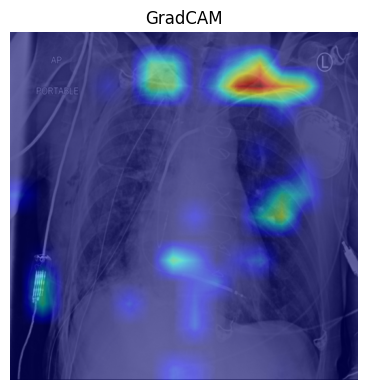

In [ ]:
visualize_cam("80_test_1_.png")

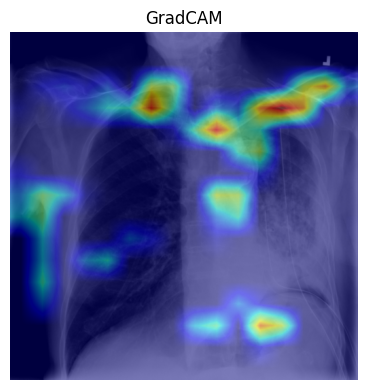

In [ ]:
visualize_cam("0_test_1_.png")

In [ ]:
sampled_images = [
    Path('/content/drive/MyDrive/VIU/TFM/data/pneumothorax/png_images/80_test_1_.png'),
    Path('/content/drive/MyDrive/VIU/TFM/data/pneumothorax/png_images/0_test_1_.png')
]

In [ ]:
sampled_images

[Path('/content/drive/MyDrive/VIU/TFM/data/pneumothorax/png_images/80_test_1_.png'),
 Path('/content/drive/MyDrive/VIU/TFM/data/pneumothorax/png_images/0_test_1_.png')]

In [ ]:
results = average_heatmaps(GradCAM, sampled_images) # image_files

Procesando para promedio: 80_test_1_.png


Predicción: 1
Procesando para promedio: 0_test_1_.png


Predicción: 1


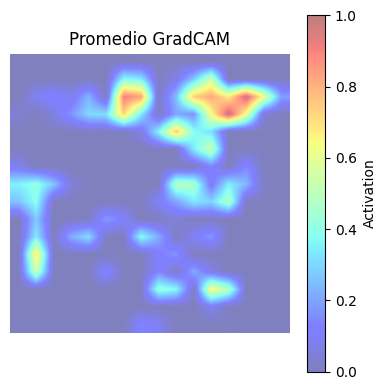

In [ ]:
draw_heatmap(results, "Promedio GradCAM")

#### Calculamos el promedio de GradCAM

##### Verdaderos Positivos

In [ ]:
vp_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="VP")

In [ ]:
len(vp_images)

229

In [ ]:
results = average_heatmaps(GradCAM, vp_images)

Procesando para promedio: 914_test_1_.png


Procesando para promedio: 924_test_1_.png


Procesando para promedio: 920_test_1_.png


Procesando para promedio: 928_test_1_.png


Procesando para promedio: 939_test_1_.png


⚠️ Heatmap inválido para 939_test_1_.png, se omite.
Procesando para promedio: 941_test_1_.png


Procesando para promedio: 94_test_1_.png


Procesando para promedio: 942_test_1_.png


Procesando para promedio: 943_test_1_.png


Procesando para promedio: 938_test_1_.png


Procesando para promedio: 958_test_1_.png


Procesando para promedio: 957_test_1_.png


Procesando para promedio: 972_test_1_.png


Procesando para promedio: 988_test_1_.png


Procesando para promedio: 985_test_1_.png


Procesando para promedio: 990_test_1_.png


Procesando para promedio: 982_test_1_.png


Procesando para promedio: 99_test_1_.png


Procesando para promedio: 846_test_1_.png


Procesando para promedio: 852_test_1_.png


Procesando para promedio: 861_test_1_.png


Procesando para promedio: 858_test_1_.png


Procesando para promedio: 866_test_1_.png


Procesando para promedio: 878_test_1_.png


Procesando para promedio: 877_test_1_.png


Procesando para promedio: 86_test_1_.png


⚠️ Heatmap inválido para 86_test_1_.png, se omite.
Procesando para promedio: 889_test_1_.png


Procesando para promedio: 894_test_1_.png


Procesando para promedio: 891_test_1_.png


Procesando para promedio: 908_test_1_.png


⚠️ Heatmap inválido para 908_test_1_.png, se omite.
Procesando para promedio: 89_test_1_.png


Procesando para promedio: 911_test_1_.png


Procesando para promedio: 90_test_1_.png


⚠️ Heatmap inválido para 90_test_1_.png, se omite.
Procesando para promedio: 913_test_1_.png


Procesando para promedio: 756_test_1_.png


⚠️ Heatmap inválido para 756_test_1_.png, se omite.
Procesando para promedio: 759_test_1_.png


Procesando para promedio: 763_test_1_.png


Procesando para promedio: 76_test_1_.png


Procesando para promedio: 776_test_1_.png


⚠️ Heatmap inválido para 776_test_1_.png, se omite.
Procesando para promedio: 77_test_1_.png


Procesando para promedio: 783_test_1_.png


Procesando para promedio: 785_test_1_.png


⚠️ Heatmap inválido para 785_test_1_.png, se omite.
Procesando para promedio: 7_test_1_.png


Procesando para promedio: 814_test_1_.png


Procesando para promedio: 80_test_1_.png


Procesando para promedio: 821_test_1_.png


Procesando para promedio: 831_test_1_.png


Procesando para promedio: 834_test_1_.png


Procesando para promedio: 826_test_1_.png


⚠️ Heatmap inválido para 826_test_1_.png, se omite.
Procesando para promedio: 823_test_1_.png


⚠️ Heatmap inválido para 823_test_1_.png, se omite.
Procesando para promedio: 670_test_1_.png


⚠️ Heatmap inválido para 670_test_1_.png, se omite.
Procesando para promedio: 6_test_1_.png


Procesando para promedio: 693_test_1_.png


Procesando para promedio: 717_test_1_.png


Procesando para promedio: 713_test_1_.png


⚠️ Heatmap inválido para 713_test_1_.png, se omite.
Procesando para promedio: 718_test_1_.png


Procesando para promedio: 710_test_1_.png


Procesando para promedio: 732_test_1_.png


Procesando para promedio: 722_test_1_.png


Procesando para promedio: 737_test_1_.png


Procesando para promedio: 740_test_1_.png


Procesando para promedio: 745_test_1_.png


Procesando para promedio: 588_test_1_.png


Procesando para promedio: 634_test_1_.png


Procesando para promedio: 630_test_1_.png


⚠️ Heatmap inválido para 630_test_1_.png, se omite.
Procesando para promedio: 605_test_1_.png


Procesando para promedio: 631_test_1_.png


Procesando para promedio: 64_test_1_.png


Procesando para promedio: 654_test_1_.png


Procesando para promedio: 653_test_1_.png


Procesando para promedio: 663_test_1_.png


Procesando para promedio: 665_test_1_.png


Procesando para promedio: 645_test_1_.png


Procesando para promedio: 641_test_1_.png


Procesando para promedio: 656_test_1_.png


Procesando para promedio: 658_test_1_.png


Procesando para promedio: 661_test_1_.png


Procesando para promedio: 667_test_1_.png


Procesando para promedio: 640_test_1_.png


Procesando para promedio: 687_test_1_.png


Procesando para promedio: 512_test_1_.png


Procesando para promedio: 520_test_1_.png


Procesando para promedio: 518_test_1_.png


Procesando para promedio: 553_test_1_.png


Procesando para promedio: 543_test_1_.png


⚠️ Heatmap inválido para 543_test_1_.png, se omite.
Procesando para promedio: 552_test_1_.png


Procesando para promedio: 550_test_1_.png


⚠️ Heatmap inválido para 550_test_1_.png, se omite.
Procesando para promedio: 566_test_1_.png


Procesando para promedio: 572_test_1_.png


Procesando para promedio: 570_test_1_.png


Procesando para promedio: 557_test_1_.png


Procesando para promedio: 558_test_1_.png


Procesando para promedio: 585_test_1_.png


Procesando para promedio: 418_test_1_.png


Procesando para promedio: 424_test_1_.png


Procesando para promedio: 441_test_1_.png


Procesando para promedio: 435_test_1_.png


Procesando para promedio: 445_test_1_.png


Procesando para promedio: 446_test_1_.png


Procesando para promedio: 448_test_1_.png


⚠️ Heatmap inválido para 448_test_1_.png, se omite.
Procesando para promedio: 452_test_1_.png


Procesando para promedio: 449_test_1_.png


Procesando para promedio: 469_test_1_.png


Procesando para promedio: 483_test_1_.png


Procesando para promedio: 476_test_1_.png


Procesando para promedio: 485_test_1_.png


Procesando para promedio: 498_test_1_.png


Procesando para promedio: 500_test_1_.png


Procesando para promedio: 492_test_1_.png


Procesando para promedio: 509_test_1_.png


Procesando para promedio: 495_test_1_.png


Procesando para promedio: 37_test_1_.png


Procesando para promedio: 364_test_1_.png


Procesando para promedio: 378_test_1_.png


Procesando para promedio: 356_test_1_.png


Procesando para promedio: 366_test_1_.png


Procesando para promedio: 385_test_1_.png


Procesando para promedio: 415_test_1_.png


Procesando para promedio: 406_test_1_.png


Procesando para promedio: 387_test_1_.png


⚠️ Heatmap inválido para 387_test_1_.png, se omite.
Procesando para promedio: 392_test_1_.png


Procesando para promedio: 42_test_1_.png


Procesando para promedio: 437_test_1_.png


Procesando para promedio: 432_test_1_.png


Procesando para promedio: 426_test_1_.png


Procesando para promedio: 287_test_1_.png


Procesando para promedio: 290_test_1_.png


Procesando para promedio: 284_test_1_.png


Procesando para promedio: 288_test_1_.png


Procesando para promedio: 266_test_1_.png


Procesando para promedio: 264_test_1_.png


Procesando para promedio: 291_test_1_.png


Procesando para promedio: 301_test_1_.png


Procesando para promedio: 316_test_1_.png


Procesando para promedio: 315_test_1_.png


Procesando para promedio: 336_test_1_.png


Procesando para promedio: 340_test_1_.png


⚠️ Heatmap inválido para 340_test_1_.png, se omite.
Procesando para promedio: 324_test_1_.png


Procesando para promedio: 322_test_1_.png


Procesando para promedio: 341_test_1_.png


Procesando para promedio: 19_test_1_.png


Procesando para promedio: 181_test_1_.png


Procesando para promedio: 193_test_1_.png


Procesando para promedio: 217_test_1_.png


Procesando para promedio: 204_test_1_.png


Procesando para promedio: 218_test_1_.png


Procesando para promedio: 205_test_1_.png


Procesando para promedio: 206_test_1_.png


Procesando para promedio: 223_test_1_.png


Procesando para promedio: 250_test_1_.png


Procesando para promedio: 25_test_1_.png


Procesando para promedio: 242_test_1_.png


Procesando para promedio: 263_test_1_.png


Procesando para promedio: 1195_test_1_.png


Procesando para promedio: 1307_test_1_.png


Procesando para promedio: 1264_test_1_.png


Procesando para promedio: 1291_test_1_.png


Procesando para promedio: 1225_test_1_.png


Procesando para promedio: 1290_test_1_.png


Procesando para promedio: 1221_test_1_.png


Procesando para promedio: 1244_test_1_.png


Procesando para promedio: 1202_test_1_.png


Procesando para promedio: 1294_test_1_.png


Procesando para promedio: 1194_test_1_.png


⚠️ Heatmap inválido para 1194_test_1_.png, se omite.
Procesando para promedio: 1298_test_1_.png


Procesando para promedio: 1249_test_1_.png


Procesando para promedio: 1285_test_1_.png


Procesando para promedio: 1246_test_1_.png


⚠️ Heatmap inválido para 1246_test_1_.png, se omite.
Procesando para promedio: 1314_test_1_.png


Procesando para promedio: 1207_test_1_.png


Procesando para promedio: 1315_test_1_.png


⚠️ Heatmap inválido para 1315_test_1_.png, se omite.
Procesando para promedio: 1220_test_1_.png


Procesando para promedio: 1226_test_1_.png


Procesando para promedio: 1209_test_1_.png


Procesando para promedio: 1312_test_1_.png


Procesando para promedio: 1337_test_1_.png


Procesando para promedio: 146_test_1_.png


Procesando para promedio: 145_test_1_.png


Procesando para promedio: 1348_test_1_.png


Procesando para promedio: 1359_test_1_.png


Procesando para promedio: 1368_test_1_.png


Procesando para promedio: 1326_test_1_.png


⚠️ Heatmap inválido para 1326_test_1_.png, se omite.
Procesando para promedio: 152_test_1_.png


Procesando para promedio: 1319_test_1_.png


Procesando para promedio: 147_test_1_.png


Procesando para promedio: 1332_test_1_.png


Procesando para promedio: 1356_test_1_.png


Procesando para promedio: 1329_test_1_.png


Procesando para promedio: 1335_test_1_.png


Procesando para promedio: 1354_test_1_.png


Procesando para promedio: 1349_test_1_.png


Procesando para promedio: 1327_test_1_.png


Procesando para promedio: 1363_test_1_.png


Procesando para promedio: 1325_test_1_.png


Procesando para promedio: 17_test_1_.png


Procesando para promedio: 174_test_1_.png


⚠️ Heatmap inválido para 174_test_1_.png, se omite.
Procesando para promedio: 160_test_1_.png


⚠️ Heatmap inválido para 160_test_1_.png, se omite.
Procesando para promedio: 153_test_1_.png


Procesando para promedio: 156_test_1_.png


Procesando para promedio: 168_test_1_.png


Procesando para promedio: 184_test_1_.png


Procesando para promedio: 1014_test_1_.png


Procesando para promedio: 1035_test_1_.png


Procesando para promedio: 1057_test_1_.png


Procesando para promedio: 1040_test_1_.png


Procesando para promedio: 1059_test_1_.png


Procesando para promedio: 1044_test_1_.png


Procesando para promedio: 1054_test_1_.png


Procesando para promedio: 1042_test_1_.png


Procesando para promedio: 1058_test_1_.png


Procesando para promedio: 1053_test_1_.png


Procesando para promedio: 1103_test_1_.png


Procesando para promedio: 1084_test_1_.png


Procesando para promedio: 1120_test_1_.png


Procesando para promedio: 1102_test_1_.png


Procesando para promedio: 1151_test_1_.png


Procesando para promedio: 1132_test_1_.png


Procesando para promedio: 1062_test_1_.png


Procesando para promedio: 1141_test_1_.png


Procesando para promedio: 1071_test_1_.png


Procesando para promedio: 111_test_1_.png


Procesando para promedio: 1086_test_1_.png


Procesando para promedio: 1105_test_1_.png


Procesando para promedio: 1154_test_1_.png


Procesando para promedio: 1145_test_1_.png


Procesando para promedio: 1077_test_1_.png


Procesando para promedio: 1069_test_1_.png


Procesando para promedio: 0_test_1_.png


Procesando para promedio: 1007_test_1_.png


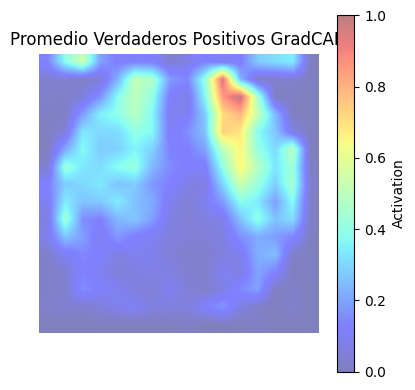

In [ ]:
draw_heatmap(results, "Promedio Verdaderos Positivos GradCAM")

##### Verdaderos Negativos

In [ ]:
vn_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="VN")
len(vn_images)

810

In [ ]:
results = average_heatmaps(GradCAM, vn_images)

Procesando para promedio: 922_test_0_.png


Procesando para promedio: 915_test_0_.png


Procesando para promedio: 925_test_0_.png


Procesando para promedio: 917_test_0_.png


Procesando para promedio: 929_test_0_.png


Procesando para promedio: 92_test_0_.png


Procesando para promedio: 933_test_0_.png


Procesando para promedio: 937_test_0_.png


Procesando para promedio: 930_test_0_.png


Procesando para promedio: 935_test_0_.png


Procesando para promedio: 927_test_0_.png


Procesando para promedio: 945_test_0_.png


Procesando para promedio: 950_test_0_.png


Procesando para promedio: 944_test_0_.png


Procesando para promedio: 951_test_0_.png


Procesando para promedio: 946_test_0_.png


Procesando para promedio: 948_test_0_.png


Procesando para promedio: 93_test_0_.png


Procesando para promedio: 960_test_0_.png


Procesando para promedio: 962_test_0_.png


Procesando para promedio: 954_test_0_.png


Procesando para promedio: 964_test_0_.png


Procesando para promedio: 952_test_0_.png


Procesando para promedio: 95_test_0_.png


Procesando para promedio: 956_test_0_.png


Procesando para promedio: 967_test_0_.png


Procesando para promedio: 959_test_0_.png


Procesando para promedio: 961_test_0_.png


Procesando para promedio: 965_test_0_.png


Procesando para promedio: 974_test_0_.png


Procesando para promedio: 979_test_0_.png


Procesando para promedio: 971_test_0_.png


Procesando para promedio: 975_test_0_.png


Procesando para promedio: 978_test_0_.png


Procesando para promedio: 981_test_0_.png


Procesando para promedio: 968_test_0_.png


Procesando para promedio: 980_test_0_.png


Procesando para promedio: 96_test_0_.png


Procesando para promedio: 97_test_0_.png


Procesando para promedio: 973_test_0_.png


Procesando para promedio: 969_test_0_.png


Procesando para promedio: 970_test_0_.png


Procesando para promedio: 992_test_0_.png


Procesando para promedio: 987_test_0_.png


Procesando para promedio: 991_test_0_.png


Procesando para promedio: 984_test_0_.png


Procesando para promedio: 993_test_0_.png


Procesando para promedio: 983_test_0_.png


Procesando para promedio: 998_test_0_.png


Procesando para promedio: 996_test_0_.png


Procesando para promedio: 994_test_0_.png


Procesando para promedio: 999_test_0_.png


Procesando para promedio: 997_test_0_.png


Procesando para promedio: 995_test_0_.png


Procesando para promedio: 837_test_0_.png


Procesando para promedio: 849_test_0_.png


Procesando para promedio: 851_test_0_.png


Procesando para promedio: 843_test_0_.png


Procesando para promedio: 845_test_0_.png


Procesando para promedio: 836_test_0_.png


Procesando para promedio: 847_test_0_.png


Procesando para promedio: 854_test_0_.png


Procesando para promedio: 855_test_0_.png


Procesando para promedio: 844_test_0_.png


Procesando para promedio: 835_test_0_.png


Procesando para promedio: 85_test_0_.png


Procesando para promedio: 868_test_0_.png


Procesando para promedio: 865_test_0_.png


Procesando para promedio: 859_test_0_.png


Procesando para promedio: 856_test_0_.png


Procesando para promedio: 867_test_0_.png


Procesando para promedio: 862_test_0_.png


Procesando para promedio: 864_test_0_.png


Procesando para promedio: 87_test_0_.png


Procesando para promedio: 882_test_0_.png


Procesando para promedio: 875_test_0_.png


Procesando para promedio: 871_test_0_.png


Procesando para promedio: 876_test_0_.png


Procesando para promedio: 872_test_0_.png


Procesando para promedio: 869_test_0_.png


Procesando para promedio: 874_test_0_.png


Procesando para promedio: 881_test_0_.png


Procesando para promedio: 880_test_0_.png


Procesando para promedio: 873_test_0_.png


Procesando para promedio: 88_test_0_.png


Procesando para promedio: 888_test_0_.png


Procesando para promedio: 892_test_0_.png


Procesando para promedio: 895_test_0_.png


Procesando para promedio: 890_test_0_.png


Procesando para promedio: 885_test_0_.png


Procesando para promedio: 884_test_0_.png


Procesando para promedio: 909_test_0_.png


Procesando para promedio: 899_test_0_.png


Procesando para promedio: 901_test_0_.png


Procesando para promedio: 905_test_0_.png


Procesando para promedio: 902_test_0_.png


Procesando para promedio: 903_test_0_.png


Procesando para promedio: 906_test_0_.png


Procesando para promedio: 898_test_0_.png


Procesando para promedio: 910_test_0_.png


Procesando para promedio: 8_test_0_.png


Procesando para promedio: 904_test_0_.png


Procesando para promedio: 921_test_0_.png


Procesando para promedio: 926_test_0_.png


Procesando para promedio: 923_test_0_.png


Procesando para promedio: 760_test_0_.png


Procesando para promedio: 755_test_0_.png


Procesando para promedio: 751_test_0_.png


Procesando para promedio: 750_test_0_.png


Procesando para promedio: 749_test_0_.png


Procesando para promedio: 752_test_0_.png


Procesando para promedio: 774_test_0_.png


Procesando para promedio: 771_test_0_.png


Procesando para promedio: 764_test_0_.png


Procesando para promedio: 770_test_0_.png


Procesando para promedio: 775_test_0_.png


Procesando para promedio: 773_test_0_.png


Procesando para promedio: 768_test_0_.png


Procesando para promedio: 779_test_0_.png


Procesando para promedio: 778_test_0_.png


Procesando para promedio: 777_test_0_.png


Procesando para promedio: 766_test_0_.png


Procesando para promedio: 769_test_0_.png


Procesando para promedio: 772_test_0_.png


Procesando para promedio: 790_test_0_.png


Procesando para promedio: 788_test_0_.png


Procesando para promedio: 792_test_0_.png


Procesando para promedio: 782_test_0_.png


Procesando para promedio: 795_test_0_.png


Procesando para promedio: 781_test_0_.png


Procesando para promedio: 787_test_0_.png


Procesando para promedio: 793_test_0_.png


Procesando para promedio: 794_test_0_.png


Procesando para promedio: 803_test_0_.png


Procesando para promedio: 800_test_0_.png


Procesando para promedio: 796_test_0_.png


Procesando para promedio: 802_test_0_.png


Procesando para promedio: 807_test_0_.png


Procesando para promedio: 797_test_0_.png


Procesando para promedio: 804_test_0_.png


Procesando para promedio: 798_test_0_.png


Procesando para promedio: 816_test_0_.png


Procesando para promedio: 820_test_0_.png


Procesando para promedio: 809_test_0_.png


Procesando para promedio: 819_test_0_.png


Procesando para promedio: 812_test_0_.png


Procesando para promedio: 811_test_0_.png


Procesando para promedio: 81_test_0_.png


Procesando para promedio: 830_test_0_.png


Procesando para promedio: 825_test_0_.png


Procesando para promedio: 828_test_0_.png


Procesando para promedio: 827_test_0_.png


Procesando para promedio: 824_test_0_.png


Procesando para promedio: 822_test_0_.png


Procesando para promedio: 833_test_0_.png


Procesando para promedio: 829_test_0_.png


Procesando para promedio: 850_test_0_.png


Procesando para promedio: 838_test_0_.png


Procesando para promedio: 67_test_0_.png


Procesando para promedio: 681_test_0_.png


Procesando para promedio: 686_test_0_.png


Procesando para promedio: 683_test_0_.png


Procesando para promedio: 674_test_0_.png


Procesando para promedio: 669_test_0_.png


Procesando para promedio: 680_test_0_.png


Procesando para promedio: 682_test_0_.png


Procesando para promedio: 677_test_0_.png


Procesando para promedio: 689_test_0_.png


Procesando para promedio: 66_test_0_.png


Procesando para promedio: 68_test_0_.png


Procesando para promedio: 678_test_0_.png


Procesando para promedio: 695_test_0_.png


Procesando para promedio: 699_test_0_.png


Procesando para promedio: 691_test_0_.png


Procesando para promedio: 701_test_0_.png


Procesando para promedio: 697_test_0_.png


Procesando para promedio: 692_test_0_.png


Procesando para promedio: 704_test_0_.png


Procesando para promedio: 698_test_0_.png


Procesando para promedio: 69_test_0_.png


Procesando para promedio: 702_test_0_.png


Procesando para promedio: 708_test_0_.png


Procesando para promedio: 716_test_0_.png


Procesando para promedio: 714_test_0_.png


Procesando para promedio: 70_test_0_.png


Procesando para promedio: 709_test_0_.png


Procesando para promedio: 715_test_0_.png


Procesando para promedio: 71_test_0_.png


Procesando para promedio: 728_test_0_.png


Procesando para promedio: 723_test_0_.png


Procesando para promedio: 72_test_0_.png


Procesando para promedio: 730_test_0_.png


Procesando para promedio: 731_test_0_.png


Procesando para promedio: 721_test_0_.png


Procesando para promedio: 733_test_0_.png


Procesando para promedio: 729_test_0_.png


Procesando para promedio: 725_test_0_.png


Procesando para promedio: 727_test_0_.png


Procesando para promedio: 744_test_0_.png


Procesando para promedio: 73_test_0_.png


Procesando para promedio: 743_test_0_.png


Procesando para promedio: 746_test_0_.png


Procesando para promedio: 739_test_0_.png


Procesando para promedio: 736_test_0_.png


Procesando para promedio: 738_test_0_.png


Procesando para promedio: 734_test_0_.png


Procesando para promedio: 735_test_0_.png


Procesando para promedio: 741_test_0_.png


Procesando para promedio: 753_test_0_.png


Procesando para promedio: 754_test_0_.png


Procesando para promedio: 761_test_0_.png


Procesando para promedio: 75_test_0_.png


Procesando para promedio: 762_test_0_.png


Procesando para promedio: 583_test_0_.png


Procesando para promedio: 580_test_0_.png


Procesando para promedio: 587_test_0_.png


Procesando para promedio: 578_test_0_.png


Procesando para promedio: 599_test_0_.png


Procesando para promedio: 622_test_0_.png


Procesando para promedio: 613_test_0_.png


Procesando para promedio: 637_test_0_.png


Procesando para promedio: 606_test_0_.png


Procesando para promedio: 612_test_0_.png


Procesando para promedio: 620_test_0_.png


Procesando para promedio: 611_test_0_.png


Procesando para promedio: 61_test_0_.png


Procesando para promedio: 610_test_0_.png


Procesando para promedio: 638_test_0_.png


Procesando para promedio: 615_test_0_.png


Procesando para promedio: 621_test_0_.png


Procesando para promedio: 625_test_0_.png


Procesando para promedio: 633_test_0_.png


Procesando para promedio: 636_test_0_.png


Procesando para promedio: 635_test_0_.png


Procesando para promedio: 624_test_0_.png


Procesando para promedio: 603_test_0_.png


Procesando para promedio: 604_test_0_.png


Procesando para promedio: 626_test_0_.png


Procesando para promedio: 614_test_0_.png


Procesando para promedio: 618_test_0_.png


Procesando para promedio: 608_test_0_.png


Procesando para promedio: 632_test_0_.png


Procesando para promedio: 609_test_0_.png


Procesando para promedio: 62_test_0_.png


Procesando para promedio: 629_test_0_.png


Procesando para promedio: 649_test_0_.png


Procesando para promedio: 660_test_0_.png


Procesando para promedio: 646_test_0_.png


Procesando para promedio: 652_test_0_.png


Procesando para promedio: 643_test_0_.png


Procesando para promedio: 648_test_0_.png


Procesando para promedio: 666_test_0_.png


Procesando para promedio: 644_test_0_.png


Procesando para promedio: 662_test_0_.png


Procesando para promedio: 642_test_0_.png


Procesando para promedio: 655_test_0_.png


Procesando para promedio: 639_test_0_.png


Procesando para promedio: 65_test_0_.png


Procesando para promedio: 647_test_0_.png


Procesando para promedio: 651_test_0_.png


Procesando para promedio: 650_test_0_.png


Procesando para promedio: 664_test_0_.png


Procesando para promedio: 657_test_0_.png


Procesando para promedio: 673_test_0_.png


Procesando para promedio: 684_test_0_.png


Procesando para promedio: 507_test_0_.png


Procesando para promedio: 510_test_0_.png


Procesando para promedio: 502_test_0_.png


Procesando para promedio: 503_test_0_.png


Procesando para promedio: 511_test_0_.png


Procesando para promedio: 528_test_0_.png


Procesando para promedio: 536_test_0_.png


Procesando para promedio: 515_test_0_.png


Procesando para promedio: 514_test_0_.png


Procesando para promedio: 524_test_0_.png


Procesando para promedio: 533_test_0_.png


Procesando para promedio: 534_test_0_.png


Procesando para promedio: 519_test_0_.png


Procesando para promedio: 535_test_0_.png


Procesando para promedio: 525_test_0_.png


Procesando para promedio: 527_test_0_.png


Procesando para promedio: 532_test_0_.png


Procesando para promedio: 523_test_0_.png


Procesando para promedio: 549_test_0_.png


Procesando para promedio: 545_test_0_.png


Procesando para promedio: 551_test_0_.png


Procesando para promedio: 541_test_0_.png


Procesando para promedio: 538_test_0_.png


Procesando para promedio: 554_test_0_.png


Procesando para promedio: 540_test_0_.png


Procesando para promedio: 546_test_0_.png


Procesando para promedio: 555_test_0_.png


Procesando para promedio: 547_test_0_.png


Procesando para promedio: 539_test_0_.png


Procesando para promedio: 542_test_0_.png


Procesando para promedio: 548_test_0_.png


Procesando para promedio: 556_test_0_.png


Procesando para promedio: 54_test_0_.png


Procesando para promedio: 537_test_0_.png


Procesando para promedio: 571_test_0_.png


Procesando para promedio: 560_test_0_.png


Procesando para promedio: 563_test_0_.png


Procesando para promedio: 573_test_0_.png


Procesando para promedio: 55_test_0_.png


Procesando para promedio: 565_test_0_.png


Procesando para promedio: 559_test_0_.png


Procesando para promedio: 562_test_0_.png


Procesando para promedio: 56_test_0_.png


Procesando para promedio: 561_test_0_.png


Procesando para promedio: 564_test_0_.png


Procesando para promedio: 58_test_0_.png


Procesando para promedio: 584_test_0_.png


Procesando para promedio: 596_test_0_.png


Procesando para promedio: 602_test_0_.png


Procesando para promedio: 577_test_0_.png


Procesando para promedio: 582_test_0_.png


Procesando para promedio: 593_test_0_.png


Procesando para promedio: 601_test_0_.png


Procesando para promedio: 579_test_0_.png


Procesando para promedio: 590_test_0_.png


Procesando para promedio: 581_test_0_.png


Procesando para promedio: 592_test_0_.png


Procesando para promedio: 5_test_0_.png


Procesando para promedio: 575_test_0_.png


Procesando para promedio: 576_test_0_.png


Procesando para promedio: 57_test_0_.png


Procesando para promedio: 43_test_0_.png


Procesando para promedio: 423_test_0_.png


Procesando para promedio: 425_test_0_.png


Procesando para promedio: 442_test_0_.png


Procesando para promedio: 443_test_0_.png


Procesando para promedio: 430_test_0_.png


Procesando para promedio: 444_test_0_.png


Procesando para promedio: 439_test_0_.png


Procesando para promedio: 41_test_0_.png


Procesando para promedio: 422_test_0_.png


Procesando para promedio: 457_test_0_.png


Procesando para promedio: 451_test_0_.png


Procesando para promedio: 459_test_0_.png


Procesando para promedio: 464_test_0_.png


Procesando para promedio: 466_test_0_.png


Procesando para promedio: 460_test_0_.png


Procesando para promedio: 450_test_0_.png


Procesando para promedio: 455_test_0_.png


Procesando para promedio: 463_test_0_.png


Procesando para promedio: 447_test_0_.png


Procesando para promedio: 465_test_0_.png


Procesando para promedio: 454_test_0_.png


Procesando para promedio: 453_test_0_.png


Procesando para promedio: 467_test_0_.png


Procesando para promedio: 461_test_0_.png


Procesando para promedio: 462_test_0_.png


Procesando para promedio: 458_test_0_.png


Procesando para promedio: 45_test_0_.png


Procesando para promedio: 489_test_0_.png


Procesando para promedio: 486_test_0_.png


Procesando para promedio: 478_test_0_.png


Procesando para promedio: 479_test_0_.png


Procesando para promedio: 484_test_0_.png


Procesando para promedio: 46_test_0_.png


Procesando para promedio: 481_test_0_.png


Procesando para promedio: 488_test_0_.png


Procesando para promedio: 480_test_0_.png


Procesando para promedio: 475_test_0_.png


Procesando para promedio: 473_test_0_.png


Procesando para promedio: 482_test_0_.png


Procesando para promedio: 493_test_0_.png


Procesando para promedio: 496_test_0_.png


Procesando para promedio: 494_test_0_.png


Procesando para promedio: 4_test_0_.png


Procesando para promedio: 499_test_0_.png


Procesando para promedio: 501_test_0_.png


Procesando para promedio: 505_test_0_.png


Procesando para promedio: 504_test_0_.png


Procesando para promedio: 508_test_0_.png


Procesando para promedio: 497_test_0_.png


Procesando para promedio: 346_test_0_.png


Procesando para promedio: 352_test_0_.png


Procesando para promedio: 354_test_0_.png


Procesando para promedio: 351_test_0_.png


Procesando para promedio: 34_test_0_.png


Procesando para promedio: 355_test_0_.png


Procesando para promedio: 382_test_0_.png


Procesando para promedio: 381_test_0_.png


Procesando para promedio: 365_test_0_.png


Procesando para promedio: 369_test_0_.png


Procesando para promedio: 360_test_0_.png


Procesando para promedio: 370_test_0_.png


Procesando para promedio: 383_test_0_.png


Procesando para promedio: 368_test_0_.png


Procesando para promedio: 361_test_0_.png


Procesando para promedio: 374_test_0_.png


Procesando para promedio: 359_test_0_.png


Procesando para promedio: 362_test_0_.png


Procesando para promedio: 377_test_0_.png


Procesando para promedio: 357_test_0_.png


Procesando para promedio: 375_test_0_.png


Procesando para promedio: 367_test_0_.png


Procesando para promedio: 384_test_0_.png


Procesando para promedio: 380_test_0_.png


Procesando para promedio: 411_test_0_.png


Procesando para promedio: 391_test_0_.png


Procesando para promedio: 410_test_0_.png


Procesando para promedio: 400_test_0_.png


Procesando para promedio: 403_test_0_.png


Procesando para promedio: 393_test_0_.png


Procesando para promedio: 40_test_0_.png


Procesando para promedio: 414_test_0_.png


Procesando para promedio: 407_test_0_.png


Procesando para promedio: 396_test_0_.png


Procesando para promedio: 412_test_0_.png


Procesando para promedio: 409_test_0_.png


Procesando para promedio: 38_test_0_.png


Procesando para promedio: 402_test_0_.png


Procesando para promedio: 398_test_0_.png


Procesando para promedio: 389_test_0_.png


Procesando para promedio: 405_test_0_.png


Procesando para promedio: 416_test_0_.png


Procesando para promedio: 404_test_0_.png


Procesando para promedio: 413_test_0_.png


Procesando para promedio: 386_test_0_.png


Procesando para promedio: 39_test_0_.png


Procesando para promedio: 390_test_0_.png


Procesando para promedio: 417_test_0_.png


Procesando para promedio: 431_test_0_.png


Procesando para promedio: 421_test_0_.png


Procesando para promedio: 436_test_0_.png


Procesando para promedio: 267_test_0_.png


Procesando para promedio: 283_test_0_.png


Procesando para promedio: 289_test_0_.png


Procesando para promedio: 273_test_0_.png


Procesando para promedio: 269_test_0_.png


Procesando para promedio: 285_test_0_.png


Procesando para promedio: 275_test_0_.png


Procesando para promedio: 268_test_0_.png


Procesando para promedio: 26_test_0_.png


Procesando para promedio: 270_test_0_.png


Procesando para promedio: 280_test_0_.png


Procesando para promedio: 278_test_0_.png


Procesando para promedio: 276_test_0_.png


Procesando para promedio: 277_test_0_.png


Procesando para promedio: 281_test_0_.png


Procesando para promedio: 274_test_0_.png


Procesando para promedio: 286_test_0_.png


Procesando para promedio: 282_test_0_.png


Procesando para promedio: 28_test_0_.png


Procesando para promedio: 27_test_0_.png


Procesando para promedio: 297_test_0_.png


Procesando para promedio: 293_test_0_.png


Procesando para promedio: 292_test_0_.png


Procesando para promedio: 310_test_0_.png


Procesando para promedio: 318_test_0_.png


Procesando para promedio: 298_test_0_.png


Procesando para promedio: 314_test_0_.png


Procesando para promedio: 313_test_0_.png


Procesando para promedio: 307_test_0_.png


Procesando para promedio: 305_test_0_.png


Procesando para promedio: 304_test_0_.png


Procesando para promedio: 2_test_0_.png


Procesando para promedio: 30_test_0_.png


Procesando para promedio: 312_test_0_.png


Procesando para promedio: 300_test_0_.png


Procesando para promedio: 320_test_0_.png


Procesando para promedio: 327_test_0_.png


Procesando para promedio: 321_test_0_.png


Procesando para promedio: 343_test_0_.png


Procesando para promedio: 329_test_0_.png


Procesando para promedio: 342_test_0_.png


Procesando para promedio: 33_test_0_.png


Procesando para promedio: 334_test_0_.png


Procesando para promedio: 338_test_0_.png


Procesando para promedio: 319_test_0_.png


Procesando para promedio: 323_test_0_.png


Procesando para promedio: 32_test_0_.png


Procesando para promedio: 331_test_0_.png


Procesando para promedio: 326_test_0_.png


Procesando para promedio: 345_test_0_.png


Procesando para promedio: 186_test_0_.png


Procesando para promedio: 196_test_0_.png


Procesando para promedio: 191_test_0_.png


Procesando para promedio: 182_test_0_.png


Procesando para promedio: 197_test_0_.png


Procesando para promedio: 180_test_0_.png


Procesando para promedio: 188_test_0_.png


Procesando para promedio: 190_test_0_.png


Procesando para promedio: 183_test_0_.png


Procesando para promedio: 187_test_0_.png


Procesando para promedio: 195_test_0_.png


Procesando para promedio: 201_test_0_.png


Procesando para promedio: 194_test_0_.png


Procesando para promedio: 198_test_0_.png


Procesando para promedio: 189_test_0_.png


Procesando para promedio: 199_test_0_.png


Procesando para promedio: 18_test_0_.png


Procesando para promedio: 21_test_0_.png


Procesando para promedio: 216_test_0_.png


Procesando para promedio: 212_test_0_.png


Procesando para promedio: 207_test_0_.png


Procesando para promedio: 220_test_0_.png


Procesando para promedio: 215_test_0_.png


Procesando para promedio: 209_test_0_.png


Procesando para promedio: 211_test_0_.png


Procesando para promedio: 213_test_0_.png


Procesando para promedio: 214_test_0_.png


Procesando para promedio: 202_test_0_.png


Procesando para promedio: 203_test_0_.png


Procesando para promedio: 20_test_0_.png


Procesando para promedio: 222_test_0_.png


Procesando para promedio: 221_test_0_.png


Procesando para promedio: 22_test_0_.png


Procesando para promedio: 225_test_0_.png


Procesando para promedio: 235_test_0_.png


Procesando para promedio: 227_test_0_.png


Procesando para promedio: 228_test_0_.png


Procesando para promedio: 232_test_0_.png


Procesando para promedio: 229_test_0_.png


Procesando para promedio: 239_test_0_.png


Procesando para promedio: 238_test_0_.png


Procesando para promedio: 237_test_0_.png


Procesando para promedio: 23_test_0_.png


Procesando para promedio: 224_test_0_.png


Procesando para promedio: 231_test_0_.png


Procesando para promedio: 233_test_0_.png


Procesando para promedio: 262_test_0_.png


Procesando para promedio: 248_test_0_.png


Procesando para promedio: 245_test_0_.png


Procesando para promedio: 249_test_0_.png


Procesando para promedio: 251_test_0_.png


Procesando para promedio: 256_test_0_.png


Procesando para promedio: 24_test_0_.png


Procesando para promedio: 259_test_0_.png


Procesando para promedio: 243_test_0_.png


Procesando para promedio: 253_test_0_.png


Procesando para promedio: 246_test_0_.png


Procesando para promedio: 261_test_0_.png


Procesando para promedio: 255_test_0_.png


Procesando para promedio: 257_test_0_.png


Procesando para promedio: 1110_test_0_.png


Procesando para promedio: 116_test_0_.png


Procesando para promedio: 1174_test_0_.png


Procesando para promedio: 1063_test_0_.png


Procesando para promedio: 1146_test_0_.png


Procesando para promedio: 1106_test_0_.png


Procesando para promedio: 1155_test_0_.png


Procesando para promedio: 1128_test_0_.png


Procesando para promedio: 1305_test_0_.png


Procesando para promedio: 1216_test_0_.png


Procesando para promedio: 1284_test_0_.png


Procesando para promedio: 11_test_0_.png


Procesando para promedio: 1272_test_0_.png


Procesando para promedio: 1275_test_0_.png


Procesando para promedio: 1263_test_0_.png


Procesando para promedio: 130_test_0_.png


Procesando para promedio: 1310_test_0_.png


Procesando para promedio: 1274_test_0_.png


Procesando para promedio: 1292_test_0_.png


Procesando para promedio: 1230_test_0_.png


Procesando para promedio: 1233_test_0_.png


Procesando para promedio: 1308_test_0_.png


Procesando para promedio: 1218_test_0_.png


Procesando para promedio: 1311_test_0_.png


Procesando para promedio: 1235_test_0_.png


Procesando para promedio: 12_test_0_.png


Procesando para promedio: 1242_test_0_.png


Procesando para promedio: 1266_test_0_.png


Procesando para promedio: 1282_test_0_.png


Procesando para promedio: 1287_test_0_.png


Procesando para promedio: 1186_test_0_.png


Procesando para promedio: 1252_test_0_.png


Procesando para promedio: 1297_test_0_.png


Procesando para promedio: 1187_test_0_.png


Procesando para promedio: 1260_test_0_.png


Procesando para promedio: 1219_test_0_.png


Procesando para promedio: 1208_test_0_.png


Procesando para promedio: 1259_test_0_.png


Procesando para promedio: 1253_test_0_.png


Procesando para promedio: 1309_test_0_.png


Procesando para promedio: 1182_test_0_.png


Procesando para promedio: 1286_test_0_.png


Procesando para promedio: 1183_test_0_.png


Procesando para promedio: 1306_test_0_.png


Procesando para promedio: 1238_test_0_.png


Procesando para promedio: 1269_test_0_.png


Procesando para promedio: 1277_test_0_.png


Procesando para promedio: 1206_test_0_.png


Procesando para promedio: 1227_test_0_.png


Procesando para promedio: 1223_test_0_.png


Procesando para promedio: 119_test_0_.png


Procesando para promedio: 1200_test_0_.png


Procesando para promedio: 1184_test_0_.png


Procesando para promedio: 1248_test_0_.png


Procesando para promedio: 1302_test_0_.png


Procesando para promedio: 1296_test_0_.png


Procesando para promedio: 126_test_0_.png


Procesando para promedio: 1280_test_0_.png


Procesando para promedio: 1201_test_0_.png


Procesando para promedio: 1228_test_0_.png


Procesando para promedio: 1193_test_0_.png


Procesando para promedio: 1255_test_0_.png


Procesando para promedio: 1197_test_0_.png


Procesando para promedio: 1241_test_0_.png


Procesando para promedio: 1271_test_0_.png


Procesando para promedio: 1185_test_0_.png


Procesando para promedio: 1222_test_0_.png


Procesando para promedio: 120_test_0_.png


Procesando para promedio: 118_test_0_.png


Procesando para promedio: 125_test_0_.png


Procesando para promedio: 1257_test_0_.png


Procesando para promedio: 123_test_0_.png


Procesando para promedio: 1289_test_0_.png


Procesando para promedio: 1217_test_0_.png


Procesando para promedio: 1268_test_0_.png


Procesando para promedio: 1303_test_0_.png


Procesando para promedio: 1196_test_0_.png


Procesando para promedio: 1234_test_0_.png


Procesando para promedio: 1191_test_0_.png


Procesando para promedio: 1236_test_0_.png


Procesando para promedio: 1199_test_0_.png


Procesando para promedio: 1245_test_0_.png


Procesando para promedio: 1283_test_0_.png


Procesando para promedio: 1204_test_0_.png


Procesando para promedio: 128_test_0_.png


Procesando para promedio: 1239_test_0_.png


Procesando para promedio: 1276_test_0_.png


Procesando para promedio: 1301_test_0_.png


Procesando para promedio: 1288_test_0_.png


Procesando para promedio: 1256_test_0_.png


Procesando para promedio: 1210_test_0_.png


Procesando para promedio: 1300_test_0_.png


Procesando para promedio: 1343_test_0_.png


Procesando para promedio: 134_test_0_.png


Procesando para promedio: 144_test_0_.png


Procesando para promedio: 1346_test_0_.png


Procesando para promedio: 1365_test_0_.png


Procesando para promedio: 1318_test_0_.png


Procesando para promedio: 150_test_0_.png


Procesando para promedio: 1371_test_0_.png


Procesando para promedio: 1344_test_0_.png


Procesando para promedio: 135_test_0_.png


Procesando para promedio: 1316_test_0_.png


Procesando para promedio: 1367_test_0_.png


Procesando para promedio: 138_test_0_.png


Procesando para promedio: 1330_test_0_.png


Procesando para promedio: 141_test_0_.png


Procesando para promedio: 1323_test_0_.png


Procesando para promedio: 1364_test_0_.png


Procesando para promedio: 1369_test_0_.png


Procesando para promedio: 1338_test_0_.png


Procesando para promedio: 1366_test_0_.png


Procesando para promedio: 14_test_0_.png


Procesando para promedio: 1353_test_0_.png


Procesando para promedio: 151_test_0_.png


Procesando para promedio: 140_test_0_.png


Procesando para promedio: 132_test_0_.png


Procesando para promedio: 1360_test_0_.png


Procesando para promedio: 1351_test_0_.png


Procesando para promedio: 1361_test_0_.png


Procesando para promedio: 1324_test_0_.png


Procesando para promedio: 1322_test_0_.png


Procesando para promedio: 1340_test_0_.png


Procesando para promedio: 13_test_0_.png


Procesando para promedio: 1352_test_0_.png


Procesando para promedio: 148_test_0_.png


Procesando para promedio: 1362_test_0_.png


Procesando para promedio: 1357_test_0_.png


Procesando para promedio: 143_test_0_.png


Procesando para promedio: 131_test_0_.png


Procesando para promedio: 1321_test_0_.png


Procesando para promedio: 1342_test_0_.png


Procesando para promedio: 1345_test_0_.png


Procesando para promedio: 1358_test_0_.png


Procesando para promedio: 1320_test_0_.png


Procesando para promedio: 159_test_0_.png


Procesando para promedio: 164_test_0_.png


Procesando para promedio: 176_test_0_.png


Procesando para promedio: 158_test_0_.png


Procesando para promedio: 173_test_0_.png


Procesando para promedio: 179_test_0_.png


Procesando para promedio: 15_test_0_.png


Procesando para promedio: 175_test_0_.png


Procesando para promedio: 162_test_0_.png


Procesando para promedio: 155_test_0_.png


Procesando para promedio: 172_test_0_.png


Procesando para promedio: 167_test_0_.png


Procesando para promedio: 166_test_0_.png


Procesando para promedio: 171_test_0_.png


Procesando para promedio: 16_test_0_.png


Procesando para promedio: 157_test_0_.png


Procesando para promedio: 178_test_0_.png


Procesando para promedio: 154_test_0_.png


Procesando para promedio: 200_test_0_.png


Procesando para promedio: 1009_test_0_.png


Procesando para promedio: 1006_test_0_.png


Procesando para promedio: 1003_test_0_.png


Procesando para promedio: 1017_test_0_.png


Procesando para promedio: 100_test_0_.png


Procesando para promedio: 1008_test_0_.png


Procesando para promedio: 1001_test_0_.png


Procesando para promedio: 1013_test_0_.png


Procesando para promedio: 1000_test_0_.png


Procesando para promedio: 1004_test_0_.png


Procesando para promedio: 1026_test_0_.png


Procesando para promedio: 1020_test_0_.png


Procesando para promedio: 1028_test_0_.png


Procesando para promedio: 1019_test_0_.png


Procesando para promedio: 1024_test_0_.png


Procesando para promedio: 1025_test_0_.png


Procesando para promedio: 1030_test_0_.png


Procesando para promedio: 1036_test_0_.png


Procesando para promedio: 1034_test_0_.png


Procesando para promedio: 1032_test_0_.png


Procesando para promedio: 1023_test_0_.png


Procesando para promedio: 1018_test_0_.png


Procesando para promedio: 1045_test_0_.png


Procesando para promedio: 1061_test_0_.png


Procesando para promedio: 103_test_0_.png


Procesando para promedio: 1049_test_0_.png


Procesando para promedio: 1037_test_0_.png


Procesando para promedio: 1051_test_0_.png


Procesando para promedio: 1060_test_0_.png


Procesando para promedio: 1056_test_0_.png


Procesando para promedio: 1038_test_0_.png


Procesando para promedio: 1047_test_0_.png


Procesando para promedio: 1041_test_0_.png


Procesando para promedio: 1050_test_0_.png


Procesando para promedio: 104_test_0_.png


Procesando para promedio: 1055_test_0_.png


Procesando para promedio: 105_test_0_.png


Procesando para promedio: 1048_test_0_.png


Procesando para promedio: 1052_test_0_.png


Procesando para promedio: 1043_test_0_.png


Procesando para promedio: 1148_test_0_.png


Procesando para promedio: 117_test_0_.png


Procesando para promedio: 1134_test_0_.png


Procesando para promedio: 1168_test_0_.png


Procesando para promedio: 1167_test_0_.png


Procesando para promedio: 1119_test_0_.png


Procesando para promedio: 1176_test_0_.png


Procesando para promedio: 1111_test_0_.png


Procesando para promedio: 1147_test_0_.png


Procesando para promedio: 1157_test_0_.png


Procesando para promedio: 1098_test_0_.png


Procesando para promedio: 1161_test_0_.png


Procesando para promedio: 109_test_0_.png


Procesando para promedio: 1065_test_0_.png


Procesando para promedio: 114_test_0_.png


Procesando para promedio: 1171_test_0_.png


Procesando para promedio: 1080_test_0_.png


Procesando para promedio: 1100_test_0_.png


Procesando para promedio: 1142_test_0_.png


Procesando para promedio: 1150_test_0_.png


Procesando para promedio: 1099_test_0_.png


Procesando para promedio: 1127_test_0_.png


Procesando para promedio: 1107_test_0_.png


Procesando para promedio: 1130_test_0_.png


Procesando para promedio: 1173_test_0_.png


Procesando para promedio: 1118_test_0_.png


Procesando para promedio: 1093_test_0_.png


Procesando para promedio: 1079_test_0_.png


Procesando para promedio: 1095_test_0_.png


Procesando para promedio: 1117_test_0_.png


Procesando para promedio: 112_test_0_.png


Procesando para promedio: 1175_test_0_.png


Procesando para promedio: 1164_test_0_.png


Procesando para promedio: 1081_test_0_.png


Procesando para promedio: 1101_test_0_.png


Procesando para promedio: 1070_test_0_.png


Procesando para promedio: 1075_test_0_.png


Procesando para promedio: 10_test_0_.png


Procesando para promedio: 106_test_0_.png


Procesando para promedio: 1165_test_0_.png


Procesando para promedio: 1138_test_0_.png


Procesando para promedio: 1170_test_0_.png


Procesando para promedio: 1136_test_0_.png


Procesando para promedio: 1152_test_0_.png


Procesando para promedio: 1096_test_0_.png


Procesando para promedio: 1121_test_0_.png


Procesando para promedio: 1156_test_0_.png


Procesando para promedio: 1085_test_0_.png


Procesando para promedio: 1074_test_0_.png


Procesando para promedio: 1159_test_0_.png


Procesando para promedio: 107_test_0_.png


Procesando para promedio: 1158_test_0_.png


Procesando para promedio: 1179_test_0_.png


Procesando para promedio: 1068_test_0_.png


Procesando para promedio: 1123_test_0_.png


Procesando para promedio: 1143_test_0_.png


Procesando para promedio: 1066_test_0_.png


Procesando para promedio: 1073_test_0_.png


Procesando para promedio: 1137_test_0_.png


Procesando para promedio: 1126_test_0_.png


Procesando para promedio: 1129_test_0_.png


Procesando para promedio: 1163_test_0_.png


Procesando para promedio: 1116_test_0_.png


Procesando para promedio: 1078_test_0_.png


Procesando para promedio: 1067_test_0_.png


Procesando para promedio: 1162_test_0_.png


Procesando para promedio: 1112_test_0_.png


Procesando para promedio: 1113_test_0_.png


Procesando para promedio: 1144_test_0_.png


Procesando para promedio: 1064_test_0_.png


Procesando para promedio: 113_test_0_.png


Procesando para promedio: 1091_test_0_.png


Procesando para promedio: 1135_test_0_.png


Procesando para promedio: 1124_test_0_.png


Procesando para promedio: 1088_test_0_.png


Procesando para promedio: 1153_test_0_.png


Procesando para promedio: 1133_test_0_.png


Procesando para promedio: 1016_test_0_.png


Procesando para promedio: 1002_test_0_.png


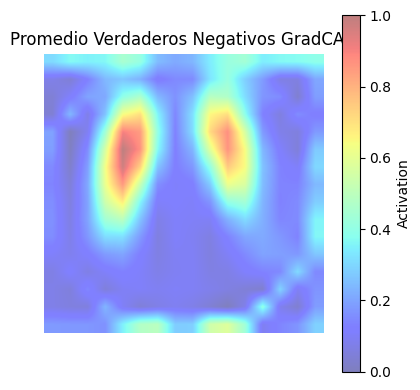

In [ ]:
draw_heatmap(results, "Promedio Verdaderos Negativos GradCAM")

##### Falsos Positivos

In [ ]:
fp_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="FP")
len(fp_images)

272

In [ ]:
results = average_heatmaps(GradCAM, fp_images)

Procesando para promedio: 918_test_0_.png


Procesando para promedio: 91_test_0_.png


Procesando para promedio: 932_test_0_.png


Procesando para promedio: 934_test_0_.png


Procesando para promedio: 936_test_0_.png


⚠️ Heatmap inválido para 936_test_0_.png, se omite.
Procesando para promedio: 931_test_0_.png


Procesando para promedio: 940_test_0_.png


Procesando para promedio: 947_test_0_.png


Procesando para promedio: 955_test_0_.png


⚠️ Heatmap inválido para 955_test_0_.png, se omite.
Procesando para promedio: 953_test_0_.png


Procesando para promedio: 966_test_0_.png


Procesando para promedio: 963_test_0_.png


Procesando para promedio: 976_test_0_.png


Procesando para promedio: 989_test_0_.png


Procesando para promedio: 9_test_0_.png


Procesando para promedio: 842_test_0_.png


Procesando para promedio: 840_test_0_.png


Procesando para promedio: 841_test_0_.png


Procesando para promedio: 853_test_0_.png


Procesando para promedio: 83_test_0_.png


Procesando para promedio: 84_test_0_.png


Procesando para promedio: 848_test_0_.png


Procesando para promedio: 839_test_0_.png


Procesando para promedio: 863_test_0_.png


Procesando para promedio: 857_test_0_.png


Procesando para promedio: 860_test_0_.png


⚠️ Heatmap inválido para 860_test_0_.png, se omite.
Procesando para promedio: 870_test_0_.png


Procesando para promedio: 879_test_0_.png


Procesando para promedio: 887_test_0_.png


Procesando para promedio: 900_test_0_.png


Procesando para promedio: 907_test_0_.png


Procesando para promedio: 897_test_0_.png


Procesando para promedio: 916_test_0_.png


⚠️ Heatmap inválido para 916_test_0_.png, se omite.
Procesando para promedio: 912_test_0_.png


⚠️ Heatmap inválido para 912_test_0_.png, se omite.
Procesando para promedio: 919_test_0_.png


Procesando para promedio: 747_test_0_.png


Procesando para promedio: 748_test_0_.png


⚠️ Heatmap inválido para 748_test_0_.png, se omite.
Procesando para promedio: 765_test_0_.png


Procesando para promedio: 767_test_0_.png


⚠️ Heatmap inválido para 767_test_0_.png, se omite.
Procesando para promedio: 78_test_0_.png


Procesando para promedio: 786_test_0_.png


Procesando para promedio: 789_test_0_.png


Procesando para promedio: 806_test_0_.png


Procesando para promedio: 808_test_0_.png


Procesando para promedio: 805_test_0_.png


Procesando para promedio: 79_test_0_.png


Procesando para promedio: 801_test_0_.png


Procesando para promedio: 799_test_0_.png


Procesando para promedio: 810_test_0_.png


⚠️ Heatmap inválido para 810_test_0_.png, se omite.
Procesando para promedio: 818_test_0_.png


Procesando para promedio: 817_test_0_.png


⚠️ Heatmap inválido para 817_test_0_.png, se omite.
Procesando para promedio: 815_test_0_.png


Procesando para promedio: 82_test_0_.png


Procesando para promedio: 832_test_0_.png


Procesando para promedio: 672_test_0_.png


Procesando para promedio: 688_test_0_.png


Procesando para promedio: 679_test_0_.png


Procesando para promedio: 685_test_0_.png


Procesando para promedio: 690_test_0_.png


Procesando para promedio: 676_test_0_.png


Procesando para promedio: 696_test_0_.png


Procesando para promedio: 706_test_0_.png


⚠️ Heatmap inválido para 706_test_0_.png, se omite.
Procesando para promedio: 700_test_0_.png


Procesando para promedio: 720_test_0_.png


Procesando para promedio: 712_test_0_.png


⚠️ Heatmap inválido para 712_test_0_.png, se omite.
Procesando para promedio: 719_test_0_.png


Procesando para promedio: 711_test_0_.png


Procesando para promedio: 724_test_0_.png


Procesando para promedio: 742_test_0_.png


Procesando para promedio: 757_test_0_.png


Procesando para promedio: 574_test_0_.png


⚠️ Heatmap inválido para 574_test_0_.png, se omite.
Procesando para promedio: 600_test_0_.png


Procesando para promedio: 597_test_0_.png


Procesando para promedio: 617_test_0_.png


Procesando para promedio: 60_test_0_.png


Procesando para promedio: 616_test_0_.png


Procesando para promedio: 619_test_0_.png


⚠️ Heatmap inválido para 619_test_0_.png, se omite.
Procesando para promedio: 627_test_0_.png


Procesando para promedio: 628_test_0_.png


Procesando para promedio: 607_test_0_.png


Procesando para promedio: 659_test_0_.png


Procesando para promedio: 63_test_0_.png


Procesando para promedio: 668_test_0_.png


Procesando para promedio: 675_test_0_.png


Procesando para promedio: 49_test_0_.png


Procesando para promedio: 521_test_0_.png


Procesando para promedio: 522_test_0_.png


Procesando para promedio: 517_test_0_.png


Procesando para promedio: 51_test_0_.png


Procesando para promedio: 52_test_0_.png


⚠️ Heatmap inválido para 52_test_0_.png, se omite.
Procesando para promedio: 513_test_0_.png


Procesando para promedio: 530_test_0_.png


Procesando para promedio: 529_test_0_.png


Procesando para promedio: 516_test_0_.png


Procesando para promedio: 544_test_0_.png


Procesando para promedio: 53_test_0_.png


⚠️ Heatmap inválido para 53_test_0_.png, se omite.
Procesando para promedio: 568_test_0_.png


Procesando para promedio: 567_test_0_.png


Procesando para promedio: 569_test_0_.png


Procesando para promedio: 59_test_0_.png


Procesando para promedio: 591_test_0_.png


Procesando para promedio: 594_test_0_.png


Procesando para promedio: 586_test_0_.png


Procesando para promedio: 589_test_0_.png


⚠️ Heatmap inválido para 589_test_0_.png, se omite.
Procesando para promedio: 429_test_0_.png


Procesando para promedio: 434_test_0_.png


Procesando para promedio: 433_test_0_.png


Procesando para promedio: 438_test_0_.png


Procesando para promedio: 440_test_0_.png


Procesando para promedio: 428_test_0_.png


Procesando para promedio: 44_test_0_.png


Procesando para promedio: 456_test_0_.png


Procesando para promedio: 468_test_0_.png


Procesando para promedio: 471_test_0_.png


Procesando para promedio: 490_test_0_.png


Procesando para promedio: 472_test_0_.png


Procesando para promedio: 470_test_0_.png


Procesando para promedio: 477_test_0_.png


⚠️ Heatmap inválido para 477_test_0_.png, se omite.
Procesando para promedio: 474_test_0_.png


⚠️ Heatmap inválido para 474_test_0_.png, se omite.
Procesando para promedio: 48_test_0_.png


Procesando para promedio: 487_test_0_.png


⚠️ Heatmap inválido para 487_test_0_.png, se omite.
Procesando para promedio: 50_test_0_.png


Procesando para promedio: 348_test_0_.png


Procesando para promedio: 350_test_0_.png


Procesando para promedio: 353_test_0_.png


Procesando para promedio: 349_test_0_.png


Procesando para promedio: 344_test_0_.png


Procesando para promedio: 347_test_0_.png


Procesando para promedio: 373_test_0_.png


Procesando para promedio: 379_test_0_.png


Procesando para promedio: 35_test_0_.png


Procesando para promedio: 358_test_0_.png


Procesando para promedio: 36_test_0_.png


⚠️ Heatmap inválido para 36_test_0_.png, se omite.
Procesando para promedio: 363_test_0_.png


⚠️ Heatmap inválido para 363_test_0_.png, se omite.
Procesando para promedio: 371_test_0_.png


Procesando para promedio: 394_test_0_.png


⚠️ Heatmap inválido para 394_test_0_.png, se omite.
Procesando para promedio: 399_test_0_.png


⚠️ Heatmap inválido para 399_test_0_.png, se omite.
Procesando para promedio: 397_test_0_.png


Procesando para promedio: 408_test_0_.png


Procesando para promedio: 401_test_0_.png


⚠️ Heatmap inválido para 401_test_0_.png, se omite.
Procesando para promedio: 388_test_0_.png


Procesando para promedio: 3_test_0_.png


Procesando para promedio: 395_test_0_.png


Procesando para promedio: 419_test_0_.png


Procesando para promedio: 427_test_0_.png


Procesando para promedio: 420_test_0_.png


Procesando para promedio: 272_test_0_.png


Procesando para promedio: 265_test_0_.png


Procesando para promedio: 271_test_0_.png


Procesando para promedio: 29_test_0_.png


Procesando para promedio: 295_test_0_.png


Procesando para promedio: 303_test_0_.png


Procesando para promedio: 296_test_0_.png


Procesando para promedio: 309_test_0_.png


Procesando para promedio: 306_test_0_.png


⚠️ Heatmap inválido para 306_test_0_.png, se omite.
Procesando para promedio: 308_test_0_.png


Procesando para promedio: 317_test_0_.png


Procesando para promedio: 302_test_0_.png


Procesando para promedio: 311_test_0_.png


Procesando para promedio: 299_test_0_.png


Procesando para promedio: 294_test_0_.png


Procesando para promedio: 339_test_0_.png


Procesando para promedio: 335_test_0_.png


Procesando para promedio: 333_test_0_.png


Procesando para promedio: 332_test_0_.png


Procesando para promedio: 31_test_0_.png


⚠️ Heatmap inválido para 31_test_0_.png, se omite.
Procesando para promedio: 328_test_0_.png


Procesando para promedio: 330_test_0_.png


Procesando para promedio: 1_test_0_.png


Procesando para promedio: 192_test_0_.png


Procesando para promedio: 185_test_0_.png


Procesando para promedio: 208_test_0_.png


Procesando para promedio: 210_test_0_.png


⚠️ Heatmap inválido para 210_test_0_.png, se omite.
Procesando para promedio: 230_test_0_.png


Procesando para promedio: 240_test_0_.png


Procesando para promedio: 234_test_0_.png


Procesando para promedio: 236_test_0_.png


⚠️ Heatmap inválido para 236_test_0_.png, se omite.
Procesando para promedio: 226_test_0_.png


Procesando para promedio: 260_test_0_.png


Procesando para promedio: 258_test_0_.png


⚠️ Heatmap inválido para 258_test_0_.png, se omite.
Procesando para promedio: 241_test_0_.png


Procesando para promedio: 247_test_0_.png


Procesando para promedio: 254_test_0_.png


Procesando para promedio: 244_test_0_.png


Procesando para promedio: 252_test_0_.png


Procesando para promedio: 1180_test_0_.png


Procesando para promedio: 1149_test_0_.png


Procesando para promedio: 1139_test_0_.png


Procesando para promedio: 1172_test_0_.png


Procesando para promedio: 1273_test_0_.png


Procesando para promedio: 1188_test_0_.png


Procesando para promedio: 1281_test_0_.png


Procesando para promedio: 1229_test_0_.png


Procesando para promedio: 1313_test_0_.png


Procesando para promedio: 1261_test_0_.png


Procesando para promedio: 1304_test_0_.png


Procesando para promedio: 1211_test_0_.png


Procesando para promedio: 1295_test_0_.png


Procesando para promedio: 1213_test_0_.png


Procesando para promedio: 1190_test_0_.png


Procesando para promedio: 127_test_0_.png


Procesando para promedio: 1198_test_0_.png


Procesando para promedio: 1243_test_0_.png


Procesando para promedio: 1232_test_0_.png


⚠️ Heatmap inválido para 1232_test_0_.png, se omite.
Procesando para promedio: 1279_test_0_.png


Procesando para promedio: 1270_test_0_.png


Procesando para promedio: 1251_test_0_.png


Procesando para promedio: 122_test_0_.png


Procesando para promedio: 1224_test_0_.png


Procesando para promedio: 121_test_0_.png


Procesando para promedio: 1258_test_0_.png


Procesando para promedio: 1203_test_0_.png


Procesando para promedio: 1262_test_0_.png


⚠️ Heatmap inválido para 1262_test_0_.png, se omite.
Procesando para promedio: 124_test_0_.png


Procesando para promedio: 1214_test_0_.png


Procesando para promedio: 1189_test_0_.png


Procesando para promedio: 1267_test_0_.png


Procesando para promedio: 1237_test_0_.png


Procesando para promedio: 1215_test_0_.png


Procesando para promedio: 1231_test_0_.png


Procesando para promedio: 1265_test_0_.png


⚠️ Heatmap inválido para 1265_test_0_.png, se omite.
Procesando para promedio: 1341_test_0_.png


⚠️ Heatmap inválido para 1341_test_0_.png, se omite.
Procesando para promedio: 1336_test_0_.png


⚠️ Heatmap inválido para 1336_test_0_.png, se omite.
Procesando para promedio: 1331_test_0_.png


Procesando para promedio: 1347_test_0_.png


Procesando para promedio: 133_test_0_.png


Procesando para promedio: 1334_test_0_.png


Procesando para promedio: 139_test_0_.png


⚠️ Heatmap inválido para 139_test_0_.png, se omite.
Procesando para promedio: 137_test_0_.png


⚠️ Heatmap inválido para 137_test_0_.png, se omite.
Procesando para promedio: 1355_test_0_.png


Procesando para promedio: 142_test_0_.png


Procesando para promedio: 1339_test_0_.png


Procesando para promedio: 1350_test_0_.png


⚠️ Heatmap inválido para 1350_test_0_.png, se omite.
Procesando para promedio: 1370_test_0_.png


Procesando para promedio: 1328_test_0_.png


Procesando para promedio: 136_test_0_.png


Procesando para promedio: 149_test_0_.png


Procesando para promedio: 1333_test_0_.png


Procesando para promedio: 163_test_0_.png


Procesando para promedio: 161_test_0_.png


Procesando para promedio: 177_test_0_.png


Procesando para promedio: 169_test_0_.png


⚠️ Heatmap inválido para 169_test_0_.png, se omite.
Procesando para promedio: 165_test_0_.png


Procesando para promedio: 170_test_0_.png


Procesando para promedio: 1015_test_0_.png


Procesando para promedio: 1005_test_0_.png


⚠️ Heatmap inválido para 1005_test_0_.png, se omite.
Procesando para promedio: 1021_test_0_.png


Procesando para promedio: 1022_test_0_.png


Procesando para promedio: 102_test_0_.png


Procesando para promedio: 1039_test_0_.png


⚠️ Heatmap inválido para 1039_test_0_.png, se omite.
Procesando para promedio: 1046_test_0_.png


Procesando para promedio: 1181_test_0_.png


Procesando para promedio: 108_test_0_.png


Procesando para promedio: 1169_test_0_.png


Procesando para promedio: 1097_test_0_.png


Procesando para promedio: 1177_test_0_.png


Procesando para promedio: 1131_test_0_.png


Procesando para promedio: 110_test_0_.png


Procesando para promedio: 1094_test_0_.png


Procesando para promedio: 1087_test_0_.png


Procesando para promedio: 1125_test_0_.png


Procesando para promedio: 1076_test_0_.png


Procesando para promedio: 1140_test_0_.png


Procesando para promedio: 1089_test_0_.png


⚠️ Heatmap inválido para 1089_test_0_.png, se omite.
Procesando para promedio: 1166_test_0_.png


Procesando para promedio: 1072_test_0_.png


Procesando para promedio: 1114_test_0_.png


Procesando para promedio: 1082_test_0_.png


⚠️ Heatmap inválido para 1082_test_0_.png, se omite.
Procesando para promedio: 1104_test_0_.png


Procesando para promedio: 1108_test_0_.png


Procesando para promedio: 1012_test_0_.png


Procesando para promedio: 1011_test_0_.png


⚠️ Heatmap inválido para 1011_test_0_.png, se omite.


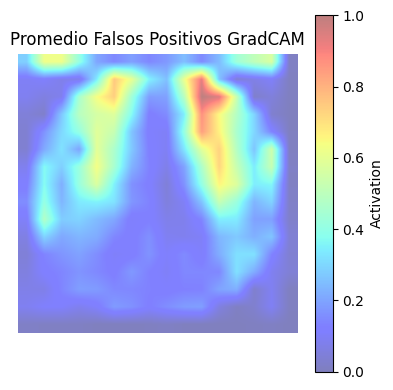

In [ ]:
draw_heatmap(results, "Promedio Falsos Positivos GradCAM")

##### Falsos Negativos

In [ ]:
fn_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="FN")
len(fn_images)

61

In [ ]:
results = average_heatmaps(GradCAM, fn_images)

Procesando para promedio: 949_test_1_.png


Procesando para promedio: 977_test_1_.png


Procesando para promedio: 98_test_1_.png


Procesando para promedio: 986_test_1_.png


Procesando para promedio: 883_test_1_.png


Procesando para promedio: 893_test_1_.png


Procesando para promedio: 886_test_1_.png


Procesando para promedio: 896_test_1_.png


Procesando para promedio: 758_test_1_.png


Procesando para promedio: 784_test_1_.png


Procesando para promedio: 791_test_1_.png


Procesando para promedio: 780_test_1_.png


Procesando para promedio: 813_test_1_.png


Procesando para promedio: 671_test_1_.png


Procesando para promedio: 705_test_1_.png


Procesando para promedio: 707_test_1_.png


Procesando para promedio: 703_test_1_.png


Procesando para promedio: 694_test_1_.png


Procesando para promedio: 726_test_1_.png


Procesando para promedio: 74_test_1_.png


Procesando para promedio: 595_test_1_.png


Procesando para promedio: 623_test_1_.png


Procesando para promedio: 531_test_1_.png


Procesando para promedio: 526_test_1_.png


Procesando para promedio: 598_test_1_.png


Procesando para promedio: 47_test_1_.png


Procesando para promedio: 491_test_1_.png


Procesando para promedio: 506_test_1_.png


Procesando para promedio: 372_test_1_.png


Procesando para promedio: 376_test_1_.png


Procesando para promedio: 279_test_1_.png


Procesando para promedio: 325_test_1_.png


Procesando para promedio: 337_test_1_.png


Procesando para promedio: 219_test_1_.png


Procesando para promedio: 1083_test_1_.png


Procesando para promedio: 1254_test_1_.png


Procesando para promedio: 1299_test_1_.png


Procesando para promedio: 1278_test_1_.png


Procesando para promedio: 1250_test_1_.png


Procesando para promedio: 1247_test_1_.png


Procesando para promedio: 1293_test_1_.png


Procesando para promedio: 1212_test_1_.png


Procesando para promedio: 129_test_1_.png


Procesando para promedio: 1240_test_1_.png


Procesando para promedio: 1205_test_1_.png


Procesando para promedio: 1192_test_1_.png


Procesando para promedio: 1317_test_1_.png


Procesando para promedio: 1029_test_1_.png


Procesando para promedio: 1033_test_1_.png


Procesando para promedio: 1027_test_1_.png


Procesando para promedio: 1031_test_1_.png


Procesando para promedio: 101_test_1_.png


Procesando para promedio: 1109_test_1_.png


Procesando para promedio: 115_test_1_.png


Procesando para promedio: 1092_test_1_.png


Procesando para promedio: 1178_test_1_.png


Procesando para promedio: 1115_test_1_.png


Procesando para promedio: 1160_test_1_.png


Procesando para promedio: 1090_test_1_.png


Procesando para promedio: 1122_test_1_.png


Procesando para promedio: 1010_test_1_.png


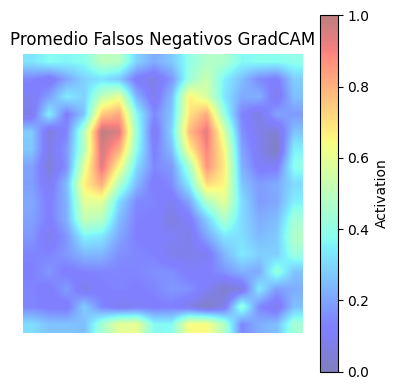

In [ ]:
draw_heatmap(results, "Promedio Falsos Negativos GradCAM")

#### Calculamos el promedio de GradCAM++

##### Verdaderos Positivos

In [ ]:
vp_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="VP")
len(vp_images)

229

In [ ]:
results = average_heatmaps(GradCAMPlusPlus, vp_images)

Procesando para promedio: 914_test_1_.png


Procesando para promedio: 924_test_1_.png


Procesando para promedio: 920_test_1_.png


Procesando para promedio: 928_test_1_.png


Procesando para promedio: 939_test_1_.png


Procesando para promedio: 941_test_1_.png


Procesando para promedio: 94_test_1_.png


Procesando para promedio: 942_test_1_.png


Procesando para promedio: 943_test_1_.png


Procesando para promedio: 938_test_1_.png


Procesando para promedio: 958_test_1_.png


Procesando para promedio: 957_test_1_.png


Procesando para promedio: 972_test_1_.png


Procesando para promedio: 988_test_1_.png


Procesando para promedio: 985_test_1_.png


Procesando para promedio: 990_test_1_.png


Procesando para promedio: 982_test_1_.png


Procesando para promedio: 99_test_1_.png


Procesando para promedio: 846_test_1_.png


Procesando para promedio: 852_test_1_.png


Procesando para promedio: 861_test_1_.png


Procesando para promedio: 858_test_1_.png


Procesando para promedio: 866_test_1_.png


Procesando para promedio: 878_test_1_.png


Procesando para promedio: 877_test_1_.png


Procesando para promedio: 86_test_1_.png


Procesando para promedio: 889_test_1_.png


Procesando para promedio: 894_test_1_.png


Procesando para promedio: 891_test_1_.png


Procesando para promedio: 908_test_1_.png


Procesando para promedio: 89_test_1_.png


Procesando para promedio: 911_test_1_.png


Procesando para promedio: 90_test_1_.png


Procesando para promedio: 913_test_1_.png


Procesando para promedio: 756_test_1_.png


Procesando para promedio: 759_test_1_.png


Procesando para promedio: 763_test_1_.png


Procesando para promedio: 76_test_1_.png


Procesando para promedio: 776_test_1_.png


Procesando para promedio: 77_test_1_.png


Procesando para promedio: 783_test_1_.png


Procesando para promedio: 785_test_1_.png


Procesando para promedio: 7_test_1_.png


Procesando para promedio: 814_test_1_.png


Procesando para promedio: 80_test_1_.png


Procesando para promedio: 821_test_1_.png


Procesando para promedio: 831_test_1_.png


Procesando para promedio: 834_test_1_.png


Procesando para promedio: 826_test_1_.png


Procesando para promedio: 823_test_1_.png


Procesando para promedio: 670_test_1_.png


Procesando para promedio: 6_test_1_.png


Procesando para promedio: 693_test_1_.png


Procesando para promedio: 717_test_1_.png


Procesando para promedio: 713_test_1_.png


Procesando para promedio: 718_test_1_.png


Procesando para promedio: 710_test_1_.png


Procesando para promedio: 732_test_1_.png


Procesando para promedio: 722_test_1_.png


Procesando para promedio: 737_test_1_.png


Procesando para promedio: 740_test_1_.png


Procesando para promedio: 745_test_1_.png


Procesando para promedio: 588_test_1_.png


Procesando para promedio: 634_test_1_.png


Procesando para promedio: 630_test_1_.png


Procesando para promedio: 605_test_1_.png


Procesando para promedio: 631_test_1_.png


Procesando para promedio: 64_test_1_.png


Procesando para promedio: 654_test_1_.png


Procesando para promedio: 653_test_1_.png


Procesando para promedio: 663_test_1_.png


Procesando para promedio: 665_test_1_.png


Procesando para promedio: 645_test_1_.png


Procesando para promedio: 641_test_1_.png


Procesando para promedio: 656_test_1_.png


Procesando para promedio: 658_test_1_.png


Procesando para promedio: 661_test_1_.png


Procesando para promedio: 667_test_1_.png


Procesando para promedio: 640_test_1_.png


Procesando para promedio: 687_test_1_.png


Procesando para promedio: 512_test_1_.png


Procesando para promedio: 520_test_1_.png


Procesando para promedio: 518_test_1_.png


Procesando para promedio: 553_test_1_.png


Procesando para promedio: 543_test_1_.png


Procesando para promedio: 552_test_1_.png


Procesando para promedio: 550_test_1_.png


Procesando para promedio: 566_test_1_.png


Procesando para promedio: 572_test_1_.png


Procesando para promedio: 570_test_1_.png


Procesando para promedio: 557_test_1_.png


Procesando para promedio: 558_test_1_.png


Procesando para promedio: 585_test_1_.png


Procesando para promedio: 418_test_1_.png


Procesando para promedio: 424_test_1_.png


Procesando para promedio: 441_test_1_.png


Procesando para promedio: 435_test_1_.png


Procesando para promedio: 445_test_1_.png


Procesando para promedio: 446_test_1_.png


Procesando para promedio: 448_test_1_.png


Procesando para promedio: 452_test_1_.png


Procesando para promedio: 449_test_1_.png


Procesando para promedio: 469_test_1_.png


Procesando para promedio: 483_test_1_.png


Procesando para promedio: 476_test_1_.png


Procesando para promedio: 485_test_1_.png


Procesando para promedio: 498_test_1_.png


Procesando para promedio: 500_test_1_.png


Procesando para promedio: 492_test_1_.png


Procesando para promedio: 509_test_1_.png


Procesando para promedio: 495_test_1_.png


Procesando para promedio: 37_test_1_.png


Procesando para promedio: 364_test_1_.png


Procesando para promedio: 378_test_1_.png


Procesando para promedio: 356_test_1_.png


Procesando para promedio: 366_test_1_.png


Procesando para promedio: 385_test_1_.png


Procesando para promedio: 415_test_1_.png


Procesando para promedio: 406_test_1_.png


Procesando para promedio: 387_test_1_.png


Procesando para promedio: 392_test_1_.png


Procesando para promedio: 42_test_1_.png


Procesando para promedio: 437_test_1_.png


Procesando para promedio: 432_test_1_.png


Procesando para promedio: 426_test_1_.png


Procesando para promedio: 287_test_1_.png


Procesando para promedio: 290_test_1_.png


Procesando para promedio: 284_test_1_.png


Procesando para promedio: 288_test_1_.png


Procesando para promedio: 266_test_1_.png


Procesando para promedio: 264_test_1_.png


Procesando para promedio: 291_test_1_.png


Procesando para promedio: 301_test_1_.png


Procesando para promedio: 316_test_1_.png


Procesando para promedio: 315_test_1_.png


Procesando para promedio: 336_test_1_.png


Procesando para promedio: 340_test_1_.png


Procesando para promedio: 324_test_1_.png


Procesando para promedio: 322_test_1_.png


Procesando para promedio: 341_test_1_.png


Procesando para promedio: 19_test_1_.png


Procesando para promedio: 181_test_1_.png


Procesando para promedio: 193_test_1_.png


Procesando para promedio: 217_test_1_.png


Procesando para promedio: 204_test_1_.png


Procesando para promedio: 218_test_1_.png


Procesando para promedio: 205_test_1_.png


Procesando para promedio: 206_test_1_.png


Procesando para promedio: 223_test_1_.png


Procesando para promedio: 250_test_1_.png


Procesando para promedio: 25_test_1_.png


Procesando para promedio: 242_test_1_.png


Procesando para promedio: 263_test_1_.png


Procesando para promedio: 1195_test_1_.png


Procesando para promedio: 1307_test_1_.png


Procesando para promedio: 1264_test_1_.png


Procesando para promedio: 1291_test_1_.png


Procesando para promedio: 1225_test_1_.png


Procesando para promedio: 1290_test_1_.png


Procesando para promedio: 1221_test_1_.png


Procesando para promedio: 1244_test_1_.png


Procesando para promedio: 1202_test_1_.png


Procesando para promedio: 1294_test_1_.png


Procesando para promedio: 1194_test_1_.png


Procesando para promedio: 1298_test_1_.png


Procesando para promedio: 1249_test_1_.png


Procesando para promedio: 1285_test_1_.png


Procesando para promedio: 1246_test_1_.png


Procesando para promedio: 1314_test_1_.png


Procesando para promedio: 1207_test_1_.png


Procesando para promedio: 1315_test_1_.png


Procesando para promedio: 1220_test_1_.png


Procesando para promedio: 1226_test_1_.png


Procesando para promedio: 1209_test_1_.png


Procesando para promedio: 1312_test_1_.png


Procesando para promedio: 1337_test_1_.png


Procesando para promedio: 146_test_1_.png


Procesando para promedio: 145_test_1_.png


Procesando para promedio: 1348_test_1_.png


Procesando para promedio: 1359_test_1_.png


Procesando para promedio: 1368_test_1_.png


Procesando para promedio: 1326_test_1_.png


Procesando para promedio: 152_test_1_.png


Procesando para promedio: 1319_test_1_.png


Procesando para promedio: 147_test_1_.png


Procesando para promedio: 1332_test_1_.png


Procesando para promedio: 1356_test_1_.png


Procesando para promedio: 1329_test_1_.png


Procesando para promedio: 1335_test_1_.png


Procesando para promedio: 1354_test_1_.png


Procesando para promedio: 1349_test_1_.png


Procesando para promedio: 1327_test_1_.png


Procesando para promedio: 1363_test_1_.png


Procesando para promedio: 1325_test_1_.png


Procesando para promedio: 17_test_1_.png


Procesando para promedio: 174_test_1_.png


Procesando para promedio: 160_test_1_.png


Procesando para promedio: 153_test_1_.png


Procesando para promedio: 156_test_1_.png


Procesando para promedio: 168_test_1_.png


Procesando para promedio: 184_test_1_.png


Procesando para promedio: 1014_test_1_.png


Procesando para promedio: 1035_test_1_.png


Procesando para promedio: 1057_test_1_.png


Procesando para promedio: 1040_test_1_.png


Procesando para promedio: 1059_test_1_.png


Procesando para promedio: 1044_test_1_.png


Procesando para promedio: 1054_test_1_.png


Procesando para promedio: 1042_test_1_.png


Procesando para promedio: 1058_test_1_.png


Procesando para promedio: 1053_test_1_.png


Procesando para promedio: 1103_test_1_.png


Procesando para promedio: 1084_test_1_.png


Procesando para promedio: 1120_test_1_.png


Procesando para promedio: 1102_test_1_.png


Procesando para promedio: 1151_test_1_.png


Procesando para promedio: 1132_test_1_.png


Procesando para promedio: 1062_test_1_.png


Procesando para promedio: 1141_test_1_.png


Procesando para promedio: 1071_test_1_.png


Procesando para promedio: 111_test_1_.png


Procesando para promedio: 1086_test_1_.png


Procesando para promedio: 1105_test_1_.png


Procesando para promedio: 1154_test_1_.png


Procesando para promedio: 1145_test_1_.png


Procesando para promedio: 1077_test_1_.png


Procesando para promedio: 1069_test_1_.png


Procesando para promedio: 0_test_1_.png


Procesando para promedio: 1007_test_1_.png


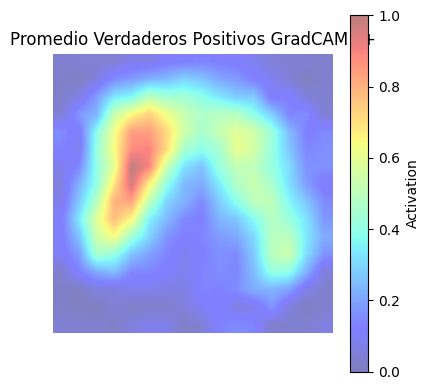

In [ ]:
draw_heatmap(results, "Promedio Verdaderos Positivos GradCAM++")

##### Verdaderos Negativos

In [ ]:
vn_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="VN")
len(vn_images)

810

In [ ]:
results = average_heatmaps(GradCAMPlusPlus, vn_images)

Procesando para promedio: 922_test_0_.png


Procesando para promedio: 915_test_0_.png


Procesando para promedio: 925_test_0_.png


Procesando para promedio: 917_test_0_.png


Procesando para promedio: 929_test_0_.png


Procesando para promedio: 92_test_0_.png


Procesando para promedio: 933_test_0_.png


Procesando para promedio: 937_test_0_.png


Procesando para promedio: 930_test_0_.png


Procesando para promedio: 935_test_0_.png


Procesando para promedio: 927_test_0_.png


Procesando para promedio: 945_test_0_.png


Procesando para promedio: 950_test_0_.png


Procesando para promedio: 944_test_0_.png


Procesando para promedio: 951_test_0_.png


Procesando para promedio: 946_test_0_.png


Procesando para promedio: 948_test_0_.png


⚠️ Heatmap inválido para 948_test_0_.png, se omite.
Procesando para promedio: 93_test_0_.png


Procesando para promedio: 960_test_0_.png


Procesando para promedio: 962_test_0_.png


Procesando para promedio: 954_test_0_.png


Procesando para promedio: 964_test_0_.png


Procesando para promedio: 952_test_0_.png


Procesando para promedio: 95_test_0_.png


Procesando para promedio: 956_test_0_.png


Procesando para promedio: 967_test_0_.png


Procesando para promedio: 959_test_0_.png


Procesando para promedio: 961_test_0_.png


Procesando para promedio: 965_test_0_.png


Procesando para promedio: 974_test_0_.png


Procesando para promedio: 979_test_0_.png


Procesando para promedio: 971_test_0_.png


Procesando para promedio: 975_test_0_.png


Procesando para promedio: 978_test_0_.png


Procesando para promedio: 981_test_0_.png


Procesando para promedio: 968_test_0_.png


Procesando para promedio: 980_test_0_.png


Procesando para promedio: 96_test_0_.png


Procesando para promedio: 97_test_0_.png


Procesando para promedio: 973_test_0_.png


Procesando para promedio: 969_test_0_.png


Procesando para promedio: 970_test_0_.png


Procesando para promedio: 992_test_0_.png


Procesando para promedio: 987_test_0_.png


Procesando para promedio: 991_test_0_.png


Procesando para promedio: 984_test_0_.png


Procesando para promedio: 993_test_0_.png


Procesando para promedio: 983_test_0_.png


Procesando para promedio: 998_test_0_.png


Procesando para promedio: 996_test_0_.png


Procesando para promedio: 994_test_0_.png


Procesando para promedio: 999_test_0_.png


Procesando para promedio: 997_test_0_.png


Procesando para promedio: 995_test_0_.png


Procesando para promedio: 837_test_0_.png


Procesando para promedio: 849_test_0_.png


Procesando para promedio: 851_test_0_.png


Procesando para promedio: 843_test_0_.png


Procesando para promedio: 845_test_0_.png


Procesando para promedio: 836_test_0_.png


Procesando para promedio: 847_test_0_.png


Procesando para promedio: 854_test_0_.png


⚠️ Heatmap inválido para 854_test_0_.png, se omite.
Procesando para promedio: 855_test_0_.png


Procesando para promedio: 844_test_0_.png


Procesando para promedio: 835_test_0_.png


Procesando para promedio: 85_test_0_.png


Procesando para promedio: 868_test_0_.png


Procesando para promedio: 865_test_0_.png


Procesando para promedio: 859_test_0_.png


Procesando para promedio: 856_test_0_.png


Procesando para promedio: 867_test_0_.png


Procesando para promedio: 862_test_0_.png


Procesando para promedio: 864_test_0_.png


Procesando para promedio: 87_test_0_.png


Procesando para promedio: 882_test_0_.png


Procesando para promedio: 875_test_0_.png


Procesando para promedio: 871_test_0_.png


Procesando para promedio: 876_test_0_.png


Procesando para promedio: 872_test_0_.png


Procesando para promedio: 869_test_0_.png


Procesando para promedio: 874_test_0_.png


Procesando para promedio: 881_test_0_.png


Procesando para promedio: 880_test_0_.png


Procesando para promedio: 873_test_0_.png


Procesando para promedio: 88_test_0_.png


Procesando para promedio: 888_test_0_.png


Procesando para promedio: 892_test_0_.png


Procesando para promedio: 895_test_0_.png


Procesando para promedio: 890_test_0_.png


Procesando para promedio: 885_test_0_.png


Procesando para promedio: 884_test_0_.png


Procesando para promedio: 909_test_0_.png


Procesando para promedio: 899_test_0_.png


Procesando para promedio: 901_test_0_.png


Procesando para promedio: 905_test_0_.png


Procesando para promedio: 902_test_0_.png


Procesando para promedio: 903_test_0_.png


Procesando para promedio: 906_test_0_.png


Procesando para promedio: 898_test_0_.png


Procesando para promedio: 910_test_0_.png


Procesando para promedio: 8_test_0_.png


Procesando para promedio: 904_test_0_.png


Procesando para promedio: 921_test_0_.png


Procesando para promedio: 926_test_0_.png


Procesando para promedio: 923_test_0_.png


Procesando para promedio: 760_test_0_.png


Procesando para promedio: 755_test_0_.png


Procesando para promedio: 751_test_0_.png


Procesando para promedio: 750_test_0_.png


Procesando para promedio: 749_test_0_.png


Procesando para promedio: 752_test_0_.png


Procesando para promedio: 774_test_0_.png


Procesando para promedio: 771_test_0_.png


Procesando para promedio: 764_test_0_.png


Procesando para promedio: 770_test_0_.png


Procesando para promedio: 775_test_0_.png


Procesando para promedio: 773_test_0_.png


Procesando para promedio: 768_test_0_.png


Procesando para promedio: 779_test_0_.png


Procesando para promedio: 778_test_0_.png


Procesando para promedio: 777_test_0_.png


⚠️ Heatmap inválido para 777_test_0_.png, se omite.
Procesando para promedio: 766_test_0_.png


Procesando para promedio: 769_test_0_.png


Procesando para promedio: 772_test_0_.png


Procesando para promedio: 790_test_0_.png


Procesando para promedio: 788_test_0_.png


Procesando para promedio: 792_test_0_.png


Procesando para promedio: 782_test_0_.png


Procesando para promedio: 795_test_0_.png


Procesando para promedio: 781_test_0_.png


Procesando para promedio: 787_test_0_.png


Procesando para promedio: 793_test_0_.png


Procesando para promedio: 794_test_0_.png


Procesando para promedio: 803_test_0_.png


Procesando para promedio: 800_test_0_.png


Procesando para promedio: 796_test_0_.png


Procesando para promedio: 802_test_0_.png


Procesando para promedio: 807_test_0_.png


Procesando para promedio: 797_test_0_.png


Procesando para promedio: 804_test_0_.png


Procesando para promedio: 798_test_0_.png


Procesando para promedio: 816_test_0_.png


Procesando para promedio: 820_test_0_.png


Procesando para promedio: 809_test_0_.png


Procesando para promedio: 819_test_0_.png


Procesando para promedio: 812_test_0_.png


Procesando para promedio: 811_test_0_.png


Procesando para promedio: 81_test_0_.png


Procesando para promedio: 830_test_0_.png


Procesando para promedio: 825_test_0_.png


Procesando para promedio: 828_test_0_.png


Procesando para promedio: 827_test_0_.png


Procesando para promedio: 824_test_0_.png


Procesando para promedio: 822_test_0_.png


Procesando para promedio: 833_test_0_.png


Procesando para promedio: 829_test_0_.png


Procesando para promedio: 850_test_0_.png


Procesando para promedio: 838_test_0_.png


Procesando para promedio: 67_test_0_.png


Procesando para promedio: 681_test_0_.png


Procesando para promedio: 686_test_0_.png


Procesando para promedio: 683_test_0_.png


Procesando para promedio: 674_test_0_.png


Procesando para promedio: 669_test_0_.png


Procesando para promedio: 680_test_0_.png


Procesando para promedio: 682_test_0_.png


Procesando para promedio: 677_test_0_.png


Procesando para promedio: 689_test_0_.png


Procesando para promedio: 66_test_0_.png


Procesando para promedio: 68_test_0_.png


Procesando para promedio: 678_test_0_.png


Procesando para promedio: 695_test_0_.png


Procesando para promedio: 699_test_0_.png


Procesando para promedio: 691_test_0_.png


Procesando para promedio: 701_test_0_.png


Procesando para promedio: 697_test_0_.png


Procesando para promedio: 692_test_0_.png


Procesando para promedio: 704_test_0_.png


Procesando para promedio: 698_test_0_.png


Procesando para promedio: 69_test_0_.png


Procesando para promedio: 702_test_0_.png


Procesando para promedio: 708_test_0_.png


Procesando para promedio: 716_test_0_.png


Procesando para promedio: 714_test_0_.png


Procesando para promedio: 70_test_0_.png


Procesando para promedio: 709_test_0_.png


Procesando para promedio: 715_test_0_.png


Procesando para promedio: 71_test_0_.png


Procesando para promedio: 728_test_0_.png


Procesando para promedio: 723_test_0_.png


Procesando para promedio: 72_test_0_.png


Procesando para promedio: 730_test_0_.png


Procesando para promedio: 731_test_0_.png


Procesando para promedio: 721_test_0_.png


Procesando para promedio: 733_test_0_.png


Procesando para promedio: 729_test_0_.png


Procesando para promedio: 725_test_0_.png


Procesando para promedio: 727_test_0_.png


Procesando para promedio: 744_test_0_.png


Procesando para promedio: 73_test_0_.png


Procesando para promedio: 743_test_0_.png


Procesando para promedio: 746_test_0_.png


Procesando para promedio: 739_test_0_.png


Procesando para promedio: 736_test_0_.png


Procesando para promedio: 738_test_0_.png


Procesando para promedio: 734_test_0_.png


Procesando para promedio: 735_test_0_.png


Procesando para promedio: 741_test_0_.png


Procesando para promedio: 753_test_0_.png


Procesando para promedio: 754_test_0_.png


Procesando para promedio: 761_test_0_.png


Procesando para promedio: 75_test_0_.png


Procesando para promedio: 762_test_0_.png


Procesando para promedio: 583_test_0_.png


Procesando para promedio: 580_test_0_.png


Procesando para promedio: 587_test_0_.png


Procesando para promedio: 578_test_0_.png


Procesando para promedio: 599_test_0_.png


Procesando para promedio: 622_test_0_.png


Procesando para promedio: 613_test_0_.png


Procesando para promedio: 637_test_0_.png


Procesando para promedio: 606_test_0_.png


Procesando para promedio: 612_test_0_.png


Procesando para promedio: 620_test_0_.png


Procesando para promedio: 611_test_0_.png


Procesando para promedio: 61_test_0_.png


Procesando para promedio: 610_test_0_.png


Procesando para promedio: 638_test_0_.png


Procesando para promedio: 615_test_0_.png


Procesando para promedio: 621_test_0_.png


Procesando para promedio: 625_test_0_.png


Procesando para promedio: 633_test_0_.png


Procesando para promedio: 636_test_0_.png


Procesando para promedio: 635_test_0_.png


Procesando para promedio: 624_test_0_.png


Procesando para promedio: 603_test_0_.png


Procesando para promedio: 604_test_0_.png


Procesando para promedio: 626_test_0_.png


Procesando para promedio: 614_test_0_.png


Procesando para promedio: 618_test_0_.png


Procesando para promedio: 608_test_0_.png


Procesando para promedio: 632_test_0_.png


Procesando para promedio: 609_test_0_.png


Procesando para promedio: 62_test_0_.png


Procesando para promedio: 629_test_0_.png


Procesando para promedio: 649_test_0_.png


Procesando para promedio: 660_test_0_.png


Procesando para promedio: 646_test_0_.png


Procesando para promedio: 652_test_0_.png


Procesando para promedio: 643_test_0_.png


Procesando para promedio: 648_test_0_.png


Procesando para promedio: 666_test_0_.png


Procesando para promedio: 644_test_0_.png


Procesando para promedio: 662_test_0_.png


Procesando para promedio: 642_test_0_.png


Procesando para promedio: 655_test_0_.png


Procesando para promedio: 639_test_0_.png


Procesando para promedio: 65_test_0_.png


Procesando para promedio: 647_test_0_.png


Procesando para promedio: 651_test_0_.png


Procesando para promedio: 650_test_0_.png


Procesando para promedio: 664_test_0_.png


Procesando para promedio: 657_test_0_.png


Procesando para promedio: 673_test_0_.png


Procesando para promedio: 684_test_0_.png


Procesando para promedio: 507_test_0_.png


Procesando para promedio: 510_test_0_.png


Procesando para promedio: 502_test_0_.png


Procesando para promedio: 503_test_0_.png


Procesando para promedio: 511_test_0_.png


Procesando para promedio: 528_test_0_.png


Procesando para promedio: 536_test_0_.png


Procesando para promedio: 515_test_0_.png


Procesando para promedio: 514_test_0_.png


Procesando para promedio: 524_test_0_.png


Procesando para promedio: 533_test_0_.png


Procesando para promedio: 534_test_0_.png


Procesando para promedio: 519_test_0_.png


Procesando para promedio: 535_test_0_.png


Procesando para promedio: 525_test_0_.png


Procesando para promedio: 527_test_0_.png


Procesando para promedio: 532_test_0_.png


Procesando para promedio: 523_test_0_.png


Procesando para promedio: 549_test_0_.png


Procesando para promedio: 545_test_0_.png


Procesando para promedio: 551_test_0_.png


Procesando para promedio: 541_test_0_.png


Procesando para promedio: 538_test_0_.png


Procesando para promedio: 554_test_0_.png


Procesando para promedio: 540_test_0_.png


Procesando para promedio: 546_test_0_.png


Procesando para promedio: 555_test_0_.png


Procesando para promedio: 547_test_0_.png


Procesando para promedio: 539_test_0_.png


Procesando para promedio: 542_test_0_.png


Procesando para promedio: 548_test_0_.png


Procesando para promedio: 556_test_0_.png


Procesando para promedio: 54_test_0_.png


Procesando para promedio: 537_test_0_.png


Procesando para promedio: 571_test_0_.png


Procesando para promedio: 560_test_0_.png


Procesando para promedio: 563_test_0_.png


Procesando para promedio: 573_test_0_.png


Procesando para promedio: 55_test_0_.png


Procesando para promedio: 565_test_0_.png


Procesando para promedio: 559_test_0_.png


Procesando para promedio: 562_test_0_.png


Procesando para promedio: 56_test_0_.png


Procesando para promedio: 561_test_0_.png


Procesando para promedio: 564_test_0_.png


Procesando para promedio: 58_test_0_.png


Procesando para promedio: 584_test_0_.png


Procesando para promedio: 596_test_0_.png


Procesando para promedio: 602_test_0_.png


Procesando para promedio: 577_test_0_.png


Procesando para promedio: 582_test_0_.png


Procesando para promedio: 593_test_0_.png


Procesando para promedio: 601_test_0_.png


Procesando para promedio: 579_test_0_.png


Procesando para promedio: 590_test_0_.png


Procesando para promedio: 581_test_0_.png


Procesando para promedio: 592_test_0_.png


Procesando para promedio: 5_test_0_.png


Procesando para promedio: 575_test_0_.png


Procesando para promedio: 576_test_0_.png


Procesando para promedio: 57_test_0_.png


Procesando para promedio: 43_test_0_.png


Procesando para promedio: 423_test_0_.png


Procesando para promedio: 425_test_0_.png


Procesando para promedio: 442_test_0_.png


Procesando para promedio: 443_test_0_.png


Procesando para promedio: 430_test_0_.png


Procesando para promedio: 444_test_0_.png


Procesando para promedio: 439_test_0_.png


Procesando para promedio: 41_test_0_.png


Procesando para promedio: 422_test_0_.png


Procesando para promedio: 457_test_0_.png


Procesando para promedio: 451_test_0_.png


Procesando para promedio: 459_test_0_.png


Procesando para promedio: 464_test_0_.png


Procesando para promedio: 466_test_0_.png


Procesando para promedio: 460_test_0_.png


Procesando para promedio: 450_test_0_.png


Procesando para promedio: 455_test_0_.png


Procesando para promedio: 463_test_0_.png


Procesando para promedio: 447_test_0_.png


Procesando para promedio: 465_test_0_.png


Procesando para promedio: 454_test_0_.png


Procesando para promedio: 453_test_0_.png


Procesando para promedio: 467_test_0_.png


Procesando para promedio: 461_test_0_.png


Procesando para promedio: 462_test_0_.png


Procesando para promedio: 458_test_0_.png


Procesando para promedio: 45_test_0_.png


Procesando para promedio: 489_test_0_.png


Procesando para promedio: 486_test_0_.png


Procesando para promedio: 478_test_0_.png


Procesando para promedio: 479_test_0_.png


Procesando para promedio: 484_test_0_.png


Procesando para promedio: 46_test_0_.png


Procesando para promedio: 481_test_0_.png


Procesando para promedio: 488_test_0_.png


Procesando para promedio: 480_test_0_.png


Procesando para promedio: 475_test_0_.png


Procesando para promedio: 473_test_0_.png


Procesando para promedio: 482_test_0_.png


Procesando para promedio: 493_test_0_.png


Procesando para promedio: 496_test_0_.png


Procesando para promedio: 494_test_0_.png


Procesando para promedio: 4_test_0_.png


Procesando para promedio: 499_test_0_.png


Procesando para promedio: 501_test_0_.png


Procesando para promedio: 505_test_0_.png


Procesando para promedio: 504_test_0_.png


Procesando para promedio: 508_test_0_.png


Procesando para promedio: 497_test_0_.png


Procesando para promedio: 346_test_0_.png


Procesando para promedio: 352_test_0_.png


Procesando para promedio: 354_test_0_.png


Procesando para promedio: 351_test_0_.png


Procesando para promedio: 34_test_0_.png


Procesando para promedio: 355_test_0_.png


Procesando para promedio: 382_test_0_.png


Procesando para promedio: 381_test_0_.png


Procesando para promedio: 365_test_0_.png


Procesando para promedio: 369_test_0_.png


Procesando para promedio: 360_test_0_.png


Procesando para promedio: 370_test_0_.png


Procesando para promedio: 383_test_0_.png


Procesando para promedio: 368_test_0_.png


Procesando para promedio: 361_test_0_.png


Procesando para promedio: 374_test_0_.png


Procesando para promedio: 359_test_0_.png


Procesando para promedio: 362_test_0_.png


Procesando para promedio: 377_test_0_.png


Procesando para promedio: 357_test_0_.png


Procesando para promedio: 375_test_0_.png


Procesando para promedio: 367_test_0_.png


Procesando para promedio: 384_test_0_.png


Procesando para promedio: 380_test_0_.png


Procesando para promedio: 411_test_0_.png


Procesando para promedio: 391_test_0_.png


Procesando para promedio: 410_test_0_.png


Procesando para promedio: 400_test_0_.png


Procesando para promedio: 403_test_0_.png


Procesando para promedio: 393_test_0_.png


Procesando para promedio: 40_test_0_.png


Procesando para promedio: 414_test_0_.png


Procesando para promedio: 407_test_0_.png


Procesando para promedio: 396_test_0_.png


Procesando para promedio: 412_test_0_.png


Procesando para promedio: 409_test_0_.png


Procesando para promedio: 38_test_0_.png


Procesando para promedio: 402_test_0_.png


Procesando para promedio: 398_test_0_.png


Procesando para promedio: 389_test_0_.png


Procesando para promedio: 405_test_0_.png


Procesando para promedio: 416_test_0_.png


Procesando para promedio: 404_test_0_.png


Procesando para promedio: 413_test_0_.png


Procesando para promedio: 386_test_0_.png


Procesando para promedio: 39_test_0_.png


Procesando para promedio: 390_test_0_.png


Procesando para promedio: 417_test_0_.png


Procesando para promedio: 431_test_0_.png


Procesando para promedio: 421_test_0_.png


Procesando para promedio: 436_test_0_.png


Procesando para promedio: 267_test_0_.png


Procesando para promedio: 283_test_0_.png


Procesando para promedio: 289_test_0_.png


Procesando para promedio: 273_test_0_.png


Procesando para promedio: 269_test_0_.png


Procesando para promedio: 285_test_0_.png


Procesando para promedio: 275_test_0_.png


Procesando para promedio: 268_test_0_.png


Procesando para promedio: 26_test_0_.png


Procesando para promedio: 270_test_0_.png


Procesando para promedio: 280_test_0_.png


Procesando para promedio: 278_test_0_.png


Procesando para promedio: 276_test_0_.png


Procesando para promedio: 277_test_0_.png


Procesando para promedio: 281_test_0_.png


Procesando para promedio: 274_test_0_.png


Procesando para promedio: 286_test_0_.png


Procesando para promedio: 282_test_0_.png


Procesando para promedio: 28_test_0_.png


Procesando para promedio: 27_test_0_.png


Procesando para promedio: 297_test_0_.png


Procesando para promedio: 293_test_0_.png


Procesando para promedio: 292_test_0_.png


Procesando para promedio: 310_test_0_.png


Procesando para promedio: 318_test_0_.png


Procesando para promedio: 298_test_0_.png


Procesando para promedio: 314_test_0_.png


Procesando para promedio: 313_test_0_.png


Procesando para promedio: 307_test_0_.png


Procesando para promedio: 305_test_0_.png


Procesando para promedio: 304_test_0_.png


Procesando para promedio: 2_test_0_.png


Procesando para promedio: 30_test_0_.png


Procesando para promedio: 312_test_0_.png


Procesando para promedio: 300_test_0_.png


Procesando para promedio: 320_test_0_.png


Procesando para promedio: 327_test_0_.png


Procesando para promedio: 321_test_0_.png


Procesando para promedio: 343_test_0_.png


Procesando para promedio: 329_test_0_.png


Procesando para promedio: 342_test_0_.png


Procesando para promedio: 33_test_0_.png


Procesando para promedio: 334_test_0_.png


Procesando para promedio: 338_test_0_.png


Procesando para promedio: 319_test_0_.png


Procesando para promedio: 323_test_0_.png


Procesando para promedio: 32_test_0_.png


Procesando para promedio: 331_test_0_.png


Procesando para promedio: 326_test_0_.png


Procesando para promedio: 345_test_0_.png


Procesando para promedio: 186_test_0_.png


Procesando para promedio: 196_test_0_.png


Procesando para promedio: 191_test_0_.png


Procesando para promedio: 182_test_0_.png


Procesando para promedio: 197_test_0_.png


Procesando para promedio: 180_test_0_.png


Procesando para promedio: 188_test_0_.png


Procesando para promedio: 190_test_0_.png


Procesando para promedio: 183_test_0_.png


Procesando para promedio: 187_test_0_.png


Procesando para promedio: 195_test_0_.png


Procesando para promedio: 201_test_0_.png


Procesando para promedio: 194_test_0_.png


Procesando para promedio: 198_test_0_.png


Procesando para promedio: 189_test_0_.png


Procesando para promedio: 199_test_0_.png


Procesando para promedio: 18_test_0_.png


Procesando para promedio: 21_test_0_.png


Procesando para promedio: 216_test_0_.png


Procesando para promedio: 212_test_0_.png


Procesando para promedio: 207_test_0_.png


Procesando para promedio: 220_test_0_.png


Procesando para promedio: 215_test_0_.png


Procesando para promedio: 209_test_0_.png


Procesando para promedio: 211_test_0_.png


Procesando para promedio: 213_test_0_.png


Procesando para promedio: 214_test_0_.png


Procesando para promedio: 202_test_0_.png


Procesando para promedio: 203_test_0_.png


Procesando para promedio: 20_test_0_.png


Procesando para promedio: 222_test_0_.png


Procesando para promedio: 221_test_0_.png


Procesando para promedio: 22_test_0_.png


Procesando para promedio: 225_test_0_.png


Procesando para promedio: 235_test_0_.png


Procesando para promedio: 227_test_0_.png


Procesando para promedio: 228_test_0_.png


Procesando para promedio: 232_test_0_.png


Procesando para promedio: 229_test_0_.png


Procesando para promedio: 239_test_0_.png


Procesando para promedio: 238_test_0_.png


Procesando para promedio: 237_test_0_.png


Procesando para promedio: 23_test_0_.png


Procesando para promedio: 224_test_0_.png


Procesando para promedio: 231_test_0_.png


Procesando para promedio: 233_test_0_.png


Procesando para promedio: 262_test_0_.png


Procesando para promedio: 248_test_0_.png


Procesando para promedio: 245_test_0_.png


Procesando para promedio: 249_test_0_.png


Procesando para promedio: 251_test_0_.png


Procesando para promedio: 256_test_0_.png


Procesando para promedio: 24_test_0_.png


Procesando para promedio: 259_test_0_.png


Procesando para promedio: 243_test_0_.png


Procesando para promedio: 253_test_0_.png


Procesando para promedio: 246_test_0_.png


Procesando para promedio: 261_test_0_.png


Procesando para promedio: 255_test_0_.png


Procesando para promedio: 257_test_0_.png


Procesando para promedio: 1110_test_0_.png


Procesando para promedio: 116_test_0_.png


Procesando para promedio: 1174_test_0_.png


Procesando para promedio: 1063_test_0_.png


Procesando para promedio: 1146_test_0_.png


Procesando para promedio: 1106_test_0_.png


Procesando para promedio: 1155_test_0_.png


Procesando para promedio: 1128_test_0_.png


Procesando para promedio: 1305_test_0_.png


Procesando para promedio: 1216_test_0_.png


Procesando para promedio: 1284_test_0_.png


Procesando para promedio: 11_test_0_.png


Procesando para promedio: 1272_test_0_.png


Procesando para promedio: 1275_test_0_.png


Procesando para promedio: 1263_test_0_.png


Procesando para promedio: 130_test_0_.png


Procesando para promedio: 1310_test_0_.png


Procesando para promedio: 1274_test_0_.png


Procesando para promedio: 1292_test_0_.png


Procesando para promedio: 1230_test_0_.png


Procesando para promedio: 1233_test_0_.png


Procesando para promedio: 1308_test_0_.png


Procesando para promedio: 1218_test_0_.png


Procesando para promedio: 1311_test_0_.png


Procesando para promedio: 1235_test_0_.png


Procesando para promedio: 12_test_0_.png


Procesando para promedio: 1242_test_0_.png


Procesando para promedio: 1266_test_0_.png


Procesando para promedio: 1282_test_0_.png


Procesando para promedio: 1287_test_0_.png


Procesando para promedio: 1186_test_0_.png


Procesando para promedio: 1252_test_0_.png


Procesando para promedio: 1297_test_0_.png


Procesando para promedio: 1187_test_0_.png


Procesando para promedio: 1260_test_0_.png


Procesando para promedio: 1219_test_0_.png


Procesando para promedio: 1208_test_0_.png


Procesando para promedio: 1259_test_0_.png


Procesando para promedio: 1253_test_0_.png


Procesando para promedio: 1309_test_0_.png


Procesando para promedio: 1182_test_0_.png


Procesando para promedio: 1286_test_0_.png


Procesando para promedio: 1183_test_0_.png


Procesando para promedio: 1306_test_0_.png


Procesando para promedio: 1238_test_0_.png


Procesando para promedio: 1269_test_0_.png


Procesando para promedio: 1277_test_0_.png


Procesando para promedio: 1206_test_0_.png


Procesando para promedio: 1227_test_0_.png


Procesando para promedio: 1223_test_0_.png


Procesando para promedio: 119_test_0_.png


Procesando para promedio: 1200_test_0_.png


Procesando para promedio: 1184_test_0_.png


Procesando para promedio: 1248_test_0_.png


Procesando para promedio: 1302_test_0_.png


Procesando para promedio: 1296_test_0_.png


Procesando para promedio: 126_test_0_.png


⚠️ Heatmap inválido para 126_test_0_.png, se omite.
Procesando para promedio: 1280_test_0_.png


Procesando para promedio: 1201_test_0_.png


Procesando para promedio: 1228_test_0_.png


Procesando para promedio: 1193_test_0_.png


Procesando para promedio: 1255_test_0_.png


Procesando para promedio: 1197_test_0_.png


Procesando para promedio: 1241_test_0_.png


Procesando para promedio: 1271_test_0_.png


Procesando para promedio: 1185_test_0_.png


Procesando para promedio: 1222_test_0_.png


Procesando para promedio: 120_test_0_.png


Procesando para promedio: 118_test_0_.png


Procesando para promedio: 125_test_0_.png


Procesando para promedio: 1257_test_0_.png


Procesando para promedio: 123_test_0_.png


Procesando para promedio: 1289_test_0_.png


Procesando para promedio: 1217_test_0_.png


Procesando para promedio: 1268_test_0_.png


Procesando para promedio: 1303_test_0_.png


Procesando para promedio: 1196_test_0_.png


Procesando para promedio: 1234_test_0_.png


Procesando para promedio: 1191_test_0_.png


Procesando para promedio: 1236_test_0_.png


Procesando para promedio: 1199_test_0_.png


Procesando para promedio: 1245_test_0_.png


Procesando para promedio: 1283_test_0_.png


Procesando para promedio: 1204_test_0_.png


Procesando para promedio: 128_test_0_.png


Procesando para promedio: 1239_test_0_.png


Procesando para promedio: 1276_test_0_.png


Procesando para promedio: 1301_test_0_.png


Procesando para promedio: 1288_test_0_.png


Procesando para promedio: 1256_test_0_.png


Procesando para promedio: 1210_test_0_.png


Procesando para promedio: 1300_test_0_.png


Procesando para promedio: 1343_test_0_.png


Procesando para promedio: 134_test_0_.png


Procesando para promedio: 144_test_0_.png


Procesando para promedio: 1346_test_0_.png


Procesando para promedio: 1365_test_0_.png


Procesando para promedio: 1318_test_0_.png


Procesando para promedio: 150_test_0_.png


Procesando para promedio: 1371_test_0_.png


Procesando para promedio: 1344_test_0_.png


Procesando para promedio: 135_test_0_.png


Procesando para promedio: 1316_test_0_.png


Procesando para promedio: 1367_test_0_.png


Procesando para promedio: 138_test_0_.png


Procesando para promedio: 1330_test_0_.png


Procesando para promedio: 141_test_0_.png


Procesando para promedio: 1323_test_0_.png


Procesando para promedio: 1364_test_0_.png


Procesando para promedio: 1369_test_0_.png


Procesando para promedio: 1338_test_0_.png


Procesando para promedio: 1366_test_0_.png


Procesando para promedio: 14_test_0_.png


Procesando para promedio: 1353_test_0_.png


Procesando para promedio: 151_test_0_.png


Procesando para promedio: 140_test_0_.png


Procesando para promedio: 132_test_0_.png


Procesando para promedio: 1360_test_0_.png


Procesando para promedio: 1351_test_0_.png


Procesando para promedio: 1361_test_0_.png


Procesando para promedio: 1324_test_0_.png


Procesando para promedio: 1322_test_0_.png


Procesando para promedio: 1340_test_0_.png


Procesando para promedio: 13_test_0_.png


Procesando para promedio: 1352_test_0_.png


Procesando para promedio: 148_test_0_.png


Procesando para promedio: 1362_test_0_.png


Procesando para promedio: 1357_test_0_.png


Procesando para promedio: 143_test_0_.png


Procesando para promedio: 131_test_0_.png


Procesando para promedio: 1321_test_0_.png


Procesando para promedio: 1342_test_0_.png


Procesando para promedio: 1345_test_0_.png


Procesando para promedio: 1358_test_0_.png


Procesando para promedio: 1320_test_0_.png


Procesando para promedio: 159_test_0_.png


Procesando para promedio: 164_test_0_.png


Procesando para promedio: 176_test_0_.png


Procesando para promedio: 158_test_0_.png


Procesando para promedio: 173_test_0_.png


Procesando para promedio: 179_test_0_.png


Procesando para promedio: 15_test_0_.png


Procesando para promedio: 175_test_0_.png


Procesando para promedio: 162_test_0_.png


Procesando para promedio: 155_test_0_.png


Procesando para promedio: 172_test_0_.png


Procesando para promedio: 167_test_0_.png


Procesando para promedio: 166_test_0_.png


Procesando para promedio: 171_test_0_.png


Procesando para promedio: 16_test_0_.png


Procesando para promedio: 157_test_0_.png


Procesando para promedio: 178_test_0_.png


Procesando para promedio: 154_test_0_.png


Procesando para promedio: 200_test_0_.png


Procesando para promedio: 1009_test_0_.png


Procesando para promedio: 1006_test_0_.png


Procesando para promedio: 1003_test_0_.png


Procesando para promedio: 1017_test_0_.png


Procesando para promedio: 100_test_0_.png


Procesando para promedio: 1008_test_0_.png


Procesando para promedio: 1001_test_0_.png


Procesando para promedio: 1013_test_0_.png


Procesando para promedio: 1000_test_0_.png


Procesando para promedio: 1004_test_0_.png


Procesando para promedio: 1026_test_0_.png


Procesando para promedio: 1020_test_0_.png


Procesando para promedio: 1028_test_0_.png


Procesando para promedio: 1019_test_0_.png


Procesando para promedio: 1024_test_0_.png


Procesando para promedio: 1025_test_0_.png


Procesando para promedio: 1030_test_0_.png


Procesando para promedio: 1036_test_0_.png


Procesando para promedio: 1034_test_0_.png


Procesando para promedio: 1032_test_0_.png


Procesando para promedio: 1023_test_0_.png


Procesando para promedio: 1018_test_0_.png


Procesando para promedio: 1045_test_0_.png


Procesando para promedio: 1061_test_0_.png


Procesando para promedio: 103_test_0_.png


Procesando para promedio: 1049_test_0_.png


Procesando para promedio: 1037_test_0_.png


Procesando para promedio: 1051_test_0_.png


Procesando para promedio: 1060_test_0_.png


Procesando para promedio: 1056_test_0_.png


Procesando para promedio: 1038_test_0_.png


Procesando para promedio: 1047_test_0_.png


Procesando para promedio: 1041_test_0_.png


Procesando para promedio: 1050_test_0_.png


Procesando para promedio: 104_test_0_.png


Procesando para promedio: 1055_test_0_.png


Procesando para promedio: 105_test_0_.png


Procesando para promedio: 1048_test_0_.png


Procesando para promedio: 1052_test_0_.png


Procesando para promedio: 1043_test_0_.png


Procesando para promedio: 1148_test_0_.png


Procesando para promedio: 117_test_0_.png


Procesando para promedio: 1134_test_0_.png


Procesando para promedio: 1168_test_0_.png


Procesando para promedio: 1167_test_0_.png


Procesando para promedio: 1119_test_0_.png


Procesando para promedio: 1176_test_0_.png


Procesando para promedio: 1111_test_0_.png


Procesando para promedio: 1147_test_0_.png


Procesando para promedio: 1157_test_0_.png


Procesando para promedio: 1098_test_0_.png


Procesando para promedio: 1161_test_0_.png


Procesando para promedio: 109_test_0_.png


Procesando para promedio: 1065_test_0_.png


Procesando para promedio: 114_test_0_.png


Procesando para promedio: 1171_test_0_.png


Procesando para promedio: 1080_test_0_.png


Procesando para promedio: 1100_test_0_.png


Procesando para promedio: 1142_test_0_.png


Procesando para promedio: 1150_test_0_.png


Procesando para promedio: 1099_test_0_.png


Procesando para promedio: 1127_test_0_.png


Procesando para promedio: 1107_test_0_.png


Procesando para promedio: 1130_test_0_.png


Procesando para promedio: 1173_test_0_.png


Procesando para promedio: 1118_test_0_.png


Procesando para promedio: 1093_test_0_.png


Procesando para promedio: 1079_test_0_.png


Procesando para promedio: 1095_test_0_.png


Procesando para promedio: 1117_test_0_.png


Procesando para promedio: 112_test_0_.png


Procesando para promedio: 1175_test_0_.png


Procesando para promedio: 1164_test_0_.png


Procesando para promedio: 1081_test_0_.png


Procesando para promedio: 1101_test_0_.png


Procesando para promedio: 1070_test_0_.png


Procesando para promedio: 1075_test_0_.png


Procesando para promedio: 10_test_0_.png


Procesando para promedio: 106_test_0_.png


Procesando para promedio: 1165_test_0_.png


Procesando para promedio: 1138_test_0_.png


Procesando para promedio: 1170_test_0_.png


Procesando para promedio: 1136_test_0_.png


Procesando para promedio: 1152_test_0_.png


Procesando para promedio: 1096_test_0_.png


Procesando para promedio: 1121_test_0_.png


Procesando para promedio: 1156_test_0_.png


Procesando para promedio: 1085_test_0_.png


Procesando para promedio: 1074_test_0_.png


Procesando para promedio: 1159_test_0_.png


Procesando para promedio: 107_test_0_.png


Procesando para promedio: 1158_test_0_.png


Procesando para promedio: 1179_test_0_.png


Procesando para promedio: 1068_test_0_.png


Procesando para promedio: 1123_test_0_.png


Procesando para promedio: 1143_test_0_.png


Procesando para promedio: 1066_test_0_.png


Procesando para promedio: 1073_test_0_.png


Procesando para promedio: 1137_test_0_.png


Procesando para promedio: 1126_test_0_.png


Procesando para promedio: 1129_test_0_.png


Procesando para promedio: 1163_test_0_.png


Procesando para promedio: 1116_test_0_.png


Procesando para promedio: 1078_test_0_.png


Procesando para promedio: 1067_test_0_.png


Procesando para promedio: 1162_test_0_.png


Procesando para promedio: 1112_test_0_.png


Procesando para promedio: 1113_test_0_.png


Procesando para promedio: 1144_test_0_.png


Procesando para promedio: 1064_test_0_.png


Procesando para promedio: 113_test_0_.png


Procesando para promedio: 1091_test_0_.png


Procesando para promedio: 1135_test_0_.png


Procesando para promedio: 1124_test_0_.png


Procesando para promedio: 1088_test_0_.png


Procesando para promedio: 1153_test_0_.png


Procesando para promedio: 1133_test_0_.png


Procesando para promedio: 1016_test_0_.png


Procesando para promedio: 1002_test_0_.png


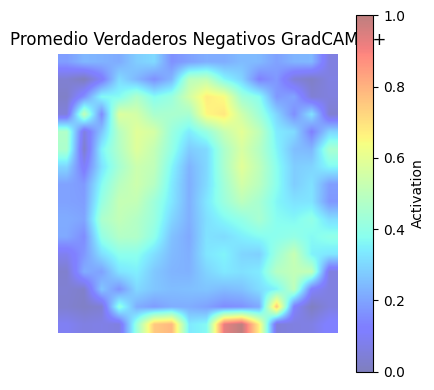

In [ ]:
draw_heatmap(results, "Promedio Verdaderos Negativos GradCAM++")

##### Falsos Positivos

In [ ]:
fp_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="FP")
len(fp_images)

272

In [ ]:
results = average_heatmaps(GradCAMPlusPlus, fp_images)

Procesando para promedio: 918_test_0_.png


Procesando para promedio: 91_test_0_.png


Procesando para promedio: 932_test_0_.png


Procesando para promedio: 934_test_0_.png


Procesando para promedio: 936_test_0_.png


Procesando para promedio: 931_test_0_.png


Procesando para promedio: 940_test_0_.png


Procesando para promedio: 947_test_0_.png


Procesando para promedio: 955_test_0_.png


Procesando para promedio: 953_test_0_.png


Procesando para promedio: 966_test_0_.png


Procesando para promedio: 963_test_0_.png


Procesando para promedio: 976_test_0_.png


Procesando para promedio: 989_test_0_.png


Procesando para promedio: 9_test_0_.png


Procesando para promedio: 842_test_0_.png


Procesando para promedio: 840_test_0_.png


Procesando para promedio: 841_test_0_.png


Procesando para promedio: 853_test_0_.png


Procesando para promedio: 83_test_0_.png


Procesando para promedio: 84_test_0_.png


Procesando para promedio: 848_test_0_.png


Procesando para promedio: 839_test_0_.png


Procesando para promedio: 863_test_0_.png


Procesando para promedio: 857_test_0_.png


Procesando para promedio: 860_test_0_.png


Procesando para promedio: 870_test_0_.png


Procesando para promedio: 879_test_0_.png


Procesando para promedio: 887_test_0_.png


Procesando para promedio: 900_test_0_.png


Procesando para promedio: 907_test_0_.png


Procesando para promedio: 897_test_0_.png


Procesando para promedio: 916_test_0_.png


Procesando para promedio: 912_test_0_.png


Procesando para promedio: 919_test_0_.png


Procesando para promedio: 747_test_0_.png


Procesando para promedio: 748_test_0_.png


Procesando para promedio: 765_test_0_.png


Procesando para promedio: 767_test_0_.png


Procesando para promedio: 78_test_0_.png


Procesando para promedio: 786_test_0_.png


Procesando para promedio: 789_test_0_.png


Procesando para promedio: 806_test_0_.png


Procesando para promedio: 808_test_0_.png


Procesando para promedio: 805_test_0_.png


Procesando para promedio: 79_test_0_.png


Procesando para promedio: 801_test_0_.png


Procesando para promedio: 799_test_0_.png


Procesando para promedio: 810_test_0_.png


Procesando para promedio: 818_test_0_.png


Procesando para promedio: 817_test_0_.png


Procesando para promedio: 815_test_0_.png


Procesando para promedio: 82_test_0_.png


Procesando para promedio: 832_test_0_.png


Procesando para promedio: 672_test_0_.png


Procesando para promedio: 688_test_0_.png


Procesando para promedio: 679_test_0_.png


Procesando para promedio: 685_test_0_.png


Procesando para promedio: 690_test_0_.png


Procesando para promedio: 676_test_0_.png


Procesando para promedio: 696_test_0_.png


Procesando para promedio: 706_test_0_.png


Procesando para promedio: 700_test_0_.png


Procesando para promedio: 720_test_0_.png


Procesando para promedio: 712_test_0_.png


Procesando para promedio: 719_test_0_.png


Procesando para promedio: 711_test_0_.png


Procesando para promedio: 724_test_0_.png


Procesando para promedio: 742_test_0_.png


Procesando para promedio: 757_test_0_.png


Procesando para promedio: 574_test_0_.png


Procesando para promedio: 600_test_0_.png


Procesando para promedio: 597_test_0_.png


Procesando para promedio: 617_test_0_.png


Procesando para promedio: 60_test_0_.png


Procesando para promedio: 616_test_0_.png


Procesando para promedio: 619_test_0_.png


Procesando para promedio: 627_test_0_.png


Procesando para promedio: 628_test_0_.png


Procesando para promedio: 607_test_0_.png


Procesando para promedio: 659_test_0_.png


Procesando para promedio: 63_test_0_.png


Procesando para promedio: 668_test_0_.png


Procesando para promedio: 675_test_0_.png


Procesando para promedio: 49_test_0_.png


Procesando para promedio: 521_test_0_.png


Procesando para promedio: 522_test_0_.png


Procesando para promedio: 517_test_0_.png


Procesando para promedio: 51_test_0_.png


Procesando para promedio: 52_test_0_.png


Procesando para promedio: 513_test_0_.png


Procesando para promedio: 530_test_0_.png


Procesando para promedio: 529_test_0_.png


Procesando para promedio: 516_test_0_.png


Procesando para promedio: 544_test_0_.png


Procesando para promedio: 53_test_0_.png


Procesando para promedio: 568_test_0_.png


Procesando para promedio: 567_test_0_.png


Procesando para promedio: 569_test_0_.png


Procesando para promedio: 59_test_0_.png


Procesando para promedio: 591_test_0_.png


Procesando para promedio: 594_test_0_.png


Procesando para promedio: 586_test_0_.png


Procesando para promedio: 589_test_0_.png


Procesando para promedio: 429_test_0_.png


Procesando para promedio: 434_test_0_.png


Procesando para promedio: 433_test_0_.png


Procesando para promedio: 438_test_0_.png


Procesando para promedio: 440_test_0_.png


Procesando para promedio: 428_test_0_.png


Procesando para promedio: 44_test_0_.png


Procesando para promedio: 456_test_0_.png


Procesando para promedio: 468_test_0_.png


Procesando para promedio: 471_test_0_.png


Procesando para promedio: 490_test_0_.png


Procesando para promedio: 472_test_0_.png


Procesando para promedio: 470_test_0_.png


Procesando para promedio: 477_test_0_.png


Procesando para promedio: 474_test_0_.png


Procesando para promedio: 48_test_0_.png


Procesando para promedio: 487_test_0_.png


Procesando para promedio: 50_test_0_.png


Procesando para promedio: 348_test_0_.png


Procesando para promedio: 350_test_0_.png


Procesando para promedio: 353_test_0_.png


Procesando para promedio: 349_test_0_.png


Procesando para promedio: 344_test_0_.png


Procesando para promedio: 347_test_0_.png


Procesando para promedio: 373_test_0_.png


Procesando para promedio: 379_test_0_.png


Procesando para promedio: 35_test_0_.png


Procesando para promedio: 358_test_0_.png


Procesando para promedio: 36_test_0_.png


Procesando para promedio: 363_test_0_.png


Procesando para promedio: 371_test_0_.png


Procesando para promedio: 394_test_0_.png


Procesando para promedio: 399_test_0_.png


Procesando para promedio: 397_test_0_.png


Procesando para promedio: 408_test_0_.png


Procesando para promedio: 401_test_0_.png


Procesando para promedio: 388_test_0_.png


Procesando para promedio: 3_test_0_.png


Procesando para promedio: 395_test_0_.png


Procesando para promedio: 419_test_0_.png


Procesando para promedio: 427_test_0_.png


Procesando para promedio: 420_test_0_.png


Procesando para promedio: 272_test_0_.png


Procesando para promedio: 265_test_0_.png


Procesando para promedio: 271_test_0_.png


Procesando para promedio: 29_test_0_.png


Procesando para promedio: 295_test_0_.png


Procesando para promedio: 303_test_0_.png


Procesando para promedio: 296_test_0_.png


Procesando para promedio: 309_test_0_.png


Procesando para promedio: 306_test_0_.png


Procesando para promedio: 308_test_0_.png


Procesando para promedio: 317_test_0_.png


Procesando para promedio: 302_test_0_.png


Procesando para promedio: 311_test_0_.png


Procesando para promedio: 299_test_0_.png


Procesando para promedio: 294_test_0_.png


Procesando para promedio: 339_test_0_.png


Procesando para promedio: 335_test_0_.png


Procesando para promedio: 333_test_0_.png


Procesando para promedio: 332_test_0_.png


Procesando para promedio: 31_test_0_.png


Procesando para promedio: 328_test_0_.png


Procesando para promedio: 330_test_0_.png


Procesando para promedio: 1_test_0_.png


Procesando para promedio: 192_test_0_.png


Procesando para promedio: 185_test_0_.png


Procesando para promedio: 208_test_0_.png


Procesando para promedio: 210_test_0_.png


Procesando para promedio: 230_test_0_.png


Procesando para promedio: 240_test_0_.png


Procesando para promedio: 234_test_0_.png


Procesando para promedio: 236_test_0_.png


Procesando para promedio: 226_test_0_.png


Procesando para promedio: 260_test_0_.png


Procesando para promedio: 258_test_0_.png


Procesando para promedio: 241_test_0_.png


Procesando para promedio: 247_test_0_.png


Procesando para promedio: 254_test_0_.png


Procesando para promedio: 244_test_0_.png


Procesando para promedio: 252_test_0_.png


Procesando para promedio: 1180_test_0_.png


Procesando para promedio: 1149_test_0_.png


Procesando para promedio: 1139_test_0_.png


Procesando para promedio: 1172_test_0_.png


Procesando para promedio: 1273_test_0_.png


Procesando para promedio: 1188_test_0_.png


Procesando para promedio: 1281_test_0_.png


Procesando para promedio: 1229_test_0_.png


Procesando para promedio: 1313_test_0_.png


Procesando para promedio: 1261_test_0_.png


Procesando para promedio: 1304_test_0_.png


Procesando para promedio: 1211_test_0_.png


Procesando para promedio: 1295_test_0_.png


Procesando para promedio: 1213_test_0_.png


Procesando para promedio: 1190_test_0_.png


Procesando para promedio: 127_test_0_.png


Procesando para promedio: 1198_test_0_.png


Procesando para promedio: 1243_test_0_.png


Procesando para promedio: 1232_test_0_.png


Procesando para promedio: 1279_test_0_.png


Procesando para promedio: 1270_test_0_.png


Procesando para promedio: 1251_test_0_.png


Procesando para promedio: 122_test_0_.png


Procesando para promedio: 1224_test_0_.png


Procesando para promedio: 121_test_0_.png


Procesando para promedio: 1258_test_0_.png


Procesando para promedio: 1203_test_0_.png


Procesando para promedio: 1262_test_0_.png


Procesando para promedio: 124_test_0_.png


Procesando para promedio: 1214_test_0_.png


Procesando para promedio: 1189_test_0_.png


Procesando para promedio: 1267_test_0_.png


Procesando para promedio: 1237_test_0_.png


Procesando para promedio: 1215_test_0_.png


Procesando para promedio: 1231_test_0_.png


Procesando para promedio: 1265_test_0_.png


Procesando para promedio: 1341_test_0_.png


Procesando para promedio: 1336_test_0_.png


Procesando para promedio: 1331_test_0_.png


Procesando para promedio: 1347_test_0_.png


Procesando para promedio: 133_test_0_.png


Procesando para promedio: 1334_test_0_.png


Procesando para promedio: 139_test_0_.png


Procesando para promedio: 137_test_0_.png


Procesando para promedio: 1355_test_0_.png


Procesando para promedio: 142_test_0_.png


Procesando para promedio: 1339_test_0_.png


Procesando para promedio: 1350_test_0_.png


Procesando para promedio: 1370_test_0_.png


Procesando para promedio: 1328_test_0_.png


Procesando para promedio: 136_test_0_.png


Procesando para promedio: 149_test_0_.png


Procesando para promedio: 1333_test_0_.png


Procesando para promedio: 163_test_0_.png


Procesando para promedio: 161_test_0_.png


Procesando para promedio: 177_test_0_.png


Procesando para promedio: 169_test_0_.png


Procesando para promedio: 165_test_0_.png


Procesando para promedio: 170_test_0_.png


Procesando para promedio: 1015_test_0_.png


Procesando para promedio: 1005_test_0_.png


Procesando para promedio: 1021_test_0_.png


Procesando para promedio: 1022_test_0_.png


Procesando para promedio: 102_test_0_.png


Procesando para promedio: 1039_test_0_.png


Procesando para promedio: 1046_test_0_.png


Procesando para promedio: 1181_test_0_.png


Procesando para promedio: 108_test_0_.png


Procesando para promedio: 1169_test_0_.png


Procesando para promedio: 1097_test_0_.png


Procesando para promedio: 1177_test_0_.png


Procesando para promedio: 1131_test_0_.png


Procesando para promedio: 110_test_0_.png


Procesando para promedio: 1094_test_0_.png


Procesando para promedio: 1087_test_0_.png


Procesando para promedio: 1125_test_0_.png


Procesando para promedio: 1076_test_0_.png


Procesando para promedio: 1140_test_0_.png


Procesando para promedio: 1089_test_0_.png


Procesando para promedio: 1166_test_0_.png


Procesando para promedio: 1072_test_0_.png


Procesando para promedio: 1114_test_0_.png


Procesando para promedio: 1082_test_0_.png


Procesando para promedio: 1104_test_0_.png


Procesando para promedio: 1108_test_0_.png


Procesando para promedio: 1012_test_0_.png


Procesando para promedio: 1011_test_0_.png


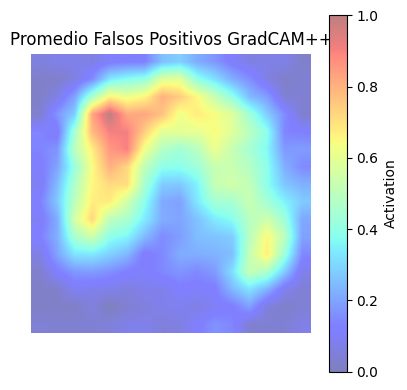

In [ ]:
draw_heatmap(results, "Promedio Falsos Positivos GradCAM++")

##### Falsos Negativos

In [ ]:
fn_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="FN")
len(fn_images)

61

In [ ]:
results = average_heatmaps(GradCAMPlusPlus, fn_images)

Procesando para promedio: 949_test_1_.png


Procesando para promedio: 977_test_1_.png


Procesando para promedio: 98_test_1_.png


Procesando para promedio: 986_test_1_.png


Procesando para promedio: 883_test_1_.png


Procesando para promedio: 893_test_1_.png


Procesando para promedio: 886_test_1_.png


Procesando para promedio: 896_test_1_.png


Procesando para promedio: 758_test_1_.png


Procesando para promedio: 784_test_1_.png


Procesando para promedio: 791_test_1_.png


Procesando para promedio: 780_test_1_.png


Procesando para promedio: 813_test_1_.png


Procesando para promedio: 671_test_1_.png


Procesando para promedio: 705_test_1_.png


Procesando para promedio: 707_test_1_.png


Procesando para promedio: 703_test_1_.png


Procesando para promedio: 694_test_1_.png


Procesando para promedio: 726_test_1_.png


Procesando para promedio: 74_test_1_.png


Procesando para promedio: 595_test_1_.png


Procesando para promedio: 623_test_1_.png


Procesando para promedio: 531_test_1_.png


Procesando para promedio: 526_test_1_.png


Procesando para promedio: 598_test_1_.png


Procesando para promedio: 47_test_1_.png


Procesando para promedio: 491_test_1_.png


Procesando para promedio: 506_test_1_.png


Procesando para promedio: 372_test_1_.png


Procesando para promedio: 376_test_1_.png


Procesando para promedio: 279_test_1_.png


Procesando para promedio: 325_test_1_.png


Procesando para promedio: 337_test_1_.png


Procesando para promedio: 219_test_1_.png


Procesando para promedio: 1083_test_1_.png


Procesando para promedio: 1254_test_1_.png


Procesando para promedio: 1299_test_1_.png


Procesando para promedio: 1278_test_1_.png


Procesando para promedio: 1250_test_1_.png


Procesando para promedio: 1247_test_1_.png


Procesando para promedio: 1293_test_1_.png


Procesando para promedio: 1212_test_1_.png


Procesando para promedio: 129_test_1_.png


Procesando para promedio: 1240_test_1_.png


Procesando para promedio: 1205_test_1_.png


Procesando para promedio: 1192_test_1_.png


Procesando para promedio: 1317_test_1_.png


Procesando para promedio: 1029_test_1_.png


Procesando para promedio: 1033_test_1_.png


Procesando para promedio: 1027_test_1_.png


Procesando para promedio: 1031_test_1_.png


Procesando para promedio: 101_test_1_.png


Procesando para promedio: 1109_test_1_.png


Procesando para promedio: 115_test_1_.png


Procesando para promedio: 1092_test_1_.png


Procesando para promedio: 1178_test_1_.png


Procesando para promedio: 1115_test_1_.png


Procesando para promedio: 1160_test_1_.png


Procesando para promedio: 1090_test_1_.png


Procesando para promedio: 1122_test_1_.png


Procesando para promedio: 1010_test_1_.png


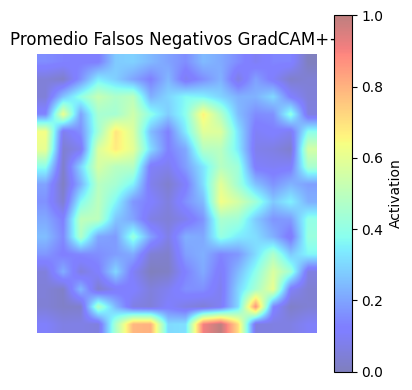

In [ ]:
draw_heatmap(results, "Promedio Falsos Negativos GradCAM++")

#### Calculamos el promedio de EigenCAM

##### Verdaderos Positivos

In [ ]:
vp_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="VP")
len(vp_images)

234

In [ ]:
results = average_heatmaps(EigenCAM, vp_images)

Procesando para promedio: 914_test_1_.png


Procesando para promedio: 924_test_1_.png


Procesando para promedio: 920_test_1_.png


Procesando para promedio: 928_test_1_.png


Procesando para promedio: 949_test_1_.png


Procesando para promedio: 939_test_1_.png


Procesando para promedio: 941_test_1_.png


Procesando para promedio: 94_test_1_.png


Procesando para promedio: 942_test_1_.png


Procesando para promedio: 943_test_1_.png


Procesando para promedio: 938_test_1_.png


Procesando para promedio: 958_test_1_.png


Procesando para promedio: 972_test_1_.png


Procesando para promedio: 988_test_1_.png


Procesando para promedio: 985_test_1_.png


Procesando para promedio: 98_test_1_.png


Procesando para promedio: 982_test_1_.png


Procesando para promedio: 986_test_1_.png


Procesando para promedio: 99_test_1_.png


Procesando para promedio: 846_test_1_.png


Procesando para promedio: 852_test_1_.png


Procesando para promedio: 861_test_1_.png


Procesando para promedio: 858_test_1_.png


Procesando para promedio: 866_test_1_.png


Procesando para promedio: 878_test_1_.png


Procesando para promedio: 877_test_1_.png


Procesando para promedio: 86_test_1_.png


Procesando para promedio: 889_test_1_.png


Procesando para promedio: 894_test_1_.png


Procesando para promedio: 886_test_1_.png


Procesando para promedio: 908_test_1_.png


Procesando para promedio: 89_test_1_.png


Procesando para promedio: 911_test_1_.png


Procesando para promedio: 90_test_1_.png


Procesando para promedio: 913_test_1_.png


Procesando para promedio: 756_test_1_.png


Procesando para promedio: 763_test_1_.png


Procesando para promedio: 76_test_1_.png


Procesando para promedio: 776_test_1_.png


Procesando para promedio: 784_test_1_.png


Procesando para promedio: 783_test_1_.png


Procesando para promedio: 785_test_1_.png


Procesando para promedio: 7_test_1_.png


Procesando para promedio: 814_test_1_.png


Procesando para promedio: 80_test_1_.png


Procesando para promedio: 821_test_1_.png


Procesando para promedio: 831_test_1_.png


Procesando para promedio: 834_test_1_.png


Procesando para promedio: 826_test_1_.png


Procesando para promedio: 823_test_1_.png


Procesando para promedio: 705_test_1_.png


Procesando para promedio: 6_test_1_.png


Procesando para promedio: 694_test_1_.png


Procesando para promedio: 693_test_1_.png


Procesando para promedio: 717_test_1_.png


Procesando para promedio: 713_test_1_.png


Procesando para promedio: 718_test_1_.png


Procesando para promedio: 710_test_1_.png


Procesando para promedio: 732_test_1_.png


Procesando para promedio: 722_test_1_.png


Procesando para promedio: 737_test_1_.png


Procesando para promedio: 740_test_1_.png


Procesando para promedio: 745_test_1_.png


Procesando para promedio: 588_test_1_.png


Procesando para promedio: 634_test_1_.png


Procesando para promedio: 630_test_1_.png


Procesando para promedio: 623_test_1_.png


Procesando para promedio: 605_test_1_.png


Procesando para promedio: 631_test_1_.png


Procesando para promedio: 64_test_1_.png


Procesando para promedio: 654_test_1_.png


Procesando para promedio: 653_test_1_.png


Procesando para promedio: 663_test_1_.png


Procesando para promedio: 665_test_1_.png


Procesando para promedio: 645_test_1_.png


Procesando para promedio: 641_test_1_.png


Procesando para promedio: 656_test_1_.png


Procesando para promedio: 658_test_1_.png


Procesando para promedio: 661_test_1_.png


Procesando para promedio: 667_test_1_.png


Procesando para promedio: 687_test_1_.png


Procesando para promedio: 531_test_1_.png


Procesando para promedio: 512_test_1_.png


Procesando para promedio: 520_test_1_.png


Procesando para promedio: 518_test_1_.png


Procesando para promedio: 553_test_1_.png


Procesando para promedio: 543_test_1_.png


Procesando para promedio: 552_test_1_.png


Procesando para promedio: 550_test_1_.png


Procesando para promedio: 566_test_1_.png


Procesando para promedio: 572_test_1_.png


Procesando para promedio: 570_test_1_.png


Procesando para promedio: 557_test_1_.png


Procesando para promedio: 558_test_1_.png


Procesando para promedio: 585_test_1_.png


Procesando para promedio: 418_test_1_.png


Procesando para promedio: 424_test_1_.png


Procesando para promedio: 441_test_1_.png


Procesando para promedio: 435_test_1_.png


Procesando para promedio: 446_test_1_.png


Procesando para promedio: 448_test_1_.png


Procesando para promedio: 452_test_1_.png


Procesando para promedio: 449_test_1_.png


Procesando para promedio: 469_test_1_.png


Procesando para promedio: 47_test_1_.png


Procesando para promedio: 483_test_1_.png


Procesando para promedio: 491_test_1_.png


Procesando para promedio: 476_test_1_.png


Procesando para promedio: 485_test_1_.png


Procesando para promedio: 498_test_1_.png


Procesando para promedio: 500_test_1_.png


Procesando para promedio: 492_test_1_.png


Procesando para promedio: 509_test_1_.png


Procesando para promedio: 495_test_1_.png


Procesando para promedio: 37_test_1_.png


Procesando para promedio: 364_test_1_.png


Procesando para promedio: 378_test_1_.png


Procesando para promedio: 356_test_1_.png


Procesando para promedio: 366_test_1_.png


Procesando para promedio: 385_test_1_.png


Procesando para promedio: 415_test_1_.png


Procesando para promedio: 406_test_1_.png


Procesando para promedio: 387_test_1_.png


Procesando para promedio: 392_test_1_.png


Procesando para promedio: 42_test_1_.png


Procesando para promedio: 437_test_1_.png


Procesando para promedio: 432_test_1_.png


Procesando para promedio: 426_test_1_.png


Procesando para promedio: 287_test_1_.png


Procesando para promedio: 290_test_1_.png


Procesando para promedio: 284_test_1_.png


Procesando para promedio: 288_test_1_.png


Procesando para promedio: 266_test_1_.png


Procesando para promedio: 264_test_1_.png


Procesando para promedio: 279_test_1_.png


Procesando para promedio: 291_test_1_.png


Procesando para promedio: 301_test_1_.png


Procesando para promedio: 315_test_1_.png


Procesando para promedio: 336_test_1_.png


Procesando para promedio: 340_test_1_.png


Procesando para promedio: 337_test_1_.png


Procesando para promedio: 324_test_1_.png


Procesando para promedio: 322_test_1_.png


Procesando para promedio: 19_test_1_.png


Procesando para promedio: 193_test_1_.png


Procesando para promedio: 217_test_1_.png


Procesando para promedio: 204_test_1_.png


Procesando para promedio: 218_test_1_.png


Procesando para promedio: 205_test_1_.png


Procesando para promedio: 206_test_1_.png


Procesando para promedio: 223_test_1_.png


Procesando para promedio: 250_test_1_.png


Procesando para promedio: 25_test_1_.png


Procesando para promedio: 263_test_1_.png


Procesando para promedio: 1083_test_1_.png


Procesando para promedio: 1195_test_1_.png


Procesando para promedio: 1307_test_1_.png


Procesando para promedio: 1264_test_1_.png


Procesando para promedio: 1291_test_1_.png


Procesando para promedio: 1254_test_1_.png


Procesando para promedio: 1225_test_1_.png


Procesando para promedio: 1244_test_1_.png


Procesando para promedio: 1202_test_1_.png


Procesando para promedio: 1294_test_1_.png


Procesando para promedio: 1194_test_1_.png


Procesando para promedio: 1298_test_1_.png


Procesando para promedio: 1212_test_1_.png


Procesando para promedio: 1205_test_1_.png


Procesando para promedio: 1249_test_1_.png


Procesando para promedio: 1285_test_1_.png


Procesando para promedio: 1246_test_1_.png


Procesando para promedio: 1314_test_1_.png


Procesando para promedio: 1315_test_1_.png


Procesando para promedio: 1226_test_1_.png


Procesando para promedio: 1209_test_1_.png


Procesando para promedio: 1312_test_1_.png


Procesando para promedio: 1337_test_1_.png


Procesando para promedio: 146_test_1_.png


Procesando para promedio: 145_test_1_.png


Procesando para promedio: 1348_test_1_.png


Procesando para promedio: 1359_test_1_.png


Procesando para promedio: 1368_test_1_.png


Procesando para promedio: 1326_test_1_.png


Procesando para promedio: 152_test_1_.png


Procesando para promedio: 1319_test_1_.png


Procesando para promedio: 147_test_1_.png


Procesando para promedio: 1332_test_1_.png


Procesando para promedio: 1356_test_1_.png


Procesando para promedio: 1329_test_1_.png


Procesando para promedio: 1349_test_1_.png


Procesando para promedio: 1327_test_1_.png


Procesando para promedio: 1363_test_1_.png


Procesando para promedio: 1325_test_1_.png


Procesando para promedio: 17_test_1_.png


Procesando para promedio: 160_test_1_.png


Procesando para promedio: 153_test_1_.png


Procesando para promedio: 156_test_1_.png


Procesando para promedio: 168_test_1_.png


Procesando para promedio: 184_test_1_.png


Procesando para promedio: 1014_test_1_.png


Procesando para promedio: 1033_test_1_.png


Procesando para promedio: 1031_test_1_.png


Procesando para promedio: 101_test_1_.png


Procesando para promedio: 1035_test_1_.png


Procesando para promedio: 1057_test_1_.png


Procesando para promedio: 1040_test_1_.png


Procesando para promedio: 1059_test_1_.png


Procesando para promedio: 1044_test_1_.png


Procesando para promedio: 1054_test_1_.png


Procesando para promedio: 1042_test_1_.png


Procesando para promedio: 1058_test_1_.png


Procesando para promedio: 1053_test_1_.png


Procesando para promedio: 1103_test_1_.png


Procesando para promedio: 115_test_1_.png


Procesando para promedio: 1084_test_1_.png


Procesando para promedio: 1120_test_1_.png


Procesando para promedio: 1102_test_1_.png


Procesando para promedio: 1178_test_1_.png


Procesando para promedio: 1151_test_1_.png


Procesando para promedio: 1132_test_1_.png


Procesando para promedio: 1062_test_1_.png


Procesando para promedio: 1141_test_1_.png


Procesando para promedio: 1071_test_1_.png


Procesando para promedio: 111_test_1_.png


Procesando para promedio: 1086_test_1_.png


Procesando para promedio: 1105_test_1_.png


Procesando para promedio: 1154_test_1_.png


Procesando para promedio: 1160_test_1_.png


Procesando para promedio: 1145_test_1_.png


Procesando para promedio: 1077_test_1_.png


Procesando para promedio: 1069_test_1_.png


Procesando para promedio: 1090_test_1_.png


Procesando para promedio: 0_test_1_.png


Procesando para promedio: 1007_test_1_.png


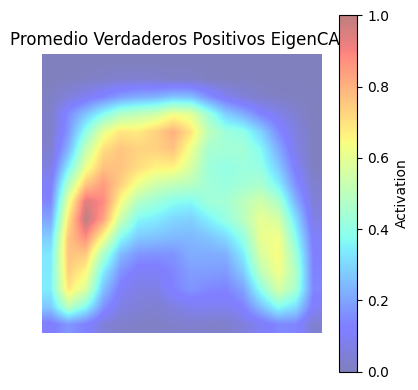

In [ ]:
draw_heatmap(results, "Promedio Verdaderos Positivos EigenCAM")

##### Verdaderos Negativos

In [ ]:
vn_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="VN")
len(vn_images)

895

In [ ]:
results = average_heatmaps(EigenCAM, vn_images)

Procesando para promedio: 915_test_0_.png


Procesando para promedio: 925_test_0_.png


Procesando para promedio: 917_test_0_.png


Procesando para promedio: 929_test_0_.png


Procesando para promedio: 92_test_0_.png


Procesando para promedio: 933_test_0_.png


Procesando para promedio: 937_test_0_.png


Procesando para promedio: 930_test_0_.png


Procesando para promedio: 934_test_0_.png


Procesando para promedio: 936_test_0_.png


Procesando para promedio: 935_test_0_.png


Procesando para promedio: 927_test_0_.png


Procesando para promedio: 931_test_0_.png


Procesando para promedio: 945_test_0_.png


Procesando para promedio: 950_test_0_.png


Procesando para promedio: 944_test_0_.png


Procesando para promedio: 951_test_0_.png


Procesando para promedio: 946_test_0_.png


Procesando para promedio: 948_test_0_.png


Procesando para promedio: 93_test_0_.png


Procesando para promedio: 947_test_0_.png


Procesando para promedio: 960_test_0_.png


Procesando para promedio: 962_test_0_.png


Procesando para promedio: 954_test_0_.png


Procesando para promedio: 964_test_0_.png


Procesando para promedio: 953_test_0_.png


Procesando para promedio: 952_test_0_.png


Procesando para promedio: 95_test_0_.png


Procesando para promedio: 956_test_0_.png


Procesando para promedio: 967_test_0_.png


Procesando para promedio: 959_test_0_.png


Procesando para promedio: 961_test_0_.png


Procesando para promedio: 965_test_0_.png


Procesando para promedio: 963_test_0_.png


Procesando para promedio: 974_test_0_.png


Procesando para promedio: 979_test_0_.png


Procesando para promedio: 971_test_0_.png


Procesando para promedio: 975_test_0_.png


Procesando para promedio: 978_test_0_.png


Procesando para promedio: 981_test_0_.png


Procesando para promedio: 968_test_0_.png


Procesando para promedio: 980_test_0_.png


Procesando para promedio: 96_test_0_.png


Procesando para promedio: 97_test_0_.png


Procesando para promedio: 973_test_0_.png


Procesando para promedio: 969_test_0_.png


Procesando para promedio: 970_test_0_.png


Procesando para promedio: 992_test_0_.png


Procesando para promedio: 987_test_0_.png


Procesando para promedio: 984_test_0_.png


Procesando para promedio: 993_test_0_.png


Procesando para promedio: 983_test_0_.png


Procesando para promedio: 998_test_0_.png


Procesando para promedio: 996_test_0_.png


Procesando para promedio: 994_test_0_.png


Procesando para promedio: 999_test_0_.png


Procesando para promedio: 997_test_0_.png


Procesando para promedio: 995_test_0_.png


Procesando para promedio: 9_test_0_.png


Procesando para promedio: 842_test_0_.png


Procesando para promedio: 837_test_0_.png


Procesando para promedio: 840_test_0_.png


Procesando para promedio: 849_test_0_.png


Procesando para promedio: 851_test_0_.png


Procesando para promedio: 843_test_0_.png


Procesando para promedio: 845_test_0_.png


Procesando para promedio: 836_test_0_.png


Procesando para promedio: 847_test_0_.png


Procesando para promedio: 854_test_0_.png


Procesando para promedio: 855_test_0_.png


Procesando para promedio: 844_test_0_.png


Procesando para promedio: 835_test_0_.png


Procesando para promedio: 839_test_0_.png


Procesando para promedio: 85_test_0_.png


Procesando para promedio: 857_test_0_.png


Procesando para promedio: 868_test_0_.png


Procesando para promedio: 865_test_0_.png


Procesando para promedio: 859_test_0_.png


Procesando para promedio: 856_test_0_.png


Procesando para promedio: 867_test_0_.png


Procesando para promedio: 862_test_0_.png


Procesando para promedio: 864_test_0_.png


Procesando para promedio: 87_test_0_.png


Procesando para promedio: 882_test_0_.png


Procesando para promedio: 875_test_0_.png


Procesando para promedio: 879_test_0_.png


Procesando para promedio: 871_test_0_.png


Procesando para promedio: 876_test_0_.png


Procesando para promedio: 872_test_0_.png


Procesando para promedio: 869_test_0_.png


Procesando para promedio: 874_test_0_.png


Procesando para promedio: 881_test_0_.png


Procesando para promedio: 880_test_0_.png


Procesando para promedio: 873_test_0_.png


Procesando para promedio: 888_test_0_.png


Procesando para promedio: 892_test_0_.png


Procesando para promedio: 895_test_0_.png


Procesando para promedio: 890_test_0_.png


Procesando para promedio: 885_test_0_.png


Procesando para promedio: 884_test_0_.png


Procesando para promedio: 909_test_0_.png


Procesando para promedio: 899_test_0_.png


Procesando para promedio: 901_test_0_.png


Procesando para promedio: 905_test_0_.png


Procesando para promedio: 902_test_0_.png


Procesando para promedio: 907_test_0_.png


Procesando para promedio: 903_test_0_.png


Procesando para promedio: 906_test_0_.png


Procesando para promedio: 898_test_0_.png


Procesando para promedio: 910_test_0_.png


Procesando para promedio: 8_test_0_.png


Procesando para promedio: 904_test_0_.png


Procesando para promedio: 921_test_0_.png


Procesando para promedio: 926_test_0_.png


Procesando para promedio: 916_test_0_.png


Procesando para promedio: 912_test_0_.png


Procesando para promedio: 919_test_0_.png


Procesando para promedio: 923_test_0_.png


Procesando para promedio: 760_test_0_.png


Procesando para promedio: 755_test_0_.png


Procesando para promedio: 751_test_0_.png


Procesando para promedio: 750_test_0_.png


Procesando para promedio: 749_test_0_.png


Procesando para promedio: 752_test_0_.png


Procesando para promedio: 774_test_0_.png


Procesando para promedio: 771_test_0_.png


Procesando para promedio: 764_test_0_.png


Procesando para promedio: 770_test_0_.png


Procesando para promedio: 775_test_0_.png


Procesando para promedio: 773_test_0_.png


Procesando para promedio: 768_test_0_.png


Procesando para promedio: 779_test_0_.png


Procesando para promedio: 778_test_0_.png


Procesando para promedio: 777_test_0_.png


Procesando para promedio: 766_test_0_.png


Procesando para promedio: 769_test_0_.png


Procesando para promedio: 772_test_0_.png


Procesando para promedio: 790_test_0_.png


Procesando para promedio: 788_test_0_.png


Procesando para promedio: 792_test_0_.png


Procesando para promedio: 782_test_0_.png


Procesando para promedio: 781_test_0_.png


Procesando para promedio: 787_test_0_.png


Procesando para promedio: 793_test_0_.png


Procesando para promedio: 794_test_0_.png


Procesando para promedio: 789_test_0_.png


Procesando para promedio: 803_test_0_.png


Procesando para promedio: 806_test_0_.png


Procesando para promedio: 800_test_0_.png


Procesando para promedio: 796_test_0_.png


Procesando para promedio: 802_test_0_.png


Procesando para promedio: 805_test_0_.png


Procesando para promedio: 807_test_0_.png


Procesando para promedio: 797_test_0_.png


Procesando para promedio: 804_test_0_.png


Procesando para promedio: 799_test_0_.png


Procesando para promedio: 798_test_0_.png


Procesando para promedio: 818_test_0_.png


Procesando para promedio: 816_test_0_.png


Procesando para promedio: 820_test_0_.png


Procesando para promedio: 809_test_0_.png


Procesando para promedio: 819_test_0_.png


Procesando para promedio: 812_test_0_.png


Procesando para promedio: 811_test_0_.png


Procesando para promedio: 81_test_0_.png


Procesando para promedio: 830_test_0_.png


Procesando para promedio: 825_test_0_.png


Procesando para promedio: 828_test_0_.png


Procesando para promedio: 827_test_0_.png


Procesando para promedio: 824_test_0_.png


Procesando para promedio: 822_test_0_.png


Procesando para promedio: 833_test_0_.png


Procesando para promedio: 829_test_0_.png


Procesando para promedio: 832_test_0_.png


Procesando para promedio: 850_test_0_.png


Procesando para promedio: 838_test_0_.png


Procesando para promedio: 67_test_0_.png


Procesando para promedio: 681_test_0_.png


Procesando para promedio: 686_test_0_.png


Procesando para promedio: 672_test_0_.png


Procesando para promedio: 683_test_0_.png


Procesando para promedio: 674_test_0_.png


Procesando para promedio: 669_test_0_.png


Procesando para promedio: 680_test_0_.png


Procesando para promedio: 682_test_0_.png


Procesando para promedio: 688_test_0_.png


Procesando para promedio: 677_test_0_.png


Procesando para promedio: 689_test_0_.png


Procesando para promedio: 66_test_0_.png


Procesando para promedio: 679_test_0_.png


Procesando para promedio: 678_test_0_.png


Procesando para promedio: 695_test_0_.png


Procesando para promedio: 699_test_0_.png


Procesando para promedio: 691_test_0_.png


Procesando para promedio: 701_test_0_.png


Procesando para promedio: 697_test_0_.png


Procesando para promedio: 692_test_0_.png


Procesando para promedio: 704_test_0_.png


Procesando para promedio: 698_test_0_.png


Procesando para promedio: 69_test_0_.png


Procesando para promedio: 708_test_0_.png


Procesando para promedio: 720_test_0_.png


Procesando para promedio: 716_test_0_.png


Procesando para promedio: 714_test_0_.png


Procesando para promedio: 70_test_0_.png


Procesando para promedio: 709_test_0_.png


Procesando para promedio: 715_test_0_.png


Procesando para promedio: 719_test_0_.png


Procesando para promedio: 711_test_0_.png


Procesando para promedio: 71_test_0_.png


Procesando para promedio: 728_test_0_.png


Procesando para promedio: 723_test_0_.png


Procesando para promedio: 72_test_0_.png


Procesando para promedio: 730_test_0_.png


Procesando para promedio: 731_test_0_.png


Procesando para promedio: 721_test_0_.png


Procesando para promedio: 733_test_0_.png


Procesando para promedio: 729_test_0_.png


Procesando para promedio: 725_test_0_.png


Procesando para promedio: 727_test_0_.png


Procesando para promedio: 744_test_0_.png


Procesando para promedio: 73_test_0_.png


Procesando para promedio: 742_test_0_.png


Procesando para promedio: 743_test_0_.png


Procesando para promedio: 746_test_0_.png


Procesando para promedio: 739_test_0_.png


Procesando para promedio: 736_test_0_.png


Procesando para promedio: 738_test_0_.png


Procesando para promedio: 734_test_0_.png


Procesando para promedio: 735_test_0_.png


Procesando para promedio: 741_test_0_.png


Procesando para promedio: 753_test_0_.png


Procesando para promedio: 754_test_0_.png


Procesando para promedio: 761_test_0_.png


Procesando para promedio: 75_test_0_.png


Procesando para promedio: 757_test_0_.png


Procesando para promedio: 762_test_0_.png


Procesando para promedio: 583_test_0_.png


Procesando para promedio: 574_test_0_.png


Procesando para promedio: 580_test_0_.png


Procesando para promedio: 597_test_0_.png


Procesando para promedio: 587_test_0_.png


Procesando para promedio: 578_test_0_.png


Procesando para promedio: 599_test_0_.png


Procesando para promedio: 622_test_0_.png


Procesando para promedio: 613_test_0_.png


Procesando para promedio: 60_test_0_.png


Procesando para promedio: 637_test_0_.png


Procesando para promedio: 606_test_0_.png


Procesando para promedio: 612_test_0_.png


Procesando para promedio: 620_test_0_.png


Procesando para promedio: 611_test_0_.png


Procesando para promedio: 61_test_0_.png


Procesando para promedio: 638_test_0_.png


Procesando para promedio: 615_test_0_.png


Procesando para promedio: 621_test_0_.png


Procesando para promedio: 625_test_0_.png


Procesando para promedio: 619_test_0_.png


Procesando para promedio: 633_test_0_.png


Procesando para promedio: 627_test_0_.png


Procesando para promedio: 636_test_0_.png


Procesando para promedio: 635_test_0_.png


Procesando para promedio: 624_test_0_.png


Procesando para promedio: 603_test_0_.png


Procesando para promedio: 604_test_0_.png


Procesando para promedio: 626_test_0_.png


Procesando para promedio: 614_test_0_.png


Procesando para promedio: 618_test_0_.png


Procesando para promedio: 608_test_0_.png


Procesando para promedio: 632_test_0_.png


Procesando para promedio: 609_test_0_.png


Procesando para promedio: 607_test_0_.png


Procesando para promedio: 62_test_0_.png


Procesando para promedio: 629_test_0_.png


Procesando para promedio: 649_test_0_.png


Procesando para promedio: 660_test_0_.png


Procesando para promedio: 646_test_0_.png


Procesando para promedio: 652_test_0_.png


Procesando para promedio: 643_test_0_.png


Procesando para promedio: 648_test_0_.png


Procesando para promedio: 666_test_0_.png


Procesando para promedio: 644_test_0_.png


Procesando para promedio: 662_test_0_.png


Procesando para promedio: 642_test_0_.png


Procesando para promedio: 655_test_0_.png


Procesando para promedio: 639_test_0_.png


Procesando para promedio: 65_test_0_.png


Procesando para promedio: 63_test_0_.png


Procesando para promedio: 647_test_0_.png


Procesando para promedio: 651_test_0_.png


Procesando para promedio: 650_test_0_.png


Procesando para promedio: 664_test_0_.png


Procesando para promedio: 657_test_0_.png


Procesando para promedio: 668_test_0_.png


Procesando para promedio: 673_test_0_.png


Procesando para promedio: 675_test_0_.png


Procesando para promedio: 507_test_0_.png


Procesando para promedio: 510_test_0_.png


Procesando para promedio: 502_test_0_.png


Procesando para promedio: 503_test_0_.png


Procesando para promedio: 511_test_0_.png


Procesando para promedio: 536_test_0_.png


Procesando para promedio: 515_test_0_.png


Procesando para promedio: 514_test_0_.png


Procesando para promedio: 524_test_0_.png


Procesando para promedio: 533_test_0_.png


Procesando para promedio: 534_test_0_.png


Procesando para promedio: 519_test_0_.png


Procesando para promedio: 51_test_0_.png


Procesando para promedio: 535_test_0_.png


Procesando para promedio: 525_test_0_.png


Procesando para promedio: 527_test_0_.png


Procesando para promedio: 532_test_0_.png


Procesando para promedio: 523_test_0_.png


Procesando para promedio: 544_test_0_.png


Procesando para promedio: 545_test_0_.png


Procesando para promedio: 551_test_0_.png


Procesando para promedio: 53_test_0_.png


Procesando para promedio: 541_test_0_.png


Procesando para promedio: 538_test_0_.png


Procesando para promedio: 554_test_0_.png


Procesando para promedio: 540_test_0_.png


Procesando para promedio: 546_test_0_.png


Procesando para promedio: 547_test_0_.png


Procesando para promedio: 539_test_0_.png


Procesando para promedio: 542_test_0_.png


Procesando para promedio: 548_test_0_.png


Procesando para promedio: 54_test_0_.png


Procesando para promedio: 571_test_0_.png


Procesando para promedio: 560_test_0_.png


Procesando para promedio: 567_test_0_.png


Procesando para promedio: 563_test_0_.png


Procesando para promedio: 573_test_0_.png


Procesando para promedio: 569_test_0_.png


Procesando para promedio: 55_test_0_.png


Procesando para promedio: 565_test_0_.png


Procesando para promedio: 559_test_0_.png


Procesando para promedio: 562_test_0_.png


Procesando para promedio: 56_test_0_.png


Procesando para promedio: 561_test_0_.png


Procesando para promedio: 564_test_0_.png


Procesando para promedio: 58_test_0_.png


Procesando para promedio: 584_test_0_.png


Procesando para promedio: 596_test_0_.png


Procesando para promedio: 602_test_0_.png


Procesando para promedio: 577_test_0_.png


Procesando para promedio: 582_test_0_.png


Procesando para promedio: 593_test_0_.png


Procesando para promedio: 601_test_0_.png


Procesando para promedio: 579_test_0_.png


Procesando para promedio: 590_test_0_.png


Procesando para promedio: 581_test_0_.png


Procesando para promedio: 592_test_0_.png


Procesando para promedio: 5_test_0_.png


Procesando para promedio: 589_test_0_.png


Procesando para promedio: 575_test_0_.png


Procesando para promedio: 576_test_0_.png


Procesando para promedio: 57_test_0_.png


Procesando para promedio: 43_test_0_.png


Procesando para promedio: 423_test_0_.png


Procesando para promedio: 429_test_0_.png


Procesando para promedio: 425_test_0_.png


Procesando para promedio: 442_test_0_.png


Procesando para promedio: 443_test_0_.png


Procesando para promedio: 430_test_0_.png


Procesando para promedio: 444_test_0_.png


Procesando para promedio: 439_test_0_.png


Procesando para promedio: 438_test_0_.png


Procesando para promedio: 41_test_0_.png


Procesando para promedio: 422_test_0_.png


Procesando para promedio: 428_test_0_.png


Procesando para promedio: 457_test_0_.png


Procesando para promedio: 451_test_0_.png


Procesando para promedio: 459_test_0_.png


Procesando para promedio: 464_test_0_.png


Procesando para promedio: 466_test_0_.png


Procesando para promedio: 456_test_0_.png


Procesando para promedio: 460_test_0_.png


Procesando para promedio: 468_test_0_.png


Procesando para promedio: 450_test_0_.png


Procesando para promedio: 455_test_0_.png


Procesando para promedio: 463_test_0_.png


Procesando para promedio: 447_test_0_.png


Procesando para promedio: 465_test_0_.png


Procesando para promedio: 454_test_0_.png


Procesando para promedio: 453_test_0_.png


Procesando para promedio: 467_test_0_.png


Procesando para promedio: 461_test_0_.png


Procesando para promedio: 462_test_0_.png


Procesando para promedio: 458_test_0_.png


Procesando para promedio: 45_test_0_.png


Procesando para promedio: 489_test_0_.png


Procesando para promedio: 486_test_0_.png


Procesando para promedio: 471_test_0_.png


Procesando para promedio: 478_test_0_.png


Procesando para promedio: 479_test_0_.png


Procesando para promedio: 484_test_0_.png


Procesando para promedio: 46_test_0_.png


Procesando para promedio: 481_test_0_.png


Procesando para promedio: 488_test_0_.png


Procesando para promedio: 480_test_0_.png


Procesando para promedio: 475_test_0_.png


Procesando para promedio: 474_test_0_.png


Procesando para promedio: 473_test_0_.png


Procesando para promedio: 48_test_0_.png


Procesando para promedio: 487_test_0_.png


Procesando para promedio: 482_test_0_.png


Procesando para promedio: 493_test_0_.png


Procesando para promedio: 494_test_0_.png


Procesando para promedio: 4_test_0_.png


Procesando para promedio: 499_test_0_.png


Procesando para promedio: 501_test_0_.png


Procesando para promedio: 505_test_0_.png


Procesando para promedio: 504_test_0_.png


Procesando para promedio: 508_test_0_.png


Procesando para promedio: 497_test_0_.png


Procesando para promedio: 346_test_0_.png


Procesando para promedio: 352_test_0_.png


Procesando para promedio: 354_test_0_.png


Procesando para promedio: 351_test_0_.png


Procesando para promedio: 350_test_0_.png


Procesando para promedio: 353_test_0_.png


Procesando para promedio: 34_test_0_.png


Procesando para promedio: 355_test_0_.png


Procesando para promedio: 373_test_0_.png


Procesando para promedio: 382_test_0_.png


Procesando para promedio: 381_test_0_.png


Procesando para promedio: 379_test_0_.png


Procesando para promedio: 365_test_0_.png


Procesando para promedio: 369_test_0_.png


Procesando para promedio: 35_test_0_.png


Procesando para promedio: 360_test_0_.png


Procesando para promedio: 370_test_0_.png


Procesando para promedio: 383_test_0_.png


Procesando para promedio: 368_test_0_.png


Procesando para promedio: 361_test_0_.png


Procesando para promedio: 36_test_0_.png


Procesando para promedio: 374_test_0_.png


Procesando para promedio: 359_test_0_.png


Procesando para promedio: 362_test_0_.png


Procesando para promedio: 377_test_0_.png


Procesando para promedio: 357_test_0_.png


Procesando para promedio: 375_test_0_.png


Procesando para promedio: 367_test_0_.png


Procesando para promedio: 363_test_0_.png


Procesando para promedio: 384_test_0_.png


Procesando para promedio: 380_test_0_.png


Procesando para promedio: 411_test_0_.png


Procesando para promedio: 391_test_0_.png


Procesando para promedio: 410_test_0_.png


Procesando para promedio: 400_test_0_.png


Procesando para promedio: 403_test_0_.png


Procesando para promedio: 393_test_0_.png


Procesando para promedio: 40_test_0_.png


Procesando para promedio: 414_test_0_.png


Procesando para promedio: 407_test_0_.png


Procesando para promedio: 396_test_0_.png


Procesando para promedio: 412_test_0_.png


Procesando para promedio: 409_test_0_.png


Procesando para promedio: 38_test_0_.png


Procesando para promedio: 401_test_0_.png


Procesando para promedio: 402_test_0_.png


Procesando para promedio: 398_test_0_.png


Procesando para promedio: 389_test_0_.png


Procesando para promedio: 405_test_0_.png


Procesando para promedio: 416_test_0_.png


Procesando para promedio: 404_test_0_.png


Procesando para promedio: 413_test_0_.png


Procesando para promedio: 386_test_0_.png


Procesando para promedio: 39_test_0_.png


Procesando para promedio: 390_test_0_.png


Procesando para promedio: 417_test_0_.png


Procesando para promedio: 431_test_0_.png


Procesando para promedio: 421_test_0_.png


Procesando para promedio: 436_test_0_.png


Procesando para promedio: 427_test_0_.png


Procesando para promedio: 267_test_0_.png


Procesando para promedio: 272_test_0_.png


Procesando para promedio: 283_test_0_.png


Procesando para promedio: 289_test_0_.png


Procesando para promedio: 273_test_0_.png


Procesando para promedio: 269_test_0_.png


Procesando para promedio: 285_test_0_.png


Procesando para promedio: 275_test_0_.png


Procesando para promedio: 268_test_0_.png


Procesando para promedio: 26_test_0_.png


Procesando para promedio: 265_test_0_.png


Procesando para promedio: 270_test_0_.png


Procesando para promedio: 271_test_0_.png


Procesando para promedio: 280_test_0_.png


Procesando para promedio: 278_test_0_.png


Procesando para promedio: 276_test_0_.png


Procesando para promedio: 277_test_0_.png


Procesando para promedio: 281_test_0_.png


Procesando para promedio: 274_test_0_.png


Procesando para promedio: 286_test_0_.png


Procesando para promedio: 282_test_0_.png


Procesando para promedio: 28_test_0_.png


Procesando para promedio: 27_test_0_.png


Procesando para promedio: 297_test_0_.png


Procesando para promedio: 293_test_0_.png


Procesando para promedio: 292_test_0_.png


Procesando para promedio: 310_test_0_.png


Procesando para promedio: 318_test_0_.png


Procesando para promedio: 296_test_0_.png


Procesando para promedio: 298_test_0_.png


Procesando para promedio: 314_test_0_.png


Procesando para promedio: 313_test_0_.png


Procesando para promedio: 309_test_0_.png


Procesando para promedio: 306_test_0_.png


Procesando para promedio: 305_test_0_.png


Procesando para promedio: 304_test_0_.png


Procesando para promedio: 2_test_0_.png


Procesando para promedio: 30_test_0_.png


Procesando para promedio: 311_test_0_.png


Procesando para promedio: 312_test_0_.png


Procesando para promedio: 300_test_0_.png


Procesando para promedio: 320_test_0_.png


Procesando para promedio: 327_test_0_.png


Procesando para promedio: 321_test_0_.png


Procesando para promedio: 329_test_0_.png


Procesando para promedio: 33_test_0_.png


Procesando para promedio: 334_test_0_.png


Procesando para promedio: 338_test_0_.png


Procesando para promedio: 319_test_0_.png


Procesando para promedio: 323_test_0_.png


Procesando para promedio: 32_test_0_.png


Procesando para promedio: 331_test_0_.png


Procesando para promedio: 326_test_0_.png


Procesando para promedio: 345_test_0_.png


Procesando para promedio: 186_test_0_.png


Procesando para promedio: 196_test_0_.png


Procesando para promedio: 191_test_0_.png


Procesando para promedio: 182_test_0_.png


Procesando para promedio: 1_test_0_.png


Procesando para promedio: 197_test_0_.png


Procesando para promedio: 180_test_0_.png


Procesando para promedio: 188_test_0_.png


Procesando para promedio: 190_test_0_.png


Procesando para promedio: 183_test_0_.png


Procesando para promedio: 187_test_0_.png


Procesando para promedio: 195_test_0_.png


Procesando para promedio: 201_test_0_.png


Procesando para promedio: 194_test_0_.png


Procesando para promedio: 198_test_0_.png


Procesando para promedio: 189_test_0_.png


Procesando para promedio: 199_test_0_.png


Procesando para promedio: 18_test_0_.png


Procesando para promedio: 21_test_0_.png


Procesando para promedio: 216_test_0_.png


Procesando para promedio: 212_test_0_.png


Procesando para promedio: 207_test_0_.png


Procesando para promedio: 220_test_0_.png


Procesando para promedio: 209_test_0_.png


Procesando para promedio: 211_test_0_.png


Procesando para promedio: 213_test_0_.png


Procesando para promedio: 214_test_0_.png


Procesando para promedio: 202_test_0_.png


Procesando para promedio: 203_test_0_.png


Procesando para promedio: 20_test_0_.png


Procesando para promedio: 221_test_0_.png


Procesando para promedio: 230_test_0_.png


Procesando para promedio: 22_test_0_.png


Procesando para promedio: 225_test_0_.png


Procesando para promedio: 235_test_0_.png


Procesando para promedio: 227_test_0_.png


Procesando para promedio: 228_test_0_.png


Procesando para promedio: 232_test_0_.png


Procesando para promedio: 229_test_0_.png


Procesando para promedio: 234_test_0_.png


Procesando para promedio: 239_test_0_.png


Procesando para promedio: 238_test_0_.png


Procesando para promedio: 237_test_0_.png


Procesando para promedio: 23_test_0_.png


Procesando para promedio: 224_test_0_.png


Procesando para promedio: 226_test_0_.png


Procesando para promedio: 231_test_0_.png


Procesando para promedio: 233_test_0_.png


Procesando para promedio: 262_test_0_.png


Procesando para promedio: 248_test_0_.png


Procesando para promedio: 245_test_0_.png


Procesando para promedio: 258_test_0_.png


Procesando para promedio: 249_test_0_.png


Procesando para promedio: 251_test_0_.png


Procesando para promedio: 241_test_0_.png


Procesando para promedio: 256_test_0_.png


Procesando para promedio: 259_test_0_.png


Procesando para promedio: 244_test_0_.png


Procesando para promedio: 243_test_0_.png


Procesando para promedio: 253_test_0_.png


Procesando para promedio: 246_test_0_.png


Procesando para promedio: 261_test_0_.png


Procesando para promedio: 255_test_0_.png


Procesando para promedio: 257_test_0_.png


Procesando para promedio: 1110_test_0_.png


Procesando para promedio: 1149_test_0_.png


Procesando para promedio: 116_test_0_.png


Procesando para promedio: 1139_test_0_.png


Procesando para promedio: 1174_test_0_.png


Procesando para promedio: 1063_test_0_.png


Procesando para promedio: 1146_test_0_.png


Procesando para promedio: 1106_test_0_.png


Procesando para promedio: 1155_test_0_.png


Procesando para promedio: 1128_test_0_.png


Procesando para promedio: 1273_test_0_.png


Procesando para promedio: 1188_test_0_.png


Procesando para promedio: 1305_test_0_.png


Procesando para promedio: 1229_test_0_.png


Procesando para promedio: 1216_test_0_.png


Procesando para promedio: 1304_test_0_.png


Procesando para promedio: 1284_test_0_.png


Procesando para promedio: 11_test_0_.png


Procesando para promedio: 1272_test_0_.png


Procesando para promedio: 1275_test_0_.png


Procesando para promedio: 1211_test_0_.png


Procesando para promedio: 1263_test_0_.png


Procesando para promedio: 130_test_0_.png


Procesando para promedio: 1310_test_0_.png


Procesando para promedio: 1295_test_0_.png


Procesando para promedio: 1274_test_0_.png


Procesando para promedio: 1292_test_0_.png


Procesando para promedio: 1230_test_0_.png


Procesando para promedio: 1213_test_0_.png


Procesando para promedio: 1233_test_0_.png


Procesando para promedio: 1308_test_0_.png


Procesando para promedio: 1218_test_0_.png


Procesando para promedio: 1311_test_0_.png


Procesando para promedio: 1235_test_0_.png


Procesando para promedio: 12_test_0_.png


Procesando para promedio: 1266_test_0_.png


Procesando para promedio: 1282_test_0_.png


Procesando para promedio: 1287_test_0_.png


Procesando para promedio: 1186_test_0_.png


Procesando para promedio: 127_test_0_.png


Procesando para promedio: 1252_test_0_.png


Procesando para promedio: 1297_test_0_.png


Procesando para promedio: 1187_test_0_.png


Procesando para promedio: 1198_test_0_.png


Procesando para promedio: 1260_test_0_.png


Procesando para promedio: 1219_test_0_.png


Procesando para promedio: 1208_test_0_.png


Procesando para promedio: 1259_test_0_.png


Procesando para promedio: 1253_test_0_.png


Procesando para promedio: 1232_test_0_.png


Procesando para promedio: 1309_test_0_.png


Procesando para promedio: 1286_test_0_.png


Procesando para promedio: 1183_test_0_.png


Procesando para promedio: 1270_test_0_.png


Procesando para promedio: 1306_test_0_.png


Procesando para promedio: 1238_test_0_.png


Procesando para promedio: 1269_test_0_.png


Procesando para promedio: 1277_test_0_.png


Procesando para promedio: 1206_test_0_.png


Procesando para promedio: 1251_test_0_.png


Procesando para promedio: 1227_test_0_.png


Procesando para promedio: 1223_test_0_.png


Procesando para promedio: 119_test_0_.png


Procesando para promedio: 1200_test_0_.png


Procesando para promedio: 1184_test_0_.png


Procesando para promedio: 1248_test_0_.png


Procesando para promedio: 1302_test_0_.png


Procesando para promedio: 1296_test_0_.png


Procesando para promedio: 126_test_0_.png


Procesando para promedio: 1280_test_0_.png


Procesando para promedio: 1201_test_0_.png


Procesando para promedio: 1228_test_0_.png


Procesando para promedio: 1224_test_0_.png


Procesando para promedio: 1193_test_0_.png


Procesando para promedio: 1255_test_0_.png


Procesando para promedio: 1197_test_0_.png


Procesando para promedio: 1241_test_0_.png


Procesando para promedio: 1271_test_0_.png


Procesando para promedio: 1203_test_0_.png


Procesando para promedio: 1185_test_0_.png


Procesando para promedio: 1222_test_0_.png


Procesando para promedio: 120_test_0_.png


Procesando para promedio: 118_test_0_.png


Procesando para promedio: 125_test_0_.png


Procesando para promedio: 1257_test_0_.png


Procesando para promedio: 123_test_0_.png


Procesando para promedio: 1289_test_0_.png


Procesando para promedio: 1262_test_0_.png


Procesando para promedio: 1217_test_0_.png


Procesando para promedio: 1268_test_0_.png


Procesando para promedio: 1303_test_0_.png


Procesando para promedio: 1196_test_0_.png


Procesando para promedio: 1234_test_0_.png


Procesando para promedio: 1191_test_0_.png


Procesando para promedio: 1267_test_0_.png


Procesando para promedio: 1199_test_0_.png


Procesando para promedio: 1245_test_0_.png


Procesando para promedio: 1283_test_0_.png


Procesando para promedio: 1204_test_0_.png


Procesando para promedio: 1215_test_0_.png


Procesando para promedio: 128_test_0_.png


Procesando para promedio: 1231_test_0_.png


Procesando para promedio: 1239_test_0_.png


Procesando para promedio: 1276_test_0_.png


Procesando para promedio: 1301_test_0_.png


Procesando para promedio: 1288_test_0_.png


Procesando para promedio: 1256_test_0_.png


Procesando para promedio: 1300_test_0_.png


Procesando para promedio: 1343_test_0_.png


Procesando para promedio: 134_test_0_.png


Procesando para promedio: 144_test_0_.png


Procesando para promedio: 1341_test_0_.png


Procesando para promedio: 1346_test_0_.png


Procesando para promedio: 1336_test_0_.png


Procesando para promedio: 1365_test_0_.png


Procesando para promedio: 1318_test_0_.png


Procesando para promedio: 150_test_0_.png


Procesando para promedio: 1371_test_0_.png


Procesando para promedio: 1344_test_0_.png


Procesando para promedio: 135_test_0_.png


Procesando para promedio: 1316_test_0_.png


Procesando para promedio: 1367_test_0_.png


Procesando para promedio: 138_test_0_.png


Procesando para promedio: 1330_test_0_.png


Procesando para promedio: 141_test_0_.png


Procesando para promedio: 1323_test_0_.png


Procesando para promedio: 1369_test_0_.png


Procesando para promedio: 1355_test_0_.png


Procesando para promedio: 1338_test_0_.png


Procesando para promedio: 1339_test_0_.png


Procesando para promedio: 14_test_0_.png


Procesando para promedio: 1353_test_0_.png


Procesando para promedio: 151_test_0_.png


Procesando para promedio: 140_test_0_.png


Procesando para promedio: 132_test_0_.png


Procesando para promedio: 1360_test_0_.png


Procesando para promedio: 1351_test_0_.png


Procesando para promedio: 1361_test_0_.png


Procesando para promedio: 1328_test_0_.png


Procesando para promedio: 1324_test_0_.png


Procesando para promedio: 136_test_0_.png


Procesando para promedio: 1322_test_0_.png


Procesando para promedio: 1340_test_0_.png


Procesando para promedio: 13_test_0_.png


Procesando para promedio: 1352_test_0_.png


Procesando para promedio: 148_test_0_.png


Procesando para promedio: 1362_test_0_.png


Procesando para promedio: 1357_test_0_.png


Procesando para promedio: 143_test_0_.png


Procesando para promedio: 131_test_0_.png


Procesando para promedio: 1321_test_0_.png


Procesando para promedio: 1342_test_0_.png


Procesando para promedio: 1345_test_0_.png


Procesando para promedio: 1358_test_0_.png


Procesando para promedio: 1320_test_0_.png


Procesando para promedio: 163_test_0_.png


Procesando para promedio: 159_test_0_.png


Procesando para promedio: 164_test_0_.png


Procesando para promedio: 176_test_0_.png


Procesando para promedio: 158_test_0_.png


Procesando para promedio: 173_test_0_.png


Procesando para promedio: 179_test_0_.png


Procesando para promedio: 15_test_0_.png


Procesando para promedio: 175_test_0_.png


Procesando para promedio: 162_test_0_.png


Procesando para promedio: 155_test_0_.png


Procesando para promedio: 172_test_0_.png


Procesando para promedio: 167_test_0_.png


Procesando para promedio: 166_test_0_.png


Procesando para promedio: 171_test_0_.png


Procesando para promedio: 16_test_0_.png


Procesando para promedio: 165_test_0_.png


Procesando para promedio: 157_test_0_.png


Procesando para promedio: 178_test_0_.png


Procesando para promedio: 154_test_0_.png


Procesando para promedio: 200_test_0_.png


Procesando para promedio: 1009_test_0_.png


Procesando para promedio: 1006_test_0_.png


Procesando para promedio: 1003_test_0_.png


Procesando para promedio: 1017_test_0_.png


Procesando para promedio: 100_test_0_.png


Procesando para promedio: 1008_test_0_.png


Procesando para promedio: 1001_test_0_.png


Procesando para promedio: 1013_test_0_.png


Procesando para promedio: 1000_test_0_.png


Procesando para promedio: 1004_test_0_.png


Procesando para promedio: 1026_test_0_.png


Procesando para promedio: 1020_test_0_.png


Procesando para promedio: 1028_test_0_.png


Procesando para promedio: 1019_test_0_.png


Procesando para promedio: 1021_test_0_.png


Procesando para promedio: 1024_test_0_.png


Procesando para promedio: 1025_test_0_.png


Procesando para promedio: 1030_test_0_.png


Procesando para promedio: 1036_test_0_.png


Procesando para promedio: 1034_test_0_.png


Procesando para promedio: 1032_test_0_.png


Procesando para promedio: 1023_test_0_.png


Procesando para promedio: 1018_test_0_.png


Procesando para promedio: 1022_test_0_.png


Procesando para promedio: 102_test_0_.png


Procesando para promedio: 1045_test_0_.png


Procesando para promedio: 1061_test_0_.png


Procesando para promedio: 103_test_0_.png


Procesando para promedio: 1037_test_0_.png


Procesando para promedio: 1051_test_0_.png


Procesando para promedio: 1060_test_0_.png


Procesando para promedio: 1056_test_0_.png


Procesando para promedio: 1038_test_0_.png


Procesando para promedio: 1047_test_0_.png


Procesando para promedio: 1041_test_0_.png


Procesando para promedio: 1050_test_0_.png


Procesando para promedio: 104_test_0_.png


Procesando para promedio: 1055_test_0_.png


Procesando para promedio: 105_test_0_.png


Procesando para promedio: 1048_test_0_.png


Procesando para promedio: 1052_test_0_.png


Procesando para promedio: 1043_test_0_.png


Procesando para promedio: 1148_test_0_.png


Procesando para promedio: 117_test_0_.png


Procesando para promedio: 1134_test_0_.png


Procesando para promedio: 1168_test_0_.png


Procesando para promedio: 1167_test_0_.png


Procesando para promedio: 1119_test_0_.png


Procesando para promedio: 1111_test_0_.png


Procesando para promedio: 1147_test_0_.png


Procesando para promedio: 1157_test_0_.png


Procesando para promedio: 1098_test_0_.png


Procesando para promedio: 1181_test_0_.png


Procesando para promedio: 109_test_0_.png


Procesando para promedio: 1065_test_0_.png


Procesando para promedio: 114_test_0_.png


Procesando para promedio: 1171_test_0_.png


Procesando para promedio: 1080_test_0_.png


Procesando para promedio: 1100_test_0_.png


Procesando para promedio: 1142_test_0_.png


Procesando para promedio: 108_test_0_.png


Procesando para promedio: 1150_test_0_.png


Procesando para promedio: 1099_test_0_.png


Procesando para promedio: 1169_test_0_.png


Procesando para promedio: 1127_test_0_.png


Procesando para promedio: 1107_test_0_.png


Procesando para promedio: 1097_test_0_.png


Procesando para promedio: 1130_test_0_.png


Procesando para promedio: 1173_test_0_.png


Procesando para promedio: 1131_test_0_.png


Procesando para promedio: 110_test_0_.png


Procesando para promedio: 1093_test_0_.png


Procesando para promedio: 1079_test_0_.png


Procesando para promedio: 1094_test_0_.png


Procesando para promedio: 1117_test_0_.png


Procesando para promedio: 1087_test_0_.png


Procesando para promedio: 112_test_0_.png


Procesando para promedio: 1175_test_0_.png


Procesando para promedio: 1164_test_0_.png


Procesando para promedio: 1081_test_0_.png


Procesando para promedio: 1070_test_0_.png


Procesando para promedio: 1125_test_0_.png


Procesando para promedio: 1075_test_0_.png


Procesando para promedio: 10_test_0_.png


Procesando para promedio: 106_test_0_.png


Procesando para promedio: 1138_test_0_.png


Procesando para promedio: 1170_test_0_.png


Procesando para promedio: 1136_test_0_.png


Procesando para promedio: 1152_test_0_.png


Procesando para promedio: 1096_test_0_.png


Procesando para promedio: 1121_test_0_.png


Procesando para promedio: 1156_test_0_.png


Procesando para promedio: 1085_test_0_.png


Procesando para promedio: 1074_test_0_.png


Procesando para promedio: 1159_test_0_.png


Procesando para promedio: 107_test_0_.png


Procesando para promedio: 1158_test_0_.png


Procesando para promedio: 1179_test_0_.png


Procesando para promedio: 1068_test_0_.png


Procesando para promedio: 1123_test_0_.png


Procesando para promedio: 1066_test_0_.png


Procesando para promedio: 1073_test_0_.png


Procesando para promedio: 1137_test_0_.png


Procesando para promedio: 1126_test_0_.png


Procesando para promedio: 1072_test_0_.png


Procesando para promedio: 1129_test_0_.png


Procesando para promedio: 1163_test_0_.png


Procesando para promedio: 1116_test_0_.png


Procesando para promedio: 1078_test_0_.png


Procesando para promedio: 1067_test_0_.png


Procesando para promedio: 1162_test_0_.png


Procesando para promedio: 1112_test_0_.png


Procesando para promedio: 1113_test_0_.png


Procesando para promedio: 1064_test_0_.png


Procesando para promedio: 113_test_0_.png


Procesando para promedio: 1091_test_0_.png


Procesando para promedio: 1135_test_0_.png


Procesando para promedio: 1124_test_0_.png


Procesando para promedio: 1088_test_0_.png


Procesando para promedio: 1153_test_0_.png


Procesando para promedio: 1133_test_0_.png


Procesando para promedio: 1104_test_0_.png


Procesando para promedio: 1012_test_0_.png


Procesando para promedio: 1016_test_0_.png


Procesando para promedio: 1002_test_0_.png


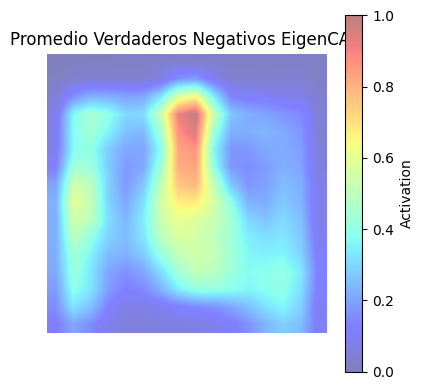

In [ ]:
draw_heatmap(results, "Promedio Verdaderos Negativos EigenCAM")

##### Falsos Positivos

In [ ]:
fp_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="FP")
len(fp_images)

187

In [ ]:
results = average_heatmaps(EigenCAM, fp_images)

Procesando para promedio: 922_test_0_.png


Procesando para promedio: 918_test_0_.png


Procesando para promedio: 91_test_0_.png


Procesando para promedio: 932_test_0_.png


Procesando para promedio: 940_test_0_.png


Procesando para promedio: 955_test_0_.png


Procesando para promedio: 966_test_0_.png


Procesando para promedio: 976_test_0_.png


Procesando para promedio: 991_test_0_.png


Procesando para promedio: 989_test_0_.png


Procesando para promedio: 841_test_0_.png


Procesando para promedio: 853_test_0_.png


Procesando para promedio: 83_test_0_.png


Procesando para promedio: 84_test_0_.png


Procesando para promedio: 848_test_0_.png


Procesando para promedio: 863_test_0_.png


Procesando para promedio: 860_test_0_.png


Procesando para promedio: 870_test_0_.png


Procesando para promedio: 887_test_0_.png


Procesando para promedio: 88_test_0_.png


Procesando para promedio: 900_test_0_.png


Procesando para promedio: 897_test_0_.png


Procesando para promedio: 747_test_0_.png


Procesando para promedio: 748_test_0_.png


Procesando para promedio: 765_test_0_.png


Procesando para promedio: 767_test_0_.png


Procesando para promedio: 78_test_0_.png


Procesando para promedio: 795_test_0_.png


Procesando para promedio: 786_test_0_.png


Procesando para promedio: 808_test_0_.png


Procesando para promedio: 79_test_0_.png


Procesando para promedio: 801_test_0_.png


Procesando para promedio: 810_test_0_.png


Procesando para promedio: 817_test_0_.png


Procesando para promedio: 815_test_0_.png


Procesando para promedio: 82_test_0_.png


Procesando para promedio: 685_test_0_.png


Procesando para promedio: 68_test_0_.png


Procesando para promedio: 690_test_0_.png


Procesando para promedio: 676_test_0_.png


Procesando para promedio: 696_test_0_.png


Procesando para promedio: 702_test_0_.png


Procesando para promedio: 706_test_0_.png


Procesando para promedio: 700_test_0_.png


Procesando para promedio: 712_test_0_.png


Procesando para promedio: 724_test_0_.png


Procesando para promedio: 600_test_0_.png


Procesando para promedio: 617_test_0_.png


Procesando para promedio: 610_test_0_.png


Procesando para promedio: 616_test_0_.png


Procesando para promedio: 628_test_0_.png


Procesando para promedio: 659_test_0_.png


Procesando para promedio: 684_test_0_.png


Procesando para promedio: 49_test_0_.png


Procesando para promedio: 521_test_0_.png


Procesando para promedio: 522_test_0_.png


Procesando para promedio: 528_test_0_.png


Procesando para promedio: 517_test_0_.png


Procesando para promedio: 52_test_0_.png


Procesando para promedio: 513_test_0_.png


Procesando para promedio: 530_test_0_.png


Procesando para promedio: 529_test_0_.png


Procesando para promedio: 516_test_0_.png


Procesando para promedio: 549_test_0_.png


Procesando para promedio: 555_test_0_.png


Procesando para promedio: 556_test_0_.png


Procesando para promedio: 537_test_0_.png


Procesando para promedio: 568_test_0_.png


Procesando para promedio: 59_test_0_.png


Procesando para promedio: 591_test_0_.png


Procesando para promedio: 594_test_0_.png


Procesando para promedio: 586_test_0_.png


Procesando para promedio: 434_test_0_.png


Procesando para promedio: 433_test_0_.png


Procesando para promedio: 440_test_0_.png


Procesando para promedio: 44_test_0_.png


Procesando para promedio: 490_test_0_.png


Procesando para promedio: 472_test_0_.png


Procesando para promedio: 470_test_0_.png


Procesando para promedio: 477_test_0_.png


Procesando para promedio: 496_test_0_.png


Procesando para promedio: 50_test_0_.png


Procesando para promedio: 348_test_0_.png


Procesando para promedio: 349_test_0_.png


Procesando para promedio: 344_test_0_.png


Procesando para promedio: 347_test_0_.png


Procesando para promedio: 358_test_0_.png


Procesando para promedio: 371_test_0_.png


Procesando para promedio: 394_test_0_.png


Procesando para promedio: 399_test_0_.png


Procesando para promedio: 397_test_0_.png


Procesando para promedio: 408_test_0_.png


Procesando para promedio: 388_test_0_.png


Procesando para promedio: 3_test_0_.png


Procesando para promedio: 395_test_0_.png


Procesando para promedio: 419_test_0_.png


Procesando para promedio: 420_test_0_.png


Procesando para promedio: 29_test_0_.png


Procesando para promedio: 295_test_0_.png


Procesando para promedio: 303_test_0_.png


Procesando para promedio: 307_test_0_.png


Procesando para promedio: 308_test_0_.png


Procesando para promedio: 317_test_0_.png


Procesando para promedio: 302_test_0_.png


Procesando para promedio: 299_test_0_.png


Procesando para promedio: 294_test_0_.png


Procesando para promedio: 339_test_0_.png


Procesando para promedio: 335_test_0_.png


Procesando para promedio: 333_test_0_.png


Procesando para promedio: 343_test_0_.png


Procesando para promedio: 342_test_0_.png


Procesando para promedio: 332_test_0_.png


Procesando para promedio: 31_test_0_.png


Procesando para promedio: 328_test_0_.png


Procesando para promedio: 330_test_0_.png


Procesando para promedio: 192_test_0_.png


Procesando para promedio: 185_test_0_.png


Procesando para promedio: 208_test_0_.png


Procesando para promedio: 210_test_0_.png


Procesando para promedio: 215_test_0_.png


Procesando para promedio: 222_test_0_.png


Procesando para promedio: 240_test_0_.png


Procesando para promedio: 236_test_0_.png


Procesando para promedio: 260_test_0_.png


Procesando para promedio: 247_test_0_.png


Procesando para promedio: 24_test_0_.png


Procesando para promedio: 254_test_0_.png


Procesando para promedio: 252_test_0_.png


Procesando para promedio: 1180_test_0_.png


Procesando para promedio: 1172_test_0_.png


Procesando para promedio: 1281_test_0_.png


Procesando para promedio: 1313_test_0_.png


Procesando para promedio: 1261_test_0_.png


Procesando para promedio: 1242_test_0_.png


Procesando para promedio: 1190_test_0_.png


Procesando para promedio: 1243_test_0_.png


Procesando para promedio: 1182_test_0_.png


Procesando para promedio: 1279_test_0_.png


Procesando para promedio: 122_test_0_.png


Procesando para promedio: 121_test_0_.png


Procesando para promedio: 1258_test_0_.png


Procesando para promedio: 124_test_0_.png


Procesando para promedio: 1214_test_0_.png


Procesando para promedio: 1189_test_0_.png


Procesando para promedio: 1236_test_0_.png


Procesando para promedio: 1237_test_0_.png


Procesando para promedio: 1265_test_0_.png


Procesando para promedio: 1210_test_0_.png


Procesando para promedio: 1331_test_0_.png


Procesando para promedio: 1347_test_0_.png


Procesando para promedio: 133_test_0_.png


Procesando para promedio: 1334_test_0_.png


Procesando para promedio: 139_test_0_.png


Procesando para promedio: 1364_test_0_.png


Procesando para promedio: 137_test_0_.png


Procesando para promedio: 1366_test_0_.png


Procesando para promedio: 142_test_0_.png


Procesando para promedio: 1350_test_0_.png


Procesando para promedio: 1370_test_0_.png


Procesando para promedio: 149_test_0_.png


Procesando para promedio: 1333_test_0_.png


Procesando para promedio: 161_test_0_.png


Procesando para promedio: 177_test_0_.png


Procesando para promedio: 169_test_0_.png


Procesando para promedio: 170_test_0_.png


Procesando para promedio: 1015_test_0_.png


Procesando para promedio: 1005_test_0_.png


Procesando para promedio: 1049_test_0_.png


Procesando para promedio: 1039_test_0_.png


Procesando para promedio: 1046_test_0_.png


Procesando para promedio: 1176_test_0_.png


Procesando para promedio: 1161_test_0_.png


Procesando para promedio: 1177_test_0_.png


Procesando para promedio: 1118_test_0_.png


Procesando para promedio: 1095_test_0_.png


Procesando para promedio: 1101_test_0_.png


Procesando para promedio: 1165_test_0_.png


Procesando para promedio: 1076_test_0_.png


Procesando para promedio: 1140_test_0_.png


Procesando para promedio: 1089_test_0_.png


Procesando para promedio: 1143_test_0_.png


Procesando para promedio: 1166_test_0_.png


Procesando para promedio: 1114_test_0_.png


Procesando para promedio: 1082_test_0_.png


Procesando para promedio: 1144_test_0_.png


Procesando para promedio: 1108_test_0_.png


Procesando para promedio: 1011_test_0_.png


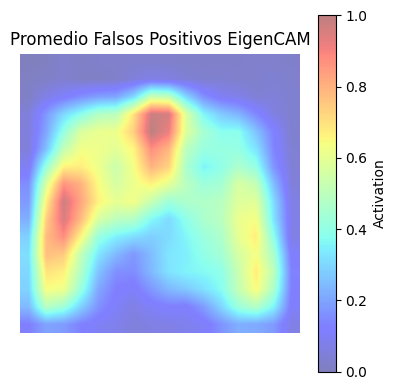

In [ ]:
draw_heatmap(results, "Promedio Falsos Positivos EigenCAM")

##### Falsos Negativos

In [ ]:
fn_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="FN")
len(fn_images)

56

In [ ]:
results = average_heatmaps(EigenCAM, fn_images)

Procesando para promedio: 957_test_1_.png


Procesando para promedio: 977_test_1_.png


Procesando para promedio: 990_test_1_.png


Procesando para promedio: 883_test_1_.png


Procesando para promedio: 893_test_1_.png


Procesando para promedio: 891_test_1_.png


Procesando para promedio: 896_test_1_.png


Procesando para promedio: 758_test_1_.png


Procesando para promedio: 759_test_1_.png


Procesando para promedio: 77_test_1_.png


Procesando para promedio: 791_test_1_.png


Procesando para promedio: 780_test_1_.png


Procesando para promedio: 813_test_1_.png


Procesando para promedio: 671_test_1_.png


Procesando para promedio: 670_test_1_.png


Procesando para promedio: 707_test_1_.png


Procesando para promedio: 703_test_1_.png


Procesando para promedio: 726_test_1_.png


Procesando para promedio: 74_test_1_.png


Procesando para promedio: 595_test_1_.png


Procesando para promedio: 640_test_1_.png


Procesando para promedio: 526_test_1_.png


Procesando para promedio: 598_test_1_.png


Procesando para promedio: 445_test_1_.png


Procesando para promedio: 506_test_1_.png


Procesando para promedio: 372_test_1_.png


Procesando para promedio: 376_test_1_.png


Procesando para promedio: 316_test_1_.png


Procesando para promedio: 325_test_1_.png


Procesando para promedio: 341_test_1_.png


Procesando para promedio: 181_test_1_.png


Procesando para promedio: 219_test_1_.png


Procesando para promedio: 242_test_1_.png


Procesando para promedio: 1299_test_1_.png


Procesando para promedio: 1278_test_1_.png


Procesando para promedio: 1290_test_1_.png


Procesando para promedio: 1221_test_1_.png


Procesando para promedio: 1250_test_1_.png


Procesando para promedio: 1247_test_1_.png


Procesando para promedio: 1293_test_1_.png


Procesando para promedio: 129_test_1_.png


Procesando para promedio: 1240_test_1_.png


Procesando para promedio: 1192_test_1_.png


Procesando para promedio: 1207_test_1_.png


Procesando para promedio: 1220_test_1_.png


Procesando para promedio: 1317_test_1_.png


Procesando para promedio: 1335_test_1_.png


Procesando para promedio: 1354_test_1_.png


Procesando para promedio: 174_test_1_.png


Procesando para promedio: 1029_test_1_.png


Procesando para promedio: 1027_test_1_.png


Procesando para promedio: 1109_test_1_.png


Procesando para promedio: 1092_test_1_.png


Procesando para promedio: 1115_test_1_.png


Procesando para promedio: 1122_test_1_.png


Procesando para promedio: 1010_test_1_.png


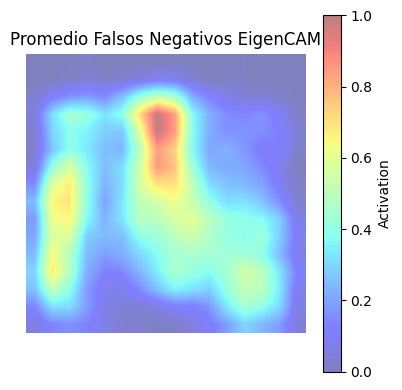

In [ ]:
draw_heatmap(results, "Promedio Falsos Negativos EigenCAM")

#### Calculamos el promedio de XGradCAM

##### Verdaderos Positivos

In [ ]:
vp_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="VP")
len(vp_images)

234

In [ ]:
results = average_heatmaps(XGradCAM, vp_images)

Procesando para promedio: 914_test_1_.png


Procesando para promedio: 924_test_1_.png


Procesando para promedio: 920_test_1_.png


Procesando para promedio: 928_test_1_.png


Procesando para promedio: 949_test_1_.png


Procesando para promedio: 939_test_1_.png


Procesando para promedio: 941_test_1_.png


Procesando para promedio: 94_test_1_.png


Procesando para promedio: 942_test_1_.png


Procesando para promedio: 943_test_1_.png


Procesando para promedio: 938_test_1_.png


Procesando para promedio: 958_test_1_.png


Procesando para promedio: 972_test_1_.png


Procesando para promedio: 988_test_1_.png


Procesando para promedio: 985_test_1_.png


Procesando para promedio: 98_test_1_.png


Procesando para promedio: 982_test_1_.png


Procesando para promedio: 986_test_1_.png


Procesando para promedio: 99_test_1_.png


Procesando para promedio: 846_test_1_.png


Procesando para promedio: 852_test_1_.png


Procesando para promedio: 861_test_1_.png


Procesando para promedio: 858_test_1_.png


Procesando para promedio: 866_test_1_.png


Procesando para promedio: 878_test_1_.png


Procesando para promedio: 877_test_1_.png


Procesando para promedio: 86_test_1_.png


Procesando para promedio: 889_test_1_.png


Procesando para promedio: 894_test_1_.png


Procesando para promedio: 886_test_1_.png


Procesando para promedio: 908_test_1_.png


Procesando para promedio: 89_test_1_.png


Procesando para promedio: 911_test_1_.png


Procesando para promedio: 90_test_1_.png


Procesando para promedio: 913_test_1_.png


Procesando para promedio: 756_test_1_.png


Procesando para promedio: 763_test_1_.png


Procesando para promedio: 76_test_1_.png


Procesando para promedio: 776_test_1_.png


Procesando para promedio: 784_test_1_.png


Procesando para promedio: 783_test_1_.png


Procesando para promedio: 785_test_1_.png


Procesando para promedio: 7_test_1_.png


Procesando para promedio: 814_test_1_.png


Procesando para promedio: 80_test_1_.png


Procesando para promedio: 821_test_1_.png


Procesando para promedio: 831_test_1_.png


Procesando para promedio: 834_test_1_.png


Procesando para promedio: 826_test_1_.png


Procesando para promedio: 823_test_1_.png


Procesando para promedio: 705_test_1_.png


Procesando para promedio: 6_test_1_.png


Procesando para promedio: 694_test_1_.png


Procesando para promedio: 693_test_1_.png


Procesando para promedio: 717_test_1_.png


Procesando para promedio: 713_test_1_.png


Procesando para promedio: 718_test_1_.png


Procesando para promedio: 710_test_1_.png


Procesando para promedio: 732_test_1_.png


Procesando para promedio: 722_test_1_.png


Procesando para promedio: 737_test_1_.png


Procesando para promedio: 740_test_1_.png


Procesando para promedio: 745_test_1_.png


Procesando para promedio: 588_test_1_.png


Procesando para promedio: 634_test_1_.png


Procesando para promedio: 630_test_1_.png


Procesando para promedio: 623_test_1_.png


Procesando para promedio: 605_test_1_.png


Procesando para promedio: 631_test_1_.png


Procesando para promedio: 64_test_1_.png


Procesando para promedio: 654_test_1_.png


Procesando para promedio: 653_test_1_.png


Procesando para promedio: 663_test_1_.png


Procesando para promedio: 665_test_1_.png


Procesando para promedio: 645_test_1_.png


Procesando para promedio: 641_test_1_.png


Procesando para promedio: 656_test_1_.png


Procesando para promedio: 658_test_1_.png


Procesando para promedio: 661_test_1_.png


Procesando para promedio: 667_test_1_.png


Procesando para promedio: 687_test_1_.png


Procesando para promedio: 531_test_1_.png


Procesando para promedio: 512_test_1_.png


Procesando para promedio: 520_test_1_.png


Procesando para promedio: 518_test_1_.png


Procesando para promedio: 553_test_1_.png


Procesando para promedio: 543_test_1_.png


Procesando para promedio: 552_test_1_.png


Procesando para promedio: 550_test_1_.png


Procesando para promedio: 566_test_1_.png


Procesando para promedio: 572_test_1_.png


Procesando para promedio: 570_test_1_.png


Procesando para promedio: 557_test_1_.png


Procesando para promedio: 558_test_1_.png


Procesando para promedio: 585_test_1_.png


Procesando para promedio: 418_test_1_.png


Procesando para promedio: 424_test_1_.png


Procesando para promedio: 441_test_1_.png


Procesando para promedio: 435_test_1_.png


Procesando para promedio: 446_test_1_.png


Procesando para promedio: 448_test_1_.png


Procesando para promedio: 452_test_1_.png


Procesando para promedio: 449_test_1_.png


Procesando para promedio: 469_test_1_.png


Procesando para promedio: 47_test_1_.png


Procesando para promedio: 483_test_1_.png


Procesando para promedio: 491_test_1_.png


Procesando para promedio: 476_test_1_.png


Procesando para promedio: 485_test_1_.png


Procesando para promedio: 498_test_1_.png


Procesando para promedio: 500_test_1_.png


Procesando para promedio: 492_test_1_.png


Procesando para promedio: 509_test_1_.png


Procesando para promedio: 495_test_1_.png


Procesando para promedio: 37_test_1_.png


Procesando para promedio: 364_test_1_.png


Procesando para promedio: 378_test_1_.png


Procesando para promedio: 356_test_1_.png


Procesando para promedio: 366_test_1_.png


Procesando para promedio: 385_test_1_.png


Procesando para promedio: 415_test_1_.png


Procesando para promedio: 406_test_1_.png


Procesando para promedio: 387_test_1_.png


Procesando para promedio: 392_test_1_.png


Procesando para promedio: 42_test_1_.png


Procesando para promedio: 437_test_1_.png


Procesando para promedio: 432_test_1_.png


Procesando para promedio: 426_test_1_.png


Procesando para promedio: 287_test_1_.png


Procesando para promedio: 290_test_1_.png


Procesando para promedio: 284_test_1_.png


Procesando para promedio: 288_test_1_.png


Procesando para promedio: 266_test_1_.png


Procesando para promedio: 264_test_1_.png


Procesando para promedio: 279_test_1_.png


Procesando para promedio: 291_test_1_.png


Procesando para promedio: 301_test_1_.png


Procesando para promedio: 315_test_1_.png


Procesando para promedio: 336_test_1_.png


Procesando para promedio: 340_test_1_.png


Procesando para promedio: 337_test_1_.png


Procesando para promedio: 324_test_1_.png


Procesando para promedio: 322_test_1_.png


Procesando para promedio: 19_test_1_.png


Procesando para promedio: 193_test_1_.png


Procesando para promedio: 217_test_1_.png


Procesando para promedio: 204_test_1_.png


Procesando para promedio: 218_test_1_.png


Procesando para promedio: 205_test_1_.png


Procesando para promedio: 206_test_1_.png


Procesando para promedio: 223_test_1_.png


Procesando para promedio: 250_test_1_.png


Procesando para promedio: 25_test_1_.png


Procesando para promedio: 263_test_1_.png


Procesando para promedio: 1083_test_1_.png


Procesando para promedio: 1195_test_1_.png


Procesando para promedio: 1307_test_1_.png


Procesando para promedio: 1264_test_1_.png


Procesando para promedio: 1291_test_1_.png


Procesando para promedio: 1254_test_1_.png


Procesando para promedio: 1225_test_1_.png


Procesando para promedio: 1244_test_1_.png


Procesando para promedio: 1202_test_1_.png


Procesando para promedio: 1294_test_1_.png


Procesando para promedio: 1194_test_1_.png


Procesando para promedio: 1298_test_1_.png


Procesando para promedio: 1212_test_1_.png


Procesando para promedio: 1205_test_1_.png


Procesando para promedio: 1249_test_1_.png


Procesando para promedio: 1285_test_1_.png


Procesando para promedio: 1246_test_1_.png


Procesando para promedio: 1314_test_1_.png


Procesando para promedio: 1315_test_1_.png


Procesando para promedio: 1226_test_1_.png


Procesando para promedio: 1209_test_1_.png


Procesando para promedio: 1312_test_1_.png


Procesando para promedio: 1337_test_1_.png


Procesando para promedio: 146_test_1_.png


Procesando para promedio: 145_test_1_.png


Procesando para promedio: 1348_test_1_.png


Procesando para promedio: 1359_test_1_.png


Procesando para promedio: 1368_test_1_.png


Procesando para promedio: 1326_test_1_.png


Procesando para promedio: 152_test_1_.png


Procesando para promedio: 1319_test_1_.png


Procesando para promedio: 147_test_1_.png


Procesando para promedio: 1332_test_1_.png


Procesando para promedio: 1356_test_1_.png


Procesando para promedio: 1329_test_1_.png


Procesando para promedio: 1349_test_1_.png


Procesando para promedio: 1327_test_1_.png


Procesando para promedio: 1363_test_1_.png


Procesando para promedio: 1325_test_1_.png


Procesando para promedio: 17_test_1_.png


Procesando para promedio: 160_test_1_.png


Procesando para promedio: 153_test_1_.png


Procesando para promedio: 156_test_1_.png


Procesando para promedio: 168_test_1_.png


Procesando para promedio: 184_test_1_.png


Procesando para promedio: 1014_test_1_.png


Procesando para promedio: 1033_test_1_.png


Procesando para promedio: 1031_test_1_.png


Procesando para promedio: 101_test_1_.png


Procesando para promedio: 1035_test_1_.png


Procesando para promedio: 1057_test_1_.png


Procesando para promedio: 1040_test_1_.png


Procesando para promedio: 1059_test_1_.png


Procesando para promedio: 1044_test_1_.png


Procesando para promedio: 1054_test_1_.png


Procesando para promedio: 1042_test_1_.png


Procesando para promedio: 1058_test_1_.png


Procesando para promedio: 1053_test_1_.png


Procesando para promedio: 1103_test_1_.png


Procesando para promedio: 115_test_1_.png


Procesando para promedio: 1084_test_1_.png


Procesando para promedio: 1120_test_1_.png


Procesando para promedio: 1102_test_1_.png


Procesando para promedio: 1178_test_1_.png


Procesando para promedio: 1151_test_1_.png


Procesando para promedio: 1132_test_1_.png


Procesando para promedio: 1062_test_1_.png


Procesando para promedio: 1141_test_1_.png


Procesando para promedio: 1071_test_1_.png


Procesando para promedio: 111_test_1_.png


Procesando para promedio: 1086_test_1_.png


Procesando para promedio: 1105_test_1_.png


Procesando para promedio: 1154_test_1_.png


Procesando para promedio: 1160_test_1_.png


Procesando para promedio: 1145_test_1_.png


Procesando para promedio: 1077_test_1_.png


Procesando para promedio: 1069_test_1_.png


Procesando para promedio: 1090_test_1_.png


Procesando para promedio: 0_test_1_.png


Procesando para promedio: 1007_test_1_.png


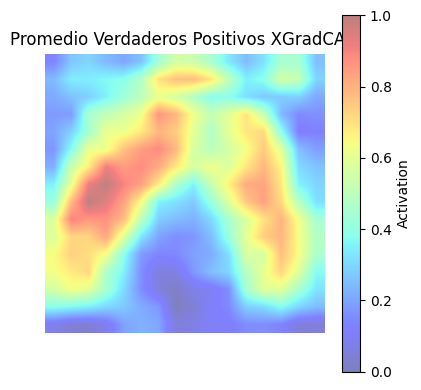

In [ ]:
draw_heatmap(results, "Promedio Verdaderos Positivos XGradCAM")

##### Verdaderos Negativos

In [ ]:
vn_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="VN")
len(vn_images)

895

In [ ]:
results = average_heatmaps(XGradCAM, vn_images)

Procesando para promedio: 915_test_0_.png


Procesando para promedio: 925_test_0_.png


Procesando para promedio: 917_test_0_.png


Procesando para promedio: 929_test_0_.png


Procesando para promedio: 92_test_0_.png


Procesando para promedio: 933_test_0_.png


Procesando para promedio: 937_test_0_.png


Procesando para promedio: 930_test_0_.png


Procesando para promedio: 934_test_0_.png


Procesando para promedio: 936_test_0_.png


Procesando para promedio: 935_test_0_.png


Procesando para promedio: 927_test_0_.png


Procesando para promedio: 931_test_0_.png


Procesando para promedio: 945_test_0_.png


Procesando para promedio: 950_test_0_.png


Procesando para promedio: 944_test_0_.png


Procesando para promedio: 951_test_0_.png


Procesando para promedio: 946_test_0_.png


Procesando para promedio: 948_test_0_.png


Procesando para promedio: 93_test_0_.png


Procesando para promedio: 947_test_0_.png


Procesando para promedio: 960_test_0_.png


Procesando para promedio: 962_test_0_.png


Procesando para promedio: 954_test_0_.png


Procesando para promedio: 964_test_0_.png


Procesando para promedio: 953_test_0_.png


Procesando para promedio: 952_test_0_.png


Procesando para promedio: 95_test_0_.png


Procesando para promedio: 956_test_0_.png


Procesando para promedio: 967_test_0_.png


Procesando para promedio: 959_test_0_.png


Procesando para promedio: 961_test_0_.png


Procesando para promedio: 965_test_0_.png


Procesando para promedio: 963_test_0_.png


Procesando para promedio: 974_test_0_.png


Procesando para promedio: 979_test_0_.png


Procesando para promedio: 971_test_0_.png


Procesando para promedio: 975_test_0_.png


Procesando para promedio: 978_test_0_.png


Procesando para promedio: 981_test_0_.png


Procesando para promedio: 968_test_0_.png


Procesando para promedio: 980_test_0_.png


Procesando para promedio: 96_test_0_.png


Procesando para promedio: 97_test_0_.png


Procesando para promedio: 973_test_0_.png


Procesando para promedio: 969_test_0_.png


Procesando para promedio: 970_test_0_.png


Procesando para promedio: 992_test_0_.png


Procesando para promedio: 987_test_0_.png


Procesando para promedio: 984_test_0_.png


Procesando para promedio: 993_test_0_.png


Procesando para promedio: 983_test_0_.png


Procesando para promedio: 998_test_0_.png


Procesando para promedio: 996_test_0_.png


Procesando para promedio: 994_test_0_.png


Procesando para promedio: 999_test_0_.png


Procesando para promedio: 997_test_0_.png


Procesando para promedio: 995_test_0_.png


Procesando para promedio: 9_test_0_.png


Procesando para promedio: 842_test_0_.png


Procesando para promedio: 837_test_0_.png


Procesando para promedio: 840_test_0_.png


Procesando para promedio: 849_test_0_.png


Procesando para promedio: 851_test_0_.png


Procesando para promedio: 843_test_0_.png


Procesando para promedio: 845_test_0_.png


Procesando para promedio: 836_test_0_.png


Procesando para promedio: 847_test_0_.png


Procesando para promedio: 854_test_0_.png


Procesando para promedio: 855_test_0_.png


Procesando para promedio: 844_test_0_.png


Procesando para promedio: 835_test_0_.png


Procesando para promedio: 839_test_0_.png


Procesando para promedio: 85_test_0_.png


Procesando para promedio: 857_test_0_.png


Procesando para promedio: 868_test_0_.png


Procesando para promedio: 865_test_0_.png


Procesando para promedio: 859_test_0_.png


Procesando para promedio: 856_test_0_.png


Procesando para promedio: 867_test_0_.png


Procesando para promedio: 862_test_0_.png


Procesando para promedio: 864_test_0_.png


Procesando para promedio: 87_test_0_.png


Procesando para promedio: 882_test_0_.png


Procesando para promedio: 875_test_0_.png


Procesando para promedio: 879_test_0_.png


Procesando para promedio: 871_test_0_.png


Procesando para promedio: 876_test_0_.png


Procesando para promedio: 872_test_0_.png


Procesando para promedio: 869_test_0_.png


Procesando para promedio: 874_test_0_.png


Procesando para promedio: 881_test_0_.png


Procesando para promedio: 880_test_0_.png


Procesando para promedio: 873_test_0_.png


Procesando para promedio: 888_test_0_.png


Procesando para promedio: 892_test_0_.png


Procesando para promedio: 895_test_0_.png


Procesando para promedio: 890_test_0_.png


Procesando para promedio: 885_test_0_.png


Procesando para promedio: 884_test_0_.png


Procesando para promedio: 909_test_0_.png


Procesando para promedio: 899_test_0_.png


Procesando para promedio: 901_test_0_.png


Procesando para promedio: 905_test_0_.png


Procesando para promedio: 902_test_0_.png


Procesando para promedio: 907_test_0_.png


Procesando para promedio: 903_test_0_.png


Procesando para promedio: 906_test_0_.png


Procesando para promedio: 898_test_0_.png


Procesando para promedio: 910_test_0_.png


Procesando para promedio: 8_test_0_.png


Procesando para promedio: 904_test_0_.png


Procesando para promedio: 921_test_0_.png


Procesando para promedio: 926_test_0_.png


Procesando para promedio: 916_test_0_.png


Procesando para promedio: 912_test_0_.png


Procesando para promedio: 919_test_0_.png


Procesando para promedio: 923_test_0_.png


Procesando para promedio: 760_test_0_.png


Procesando para promedio: 755_test_0_.png


Procesando para promedio: 751_test_0_.png


Procesando para promedio: 750_test_0_.png


Procesando para promedio: 749_test_0_.png


Procesando para promedio: 752_test_0_.png


Procesando para promedio: 774_test_0_.png


Procesando para promedio: 771_test_0_.png


Procesando para promedio: 764_test_0_.png


Procesando para promedio: 770_test_0_.png


Procesando para promedio: 775_test_0_.png


Procesando para promedio: 773_test_0_.png


Procesando para promedio: 768_test_0_.png


Procesando para promedio: 779_test_0_.png


Procesando para promedio: 778_test_0_.png


Procesando para promedio: 777_test_0_.png


Procesando para promedio: 766_test_0_.png


Procesando para promedio: 769_test_0_.png


Procesando para promedio: 772_test_0_.png


Procesando para promedio: 790_test_0_.png


Procesando para promedio: 788_test_0_.png


Procesando para promedio: 792_test_0_.png


Procesando para promedio: 782_test_0_.png


Procesando para promedio: 781_test_0_.png


Procesando para promedio: 787_test_0_.png


Procesando para promedio: 793_test_0_.png


Procesando para promedio: 794_test_0_.png


Procesando para promedio: 789_test_0_.png


Procesando para promedio: 803_test_0_.png


Procesando para promedio: 806_test_0_.png


Procesando para promedio: 800_test_0_.png


Procesando para promedio: 796_test_0_.png


Procesando para promedio: 802_test_0_.png


Procesando para promedio: 805_test_0_.png


Procesando para promedio: 807_test_0_.png


Procesando para promedio: 797_test_0_.png


Procesando para promedio: 804_test_0_.png


Procesando para promedio: 799_test_0_.png


Procesando para promedio: 798_test_0_.png


Procesando para promedio: 818_test_0_.png


Procesando para promedio: 816_test_0_.png


Procesando para promedio: 820_test_0_.png


Procesando para promedio: 809_test_0_.png


Procesando para promedio: 819_test_0_.png


Procesando para promedio: 812_test_0_.png


Procesando para promedio: 811_test_0_.png


Procesando para promedio: 81_test_0_.png


Procesando para promedio: 830_test_0_.png


Procesando para promedio: 825_test_0_.png


Procesando para promedio: 828_test_0_.png


Procesando para promedio: 827_test_0_.png


Procesando para promedio: 824_test_0_.png


Procesando para promedio: 822_test_0_.png


Procesando para promedio: 833_test_0_.png


Procesando para promedio: 829_test_0_.png


Procesando para promedio: 832_test_0_.png


Procesando para promedio: 850_test_0_.png


Procesando para promedio: 838_test_0_.png


Procesando para promedio: 67_test_0_.png


Procesando para promedio: 681_test_0_.png


Procesando para promedio: 686_test_0_.png


Procesando para promedio: 672_test_0_.png


Procesando para promedio: 683_test_0_.png


Procesando para promedio: 674_test_0_.png


Procesando para promedio: 669_test_0_.png


Procesando para promedio: 680_test_0_.png


Procesando para promedio: 682_test_0_.png


Procesando para promedio: 688_test_0_.png


Procesando para promedio: 677_test_0_.png


Procesando para promedio: 689_test_0_.png


Procesando para promedio: 66_test_0_.png


Procesando para promedio: 679_test_0_.png


Procesando para promedio: 678_test_0_.png


Procesando para promedio: 695_test_0_.png


Procesando para promedio: 699_test_0_.png


Procesando para promedio: 691_test_0_.png


Procesando para promedio: 701_test_0_.png


Procesando para promedio: 697_test_0_.png


Procesando para promedio: 692_test_0_.png


Procesando para promedio: 704_test_0_.png


Procesando para promedio: 698_test_0_.png


Procesando para promedio: 69_test_0_.png


Procesando para promedio: 708_test_0_.png


Procesando para promedio: 720_test_0_.png


Procesando para promedio: 716_test_0_.png


Procesando para promedio: 714_test_0_.png


Procesando para promedio: 70_test_0_.png


Procesando para promedio: 709_test_0_.png


Procesando para promedio: 715_test_0_.png


Procesando para promedio: 719_test_0_.png


Procesando para promedio: 711_test_0_.png


Procesando para promedio: 71_test_0_.png


Procesando para promedio: 728_test_0_.png


Procesando para promedio: 723_test_0_.png


Procesando para promedio: 72_test_0_.png


Procesando para promedio: 730_test_0_.png


Procesando para promedio: 731_test_0_.png


Procesando para promedio: 721_test_0_.png


Procesando para promedio: 733_test_0_.png


Procesando para promedio: 729_test_0_.png


Procesando para promedio: 725_test_0_.png


Procesando para promedio: 727_test_0_.png


Procesando para promedio: 744_test_0_.png


Procesando para promedio: 73_test_0_.png


Procesando para promedio: 742_test_0_.png


Procesando para promedio: 743_test_0_.png


Procesando para promedio: 746_test_0_.png


Procesando para promedio: 739_test_0_.png


Procesando para promedio: 736_test_0_.png


Procesando para promedio: 738_test_0_.png


Procesando para promedio: 734_test_0_.png


Procesando para promedio: 735_test_0_.png


Procesando para promedio: 741_test_0_.png


Procesando para promedio: 753_test_0_.png


Procesando para promedio: 754_test_0_.png


Procesando para promedio: 761_test_0_.png


Procesando para promedio: 75_test_0_.png


Procesando para promedio: 757_test_0_.png


Procesando para promedio: 762_test_0_.png


Procesando para promedio: 583_test_0_.png


Procesando para promedio: 574_test_0_.png


Procesando para promedio: 580_test_0_.png


Procesando para promedio: 597_test_0_.png


Procesando para promedio: 587_test_0_.png


Procesando para promedio: 578_test_0_.png


Procesando para promedio: 599_test_0_.png


Procesando para promedio: 622_test_0_.png


Procesando para promedio: 613_test_0_.png


Procesando para promedio: 60_test_0_.png


Procesando para promedio: 637_test_0_.png


Procesando para promedio: 606_test_0_.png


Procesando para promedio: 612_test_0_.png


Procesando para promedio: 620_test_0_.png


Procesando para promedio: 611_test_0_.png


Procesando para promedio: 61_test_0_.png


Procesando para promedio: 638_test_0_.png


Procesando para promedio: 615_test_0_.png


Procesando para promedio: 621_test_0_.png


Procesando para promedio: 625_test_0_.png


Procesando para promedio: 619_test_0_.png


Procesando para promedio: 633_test_0_.png


Procesando para promedio: 627_test_0_.png


Procesando para promedio: 636_test_0_.png


Procesando para promedio: 635_test_0_.png


Procesando para promedio: 624_test_0_.png


Procesando para promedio: 603_test_0_.png


Procesando para promedio: 604_test_0_.png


Procesando para promedio: 626_test_0_.png


Procesando para promedio: 614_test_0_.png


Procesando para promedio: 618_test_0_.png


Procesando para promedio: 608_test_0_.png


Procesando para promedio: 632_test_0_.png


Procesando para promedio: 609_test_0_.png


Procesando para promedio: 607_test_0_.png


Procesando para promedio: 62_test_0_.png


Procesando para promedio: 629_test_0_.png


Procesando para promedio: 649_test_0_.png


Procesando para promedio: 660_test_0_.png


Procesando para promedio: 646_test_0_.png


Procesando para promedio: 652_test_0_.png


Procesando para promedio: 643_test_0_.png


Procesando para promedio: 648_test_0_.png


Procesando para promedio: 666_test_0_.png


Procesando para promedio: 644_test_0_.png


Procesando para promedio: 662_test_0_.png


Procesando para promedio: 642_test_0_.png


Procesando para promedio: 655_test_0_.png


Procesando para promedio: 639_test_0_.png


Procesando para promedio: 65_test_0_.png


Procesando para promedio: 63_test_0_.png


Procesando para promedio: 647_test_0_.png


Procesando para promedio: 651_test_0_.png


Procesando para promedio: 650_test_0_.png


Procesando para promedio: 664_test_0_.png


Procesando para promedio: 657_test_0_.png


Procesando para promedio: 668_test_0_.png


Procesando para promedio: 673_test_0_.png


Procesando para promedio: 675_test_0_.png


Procesando para promedio: 507_test_0_.png


Procesando para promedio: 510_test_0_.png


Procesando para promedio: 502_test_0_.png


Procesando para promedio: 503_test_0_.png


Procesando para promedio: 511_test_0_.png


Procesando para promedio: 536_test_0_.png


Procesando para promedio: 515_test_0_.png


Procesando para promedio: 514_test_0_.png


Procesando para promedio: 524_test_0_.png


Procesando para promedio: 533_test_0_.png


Procesando para promedio: 534_test_0_.png


Procesando para promedio: 519_test_0_.png


Procesando para promedio: 51_test_0_.png


Procesando para promedio: 535_test_0_.png


Procesando para promedio: 525_test_0_.png


Procesando para promedio: 527_test_0_.png


Procesando para promedio: 532_test_0_.png


Procesando para promedio: 523_test_0_.png


Procesando para promedio: 544_test_0_.png


Procesando para promedio: 545_test_0_.png


Procesando para promedio: 551_test_0_.png


Procesando para promedio: 53_test_0_.png


Procesando para promedio: 541_test_0_.png


Procesando para promedio: 538_test_0_.png


Procesando para promedio: 554_test_0_.png


Procesando para promedio: 540_test_0_.png


Procesando para promedio: 546_test_0_.png


Procesando para promedio: 547_test_0_.png


Procesando para promedio: 539_test_0_.png


Procesando para promedio: 542_test_0_.png


Procesando para promedio: 548_test_0_.png


Procesando para promedio: 54_test_0_.png


Procesando para promedio: 571_test_0_.png


Procesando para promedio: 560_test_0_.png


Procesando para promedio: 567_test_0_.png


Procesando para promedio: 563_test_0_.png


Procesando para promedio: 573_test_0_.png


Procesando para promedio: 569_test_0_.png


Procesando para promedio: 55_test_0_.png


Procesando para promedio: 565_test_0_.png


Procesando para promedio: 559_test_0_.png


Procesando para promedio: 562_test_0_.png


Procesando para promedio: 56_test_0_.png


Procesando para promedio: 561_test_0_.png


Procesando para promedio: 564_test_0_.png


Procesando para promedio: 58_test_0_.png


Procesando para promedio: 584_test_0_.png


Procesando para promedio: 596_test_0_.png


Procesando para promedio: 602_test_0_.png


Procesando para promedio: 577_test_0_.png


Procesando para promedio: 582_test_0_.png


Procesando para promedio: 593_test_0_.png


Procesando para promedio: 601_test_0_.png


Procesando para promedio: 579_test_0_.png


Procesando para promedio: 590_test_0_.png


Procesando para promedio: 581_test_0_.png


Procesando para promedio: 592_test_0_.png


Procesando para promedio: 5_test_0_.png


Procesando para promedio: 589_test_0_.png


Procesando para promedio: 575_test_0_.png


Procesando para promedio: 576_test_0_.png


Procesando para promedio: 57_test_0_.png


Procesando para promedio: 43_test_0_.png


Procesando para promedio: 423_test_0_.png


Procesando para promedio: 429_test_0_.png


Procesando para promedio: 425_test_0_.png


Procesando para promedio: 442_test_0_.png


Procesando para promedio: 443_test_0_.png


Procesando para promedio: 430_test_0_.png


Procesando para promedio: 444_test_0_.png


Procesando para promedio: 439_test_0_.png


Procesando para promedio: 438_test_0_.png


Procesando para promedio: 41_test_0_.png


Procesando para promedio: 422_test_0_.png


Procesando para promedio: 428_test_0_.png


Procesando para promedio: 457_test_0_.png


Procesando para promedio: 451_test_0_.png


Procesando para promedio: 459_test_0_.png


Procesando para promedio: 464_test_0_.png


Procesando para promedio: 466_test_0_.png


Procesando para promedio: 456_test_0_.png


Procesando para promedio: 460_test_0_.png


Procesando para promedio: 468_test_0_.png


Procesando para promedio: 450_test_0_.png


Procesando para promedio: 455_test_0_.png


Procesando para promedio: 463_test_0_.png


Procesando para promedio: 447_test_0_.png


Procesando para promedio: 465_test_0_.png


Procesando para promedio: 454_test_0_.png


Procesando para promedio: 453_test_0_.png


Procesando para promedio: 467_test_0_.png


Procesando para promedio: 461_test_0_.png


Procesando para promedio: 462_test_0_.png


Procesando para promedio: 458_test_0_.png


Procesando para promedio: 45_test_0_.png


Procesando para promedio: 489_test_0_.png


Procesando para promedio: 486_test_0_.png


Procesando para promedio: 471_test_0_.png


Procesando para promedio: 478_test_0_.png


Procesando para promedio: 479_test_0_.png


Procesando para promedio: 484_test_0_.png


Procesando para promedio: 46_test_0_.png


Procesando para promedio: 481_test_0_.png


Procesando para promedio: 488_test_0_.png


Procesando para promedio: 480_test_0_.png


Procesando para promedio: 475_test_0_.png


Procesando para promedio: 474_test_0_.png


Procesando para promedio: 473_test_0_.png


Procesando para promedio: 48_test_0_.png


Procesando para promedio: 487_test_0_.png


Procesando para promedio: 482_test_0_.png


Procesando para promedio: 493_test_0_.png


Procesando para promedio: 494_test_0_.png


Procesando para promedio: 4_test_0_.png


Procesando para promedio: 499_test_0_.png


Procesando para promedio: 501_test_0_.png


Procesando para promedio: 505_test_0_.png


Procesando para promedio: 504_test_0_.png


Procesando para promedio: 508_test_0_.png


Procesando para promedio: 497_test_0_.png


Procesando para promedio: 346_test_0_.png


Procesando para promedio: 352_test_0_.png


Procesando para promedio: 354_test_0_.png


Procesando para promedio: 351_test_0_.png


Procesando para promedio: 350_test_0_.png


Procesando para promedio: 353_test_0_.png


Procesando para promedio: 34_test_0_.png


Procesando para promedio: 355_test_0_.png


Procesando para promedio: 373_test_0_.png


Procesando para promedio: 382_test_0_.png


Procesando para promedio: 381_test_0_.png


Procesando para promedio: 379_test_0_.png


Procesando para promedio: 365_test_0_.png


Procesando para promedio: 369_test_0_.png


Procesando para promedio: 35_test_0_.png


Procesando para promedio: 360_test_0_.png


Procesando para promedio: 370_test_0_.png


Procesando para promedio: 383_test_0_.png


Procesando para promedio: 368_test_0_.png


Procesando para promedio: 361_test_0_.png


Procesando para promedio: 36_test_0_.png


Procesando para promedio: 374_test_0_.png


Procesando para promedio: 359_test_0_.png


Procesando para promedio: 362_test_0_.png


Procesando para promedio: 377_test_0_.png


Procesando para promedio: 357_test_0_.png


Procesando para promedio: 375_test_0_.png


Procesando para promedio: 367_test_0_.png


Procesando para promedio: 363_test_0_.png


Procesando para promedio: 384_test_0_.png


Procesando para promedio: 380_test_0_.png


Procesando para promedio: 411_test_0_.png


Procesando para promedio: 391_test_0_.png


Procesando para promedio: 410_test_0_.png


Procesando para promedio: 400_test_0_.png


Procesando para promedio: 403_test_0_.png


Procesando para promedio: 393_test_0_.png


Procesando para promedio: 40_test_0_.png


Procesando para promedio: 414_test_0_.png


Procesando para promedio: 407_test_0_.png


Procesando para promedio: 396_test_0_.png


Procesando para promedio: 412_test_0_.png


Procesando para promedio: 409_test_0_.png


Procesando para promedio: 38_test_0_.png


Procesando para promedio: 401_test_0_.png


Procesando para promedio: 402_test_0_.png


Procesando para promedio: 398_test_0_.png


Procesando para promedio: 389_test_0_.png


Procesando para promedio: 405_test_0_.png


Procesando para promedio: 416_test_0_.png


Procesando para promedio: 404_test_0_.png


Procesando para promedio: 413_test_0_.png


Procesando para promedio: 386_test_0_.png


Procesando para promedio: 39_test_0_.png


Procesando para promedio: 390_test_0_.png


Procesando para promedio: 417_test_0_.png


Procesando para promedio: 431_test_0_.png


Procesando para promedio: 421_test_0_.png


Procesando para promedio: 436_test_0_.png


Procesando para promedio: 427_test_0_.png


Procesando para promedio: 267_test_0_.png


Procesando para promedio: 272_test_0_.png


Procesando para promedio: 283_test_0_.png


Procesando para promedio: 289_test_0_.png


Procesando para promedio: 273_test_0_.png


Procesando para promedio: 269_test_0_.png


Procesando para promedio: 285_test_0_.png


Procesando para promedio: 275_test_0_.png


Procesando para promedio: 268_test_0_.png


Procesando para promedio: 26_test_0_.png


Procesando para promedio: 265_test_0_.png


Procesando para promedio: 270_test_0_.png


Procesando para promedio: 271_test_0_.png


Procesando para promedio: 280_test_0_.png


Procesando para promedio: 278_test_0_.png


Procesando para promedio: 276_test_0_.png


Procesando para promedio: 277_test_0_.png


Procesando para promedio: 281_test_0_.png


Procesando para promedio: 274_test_0_.png


Procesando para promedio: 286_test_0_.png


Procesando para promedio: 282_test_0_.png


Procesando para promedio: 28_test_0_.png


Procesando para promedio: 27_test_0_.png


Procesando para promedio: 297_test_0_.png


Procesando para promedio: 293_test_0_.png


Procesando para promedio: 292_test_0_.png


Procesando para promedio: 310_test_0_.png


Procesando para promedio: 318_test_0_.png


Procesando para promedio: 296_test_0_.png


Procesando para promedio: 298_test_0_.png


Procesando para promedio: 314_test_0_.png


Procesando para promedio: 313_test_0_.png


Procesando para promedio: 309_test_0_.png


Procesando para promedio: 306_test_0_.png


Procesando para promedio: 305_test_0_.png


Procesando para promedio: 304_test_0_.png


Procesando para promedio: 2_test_0_.png


Procesando para promedio: 30_test_0_.png


Procesando para promedio: 311_test_0_.png


Procesando para promedio: 312_test_0_.png


Procesando para promedio: 300_test_0_.png


Procesando para promedio: 320_test_0_.png


Procesando para promedio: 327_test_0_.png


Procesando para promedio: 321_test_0_.png


Procesando para promedio: 329_test_0_.png


Procesando para promedio: 33_test_0_.png


Procesando para promedio: 334_test_0_.png


Procesando para promedio: 338_test_0_.png


Procesando para promedio: 319_test_0_.png


Procesando para promedio: 323_test_0_.png


Procesando para promedio: 32_test_0_.png


Procesando para promedio: 331_test_0_.png


Procesando para promedio: 326_test_0_.png


Procesando para promedio: 345_test_0_.png


Procesando para promedio: 186_test_0_.png


Procesando para promedio: 196_test_0_.png


Procesando para promedio: 191_test_0_.png


Procesando para promedio: 182_test_0_.png


Procesando para promedio: 1_test_0_.png


Procesando para promedio: 197_test_0_.png


Procesando para promedio: 180_test_0_.png


Procesando para promedio: 188_test_0_.png


Procesando para promedio: 190_test_0_.png


Procesando para promedio: 183_test_0_.png


Procesando para promedio: 187_test_0_.png


Procesando para promedio: 195_test_0_.png


Procesando para promedio: 201_test_0_.png


Procesando para promedio: 194_test_0_.png


Procesando para promedio: 198_test_0_.png


Procesando para promedio: 189_test_0_.png


Procesando para promedio: 199_test_0_.png


Procesando para promedio: 18_test_0_.png


Procesando para promedio: 21_test_0_.png


Procesando para promedio: 216_test_0_.png


Procesando para promedio: 212_test_0_.png


Procesando para promedio: 207_test_0_.png


Procesando para promedio: 220_test_0_.png


Procesando para promedio: 209_test_0_.png


Procesando para promedio: 211_test_0_.png


Procesando para promedio: 213_test_0_.png


Procesando para promedio: 214_test_0_.png


Procesando para promedio: 202_test_0_.png


Procesando para promedio: 203_test_0_.png


Procesando para promedio: 20_test_0_.png


Procesando para promedio: 221_test_0_.png


Procesando para promedio: 230_test_0_.png


Procesando para promedio: 22_test_0_.png


Procesando para promedio: 225_test_0_.png


Procesando para promedio: 235_test_0_.png


Procesando para promedio: 227_test_0_.png


Procesando para promedio: 228_test_0_.png


Procesando para promedio: 232_test_0_.png


Procesando para promedio: 229_test_0_.png


Procesando para promedio: 234_test_0_.png


Procesando para promedio: 239_test_0_.png


Procesando para promedio: 238_test_0_.png


Procesando para promedio: 237_test_0_.png


Procesando para promedio: 23_test_0_.png


Procesando para promedio: 224_test_0_.png


Procesando para promedio: 226_test_0_.png


Procesando para promedio: 231_test_0_.png


Procesando para promedio: 233_test_0_.png


Procesando para promedio: 262_test_0_.png


Procesando para promedio: 248_test_0_.png


Procesando para promedio: 245_test_0_.png


Procesando para promedio: 258_test_0_.png


Procesando para promedio: 249_test_0_.png


Procesando para promedio: 251_test_0_.png


Procesando para promedio: 241_test_0_.png


Procesando para promedio: 256_test_0_.png


Procesando para promedio: 259_test_0_.png


Procesando para promedio: 244_test_0_.png


Procesando para promedio: 243_test_0_.png


Procesando para promedio: 253_test_0_.png


Procesando para promedio: 246_test_0_.png


Procesando para promedio: 261_test_0_.png


Procesando para promedio: 255_test_0_.png


Procesando para promedio: 257_test_0_.png


Procesando para promedio: 1110_test_0_.png


Procesando para promedio: 1149_test_0_.png


Procesando para promedio: 116_test_0_.png


Procesando para promedio: 1139_test_0_.png


Procesando para promedio: 1174_test_0_.png


Procesando para promedio: 1063_test_0_.png


Procesando para promedio: 1146_test_0_.png


Procesando para promedio: 1106_test_0_.png


Procesando para promedio: 1155_test_0_.png


Procesando para promedio: 1128_test_0_.png


Procesando para promedio: 1273_test_0_.png


Procesando para promedio: 1188_test_0_.png


Procesando para promedio: 1305_test_0_.png


Procesando para promedio: 1229_test_0_.png


Procesando para promedio: 1216_test_0_.png


Procesando para promedio: 1304_test_0_.png


Procesando para promedio: 1284_test_0_.png


Procesando para promedio: 11_test_0_.png


Procesando para promedio: 1272_test_0_.png


Procesando para promedio: 1275_test_0_.png


Procesando para promedio: 1211_test_0_.png


Procesando para promedio: 1263_test_0_.png


Procesando para promedio: 130_test_0_.png


Procesando para promedio: 1310_test_0_.png


Procesando para promedio: 1295_test_0_.png


Procesando para promedio: 1274_test_0_.png


Procesando para promedio: 1292_test_0_.png


Procesando para promedio: 1230_test_0_.png


Procesando para promedio: 1213_test_0_.png


Procesando para promedio: 1233_test_0_.png


Procesando para promedio: 1308_test_0_.png


Procesando para promedio: 1218_test_0_.png


Procesando para promedio: 1311_test_0_.png


Procesando para promedio: 1235_test_0_.png


Procesando para promedio: 12_test_0_.png


Procesando para promedio: 1266_test_0_.png


Procesando para promedio: 1282_test_0_.png


Procesando para promedio: 1287_test_0_.png


Procesando para promedio: 1186_test_0_.png


Procesando para promedio: 127_test_0_.png


Procesando para promedio: 1252_test_0_.png


Procesando para promedio: 1297_test_0_.png


Procesando para promedio: 1187_test_0_.png


Procesando para promedio: 1198_test_0_.png


Procesando para promedio: 1260_test_0_.png


Procesando para promedio: 1219_test_0_.png


Procesando para promedio: 1208_test_0_.png


Procesando para promedio: 1259_test_0_.png


Procesando para promedio: 1253_test_0_.png


Procesando para promedio: 1232_test_0_.png


Procesando para promedio: 1309_test_0_.png


Procesando para promedio: 1286_test_0_.png


Procesando para promedio: 1183_test_0_.png


Procesando para promedio: 1270_test_0_.png


Procesando para promedio: 1306_test_0_.png


Procesando para promedio: 1238_test_0_.png


Procesando para promedio: 1269_test_0_.png


Procesando para promedio: 1277_test_0_.png


Procesando para promedio: 1206_test_0_.png


Procesando para promedio: 1251_test_0_.png


Procesando para promedio: 1227_test_0_.png


Procesando para promedio: 1223_test_0_.png


Procesando para promedio: 119_test_0_.png


Procesando para promedio: 1200_test_0_.png


Procesando para promedio: 1184_test_0_.png


Procesando para promedio: 1248_test_0_.png


Procesando para promedio: 1302_test_0_.png


Procesando para promedio: 1296_test_0_.png


Procesando para promedio: 126_test_0_.png


Procesando para promedio: 1280_test_0_.png


Procesando para promedio: 1201_test_0_.png


Procesando para promedio: 1228_test_0_.png


Procesando para promedio: 1224_test_0_.png


Procesando para promedio: 1193_test_0_.png


Procesando para promedio: 1255_test_0_.png


Procesando para promedio: 1197_test_0_.png


Procesando para promedio: 1241_test_0_.png


Procesando para promedio: 1271_test_0_.png


Procesando para promedio: 1203_test_0_.png


Procesando para promedio: 1185_test_0_.png


Procesando para promedio: 1222_test_0_.png


Procesando para promedio: 120_test_0_.png


Procesando para promedio: 118_test_0_.png


Procesando para promedio: 125_test_0_.png


Procesando para promedio: 1257_test_0_.png


Procesando para promedio: 123_test_0_.png


Procesando para promedio: 1289_test_0_.png


Procesando para promedio: 1262_test_0_.png


Procesando para promedio: 1217_test_0_.png


Procesando para promedio: 1268_test_0_.png


Procesando para promedio: 1303_test_0_.png


Procesando para promedio: 1196_test_0_.png


Procesando para promedio: 1234_test_0_.png


Procesando para promedio: 1191_test_0_.png


Procesando para promedio: 1267_test_0_.png


Procesando para promedio: 1199_test_0_.png


Procesando para promedio: 1245_test_0_.png


Procesando para promedio: 1283_test_0_.png


Procesando para promedio: 1204_test_0_.png


Procesando para promedio: 1215_test_0_.png


Procesando para promedio: 128_test_0_.png


Procesando para promedio: 1231_test_0_.png


Procesando para promedio: 1239_test_0_.png


Procesando para promedio: 1276_test_0_.png


Procesando para promedio: 1301_test_0_.png


Procesando para promedio: 1288_test_0_.png


Procesando para promedio: 1256_test_0_.png


Procesando para promedio: 1300_test_0_.png


Procesando para promedio: 1343_test_0_.png


Procesando para promedio: 134_test_0_.png


Procesando para promedio: 144_test_0_.png


Procesando para promedio: 1341_test_0_.png


Procesando para promedio: 1346_test_0_.png


Procesando para promedio: 1336_test_0_.png


Procesando para promedio: 1365_test_0_.png


Procesando para promedio: 1318_test_0_.png


Procesando para promedio: 150_test_0_.png


Procesando para promedio: 1371_test_0_.png


Procesando para promedio: 1344_test_0_.png


Procesando para promedio: 135_test_0_.png


Procesando para promedio: 1316_test_0_.png


Procesando para promedio: 1367_test_0_.png


Procesando para promedio: 138_test_0_.png


Procesando para promedio: 1330_test_0_.png


Procesando para promedio: 141_test_0_.png


Procesando para promedio: 1323_test_0_.png


Procesando para promedio: 1369_test_0_.png


Procesando para promedio: 1355_test_0_.png


Procesando para promedio: 1338_test_0_.png


Procesando para promedio: 1339_test_0_.png


Procesando para promedio: 14_test_0_.png


Procesando para promedio: 1353_test_0_.png


Procesando para promedio: 151_test_0_.png


Procesando para promedio: 140_test_0_.png


Procesando para promedio: 132_test_0_.png


Procesando para promedio: 1360_test_0_.png


Procesando para promedio: 1351_test_0_.png


Procesando para promedio: 1361_test_0_.png


Procesando para promedio: 1328_test_0_.png


Procesando para promedio: 1324_test_0_.png


Procesando para promedio: 136_test_0_.png


Procesando para promedio: 1322_test_0_.png


Procesando para promedio: 1340_test_0_.png


Procesando para promedio: 13_test_0_.png


Procesando para promedio: 1352_test_0_.png


Procesando para promedio: 148_test_0_.png


Procesando para promedio: 1362_test_0_.png


Procesando para promedio: 1357_test_0_.png


Procesando para promedio: 143_test_0_.png


Procesando para promedio: 131_test_0_.png


Procesando para promedio: 1321_test_0_.png


Procesando para promedio: 1342_test_0_.png


Procesando para promedio: 1345_test_0_.png


Procesando para promedio: 1358_test_0_.png


Procesando para promedio: 1320_test_0_.png


Procesando para promedio: 163_test_0_.png


Procesando para promedio: 159_test_0_.png


Procesando para promedio: 164_test_0_.png


Procesando para promedio: 176_test_0_.png


Procesando para promedio: 158_test_0_.png


Procesando para promedio: 173_test_0_.png


Procesando para promedio: 179_test_0_.png


Procesando para promedio: 15_test_0_.png


Procesando para promedio: 175_test_0_.png


Procesando para promedio: 162_test_0_.png


Procesando para promedio: 155_test_0_.png


Procesando para promedio: 172_test_0_.png


Procesando para promedio: 167_test_0_.png


Procesando para promedio: 166_test_0_.png


Procesando para promedio: 171_test_0_.png


Procesando para promedio: 16_test_0_.png


Procesando para promedio: 165_test_0_.png


Procesando para promedio: 157_test_0_.png


Procesando para promedio: 178_test_0_.png


Procesando para promedio: 154_test_0_.png


Procesando para promedio: 200_test_0_.png


Procesando para promedio: 1009_test_0_.png


Procesando para promedio: 1006_test_0_.png


Procesando para promedio: 1003_test_0_.png


Procesando para promedio: 1017_test_0_.png


Procesando para promedio: 100_test_0_.png


Procesando para promedio: 1008_test_0_.png


Procesando para promedio: 1001_test_0_.png


Procesando para promedio: 1013_test_0_.png


Procesando para promedio: 1000_test_0_.png


Procesando para promedio: 1004_test_0_.png


Procesando para promedio: 1026_test_0_.png


Procesando para promedio: 1020_test_0_.png


Procesando para promedio: 1028_test_0_.png


Procesando para promedio: 1019_test_0_.png


Procesando para promedio: 1021_test_0_.png


Procesando para promedio: 1024_test_0_.png


Procesando para promedio: 1025_test_0_.png


Procesando para promedio: 1030_test_0_.png


Procesando para promedio: 1036_test_0_.png


Procesando para promedio: 1034_test_0_.png


Procesando para promedio: 1032_test_0_.png


Procesando para promedio: 1023_test_0_.png


Procesando para promedio: 1018_test_0_.png


Procesando para promedio: 1022_test_0_.png


Procesando para promedio: 102_test_0_.png


Procesando para promedio: 1045_test_0_.png


Procesando para promedio: 1061_test_0_.png


Procesando para promedio: 103_test_0_.png


Procesando para promedio: 1037_test_0_.png


Procesando para promedio: 1051_test_0_.png


Procesando para promedio: 1060_test_0_.png


Procesando para promedio: 1056_test_0_.png


Procesando para promedio: 1038_test_0_.png


Procesando para promedio: 1047_test_0_.png


Procesando para promedio: 1041_test_0_.png


Procesando para promedio: 1050_test_0_.png


Procesando para promedio: 104_test_0_.png


Procesando para promedio: 1055_test_0_.png


Procesando para promedio: 105_test_0_.png


Procesando para promedio: 1048_test_0_.png


Procesando para promedio: 1052_test_0_.png


Procesando para promedio: 1043_test_0_.png


Procesando para promedio: 1148_test_0_.png


Procesando para promedio: 117_test_0_.png


Procesando para promedio: 1134_test_0_.png


Procesando para promedio: 1168_test_0_.png


Procesando para promedio: 1167_test_0_.png


Procesando para promedio: 1119_test_0_.png


Procesando para promedio: 1111_test_0_.png


Procesando para promedio: 1147_test_0_.png


Procesando para promedio: 1157_test_0_.png


Procesando para promedio: 1098_test_0_.png


Procesando para promedio: 1181_test_0_.png


Procesando para promedio: 109_test_0_.png


Procesando para promedio: 1065_test_0_.png


Procesando para promedio: 114_test_0_.png


Procesando para promedio: 1171_test_0_.png


Procesando para promedio: 1080_test_0_.png


Procesando para promedio: 1100_test_0_.png


Procesando para promedio: 1142_test_0_.png


Procesando para promedio: 108_test_0_.png


Procesando para promedio: 1150_test_0_.png


Procesando para promedio: 1099_test_0_.png


Procesando para promedio: 1169_test_0_.png


Procesando para promedio: 1127_test_0_.png


Procesando para promedio: 1107_test_0_.png


Procesando para promedio: 1097_test_0_.png


Procesando para promedio: 1130_test_0_.png


Procesando para promedio: 1173_test_0_.png


Procesando para promedio: 1131_test_0_.png


Procesando para promedio: 110_test_0_.png


Procesando para promedio: 1093_test_0_.png


Procesando para promedio: 1079_test_0_.png


Procesando para promedio: 1094_test_0_.png


Procesando para promedio: 1117_test_0_.png


Procesando para promedio: 1087_test_0_.png


Procesando para promedio: 112_test_0_.png


Procesando para promedio: 1175_test_0_.png


Procesando para promedio: 1164_test_0_.png


Procesando para promedio: 1081_test_0_.png


Procesando para promedio: 1070_test_0_.png


Procesando para promedio: 1125_test_0_.png


Procesando para promedio: 1075_test_0_.png


Procesando para promedio: 10_test_0_.png


Procesando para promedio: 106_test_0_.png


Procesando para promedio: 1138_test_0_.png


Procesando para promedio: 1170_test_0_.png


Procesando para promedio: 1136_test_0_.png


Procesando para promedio: 1152_test_0_.png


Procesando para promedio: 1096_test_0_.png


Procesando para promedio: 1121_test_0_.png


Procesando para promedio: 1156_test_0_.png


Procesando para promedio: 1085_test_0_.png


Procesando para promedio: 1074_test_0_.png


Procesando para promedio: 1159_test_0_.png


Procesando para promedio: 107_test_0_.png


Procesando para promedio: 1158_test_0_.png


Procesando para promedio: 1179_test_0_.png


Procesando para promedio: 1068_test_0_.png


Procesando para promedio: 1123_test_0_.png


Procesando para promedio: 1066_test_0_.png


Procesando para promedio: 1073_test_0_.png


Procesando para promedio: 1137_test_0_.png


Procesando para promedio: 1126_test_0_.png


Procesando para promedio: 1072_test_0_.png


Procesando para promedio: 1129_test_0_.png


Procesando para promedio: 1163_test_0_.png


Procesando para promedio: 1116_test_0_.png


Procesando para promedio: 1078_test_0_.png


Procesando para promedio: 1067_test_0_.png


Procesando para promedio: 1162_test_0_.png


Procesando para promedio: 1112_test_0_.png


Procesando para promedio: 1113_test_0_.png


Procesando para promedio: 1064_test_0_.png


Procesando para promedio: 113_test_0_.png


Procesando para promedio: 1091_test_0_.png


Procesando para promedio: 1135_test_0_.png


Procesando para promedio: 1124_test_0_.png


Procesando para promedio: 1088_test_0_.png


Procesando para promedio: 1153_test_0_.png


Procesando para promedio: 1133_test_0_.png


Procesando para promedio: 1104_test_0_.png


Procesando para promedio: 1012_test_0_.png


Procesando para promedio: 1016_test_0_.png


Procesando para promedio: 1002_test_0_.png


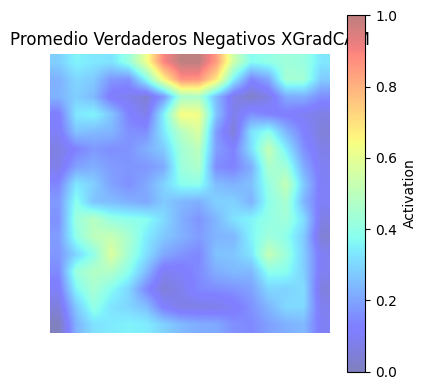

In [ ]:
draw_heatmap(results, "Promedio Verdaderos Negativos XGradCAM")

##### Falsos Positivos

In [ ]:
fp_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="FP")
len(fp_images)

187

In [ ]:
results = average_heatmaps(XGradCAM, fp_images)

Procesando para promedio: 922_test_0_.png


Procesando para promedio: 918_test_0_.png


Procesando para promedio: 91_test_0_.png


Procesando para promedio: 932_test_0_.png


Procesando para promedio: 940_test_0_.png


Procesando para promedio: 955_test_0_.png


Procesando para promedio: 966_test_0_.png


Procesando para promedio: 976_test_0_.png


Procesando para promedio: 991_test_0_.png


Procesando para promedio: 989_test_0_.png


Procesando para promedio: 841_test_0_.png


Procesando para promedio: 853_test_0_.png


Procesando para promedio: 83_test_0_.png


Procesando para promedio: 84_test_0_.png


Procesando para promedio: 848_test_0_.png


Procesando para promedio: 863_test_0_.png


Procesando para promedio: 860_test_0_.png


Procesando para promedio: 870_test_0_.png


Procesando para promedio: 887_test_0_.png


Procesando para promedio: 88_test_0_.png


Procesando para promedio: 900_test_0_.png


Procesando para promedio: 897_test_0_.png


Procesando para promedio: 747_test_0_.png


Procesando para promedio: 748_test_0_.png


Procesando para promedio: 765_test_0_.png


Procesando para promedio: 767_test_0_.png


Procesando para promedio: 78_test_0_.png


Procesando para promedio: 795_test_0_.png


Procesando para promedio: 786_test_0_.png


Procesando para promedio: 808_test_0_.png


Procesando para promedio: 79_test_0_.png


Procesando para promedio: 801_test_0_.png


Procesando para promedio: 810_test_0_.png


Procesando para promedio: 817_test_0_.png


Procesando para promedio: 815_test_0_.png


Procesando para promedio: 82_test_0_.png


Procesando para promedio: 685_test_0_.png


Procesando para promedio: 68_test_0_.png


Procesando para promedio: 690_test_0_.png


Procesando para promedio: 676_test_0_.png


Procesando para promedio: 696_test_0_.png


Procesando para promedio: 702_test_0_.png


Procesando para promedio: 706_test_0_.png


Procesando para promedio: 700_test_0_.png


Procesando para promedio: 712_test_0_.png


Procesando para promedio: 724_test_0_.png


Procesando para promedio: 600_test_0_.png


Procesando para promedio: 617_test_0_.png


Procesando para promedio: 610_test_0_.png


Procesando para promedio: 616_test_0_.png


Procesando para promedio: 628_test_0_.png


Procesando para promedio: 659_test_0_.png


Procesando para promedio: 684_test_0_.png


Procesando para promedio: 49_test_0_.png


Procesando para promedio: 521_test_0_.png


Procesando para promedio: 522_test_0_.png


Procesando para promedio: 528_test_0_.png


Procesando para promedio: 517_test_0_.png


Procesando para promedio: 52_test_0_.png


Procesando para promedio: 513_test_0_.png


Procesando para promedio: 530_test_0_.png


Procesando para promedio: 529_test_0_.png


Procesando para promedio: 516_test_0_.png


Procesando para promedio: 549_test_0_.png


Procesando para promedio: 555_test_0_.png


Procesando para promedio: 556_test_0_.png


Procesando para promedio: 537_test_0_.png


Procesando para promedio: 568_test_0_.png


Procesando para promedio: 59_test_0_.png


Procesando para promedio: 591_test_0_.png


Procesando para promedio: 594_test_0_.png


Procesando para promedio: 586_test_0_.png


Procesando para promedio: 434_test_0_.png


Procesando para promedio: 433_test_0_.png


Procesando para promedio: 440_test_0_.png


Procesando para promedio: 44_test_0_.png


Procesando para promedio: 490_test_0_.png


Procesando para promedio: 472_test_0_.png


Procesando para promedio: 470_test_0_.png


Procesando para promedio: 477_test_0_.png


Procesando para promedio: 496_test_0_.png


Procesando para promedio: 50_test_0_.png


Procesando para promedio: 348_test_0_.png


Procesando para promedio: 349_test_0_.png


Procesando para promedio: 344_test_0_.png


Procesando para promedio: 347_test_0_.png


Procesando para promedio: 358_test_0_.png


Procesando para promedio: 371_test_0_.png


Procesando para promedio: 394_test_0_.png


Procesando para promedio: 399_test_0_.png


Procesando para promedio: 397_test_0_.png


Procesando para promedio: 408_test_0_.png


Procesando para promedio: 388_test_0_.png


Procesando para promedio: 3_test_0_.png


Procesando para promedio: 395_test_0_.png


Procesando para promedio: 419_test_0_.png


Procesando para promedio: 420_test_0_.png


Procesando para promedio: 29_test_0_.png


Procesando para promedio: 295_test_0_.png


Procesando para promedio: 303_test_0_.png


Procesando para promedio: 307_test_0_.png


Procesando para promedio: 308_test_0_.png


Procesando para promedio: 317_test_0_.png


Procesando para promedio: 302_test_0_.png


Procesando para promedio: 299_test_0_.png


Procesando para promedio: 294_test_0_.png


Procesando para promedio: 339_test_0_.png


Procesando para promedio: 335_test_0_.png


Procesando para promedio: 333_test_0_.png


Procesando para promedio: 343_test_0_.png


Procesando para promedio: 342_test_0_.png


Procesando para promedio: 332_test_0_.png


Procesando para promedio: 31_test_0_.png


Procesando para promedio: 328_test_0_.png


Procesando para promedio: 330_test_0_.png


Procesando para promedio: 192_test_0_.png


Procesando para promedio: 185_test_0_.png


Procesando para promedio: 208_test_0_.png


Procesando para promedio: 210_test_0_.png


Procesando para promedio: 215_test_0_.png


Procesando para promedio: 222_test_0_.png


Procesando para promedio: 240_test_0_.png


Procesando para promedio: 236_test_0_.png


Procesando para promedio: 260_test_0_.png


Procesando para promedio: 247_test_0_.png


Procesando para promedio: 24_test_0_.png


Procesando para promedio: 254_test_0_.png


Procesando para promedio: 252_test_0_.png


Procesando para promedio: 1180_test_0_.png


Procesando para promedio: 1172_test_0_.png


Procesando para promedio: 1281_test_0_.png


Procesando para promedio: 1313_test_0_.png


Procesando para promedio: 1261_test_0_.png


Procesando para promedio: 1242_test_0_.png


Procesando para promedio: 1190_test_0_.png


Procesando para promedio: 1243_test_0_.png


Procesando para promedio: 1182_test_0_.png


Procesando para promedio: 1279_test_0_.png


Procesando para promedio: 122_test_0_.png


Procesando para promedio: 121_test_0_.png


Procesando para promedio: 1258_test_0_.png


Procesando para promedio: 124_test_0_.png


Procesando para promedio: 1214_test_0_.png


Procesando para promedio: 1189_test_0_.png


Procesando para promedio: 1236_test_0_.png


Procesando para promedio: 1237_test_0_.png


Procesando para promedio: 1265_test_0_.png


Procesando para promedio: 1210_test_0_.png


Procesando para promedio: 1331_test_0_.png


Procesando para promedio: 1347_test_0_.png


Procesando para promedio: 133_test_0_.png


Procesando para promedio: 1334_test_0_.png


Procesando para promedio: 139_test_0_.png


Procesando para promedio: 1364_test_0_.png


Procesando para promedio: 137_test_0_.png


Procesando para promedio: 1366_test_0_.png


Procesando para promedio: 142_test_0_.png


Procesando para promedio: 1350_test_0_.png


Procesando para promedio: 1370_test_0_.png


Procesando para promedio: 149_test_0_.png


Procesando para promedio: 1333_test_0_.png


Procesando para promedio: 161_test_0_.png


Procesando para promedio: 177_test_0_.png


Procesando para promedio: 169_test_0_.png


Procesando para promedio: 170_test_0_.png


Procesando para promedio: 1015_test_0_.png


Procesando para promedio: 1005_test_0_.png


Procesando para promedio: 1049_test_0_.png


Procesando para promedio: 1039_test_0_.png


Procesando para promedio: 1046_test_0_.png


Procesando para promedio: 1176_test_0_.png


Procesando para promedio: 1161_test_0_.png


Procesando para promedio: 1177_test_0_.png


Procesando para promedio: 1118_test_0_.png


Procesando para promedio: 1095_test_0_.png


Procesando para promedio: 1101_test_0_.png


Procesando para promedio: 1165_test_0_.png


Procesando para promedio: 1076_test_0_.png


Procesando para promedio: 1140_test_0_.png


Procesando para promedio: 1089_test_0_.png


Procesando para promedio: 1143_test_0_.png


Procesando para promedio: 1166_test_0_.png


Procesando para promedio: 1114_test_0_.png


Procesando para promedio: 1082_test_0_.png


Procesando para promedio: 1144_test_0_.png


Procesando para promedio: 1108_test_0_.png


Procesando para promedio: 1011_test_0_.png


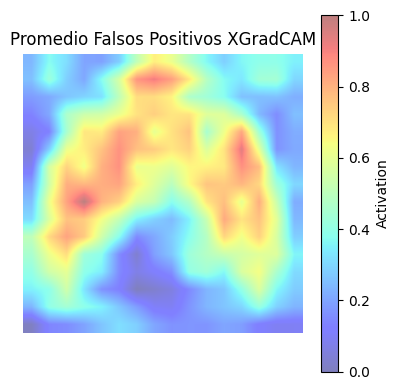

In [ ]:
draw_heatmap(results, "Promedio Falsos Positivos XGradCAM")

##### Falsos Negativos

In [ ]:
fn_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="FN")
len(fn_images)

56

In [ ]:
results = average_heatmaps(XGradCAM, fn_images)

Procesando para promedio: 957_test_1_.png


Procesando para promedio: 977_test_1_.png


Procesando para promedio: 990_test_1_.png


Procesando para promedio: 883_test_1_.png


Procesando para promedio: 893_test_1_.png


Procesando para promedio: 891_test_1_.png


Procesando para promedio: 896_test_1_.png


Procesando para promedio: 758_test_1_.png


Procesando para promedio: 759_test_1_.png


Procesando para promedio: 77_test_1_.png


Procesando para promedio: 791_test_1_.png


Procesando para promedio: 780_test_1_.png


Procesando para promedio: 813_test_1_.png


Procesando para promedio: 671_test_1_.png


Procesando para promedio: 670_test_1_.png


Procesando para promedio: 707_test_1_.png


Procesando para promedio: 703_test_1_.png


Procesando para promedio: 726_test_1_.png


Procesando para promedio: 74_test_1_.png


Procesando para promedio: 595_test_1_.png


Procesando para promedio: 640_test_1_.png


Procesando para promedio: 526_test_1_.png


Procesando para promedio: 598_test_1_.png


Procesando para promedio: 445_test_1_.png


Procesando para promedio: 506_test_1_.png


Procesando para promedio: 372_test_1_.png


Procesando para promedio: 376_test_1_.png


Procesando para promedio: 316_test_1_.png


Procesando para promedio: 325_test_1_.png


Procesando para promedio: 341_test_1_.png


Procesando para promedio: 181_test_1_.png


Procesando para promedio: 219_test_1_.png


Procesando para promedio: 242_test_1_.png


Procesando para promedio: 1299_test_1_.png


Procesando para promedio: 1278_test_1_.png


Procesando para promedio: 1290_test_1_.png


Procesando para promedio: 1221_test_1_.png


Procesando para promedio: 1250_test_1_.png


Procesando para promedio: 1247_test_1_.png


Procesando para promedio: 1293_test_1_.png


Procesando para promedio: 129_test_1_.png


Procesando para promedio: 1240_test_1_.png


Procesando para promedio: 1192_test_1_.png


Procesando para promedio: 1207_test_1_.png


Procesando para promedio: 1220_test_1_.png


Procesando para promedio: 1317_test_1_.png


Procesando para promedio: 1335_test_1_.png


Procesando para promedio: 1354_test_1_.png


Procesando para promedio: 174_test_1_.png


Procesando para promedio: 1029_test_1_.png


Procesando para promedio: 1027_test_1_.png


Procesando para promedio: 1109_test_1_.png


Procesando para promedio: 1092_test_1_.png


Procesando para promedio: 1115_test_1_.png


Procesando para promedio: 1122_test_1_.png


Procesando para promedio: 1010_test_1_.png


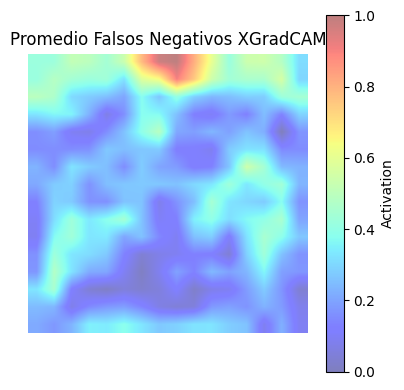

In [ ]:
draw_heatmap(results, "Promedio Falsos Negativos XGradCAM")

#### Calculamos el promedio de FullGrad

##### Verdaderos Positivos

In [ ]:
vp_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="VP")
len(vp_images)

234

In [ ]:
random.seed(42)
vp_images = random.sample(vp_images, 120)

In [ ]:
results = average_heatmaps(FullGrad, vp_images)

Procesando para promedio: 1294_test_1_.png


Procesando para promedio: 894_test_1_.png


Procesando para promedio: 941_test_1_.png


Procesando para promedio: 1349_test_1_.png


Procesando para promedio: 654_test_1_.png


Procesando para promedio: 745_test_1_.png


Procesando para promedio: 710_test_1_.png


Procesando para promedio: 756_test_1_.png


Procesando para promedio: 1329_test_1_.png


Procesando para promedio: 86_test_1_.png


Procesando para promedio: 1226_test_1_.png


Procesando para promedio: 1069_test_1_.png


Procesando para promedio: 340_test_1_.png


Procesando para promedio: 858_test_1_.png


Procesando para promedio: 250_test_1_.png


Procesando para promedio: 485_test_1_.png


Procesando para promedio: 942_test_1_.png


Procesando para promedio: 94_test_1_.png


Procesando para promedio: 866_test_1_.png


Procesando para promedio: 713_test_1_.png


Procesando para promedio: 722_test_1_.png


Procesando para promedio: 290_test_1_.png


Procesando para promedio: 1083_test_1_.png


Procesando para promedio: 1090_test_1_.png


Procesando para promedio: 19_test_1_.png


Procesando para promedio: 705_test_1_.png


Procesando para promedio: 152_test_1_.png


Procesando para promedio: 1212_test_1_.png


Procesando para promedio: 1348_test_1_.png


Procesando para promedio: 1141_test_1_.png


Procesando para promedio: 476_test_1_.png


Procesando para promedio: 718_test_1_.png


Procesando para promedio: 37_test_1_.png


Procesando para promedio: 223_test_1_.png


Procesando para promedio: 653_test_1_.png


Procesando para promedio: 924_test_1_.png


Procesando para promedio: 160_test_1_.png


Procesando para promedio: 783_test_1_.png


Procesando para promedio: 145_test_1_.png


Procesando para promedio: 1151_test_1_.png


Procesando para promedio: 552_test_1_.png


Procesando para promedio: 1014_test_1_.png


Procesando para promedio: 784_test_1_.png


Procesando para promedio: 1084_test_1_.png


Procesando para promedio: 543_test_1_.png


Procesando para promedio: 1086_test_1_.png


Procesando para promedio: 1120_test_1_.png


Procesando para promedio: 441_test_1_.png


Procesando para promedio: 878_test_1_.png


Procesando para promedio: 570_test_1_.png


Procesando para promedio: 550_test_1_.png


Procesando para promedio: 1053_test_1_.png


Procesando para promedio: 605_test_1_.png


Procesando para promedio: 958_test_1_.png


Procesando para promedio: 356_test_1_.png


Procesando para promedio: 315_test_1_.png


Procesando para promedio: 89_test_1_.png


Procesando para promedio: 424_test_1_.png


Procesando para promedio: 852_test_1_.png


Procesando para promedio: 324_test_1_.png


Procesando para promedio: 641_test_1_.png


Procesando para promedio: 1225_test_1_.png


Procesando para promedio: 1291_test_1_.png


Procesando para promedio: 557_test_1_.png


Procesando para promedio: 218_test_1_.png


Procesando para promedio: 823_test_1_.png


Procesando para promedio: 986_test_1_.png


Procesando para promedio: 1359_test_1_.png


Procesando para promedio: 732_test_1_.png


Procesando para promedio: 645_test_1_.png


Procesando para promedio: 1312_test_1_.png


Procesando para promedio: 115_test_1_.png


Procesando para promedio: 877_test_1_.png


Procesando para promedio: 1332_test_1_.png


Procesando para promedio: 1325_test_1_.png


Procesando para promedio: 378_test_1_.png


Procesando para promedio: 558_test_1_.png


Procesando para promedio: 785_test_1_.png


Procesando para promedio: 585_test_1_.png


Procesando para promedio: 572_test_1_.png


Procesando para promedio: 693_test_1_.png


Procesando para promedio: 631_test_1_.png


Procesando para promedio: 99_test_1_.png


Procesando para promedio: 814_test_1_.png


Procesando para promedio: 301_test_1_.png


Procesando para promedio: 1145_test_1_.png


Procesando para promedio: 1307_test_1_.png


Procesando para promedio: 366_test_1_.png


Procesando para promedio: 1315_test_1_.png


Procesando para promedio: 64_test_1_.png


Procesando para promedio: 322_test_1_.png


Procesando para promedio: 101_test_1_.png


Procesando para promedio: 520_test_1_.png


Procesando para promedio: 985_test_1_.png


Procesando para promedio: 1298_test_1_.png


Procesando para promedio: 1178_test_1_.png


Procesando para promedio: 687_test_1_.png


Procesando para promedio: 449_test_1_.png


Procesando para promedio: 25_test_1_.png


Procesando para promedio: 982_test_1_.png


Procesando para promedio: 717_test_1_.png


Procesando para promedio: 153_test_1_.png


Procesando para promedio: 264_test_1_.png


Procesando para promedio: 426_test_1_.png


Procesando para promedio: 452_test_1_.png


Procesando para promedio: 1040_test_1_.png


Procesando para promedio: 763_test_1_.png


Procesando para promedio: 90_test_1_.png


Procesando para promedio: 1205_test_1_.png


Procesando para promedio: 146_test_1_.png


Procesando para promedio: 418_test_1_.png


Procesando para promedio: 1254_test_1_.png


Procesando para promedio: 291_test_1_.png


Procesando para promedio: 432_test_1_.png


Procesando para promedio: 392_test_1_.png


Procesando para promedio: 1194_test_1_.png


Procesando para promedio: 288_test_1_.png


Procesando para promedio: 1031_test_1_.png


Procesando para promedio: 204_test_1_.png


Procesando para promedio: 6_test_1_.png


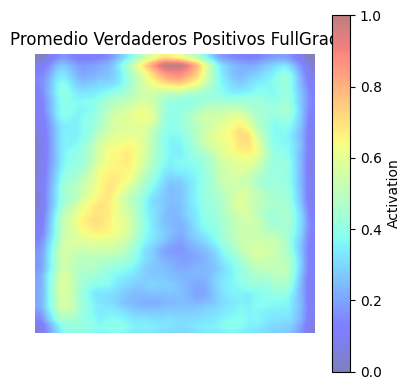

In [ ]:
draw_heatmap(results, "Promedio Verdaderos Positivos FullGrad")

##### Verdaderos Negativos

In [ ]:
vn_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="VN")
len(vn_images)

895

In [ ]:
random.seed(42)
vn_images = random.sample(vn_images, 200)

In [ ]:
results = average_heatmaps(FullGrad, vn_images)

Procesando para promedio: 1227_test_0_.png


Procesando para promedio: 916_test_0_.png


Procesando para promedio: 953_test_0_.png


Procesando para promedio: 155_test_0_.png


Procesando para promedio: 644_test_0_.png


Procesando para promedio: 620_test_0_.png


Procesando para promedio: 734_test_0_.png


Procesando para promedio: 787_test_0_.png


Procesando para promedio: 173_test_0_.png


Procesando para promedio: 902_test_0_.png


Procesando para promedio: 1204_test_0_.png


Procesando para promedio: 162_test_0_.png


Procesando para promedio: 203_test_0_.png


Procesando para promedio: 869_test_0_.png


Procesando para promedio: 1273_test_0_.png


Procesando para promedio: 370_test_0_.png


Procesando para promedio: 965_test_0_.png


Procesando para promedio: 959_test_0_.png


Procesando para promedio: 892_test_0_.png


Procesando para promedio: 743_test_0_.png


Procesando para promedio: 574_test_0_.png


Procesando para promedio: 320_test_0_.png


Procesando para promedio: 130_test_0_.png


Procesando para promedio: 95_test_0_.png


Procesando para promedio: 224_test_0_.png


Procesando para promedio: 714_test_0_.png


Procesando para promedio: 1324_test_0_.png


Procesando para promedio: 1228_test_0_.png


Procesando para promedio: 141_test_0_.png


Procesando para promedio: 1113_test_0_.png


Procesando para promedio: 369_test_0_.png


Procesando para promedio: 739_test_0_.png


Procesando para promedio: 38_test_0_.png


Procesando para promedio: 1128_test_0_.png


Procesando para promedio: 655_test_0_.png


Procesando para promedio: 1100_test_0_.png


Procesando para promedio: 937_test_0_.png


Procesando para promedio: 1013_test_0_.png


Procesando para promedio: 114_test_0_.png


Procesando para promedio: 811_test_0_.png


Procesando para promedio: 1316_test_0_.png


Procesando para promedio: 1067_test_0_.png


Procesando para promedio: 601_test_0_.png


Procesando para promedio: 1121_test_0_.png


Procesando para promedio: 820_test_0_.png


Procesando para promedio: 744_test_0_.png


Procesando para promedio: 1020_test_0_.png


Procesando para promedio: 602_test_0_.png


Procesando para promedio: 1091_test_0_.png


Procesando para promedio: 888_test_0_.png


Procesando para promedio: 458_test_0_.png


Procesando para promedio: 884_test_0_.png


Procesando para promedio: 438_test_0_.png


Procesando para promedio: 592_test_0_.png


Procesando para promedio: 1295_test_0_.png


Procesando para promedio: 609_test_0_.png


Procesando para promedio: 1171_test_0_.png


Procesando para promedio: 973_test_0_.png


Procesando para promedio: 1358_test_0_.png


Procesando para promedio: 390_test_0_.png


Procesando para promedio: 216_test_0_.png


Procesando para promedio: 770_test_0_.png


Procesando para promedio: 461_test_0_.png


Procesando para promedio: 862_test_0_.png


Procesando para promedio: 227_test_0_.png


Procesando para promedio: 511_test_0_.png


Procesando para promedio: 1232_test_0_.png


Procesando para promedio: 127_test_0_.png


Procesando para promedio: 428_test_0_.png


Procesando para promedio: 261_test_0_.png


Procesando para promedio: 692_test_0_.png


Procesando para promedio: 1355_test_0_.png


Procesando para promedio: 835_test_0_.png


Procesando para promedio: 970_test_0_.png


Procesando para promedio: 125_test_0_.png


Procesando para promedio: 761_test_0_.png


Procesando para promedio: 1023_test_0_.png


Procesando para promedio: 507_test_0_.png


Procesando para promedio: 864_test_0_.png


Procesando para promedio: 1072_test_0_.png


Procesando para promedio: 905_test_0_.png


Procesando para promedio: 1117_test_0_.png


Procesando para promedio: 1125_test_0_.png


Procesando para promedio: 405_test_0_.png


Procesando para promedio: 1269_test_0_.png


Procesando para promedio: 459_test_0_.png


Procesando para promedio: 825_test_0_.png


Procesando para promedio: 450_test_0_.png


Procesando para promedio: 443_test_0_.png


Procesando para promedio: 731_test_0_.png


Procesando para promedio: 1234_test_0_.png


Procesando para promedio: 629_test_0_.png


Procesando para promedio: 1158_test_0_.png


Procesando para promedio: 1288_test_0_.png


Procesando para promedio: 1280_test_0_.png


Procesando para promedio: 85_test_0_.png


Procesando para promedio: 1233_test_0_.png


Procesando para promedio: 1052_test_0_.png


Procesando para promedio: 838_test_0_.png


Procesando para promedio: 199_test_0_.png


Procesando para promedio: 1345_test_0_.png


Procesando para promedio: 1153_test_0_.png


Procesando para promedio: 828_test_0_.png


Procesando para promedio: 421_test_0_.png


Procesando para promedio: 462_test_0_.png


Procesando para promedio: 646_test_0_.png


Procesando para promedio: 1223_test_0_.png


Procesando para promedio: 144_test_0_.png


Procesando para promedio: 239_test_0_.png


Procesando para promedio: 746_test_0_.png


Procesando para promedio: 1300_test_0_.png


Procesando para promedio: 573_test_0_.png


Procesando para promedio: 995_test_0_.png


Procesando para promedio: 75_test_0_.png


Procesando para promedio: 1078_test_0_.png


Procesando para promedio: 547_test_0_.png


Procesando para promedio: 499_test_0_.png


Procesando para promedio: 649_test_0_.png


Procesando para promedio: 847_test_0_.png


Procesando para promedio: 733_test_0_.png


Procesando para promedio: 245_test_0_.png


Procesando para promedio: 1322_test_0_.png


Procesando para promedio: 546_test_0_.png


Procesando para promedio: 729_test_0_.png


Procesando para promedio: 1271_test_0_.png


Procesando para promedio: 304_test_0_.png


Procesando para promedio: 487_test_0_.png


Procesando para promedio: 1184_test_0_.png


Procesando para promedio: 39_test_0_.png


Procesando para promedio: 803_test_0_.png


Procesando para promedio: 607_test_0_.png


Procesando para promedio: 1124_test_0_.png


Procesando para promedio: 61_test_0_.png


Procesando para promedio: 1066_test_0_.png


Procesando para promedio: 207_test_0_.png


Procesando para promedio: 632_test_0_.png


Procesando para promedio: 1174_test_0_.png


Procesando para promedio: 359_test_0_.png


Procesando para promedio: 1139_test_0_.png


Procesando para promedio: 494_test_0_.png


Procesando para promedio: 1173_test_0_.png


Procesando para promedio: 1024_test_0_.png


Procesando para promedio: 781_test_0_.png


Procesando para promedio: 33_test_0_.png


Procesando para promedio: 298_test_0_.png


Procesando para promedio: 873_test_0_.png


Procesando para promedio: 987_test_0_.png


Procesando para promedio: 921_test_0_.png


Procesando para promedio: 798_test_0_.png


Procesando para promedio: 1253_test_0_.png


Procesando para promedio: 1138_test_0_.png


Procesando para promedio: 1239_test_0_.png


Procesando para promedio: 10_test_0_.png


Procesando para promedio: 1284_test_0_.png


Procesando para promedio: 845_test_0_.png


Procesando para promedio: 478_test_0_.png


Procesando para promedio: 45_test_0_.png


Procesando para promedio: 1357_test_0_.png


Procesando para promedio: 289_test_0_.png


Procesando para promedio: 195_test_0_.png


Procesando para promedio: 619_test_0_.png


Procesando para promedio: 228_test_0_.png


Procesando para promedio: 927_test_0_.png


Procesando para promedio: 131_test_0_.png


Procesando para promedio: 923_test_0_.png


Procesando para promedio: 1301_test_0_.png


Procesando para promedio: 1127_test_0_.png


Procesando para promedio: 1047_test_0_.png


Procesando para promedio: 119_test_0_.png


Procesando para promedio: 1075_test_0_.png


Procesando para promedio: 1016_test_0_.png


Procesando para promedio: 1142_test_0_.png


Procesando para promedio: 384_test_0_.png


Procesando para promedio: 819_test_0_.png


Procesando para promedio: 1043_test_0_.png


Procesando para promedio: 929_test_0_.png


Procesando para promedio: 1104_test_0_.png


Procesando para promedio: 2_test_0_.png


Procesando para promedio: 669_test_0_.png


Procesando para promedio: 321_test_0_.png


Procesando para promedio: 898_test_0_.png


Procesando para promedio: 1208_test_0_.png


Procesando para promedio: 533_test_0_.png


Procesando para promedio: 1002_test_0_.png


Procesando para promedio: 1367_test_0_.png


Procesando para promedio: 1037_test_0_.png


Procesando para promedio: 1123_test_0_.png


Procesando para promedio: 102_test_0_.png


Procesando para promedio: 447_test_0_.png


Procesando para promedio: 830_test_0_.png


Procesando para promedio: 220_test_0_.png


Procesando para promedio: 194_test_0_.png


Procesando para promedio: 915_test_0_.png


Procesando para promedio: 1275_test_0_.png


Procesando para promedio: 563_test_0_.png


Procesando para promedio: 293_test_0_.png


Procesando para promedio: 93_test_0_.png


Procesando para promedio: 14_test_0_.png


Procesando para promedio: 457_test_0_.png


Procesando para promedio: 544_test_0_.png


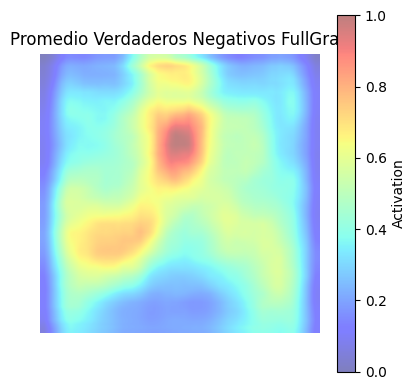

In [ ]:
draw_heatmap(results, "Promedio Verdaderos Negativos FullGrad")

##### Falsos Positivos

In [ ]:
fp_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="FP")
len(fp_images)

187

In [ ]:
random.seed(42)
fp_images = random.sample(fp_images, 75)

In [ ]:
results = average_heatmaps(FullGrad, fp_images)

Procesando para promedio: 169_test_0_.png


Procesando para promedio: 786_test_0_.png


Procesando para promedio: 966_test_0_.png


Procesando para promedio: 594_test_0_.png


Procesando para promedio: 516_test_0_.png


Procesando para promedio: 517_test_0_.png


Procesando para promedio: 82_test_0_.png


Procesando para promedio: 78_test_0_.png


Procesando para promedio: 1118_test_0_.png


Procesando para promedio: 121_test_0_.png


Procesando para promedio: 747_test_0_.png


Procesando para promedio: 1334_test_0_.png


Procesando para promedio: 333_test_0_.png


Procesando para promedio: 991_test_0_.png


Procesando para promedio: 976_test_0_.png


Procesando para promedio: 748_test_0_.png


Procesando para promedio: 522_test_0_.png


Procesando para promedio: 513_test_0_.png


Procesando para promedio: 1172_test_0_.png


Procesando para promedio: 137_test_0_.png


Procesando para promedio: 1144_test_0_.png


Procesando para promedio: 1189_test_0_.png


Procesando para promedio: 628_test_0_.png


Procesando para promedio: 1076_test_0_.png


Procesando para promedio: 335_test_0_.png


Procesando para promedio: 528_test_0_.png


Procesando para promedio: 330_test_0_.png


Procesando para promedio: 133_test_0_.png


Procesando para promedio: 586_test_0_.png


Procesando para promedio: 918_test_0_.png


Procesando para promedio: 696_test_0_.png


Procesando para promedio: 1095_test_0_.png


Procesando para promedio: 371_test_0_.png


Procesando para promedio: 1370_test_0_.png


Procesando para promedio: 676_test_0_.png


Procesando para promedio: 1176_test_0_.png


Procesando para promedio: 358_test_0_.png


Procesando para promedio: 1089_test_0_.png


Procesando para promedio: 1161_test_0_.png


Procesando para promedio: 29_test_0_.png


Procesando para promedio: 765_test_0_.png


Procesando para promedio: 408_test_0_.png


Procesando para promedio: 394_test_0_.png


Procesando para promedio: 568_test_0_.png


Procesando para promedio: 853_test_0_.png


Procesando para promedio: 208_test_0_.png


Procesando para promedio: 1279_test_0_.png


Procesando para promedio: 801_test_0_.png


Procesando para promedio: 420_test_0_.png


Procesando para promedio: 900_test_0_.png


Procesando para promedio: 44_test_0_.png


Procesando para promedio: 388_test_0_.png


Procesando para promedio: 616_test_0_.png


Procesando para promedio: 870_test_0_.png


Procesando para promedio: 1214_test_0_.png


Procesando para promedio: 52_test_0_.png


Procesando para promedio: 440_test_0_.png


Procesando para promedio: 1258_test_0_.png


Procesando para promedio: 1046_test_0_.png


Procesando para promedio: 767_test_0_.png


Procesando para promedio: 610_test_0_.png


Procesando para promedio: 1143_test_0_.png


Procesando para promedio: 1313_test_0_.png


Procesando para promedio: 50_test_0_.png


Procesando para promedio: 339_test_0_.png


Procesando para promedio: 600_test_0_.png


Procesando para promedio: 1039_test_0_.png


Procesando para promedio: 617_test_0_.png


Procesando para promedio: 724_test_0_.png


Procesando para promedio: 1347_test_0_.png


Procesando para promedio: 347_test_0_.png


Procesando para promedio: 815_test_0_.png


Procesando para promedio: 399_test_0_.png


Procesando para promedio: 1049_test_0_.png


Procesando para promedio: 348_test_0_.png


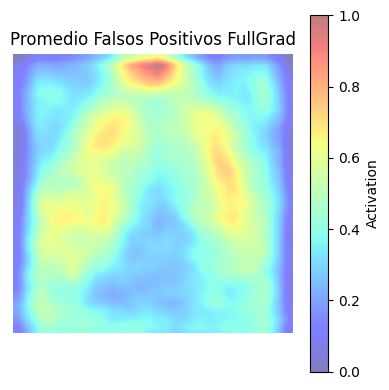

In [ ]:
draw_heatmap(results, "Promedio Falsos Positivos FullGrad")

##### Falsos Negativos

In [ ]:
fn_images = get_images_from_category("clasificacion_resultados.csv", img_dir, category="FN")
len(fn_images)

56

In [ ]:
results = average_heatmaps(FullGrad, fn_images)

Procesando para promedio: 957_test_1_.png


Procesando para promedio: 977_test_1_.png


Procesando para promedio: 990_test_1_.png


Procesando para promedio: 883_test_1_.png


Procesando para promedio: 893_test_1_.png


Procesando para promedio: 891_test_1_.png


Procesando para promedio: 896_test_1_.png


Procesando para promedio: 758_test_1_.png


Procesando para promedio: 759_test_1_.png


Procesando para promedio: 77_test_1_.png


Procesando para promedio: 791_test_1_.png


Procesando para promedio: 780_test_1_.png


Procesando para promedio: 813_test_1_.png


Procesando para promedio: 671_test_1_.png


Procesando para promedio: 670_test_1_.png


Procesando para promedio: 707_test_1_.png


Procesando para promedio: 703_test_1_.png


Procesando para promedio: 726_test_1_.png


Procesando para promedio: 74_test_1_.png


Procesando para promedio: 595_test_1_.png


Procesando para promedio: 640_test_1_.png


Procesando para promedio: 526_test_1_.png


Procesando para promedio: 598_test_1_.png


Procesando para promedio: 445_test_1_.png


Procesando para promedio: 506_test_1_.png


Procesando para promedio: 372_test_1_.png


Procesando para promedio: 376_test_1_.png


Procesando para promedio: 316_test_1_.png


Procesando para promedio: 325_test_1_.png


Procesando para promedio: 341_test_1_.png


Procesando para promedio: 181_test_1_.png


Procesando para promedio: 219_test_1_.png


Procesando para promedio: 242_test_1_.png


Procesando para promedio: 1299_test_1_.png


Procesando para promedio: 1278_test_1_.png


Procesando para promedio: 1290_test_1_.png


Procesando para promedio: 1221_test_1_.png


Procesando para promedio: 1250_test_1_.png


Procesando para promedio: 1247_test_1_.png


Procesando para promedio: 1293_test_1_.png


Procesando para promedio: 129_test_1_.png


Procesando para promedio: 1240_test_1_.png


Procesando para promedio: 1192_test_1_.png


Procesando para promedio: 1207_test_1_.png


Procesando para promedio: 1220_test_1_.png


Procesando para promedio: 1317_test_1_.png


Procesando para promedio: 1335_test_1_.png


Procesando para promedio: 1354_test_1_.png


Procesando para promedio: 174_test_1_.png


Procesando para promedio: 1029_test_1_.png


Procesando para promedio: 1027_test_1_.png


Procesando para promedio: 1109_test_1_.png


Procesando para promedio: 1092_test_1_.png


Procesando para promedio: 1115_test_1_.png


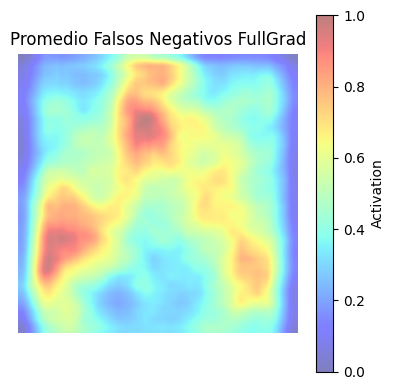

In [ ]:
draw_heatmap(results, "Promedio Falsos Negativos FullGrad")